<h1 align="center"> Training the Delta rule Perceptron with the Iris dataset </h1>
<h2 align="center"> Logistic Regression </h2>


In [23]:
import numpy as np
import pandas as pd
#df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data', header=None)
print(df.head())
print(df.tail())

# setosa and versicolor
y = df.iloc[0:100, 4].values
y = np.where(y == 'Iris-setosa', -1, 1)

# sepal length and petal length
X1 = df.iloc[0:100, [0,2]].values
#X1 = df.iloc[0:100, [0,2]]
#X=X1.T
print(X,y)

     0    1    2    3            4
0  5.1  3.5  1.4  0.2  Iris-setosa
1  4.9  3.0  1.4  0.2  Iris-setosa
2  4.7  3.2  1.3  0.2  Iris-setosa
3  4.6  3.1  1.5  0.2  Iris-setosa
4  5.0  3.6  1.4  0.2  Iris-setosa
       0    1    2    3               4
145  6.7  3.0  5.2  2.3  Iris-virginica
146  6.3  2.5  5.0  1.9  Iris-virginica
147  6.5  3.0  5.2  2.0  Iris-virginica
148  6.2  3.4  5.4  2.3  Iris-virginica
149  5.9  3.0  5.1  1.8  Iris-virginica
[[5.1 1.4]
 [4.9 1.4]
 [4.7 1.3]
 [4.6 1.5]
 [5.  1.4]
 [5.4 1.7]
 [4.6 1.4]
 [5.  1.5]
 [4.4 1.4]
 [4.9 1.5]
 [5.4 1.5]
 [4.8 1.6]
 [4.8 1.4]
 [4.3 1.1]
 [5.8 1.2]
 [5.7 1.5]
 [5.4 1.3]
 [5.1 1.4]
 [5.7 1.7]
 [5.1 1.5]
 [5.4 1.7]
 [5.1 1.5]
 [4.6 1. ]
 [5.1 1.7]
 [4.8 1.9]
 [5.  1.6]
 [5.  1.6]
 [5.2 1.5]
 [5.2 1.4]
 [4.7 1.6]
 [4.8 1.6]
 [5.4 1.5]
 [5.2 1.5]
 [5.5 1.4]
 [4.9 1.5]
 [5.  1.2]
 [5.5 1.3]
 [4.9 1.5]
 [4.4 1.3]
 [5.1 1.5]
 [5.  1.3]
 [4.5 1.3]
 [4.4 1.3]
 [5.  1.6]
 [5.1 1.9]
 [4.8 1.4]
 [5.1 1.6]
 [4.6 1.4]
 [5.3 1.5]
 [5.  1.4]


In [30]:
X=X1.T
print(X,type(X))


[[5.1 4.9 4.7 4.6 5.  5.4 4.6 5.  4.4 4.9 5.4 4.8 4.8 4.3 5.8 5.7 5.4 5.1
  5.7 5.1 5.4 5.1 4.6 5.1 4.8 5.  5.  5.2 5.2 4.7 4.8 5.4 5.2 5.5 4.9 5.
  5.5 4.9 4.4 5.1 5.  4.5 4.4 5.  5.1 4.8 5.1 4.6 5.3 5.  7.  6.4 6.9 5.5
  6.5 5.7 6.3 4.9 6.6 5.2 5.  5.9 6.  6.1 5.6 6.7 5.6 5.8 6.2 5.6 5.9 6.1
  6.3 6.1 6.4 6.6 6.8 6.7 6.  5.7 5.5 5.5 5.8 6.  5.4 6.  6.7 6.3 5.6 5.5
  5.5 6.1 5.8 5.  5.6 5.7 5.7 6.2 5.1 5.7]
 [1.4 1.4 1.3 1.5 1.4 1.7 1.4 1.5 1.4 1.5 1.5 1.6 1.4 1.1 1.2 1.5 1.3 1.4
  1.7 1.5 1.7 1.5 1.  1.7 1.9 1.6 1.6 1.5 1.4 1.6 1.6 1.5 1.5 1.4 1.5 1.2
  1.3 1.5 1.3 1.5 1.3 1.3 1.3 1.6 1.9 1.4 1.6 1.4 1.5 1.4 4.7 4.5 4.9 4.
  4.6 4.5 4.7 3.3 4.6 3.9 3.5 4.2 4.  4.7 3.6 4.4 4.5 4.1 4.5 3.9 4.8 4.
  4.9 4.7 4.3 4.4 4.8 5.  4.5 3.5 3.8 3.7 3.9 5.1 4.5 4.5 4.7 4.4 4.1 4.
  4.4 4.6 4.  3.3 4.2 4.2 4.2 4.3 3.  4.1]] <class 'numpy.ndarray'>


In [7]:
fil = open("irisData.txt",'w+')
df.to_csv(fil)
fil.close()
print("done")

done


In [31]:
print(X.shape,y.shape)
m=X.shape[1]
ni=X.shape[0]
desiredOutputs = y
print(m,ni,desiredOutputs)

(2, 100) (100,)
100 2 [-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1]


In [32]:
def randomize(num) : 
    """  Generates num random numbers 
        returns a numpy array of random numbers
    """
    import random
    randomList = []
    for i in range(num) :
        randomList.append(random.uniform(-1,1))
    return np.array(randomList)
print(randomize(5))

[-0.98030155  0.34723585  0.47927841 -0.16846376  0.76163818]


In [33]:
def bipolarLogistic(sp) :
    return ((np.exp(sp)-np.exp(-sp)))/((np.exp(sp) + np.exp(-sp)))
print(bipolarLogistic(-5),bipolarLogistic(0),bipolarLogistic(+1),bipolarLogistic(5))


-0.999909204262595 0.0 0.7615941559557649 0.999909204262595


In [34]:
def feedForward (weights,bias):
    net = np.dot(weights.T,X)+bias
    #print("weights ",weights,bias,"nets ",net)
    outputs = bipolarLogistic(net)
    return outputs
wts=randomize(ni)
bia=randomize(1)[0]
#tabulate(wts,bia)
outs = feedForward(wts,bia)
print(wts,bia,outs)

[ 0.82802874 -0.00688431] -0.48038002320626183 [0.99885607 0.99840725 0.9977856  0.99738009 0.99865017 0.99930092
 0.99738369 0.99864832 0.99635825 0.99840506 0.99930284 0.99811548
 0.99812066 0.99572143 0.99964197 0.99957575 0.99930476 0.99885607
 0.99957458 0.99885449 0.99930092 0.99885449 0.99739804 0.99885133
 0.99810769 0.99864645 0.99864645 0.99902923 0.99903057 0.99777644
 0.99811548 0.99930284 0.99902923 0.99941002 0.99840506 0.99865388
 0.99941084 0.99840506 0.99636326 0.99885449 0.99865203 0.99691744
 0.99636326 0.99864645 0.99884817 0.99812066 0.99885291 0.99738369
 0.99917733 0.99865017 0.99994849 0.99986127 0.99993905 0.99938853
 0.99988228 0.99955786 0.99983583 0.99836507 0.99990024 0.99899663
 0.9986106  0.99968381 0.9997328  0.99977138 0.99948467 0.9999157
 0.99947825 0.99962738 0.9998068  0.99948254 0.99968119 0.99977357
 0.99983538 0.99977138 0.99986165 0.99990052 0.99992817 0.999915
 0.99973095 0.9995639  0.99939021 0.99939105 0.99962841 0.99972872
 0.99927345 0.9997

In [45]:
def tabulate (vec,bias) :
    print("weights ",vec," bias ",bias)
    computedOutputs = feedForward(vec,bias)
    for i in range(m) :
        desired = desiredOutputs[i]
        computed = computedOutputs[i]
        print("pattern"+str(i+1),X[0][i],X[1][i],desired,round(computed,6))


In [37]:
ci = X[:,7]

In [39]:
learningRate=0.1
def trainDelta(weights,bias,pn) :
    currentInputs=X[:,pn]
    net = np.dot(weights.T,currentInputs) + bias
    output = bipolarLogistic(net)
    desired = desiredOutputs[pn]
    difference = desired - output
    #print(output,desired,difference)
    gradient = 1-output * output
    correction = learningRate * gradient * difference 
    deltaW = currentInputs * correction
    newWeights = np.copy(weights + deltaW)
    newBias = np.copy(bias + correction)
    #print(weights,bias," changed to ",newWeights,newBias)
    return newWeights,newBias,difference

wts=randomize(ni)
bia=randomize(1)[0]
nw,nb,dif = trainDelta(wts,bia,5)
print(wts,bia,nw,nb,dif)

[ 0.43354864 -0.91301622] -0.7128987567993235 [-0.14413059 -1.09487819] -0.8198763908537735 -1.0759895466305427


In [49]:
def trainEpoch (weights, bias) :
    wts = np.copy(weights)
    bia =np.copy(bias)
    for j in range(m) :
        print(" Training with pattern ",j+1," weights ",weights,bias, end ="   ")
        newWeights,newBias,diff = trainDelta(wts,bia,j)
        tabulate(newWeights,newBias)
        wts = np.copy(newWeights)
        bia = np.copy(newBias)
        print(" modified Weights ",newWeights,newBias,)
    error = np.sum((desiredOutputs - feedForward(wts,bia))**2 ) /m 
    return wts,bia,error

wts=randomize(2)
bia = randomize(1)[0]
tabulate(wts,bia)
nwts,nb, cost= trainEpoch(wts,bia)
print(nwts,nb,cost)



weights  [-0.29575448 -0.83069039]  bias  0.26269887586652274
pattern1 5.1 1.4 -1 -0.983952
pattern2 4.9 1.4 -1 -0.981954
pattern3 4.7 1.3 -1 -0.976088
pattern4 4.6 1.5 -1 -0.981751
pattern5 5.0 1.4 -1 -0.982982
pattern6 5.4 1.7 -1 -0.991804
pattern7 4.6 1.4 -1 -0.978488
pattern8 5.0 1.5 -1 -0.985568
pattern9 4.4 1.4 -1 -0.975819
pattern10 4.9 1.5 -1 -0.984695
pattern11 5.4 1.5 -1 -0.988591
pattern12 4.8 1.6 -1 -0.986238
pattern13 4.8 1.4 -1 -0.980865
pattern14 4.3 1.1 -1 -0.958148
pattern15 5.8 1.2 -1 -0.985202
pattern16 5.7 1.5 -1 -0.990438
pattern17 5.4 1.3 -1 -0.984131
pattern18 5.1 1.4 -1 -0.983952
pattern19 5.7 1.7 -1 -0.993132
pattern20 5.1 1.5 -1 -0.986391
pattern21 5.4 1.7 -1 -0.991804
pattern22 5.1 1.5 -1 -0.986391
pattern23 4.6 1.0 -1 -0.958609
pattern24 5.1 1.7 -1 -0.99022
pattern25 4.8 1.9 -1 -0.991617
pattern26 5.0 1.6 -1 -0.987764
pattern27 5.0 1.6 -1 -0.987764
pattern28 5.2 1.5 -1 -0.987168
pattern29 5.2 1.4 -1 -0.984866
pattern30 4.7 1.6 -1 -0.985405
pattern31 4.8 1.6 

pattern1 5.1 1.4 -1 -0.984204
pattern2 4.9 1.4 -1 -0.982228
pattern3 4.7 1.3 -1 -0.976434
pattern4 4.6 1.5 -1 -0.982014
pattern5 5.0 1.4 -1 -0.983244
pattern6 5.4 1.7 -1 -0.991941
pattern7 4.6 1.4 -1 -0.978796
pattern8 5.0 1.5 -1 -0.985792
pattern9 4.4 1.4 -1 -0.976151
pattern10 4.9 1.5 -1 -0.984929
pattern11 5.4 1.5 -1 -0.988781
pattern12 4.8 1.6 -1 -0.986445
pattern13 4.8 1.4 -1 -0.98115
pattern14 4.3 1.1 -1 -0.958697
pattern15 5.8 1.2 -1 -0.985461
pattern16 5.7 1.5 -1 -0.990605
pattern17 5.4 1.3 -1 -0.984392
pattern18 5.1 1.4 -1 -0.984204
pattern19 5.7 1.7 -1 -0.993253
pattern20 5.1 1.5 -1 -0.986606
pattern21 5.4 1.7 -1 -0.991941
pattern22 5.1 1.5 -1 -0.986606
pattern23 4.6 1.0 -1 -0.959182
pattern24 5.1 1.7 -1 -0.990376
pattern25 4.8 1.9 -1 -0.991745
pattern26 5.0 1.6 -1 -0.987955
pattern27 5.0 1.6 -1 -0.987955
pattern28 5.2 1.5 -1 -0.987374
pattern29 5.2 1.4 -1 -0.985108
pattern30 4.7 1.6 -1 -0.985621
pattern31 4.8 1.6 -1 -0.986445
pattern32 5.4 1.5 -1 -0.988781
pattern33 5.2 1.5 

pattern91 5.5 4.4 1 -0.999916
pattern92 6.1 4.6 1 -0.999958
pattern93 5.8 4.0 1 -0.999863
pattern94 5.0 3.3 1 -0.999295
pattern95 5.6 4.2 1 -0.99989
pattern96 5.7 4.2 1 -0.999896
pattern97 5.7 4.2 1 -0.999896
pattern98 6.2 4.3 1 -0.999935
pattern99 5.1 3.0 1 -0.998906
pattern100 5.7 4.1 1 -0.999877
 modified Weights  [-0.29858769 -0.83153073] 0.26210083552454844
 Training with pattern  10  weights  [-0.29575448 -0.83069039] 0.26269887586652274   weights  [-0.29880174 -0.83159625]  bias  0.2620571536359852
pattern1 5.1 1.4 -1 -0.984498
pattern2 4.9 1.4 -1 -0.982547
pattern3 4.7 1.3 -1 -0.976839
pattern4 4.6 1.5 -1 -0.982321
pattern5 5.0 1.4 -1 -0.983551
pattern6 5.4 1.7 -1 -0.992102
pattern7 4.6 1.4 -1 -0.979155
pattern8 5.0 1.5 -1 -0.986054
pattern9 4.4 1.4 -1 -0.97654
pattern10 4.9 1.5 -1 -0.985201
pattern11 5.4 1.5 -1 -0.989003
pattern12 4.8 1.6 -1 -0.986687
pattern13 4.8 1.4 -1 -0.981482
pattern14 4.3 1.1 -1 -0.959339
pattern15 5.8 1.2 -1 -0.985762
pattern16 5.7 1.5 -1 -0.990799
pat

pattern32 5.4 1.5 -1 -0.989303
pattern33 5.2 1.5 -1 -0.987942
pattern34 5.5 1.4 -1 -0.988111
pattern35 4.9 1.5 -1 -0.985571
pattern36 5.0 1.2 -1 -0.977705
pattern37 5.5 1.3 -1 -0.985973
pattern38 4.9 1.5 -1 -0.985571
pattern39 4.4 1.3 -1 -0.972972
pattern40 5.1 1.5 -1 -0.987198
pattern41 5.0 1.3 -1 -0.981091
pattern42 4.5 1.3 -1 -0.974532
pattern43 4.4 1.3 -1 -0.972972
pattern44 5.0 1.6 -1 -0.98848
pattern45 5.1 1.9 -1 -0.993401
pattern46 4.8 1.4 -1 -0.981933
pattern47 5.1 1.6 -1 -0.98915
pattern48 4.6 1.4 -1 -0.979644
pattern49 5.3 1.5 -1 -0.988642
pattern50 5.0 1.4 -1 -0.983967
pattern51 7.0 4.7 1 -0.99998
pattern52 6.4 4.5 1 -0.99996
pattern53 6.9 4.9 1 -0.999985
pattern54 5.5 4.0 1 -0.999842
pattern55 6.5 4.6 1 -0.999968
pattern56 5.7 4.5 1 -0.999939
pattern57 6.3 4.7 1 -0.99997
pattern58 4.9 3.3 1 -0.999274
pattern59 6.6 4.6 1 -0.99997
pattern60 5.2 3.9 1 -0.999777
pattern61 5.0 3.5 1 -0.99951
pattern62 5.9 4.2 1 -0.999911
pattern63 6.0 4.0 1 -0.999883
pattern64 6.1 4.7 1 -0.99996

pattern46 4.8 1.4 -1 -0.982106
pattern47 5.1 1.6 -1 -0.989261
pattern48 4.6 1.4 -1 -0.979832
pattern49 5.3 1.5 -1 -0.988762
pattern50 5.0 1.4 -1 -0.984127
pattern51 7.0 4.7 1 -0.99998
pattern52 6.4 4.5 1 -0.999961
pattern53 6.9 4.9 1 -0.999985
pattern54 5.5 4.0 1 -0.999844
pattern55 6.5 4.6 1 -0.999969
pattern56 5.7 4.5 1 -0.99994
pattern57 6.3 4.7 1 -0.99997
pattern58 4.9 3.3 1 -0.999282
pattern59 6.6 4.6 1 -0.99997
pattern60 5.2 3.9 1 -0.999779
pattern61 5.0 3.5 1 -0.999515
pattern62 5.9 4.2 1 -0.999912
pattern63 6.0 4.0 1 -0.999885
pattern64 6.1 4.7 1 -0.999966
pattern65 5.6 3.6 1 -0.999714
pattern66 6.7 4.4 1 -0.999961
pattern67 5.6 4.5 1 -0.999936
pattern68 5.8 4.1 1 -0.99989
pattern69 6.2 4.5 1 -0.999956
pattern70 5.6 3.9 1 -0.999827
pattern71 5.9 4.8 1 -0.999968
pattern72 6.1 4.0 1 -0.999891
pattern73 6.3 4.9 1 -0.999979
pattern74 6.1 4.7 1 -0.999966
pattern75 6.4 4.3 1 -0.999945
pattern76 6.6 4.4 1 -0.999959
pattern77 6.8 4.8 1 -0.999981
pattern78 6.7 5.0 1 -0.999986
pattern79 

pattern37 5.5 1.3 -1 -0.986468
pattern38 4.9 1.5 -1 -0.986034
pattern39 4.4 1.3 -1 -0.973749
pattern40 5.1 1.5 -1 -0.987624
pattern41 5.0 1.3 -1 -0.981702
pattern42 4.5 1.3 -1 -0.975279
pattern43 4.4 1.3 -1 -0.973749
pattern44 5.0 1.6 -1 -0.988859
pattern45 5.1 1.9 -1 -0.993625
pattern46 4.8 1.4 -1 -0.982499
pattern47 5.1 1.6 -1 -0.989513
pattern48 4.6 1.4 -1 -0.980258
pattern49 5.3 1.5 -1 -0.989034
pattern50 5.0 1.4 -1 -0.984488
pattern51 7.0 4.7 1 -0.999981
pattern52 6.4 4.5 1 -0.999962
pattern53 6.9 4.9 1 -0.999986
pattern54 5.5 4.0 1 -0.999848
pattern55 6.5 4.6 1 -0.99997
pattern56 5.7 4.5 1 -0.999942
pattern57 6.3 4.7 1 -0.999971
pattern58 4.9 3.3 1 -0.999299
pattern59 6.6 4.6 1 -0.999971
pattern60 5.2 3.9 1 -0.999785
pattern61 5.0 3.5 1 -0.999527
pattern62 5.9 4.2 1 -0.999915
pattern63 6.0 4.0 1 -0.999888
pattern64 6.1 4.7 1 -0.999967
pattern65 5.6 3.6 1 -0.999722
pattern66 6.7 4.4 1 -0.999962
pattern67 5.6 4.5 1 -0.999938
pattern68 5.8 4.1 1 -0.999893
pattern69 6.2 4.5 1 -0.9999

pattern59 6.6 4.6 1 -0.999972
pattern60 5.2 3.9 1 -0.999788
pattern61 5.0 3.5 1 -0.999533
pattern62 5.9 4.2 1 -0.999916
pattern63 6.0 4.0 1 -0.99989
pattern64 6.1 4.7 1 -0.999968
pattern65 5.6 3.6 1 -0.999726
pattern66 6.7 4.4 1 -0.999963
pattern67 5.6 4.5 1 -0.999939
pattern68 5.8 4.1 1 -0.999894
pattern69 6.2 4.5 1 -0.999958
pattern70 5.6 3.9 1 -0.999834
pattern71 5.9 4.8 1 -0.999969
pattern72 6.1 4.0 1 -0.999896
pattern73 6.3 4.9 1 -0.999979
pattern74 6.1 4.7 1 -0.999968
pattern75 6.4 4.3 1 -0.999948
pattern76 6.6 4.4 1 -0.999961
pattern77 6.8 4.8 1 -0.999982
pattern78 6.7 5.0 1 -0.999986
pattern79 6.0 4.5 1 -0.999952
pattern80 5.7 3.5 1 -0.999695
pattern81 5.5 3.8 1 -0.999791
pattern82 5.5 3.7 1 -0.999753
pattern83 5.8 3.9 1 -0.999853
pattern84 6.0 5.1 1 -0.999982
pattern85 5.4 4.5 1 -0.999931
pattern86 6.0 4.5 1 -0.999952
pattern87 6.7 4.7 1 -0.999978
pattern88 6.3 4.4 1 -0.999953
pattern89 5.6 4.1 1 -0.999881
pattern90 5.5 4.0 1 -0.99985
pattern91 5.5 4.4 1 -0.999923
pattern92 6.

pattern3 4.7 1.3 -1 -0.978817
pattern4 4.6 1.5 -1 -0.983822
pattern5 5.0 1.4 -1 -0.985044
pattern6 5.4 1.7 -1 -0.992881
pattern7 4.6 1.4 -1 -0.980914
pattern8 5.0 1.5 -1 -0.987327
pattern9 4.4 1.4 -1 -0.978444
pattern10 4.9 1.5 -1 -0.986529
pattern11 5.4 1.5 -1 -0.990076
pattern12 4.8 1.6 -1 -0.987867
pattern13 4.8 1.4 -1 -0.983104
pattern14 4.3 1.1 -1 -0.962499
pattern15 5.8 1.2 -1 -0.987219
pattern16 5.7 1.5 -1 -0.991741
pattern17 5.4 1.3 -1 -0.986174
pattern18 5.1 1.4 -1 -0.985929
pattern19 5.7 1.7 -1 -0.994076
pattern20 5.1 1.5 -1 -0.988078
pattern21 5.4 1.7 -1 -0.992881
pattern22 5.1 1.5 -1 -0.988078
pattern23 4.6 1.0 -1 -0.963143
pattern24 5.1 1.7 -1 -0.991445
pattern25 4.8 1.9 -1 -0.992626
pattern26 5.0 1.6 -1 -0.989263
pattern27 5.0 1.6 -1 -0.989263
pattern28 5.2 1.5 -1 -0.988785
pattern29 5.2 1.4 -1 -0.986763
pattern30 4.7 1.6 -1 -0.987103
pattern31 4.8 1.6 -1 -0.987867
pattern32 5.4 1.5 -1 -0.990076
pattern33 5.2 1.5 -1 -0.988785
pattern34 5.5 1.4 -1 -0.98898
pattern35 4.9 1.

pattern6 5.4 1.7 -1 -0.993002
pattern7 4.6 1.4 -1 -0.981191
pattern8 5.0 1.5 -1 -0.987526
pattern9 4.4 1.4 -1 -0.978744
pattern10 4.9 1.5 -1 -0.986737
pattern11 5.4 1.5 -1 -0.990243
pattern12 4.8 1.6 -1 -0.988052
pattern13 4.8 1.4 -1 -0.983358
pattern14 4.3 1.1 -1 -0.962997
pattern15 5.8 1.2 -1 -0.987445
pattern16 5.7 1.5 -1 -0.991887
pattern17 5.4 1.3 -1 -0.986404
pattern18 5.1 1.4 -1 -0.986153
pattern19 5.7 1.7 -1 -0.994182
pattern20 5.1 1.5 -1 -0.988269
pattern21 5.4 1.7 -1 -0.993002
pattern22 5.1 1.5 -1 -0.988269
pattern23 4.6 1.0 -1 -0.96366
pattern24 5.1 1.7 -1 -0.991583
pattern25 4.8 1.9 -1 -0.99274
pattern26 5.0 1.6 -1 -0.989433
pattern27 5.0 1.6 -1 -0.989433
pattern28 5.2 1.5 -1 -0.988967
pattern29 5.2 1.4 -1 -0.986977
pattern30 4.7 1.6 -1 -0.987296
pattern31 4.8 1.6 -1 -0.988052
pattern32 5.4 1.5 -1 -0.990243
pattern33 5.2 1.5 -1 -0.988967
pattern34 5.5 1.4 -1 -0.989168
pattern35 4.9 1.5 -1 -0.986737
pattern36 5.0 1.2 -1 -0.979505
pattern37 5.5 1.3 -1 -0.987213
pattern38 4.9 

pattern74 6.1 4.7 1 -0.999969
pattern75 6.4 4.3 1 -0.99995
pattern76 6.6 4.4 1 -0.999963
pattern77 6.8 4.8 1 -0.999983
pattern78 6.7 5.0 1 -0.999987
pattern79 6.0 4.5 1 -0.999954
pattern80 5.7 3.5 1 -0.99971
pattern81 5.5 3.8 1 -0.999801
pattern82 5.5 3.7 1 -0.999765
pattern83 5.8 3.9 1 -0.99986
pattern84 6.0 5.1 1 -0.999983
pattern85 5.4 4.5 1 -0.999934
pattern86 6.0 4.5 1 -0.999954
pattern87 6.7 4.7 1 -0.999979
pattern88 6.3 4.4 1 -0.999955
pattern89 5.6 4.1 1 -0.999886
pattern90 5.5 4.0 1 -0.999857
pattern91 5.5 4.4 1 -0.999927
pattern92 6.1 4.6 1 -0.999964
pattern93 5.8 4.0 1 -0.999881
pattern94 5.0 3.3 1 -0.999375
pattern95 5.6 4.2 1 -0.999904
pattern96 5.7 4.2 1 -0.99991
pattern97 5.7 4.2 1 -0.99991
pattern98 6.2 4.3 1 -0.999944
pattern99 5.1 3.0 1 -0.999032
pattern100 5.7 4.1 1 -0.999893
 modified Weights  [-0.30863414 -0.83406896] 0.2599800550083568
 Training with pattern  55  weights  [-0.29575448 -0.83069039] 0.26269887586652274   weights  [-0.30856056 -0.83401688]  bias  0.2

pattern19 5.7 1.7 -1 -0.993913
pattern20 5.1 1.5 -1 -0.987786
pattern21 5.4 1.7 -1 -0.992693
pattern22 5.1 1.5 -1 -0.987786
pattern23 4.6 1.0 -1 -0.962388
pattern24 5.1 1.7 -1 -0.991228
pattern25 4.8 1.9 -1 -0.992441
pattern26 5.0 1.6 -1 -0.989
pattern27 5.0 1.6 -1 -0.989
pattern28 5.2 1.5 -1 -0.988506
pattern29 5.2 1.4 -1 -0.986439
pattern30 4.7 1.6 -1 -0.9868
pattern31 4.8 1.6 -1 -0.987578
pattern32 5.4 1.5 -1 -0.989822
pattern33 5.2 1.5 -1 -0.988506
pattern34 5.5 1.4 -1 -0.988699
pattern35 4.9 1.5 -1 -0.986209
pattern36 5.0 1.2 -1 -0.978708
pattern37 5.5 1.3 -1 -0.986666
pattern38 4.9 1.5 -1 -0.986209
pattern39 4.4 1.3 -1 -0.974046
pattern40 5.1 1.5 -1 -0.987786
pattern41 5.0 1.3 -1 -0.981943
pattern42 4.5 1.3 -1 -0.975566
pattern43 4.4 1.3 -1 -0.974046
pattern44 5.0 1.6 -1 -0.989
pattern45 5.1 1.9 -1 -0.993704
pattern46 4.8 1.4 -1 -0.982716
pattern47 5.1 1.6 -1 -0.989649
pattern48 4.6 1.4 -1 -0.98049
pattern49 5.3 1.5 -1 -0.989184
pattern50 5.0 1.4 -1 -0.984689
pattern51 7.0 4.7 1 

pattern42 4.5 1.3 -1 -0.975185
pattern43 4.4 1.3 -1 -0.973649
pattern44 5.0 1.6 -1 -0.988805
pattern45 5.1 1.9 -1 -0.993586
pattern46 4.8 1.4 -1 -0.982427
pattern47 5.1 1.6 -1 -0.989462
pattern48 4.6 1.4 -1 -0.980176
pattern49 5.3 1.5 -1 -0.988985
pattern50 5.0 1.4 -1 -0.984425
pattern51 7.0 4.7 1 -0.999981
pattern52 6.4 4.5 1 -0.999961
pattern53 6.9 4.9 1 -0.999985
pattern54 5.5 4.0 1 -0.999846
pattern55 6.5 4.6 1 -0.999969
pattern56 5.7 4.5 1 -0.999941
pattern57 6.3 4.7 1 -0.99997
pattern58 4.9 3.3 1 -0.999291
pattern59 6.6 4.6 1 -0.999971
pattern60 5.2 3.9 1 -0.999782
pattern61 5.0 3.5 1 -0.999521
pattern62 5.9 4.2 1 -0.999914
pattern63 6.0 4.0 1 -0.999887
pattern64 6.1 4.7 1 -0.999967
pattern65 5.6 3.6 1 -0.999719
pattern66 6.7 4.4 1 -0.999962
pattern67 5.6 4.5 1 -0.999937
pattern68 5.8 4.1 1 -0.999891
pattern69 6.2 4.5 1 -0.999956
pattern70 5.6 3.9 1 -0.999829
pattern71 5.9 4.8 1 -0.999968
pattern72 6.1 4.0 1 -0.999893
pattern73 6.3 4.9 1 -0.999979
pattern74 6.1 4.7 1 -0.999967
pa

 Training with pattern  74  weights  [-0.29575448 -0.83069039] 0.26269887586652274   weights  [-0.3029974  -0.83013748]  bias  0.2610207249487228
pattern1 5.1 1.4 -1 -0.985113
pattern2 4.9 1.4 -1 -0.98321
pattern3 4.7 1.3 -1 -0.977687
pattern4 4.6 1.5 -1 -0.982946
pattern5 5.0 1.4 -1 -0.98419
pattern6 5.4 1.7 -1 -0.992429
pattern7 4.6 1.4 -1 -0.979897
pattern8 5.0 1.5 -1 -0.986592
pattern9 4.4 1.4 -1 -0.977336
pattern10 4.9 1.5 -1 -0.985761
pattern11 5.4 1.5 -1 -0.989463
pattern12 4.8 1.6 -1 -0.987176
pattern13 4.8 1.4 -1 -0.982171
pattern14 4.3 1.1 -1 -0.960708
pattern15 5.8 1.2 -1 -0.986414
pattern16 5.7 1.5 -1 -0.991207
pattern17 5.4 1.3 -1 -0.985344
pattern18 5.1 1.4 -1 -0.985113
pattern19 5.7 1.7 -1 -0.993684
pattern20 5.1 1.5 -1 -0.987376
pattern21 5.4 1.7 -1 -0.992429
pattern22 5.1 1.5 -1 -0.987376
pattern23 4.6 1.0 -1 -0.961311
pattern24 5.1 1.7 -1 -0.990927
pattern25 4.8 1.9 -1 -0.992187
pattern26 5.0 1.6 -1 -0.988632
pattern27 5.0 1.6 -1 -0.988632
pattern28 5.2 1.5 -1 -0.9881

pattern9 4.4 1.4 -1 -0.97704
pattern10 4.9 1.5 -1 -0.985555
pattern11 5.4 1.5 -1 -0.989298
pattern12 4.8 1.6 -1 -0.986992
pattern13 4.8 1.4 -1 -0.981921
pattern14 4.3 1.1 -1 -0.960227
pattern15 5.8 1.2 -1 -0.986194
pattern16 5.7 1.5 -1 -0.991062
pattern17 5.4 1.3 -1 -0.985119
pattern18 5.1 1.4 -1 -0.984893
pattern19 5.7 1.7 -1 -0.993578
pattern20 5.1 1.5 -1 -0.987187
pattern21 5.4 1.7 -1 -0.992308
pattern22 5.1 1.5 -1 -0.987187
pattern23 4.6 1.0 -1 -0.960816
pattern24 5.1 1.7 -1 -0.990788
pattern25 4.8 1.9 -1 -0.992071
pattern26 5.0 1.6 -1 -0.988463
pattern27 5.0 1.6 -1 -0.988463
pattern28 5.2 1.5 -1 -0.987933
pattern29 5.2 1.4 -1 -0.985771
pattern30 4.7 1.6 -1 -0.986188
pattern31 4.8 1.6 -1 -0.986992
pattern32 5.4 1.5 -1 -0.989298
pattern33 5.2 1.5 -1 -0.987933
pattern34 5.5 1.4 -1 -0.988114
pattern35 4.9 1.5 -1 -0.985555
pattern36 5.0 1.2 -1 -0.97772
pattern37 5.5 1.3 -1 -0.985984
pattern38 4.9 1.5 -1 -0.985555
pattern39 4.4 1.3 -1 -0.972954
pattern40 5.1 1.5 -1 -0.987187
pattern41 5

pattern99 5.1 3.0 1 -0.998906
pattern100 5.7 4.1 1 -0.999877
 modified Weights  [-0.3003052  -0.82833898] 0.2614894538306944
 Training with pattern  85  weights  [-0.29575448 -0.83069039] 0.26269887586652274   weights  [-0.30014064 -0.82820185]  bias  0.2615199281595513
pattern1 5.1 1.4 -1 -0.984578
pattern2 4.9 1.4 -1 -0.982628
pattern3 4.7 1.3 -1 -0.976949
pattern4 4.6 1.5 -1 -0.982377
pattern5 5.0 1.4 -1 -0.983632
pattern6 5.4 1.7 -1 -0.992134
pattern7 4.6 1.4 -1 -0.979235
pattern8 5.0 1.5 -1 -0.986113
pattern9 4.4 1.4 -1 -0.976618
pattern10 4.9 1.5 -1 -0.98526
pattern11 5.4 1.5 -1 -0.989061
pattern12 4.8 1.6 -1 -0.986728
pattern13 4.8 1.4 -1 -0.981563
pattern14 4.3 1.1 -1 -0.959542
pattern15 5.8 1.2 -1 -0.985881
pattern16 5.7 1.5 -1 -0.990856
pattern17 5.4 1.3 -1 -0.984797
pattern18 5.1 1.4 -1 -0.984578
pattern19 5.7 1.7 -1 -0.993426
pattern20 5.1 1.5 -1 -0.986917
pattern21 5.4 1.7 -1 -0.992134
pattern22 5.1 1.5 -1 -0.986917
pattern23 4.6 1.0 -1 -0.960111
pattern24 5.1 1.7 -1 -0.99

pattern15 5.8 1.2 -1 -0.98576
pattern16 5.7 1.5 -1 -0.990776
pattern17 5.4 1.3 -1 -0.984674
pattern18 5.1 1.4 -1 -0.984457
pattern19 5.7 1.7 -1 -0.993367
pattern20 5.1 1.5 -1 -0.986813
pattern21 5.4 1.7 -1 -0.992067
pattern22 5.1 1.5 -1 -0.986813
pattern23 4.6 1.0 -1 -0.959842
pattern24 5.1 1.7 -1 -0.990512
pattern25 4.8 1.9 -1 -0.99184
pattern26 5.0 1.6 -1 -0.988127
pattern27 5.0 1.6 -1 -0.988127
pattern28 5.2 1.5 -1 -0.987575
pattern29 5.2 1.4 -1 -0.985354
pattern30 4.7 1.6 -1 -0.985807
pattern31 4.8 1.6 -1 -0.986626
pattern32 5.4 1.5 -1 -0.98897
pattern33 5.2 1.5 -1 -0.987575
pattern34 5.5 1.4 -1 -0.987749
pattern35 4.9 1.5 -1 -0.985147
pattern36 5.0 1.2 -1 -0.977106
pattern37 5.5 1.3 -1 -0.985559
pattern38 4.9 1.5 -1 -0.985147
pattern39 4.4 1.3 -1 -0.972276
pattern40 5.1 1.5 -1 -0.986813
pattern41 5.0 1.3 -1 -0.980565
pattern42 4.5 1.3 -1 -0.973867
pattern43 4.4 1.3 -1 -0.972276
pattern44 5.0 1.6 -1 -0.988127
pattern45 5.1 1.9 -1 -0.993177
pattern46 4.8 1.4 -1 -0.981426
pattern47 5

 Training with pattern  95  weights  [-0.29575448 -0.83069039] 0.26269887586652274   weights  [-0.29681159 -0.82586926]  bias  0.26213761357398013
pattern1 5.1 1.4 -1 -0.983926
pattern2 4.9 1.4 -1 -0.981918
pattern3 4.7 1.3 -1 -0.976053
pattern4 4.6 1.5 -1 -0.981685
pattern5 5.0 1.4 -1 -0.982951
pattern6 5.4 1.7 -1 -0.991772
pattern7 4.6 1.4 -1 -0.978431
pattern8 5.0 1.5 -1 -0.985528
pattern9 4.4 1.4 -1 -0.975746
pattern10 4.9 1.5 -1 -0.98465
pattern11 5.4 1.5 -1 -0.98857
pattern12 4.8 1.6 -1 -0.986181
pattern13 4.8 1.4 -1 -0.980823
pattern14 4.3 1.1 -1 -0.958132
pattern15 5.8 1.2 -1 -0.985229
pattern16 5.7 1.5 -1 -0.990425
pattern17 5.4 1.3 -1 -0.984131
pattern18 5.1 1.4 -1 -0.983926
pattern19 5.7 1.7 -1 -0.99311
pattern20 5.1 1.5 -1 -0.986357
pattern21 5.4 1.7 -1 -0.991772
pattern22 5.1 1.5 -1 -0.986357
pattern23 4.6 1.0 -1 -0.958658
pattern24 5.1 1.7 -1 -0.990176
pattern25 4.8 1.9 -1 -0.991558
pattern26 5.0 1.6 -1 -0.987718
pattern27 5.0 1.6 -1 -0.987718
pattern28 5.2 1.5 -1 -0.9871

In [52]:
wts=randomize(2)
bia = randomize(1)[0]
tabulate(wts,bia)
costs=[]
epochs = 50
for t in range(epochs) :
    nwts,nb, cost= trainEpoch(wts,bia)
    print("+++++++++++Epoch ",t+1," cost= ",cost)
    wts=np.copy(nwts)
    bia = nb
    print(" *********Epoch ",t,"Error " ,cost)
    costs.append(cost)
    if cost < .01 :
        print("Weights converged in ",t," epochs with error ",cost)
        break
print(costs) 

weights  [ 0.43723555 -0.5241539 ]  bias  0.8175872551637478
pattern1 5.1 1.4 -1 0.980628
pattern2 4.9 1.4 -1 0.976968
pattern3 4.7 1.3 -1 0.975317
pattern4 4.6 1.5 -1 0.966919
pattern5 5.0 1.4 -1 0.978877
pattern6 5.4 1.7 -1 0.979602
pattern7 4.6 1.4 -1 0.970163
pattern8 5.0 1.5 -1 0.976569
pattern9 4.4 1.4 -1 0.964561
pattern10 4.9 1.5 -1 0.974455
pattern11 5.4 1.5 -1 0.983428
pattern12 4.8 1.6 -1 0.969123
pattern13 4.8 1.4 -1 0.97489
pattern14 4.3 1.1 -1 0.971657
pattern15 5.8 1.2 -1 0.991437
pattern16 5.7 1.5 -1 0.987227
pattern17 5.4 1.3 -1 0.986541
pattern18 5.1 1.4 -1 0.980628
pattern19 5.7 1.7 -1 0.984272
pattern20 5.1 1.5 -1 0.97851
pattern21 5.4 1.7 -1 0.979602
pattern22 5.1 1.5 -1 0.97851
pattern23 4.6 1.0 -1 0.980281
pattern24 5.1 1.7 -1 0.973564
pattern25 4.8 1.9 -1 0.957952
pattern26 5.0 1.6 -1 0.974013
pattern27 5.0 1.6 -1 0.974013
pattern28 5.2 1.5 -1 0.980292
pattern29 5.2 1.4 -1 0.982236
pattern30 4.7 1.6 -1 0.966349
pattern31 4.8 1.6 -1 0.969123
pattern32 5.4 1.5 -1 

pattern94 5.0 3.3 1 -0.146784
pattern95 5.6 4.2 1 -0.504044
pattern96 5.7 4.2 1 -0.48858
pattern97 5.7 4.2 1 -0.48858
pattern98 6.2 4.3 1 -0.454601
pattern99 5.1 3.0 1 0.049285
pattern100 5.7 4.1 1 -0.442478
 modified Weights  [ 0.20518959 -0.58885995] 0.7694377440912368
 Training with pattern  4  weights  [ 0.43723555 -0.5241539 ] 0.8175872551637478   weights  [-0.20987619 -0.72420749]  bias  0.6792060530324173
pattern1 5.1 1.4 -1 -0.886439
pattern2 4.9 1.4 -1 -0.877105
pattern3 4.7 1.3 -1 -0.847914
pattern4 4.6 1.5 -1 -0.879269
pattern5 5.0 1.4 -1 -0.881858
pattern6 5.4 1.7 -1 -0.933543
pattern7 4.6 1.4 -1 -0.861753
pattern8 5.0 1.5 -1 -0.896968
pattern9 4.4 1.4 -1 -0.85055
pattern10 4.9 1.5 -1 -0.892788
pattern11 5.4 1.5 -1 -0.912194
pattern12 4.8 1.6 -1 -0.902759
pattern13 4.8 1.4 -1 -0.872173
pattern14 4.3 1.1 -1 -0.769822
pattern15 5.8 1.2 -1 -0.886882
pattern16 5.7 1.5 -1 -0.922179
pattern17 5.4 1.3 -1 -0.884396
pattern18 5.1 1.4 -1 -0.886439
pattern19 5.7 1.7 -1 -0.941175
patte

pattern37 5.5 1.3 -1 -0.938593
pattern38 4.9 1.5 -1 -0.937573
pattern39 4.4 1.3 -1 -0.893576
pattern40 5.1 1.5 -1 -0.943579
pattern41 5.0 1.3 -1 -0.92103
pattern42 4.5 1.3 -1 -0.898708
pattern43 4.4 1.3 -1 -0.893576
pattern44 5.0 1.6 -1 -0.948599
pattern45 5.1 1.9 -1 -0.968374
pattern46 4.8 1.4 -1 -0.924274
pattern47 5.1 1.6 -1 -0.951146
pattern48 4.6 1.4 -1 -0.916301
pattern49 5.3 1.5 -1 -0.949023
pattern50 5.0 1.4 -1 -0.931514
pattern51 7.0 4.7 1 -0.99981
pattern52 6.4 4.5 1 -0.999651
pattern53 6.9 4.9 1 -0.999851
pattern54 5.5 4.0 1 -0.998832
pattern55 6.5 4.6 1 -0.999714
pattern56 5.7 4.5 1 -0.999497
pattern57 6.3 4.7 1 -0.999727
pattern58 4.9 3.3 1 -0.995511
pattern59 6.6 4.6 1 -0.999729
pattern60 5.2 3.9 1 -0.998417
pattern61 5.0 3.5 1 -0.996828
pattern62 5.9 4.2 1 -0.999294
pattern63 6.0 4.0 1 -0.9991
pattern64 6.1 4.7 1 -0.999696
pattern65 5.6 3.6 1 -0.997998
pattern66 6.7 4.4 1 -0.999654
pattern67 5.6 4.5 1 -0.999471
pattern68 5.8 4.1 1 -0.999138
pattern69 6.2 4.5 1 -0.999613


pattern75 6.4 4.3 1 -0.9997
pattern76 6.6 4.4 1 -0.99977
pattern77 6.8 4.8 1 -0.999887
pattern78 6.7 5.0 1 -0.999911
pattern79 6.0 4.5 1 -0.99972
pattern80 5.7 3.5 1 -0.998515
pattern81 5.5 3.8 1 -0.998935
pattern82 5.5 3.7 1 -0.998763
pattern83 5.8 3.9 1 -0.999229
pattern84 6.0 5.1 1 -0.999886
pattern85 5.4 4.5 1 -0.999603
pattern86 6.0 4.5 1 -0.99972
pattern87 6.7 4.7 1 -0.999861
pattern88 6.3 4.4 1 -0.999726
pattern89 5.6 4.1 1 -0.999358
pattern90 5.5 4.0 1 -0.99921
pattern91 5.5 4.4 1 -0.999565
pattern92 6.1 4.6 1 -0.999772
pattern93 5.8 4.0 1 -0.999336
pattern94 5.0 3.3 1 -0.997
pattern95 5.6 4.2 1 -0.999447
pattern96 5.7 4.2 1 -0.999478
pattern97 5.7 4.2 1 -0.999478
pattern98 6.2 4.3 1 -0.999663
pattern99 5.1 3.0 1 -0.99557
pattern100 5.7 4.1 1 -0.999394
 modified Weights  [-0.28949595 -0.74707202] 0.6624465578443042
 Training with pattern  18  weights  [ 0.43723555 -0.5241539 ] 0.8175872551637478   weights  [-0.29172698 -0.74768446]  bias  0.6620090996659501
pattern1 5.1 1.4 -1 

pattern15 5.8 1.2 -1 -0.96527
pattern16 5.7 1.5 -1 -0.976342
pattern17 5.4 1.3 -1 -0.961888
pattern18 5.1 1.4 -1 -0.960618
pattern19 5.7 1.7 -1 -0.982428
pattern20 5.1 1.5 -1 -0.966019
pattern21 5.4 1.7 -1 -0.978923
pattern22 5.1 1.5 -1 -0.966019
pattern23 4.6 1.0 -1 -0.905205
pattern24 5.1 1.7 -1 -0.974727
pattern25 4.8 1.9 -1 -0.977482
pattern26 5.0 1.6 -1 -0.968868
pattern27 5.0 1.6 -1 -0.968868
pattern28 5.2 1.5 -1 -0.968004
pattern29 5.2 1.4 -1 -0.962914
pattern30 4.7 1.6 -1 -0.962708
pattern31 4.8 1.6 -1 -0.964884
pattern32 5.4 1.5 -1 -0.971639
pattern33 5.2 1.5 -1 -0.968004
pattern34 5.5 1.4 -1 -0.96904
pattern35 4.9 1.5 -1 -0.961677
pattern36 5.0 1.2 -1 -0.943937
pattern37 5.5 1.3 -1 -0.964111
pattern38 4.9 1.5 -1 -0.961677
pattern39 4.4 1.3 -1 -0.930815
pattern40 5.1 1.5 -1 -0.966019
pattern41 5.0 1.3 -1 -0.951569
pattern42 4.5 1.3 -1 -0.93479
pattern43 4.4 1.3 -1 -0.930815
pattern44 5.0 1.6 -1 -0.968868
pattern45 5.1 1.9 -1 -0.981225
pattern46 4.8 1.4 -1 -0.952865
pattern47 5

pattern69 6.2 4.5 1 -0.999825
pattern70 5.6 3.9 1 -0.999372
pattern71 5.9 4.8 1 -0.999866
pattern72 6.1 4.0 1 -0.999605
pattern73 6.3 4.9 1 -0.99991
pattern74 6.1 4.7 1 -0.999862
pattern75 6.4 4.3 1 -0.999792
pattern76 6.6 4.4 1 -0.999842
pattern77 6.8 4.8 1 -0.999924
pattern78 6.7 5.0 1 -0.99994
pattern79 6.0 4.5 1 -0.999802
pattern80 5.7 3.5 1 -0.998923
pattern81 5.5 3.8 1 -0.999223
pattern82 5.5 3.7 1 -0.999097
pattern83 5.8 3.9 1 -0.999446
pattern84 6.0 5.1 1 -0.99992
pattern85 5.4 4.5 1 -0.999712
pattern86 6.0 4.5 1 -0.999802
pattern87 6.7 4.7 1 -0.999905
pattern88 6.3 4.4 1 -0.999809
pattern89 5.6 4.1 1 -0.999535
pattern90 5.5 4.0 1 -0.999425
pattern91 5.5 4.4 1 -0.999685
pattern92 6.1 4.6 1 -0.99984
pattern93 5.8 4.0 1 -0.999523
pattern94 5.0 3.3 1 -0.997745
pattern95 5.6 4.2 1 -0.9996
pattern96 5.7 4.2 1 -0.999625
pattern97 5.7 4.2 1 -0.999625
pattern98 6.2 4.3 1 -0.999764
pattern99 5.1 3.0 1 -0.996673
pattern100 5.7 4.1 1 -0.999564
 modified Weights  [-0.31294016 -0.75338734] 

pattern75 6.4 4.3 1 -0.999813
pattern76 6.6 4.4 1 -0.999859
pattern77 6.8 4.8 1 -0.999932
pattern78 6.7 5.0 1 -0.999946
pattern79 6.0 4.5 1 -0.999822
pattern80 5.7 3.5 1 -0.999022
pattern81 5.5 3.8 1 -0.999293
pattern82 5.5 3.7 1 -0.999178
pattern83 5.8 3.9 1 -0.999498
pattern84 6.0 5.1 1 -0.999928
pattern85 5.4 4.5 1 -0.999738
pattern86 6.0 4.5 1 -0.999822
pattern87 6.7 4.7 1 -0.999916
pattern88 6.3 4.4 1 -0.999829
pattern89 5.6 4.1 1 -0.999579
pattern90 5.5 4.0 1 -0.999477
pattern91 5.5 4.4 1 -0.999714
pattern92 6.1 4.6 1 -0.999856
pattern93 5.8 4.0 1 -0.999569
pattern94 5.0 3.3 1 -0.99793
pattern95 5.6 4.2 1 -0.999638
pattern96 5.7 4.2 1 -0.99966
pattern97 5.7 4.2 1 -0.99966
pattern98 6.2 4.3 1 -0.999788
pattern99 5.1 3.0 1 -0.996947
pattern100 5.7 4.1 1 -0.999605
 modified Weights  [-0.32002016 -0.75524169] 0.6562582583270782
 Training with pattern  38  weights  [ 0.43723555 -0.5241539 ] 0.8175872551637478   weights  [-0.3210664  -0.75556197]  bias  0.6560447398512735
pattern1 5.1 

pattern45 5.1 1.9 -1 -0.98612
pattern46 4.8 1.4 -1 -0.96422
pattern47 5.1 1.6 -1 -0.978204
pattern48 4.6 1.4 -1 -0.95924
pattern49 5.3 1.5 -1 -0.977793
pattern50 5.0 1.4 -1 -0.968601
pattern51 7.0 4.7 1 -0.999944
pattern52 6.4 4.5 1 -0.999886
pattern53 6.9 4.9 1 -0.999955
pattern54 5.5 4.0 1 -0.999557
pattern55 6.5 4.6 1 -0.999908
pattern56 5.7 4.5 1 -0.999819
pattern57 6.3 4.7 1 -0.99991
pattern58 4.9 3.3 1 -0.998094
pattern59 6.6 4.6 1 -0.999914
pattern60 5.2 3.9 1 -0.999371
pattern61 5.0 3.5 1 -0.998683
pattern62 5.9 4.2 1 -0.99975
pattern63 6.0 4.0 1 -0.999683
pattern64 6.1 4.7 1 -0.999897
pattern65 5.6 3.6 1 -0.99924
pattern66 6.7 4.4 1 -0.999891
pattern67 5.6 4.5 1 -0.999806
pattern68 5.8 4.1 1 -0.999688
pattern69 6.2 4.5 1 -0.99987
pattern70 5.6 3.9 1 -0.999518
pattern71 5.9 4.8 1 -0.999899
pattern72 6.1 4.0 1 -0.999703
pattern73 6.3 4.9 1 -0.999934
pattern74 6.1 4.7 1 -0.999897
pattern75 6.4 4.3 1 -0.999846
pattern76 6.6 4.4 1 -0.999884
pattern77 6.8 4.8 1 -0.999945
pattern78 6

pattern26 5.0 1.6 -1 -0.977916
pattern27 5.0 1.6 -1 -0.977916
pattern28 5.2 1.5 -1 -0.977534
pattern29 5.2 1.4 -1 -0.973894
pattern30 4.7 1.6 -1 -0.973037
pattern31 4.8 1.6 -1 -0.974771
pattern32 5.4 1.5 -1 -0.980338
pattern33 5.2 1.5 -1 -0.977534
pattern34 5.5 1.4 -1 -0.978619
pattern35 4.9 1.5 -1 -0.972572
pattern36 5.0 1.2 -1 -0.959803
pattern37 5.5 1.3 -1 -0.975152
pattern38 4.9 1.5 -1 -0.972572
pattern39 4.4 1.3 -1 -0.948574
pattern40 5.1 1.5 -1 -0.975988
pattern41 5.0 1.3 -1 -0.965374
pattern42 4.5 1.3 -1 -0.951843
pattern43 4.4 1.3 -1 -0.948574
pattern44 5.0 1.6 -1 -0.977916
pattern45 5.1 1.9 -1 -0.986857
pattern46 4.8 1.4 -1 -0.965959
pattern47 5.1 1.6 -1 -0.979339
pattern48 4.6 1.4 -1 -0.961145
pattern49 5.3 1.5 -1 -0.978982
pattern50 5.0 1.4 -1 -0.970185
pattern51 7.0 4.7 1 -0.999948
pattern52 6.4 4.5 1 -0.999894
pattern53 6.9 4.9 1 -0.999959
pattern54 5.5 4.0 1 -0.999585
pattern55 6.5 4.6 1 -0.999915
pattern56 5.7 4.5 1 -0.99983
pattern57 6.3 4.7 1 -0.999916
pattern58 4.9 3.

pattern33 5.2 1.5 -1 -0.977048
pattern34 5.5 1.4 -1 -0.97814
pattern35 4.9 1.5 -1 -0.972009
pattern36 5.0 1.2 -1 -0.958998
pattern37 5.5 1.3 -1 -0.974602
pattern38 4.9 1.5 -1 -0.972009
pattern39 4.4 1.3 -1 -0.94764
pattern40 5.1 1.5 -1 -0.975477
pattern41 5.0 1.3 -1 -0.96467
pattern42 4.5 1.3 -1 -0.950951
pattern43 4.4 1.3 -1 -0.94764
pattern44 5.0 1.6 -1 -0.977448
pattern45 5.1 1.9 -1 -0.986563
pattern46 4.8 1.4 -1 -0.965281
pattern47 5.1 1.6 -1 -0.978894
pattern48 4.6 1.4 -1 -0.9604
pattern49 5.3 1.5 -1 -0.97852
pattern50 5.0 1.4 -1 -0.96957
pattern51 7.0 4.7 1 -0.999946
pattern52 6.4 4.5 1 -0.999891
pattern53 6.9 4.9 1 -0.999957
pattern54 5.5 4.0 1 -0.999573
pattern55 6.5 4.6 1 -0.999912
pattern56 5.7 4.5 1 -0.999825
pattern57 6.3 4.7 1 -0.999914
pattern58 4.9 3.3 1 -0.998154
pattern59 6.6 4.6 1 -0.999918
pattern60 5.2 3.9 1 -0.999392
pattern61 5.0 3.5 1 -0.998726
pattern62 5.9 4.2 1 -0.999759
pattern63 6.0 4.0 1 -0.999695
pattern64 6.1 4.7 1 -0.999901
pattern65 5.6 3.6 1 -0.999267


pattern33 5.2 1.5 -1 -0.974377
pattern34 5.5 1.4 -1 -0.975498
pattern35 4.9 1.5 -1 -0.968919
pattern36 5.0 1.2 -1 -0.954589
pattern37 5.5 1.3 -1 -0.971572
pattern38 4.9 1.5 -1 -0.968919
pattern39 4.4 1.3 -1 -0.94256
pattern40 5.1 1.5 -1 -0.972672
pattern41 5.0 1.3 -1 -0.960813
pattern42 4.5 1.3 -1 -0.946093
pattern43 4.4 1.3 -1 -0.94256
pattern44 5.0 1.6 -1 -0.974878
pattern45 5.1 1.9 -1 -0.984943
pattern46 4.8 1.4 -1 -0.961574
pattern47 5.1 1.6 -1 -0.976447
pattern48 4.6 1.4 -1 -0.956331
pattern49 5.3 1.5 -1 -0.975977
pattern50 5.0 1.4 -1 -0.966198
pattern51 7.0 4.7 1 -0.999935
pattern52 6.4 4.5 1 -0.999871
pattern53 6.9 4.9 1 -0.999949
pattern54 5.5 4.0 1 -0.999505
pattern55 6.5 4.6 1 -0.999896
pattern56 5.7 4.5 1 -0.999796
pattern57 6.3 4.7 1 -0.999898
pattern58 4.9 3.3 1 -0.997902
pattern59 6.6 4.6 1 -0.999902
pattern60 5.2 3.9 1 -0.999301
pattern61 5.0 3.5 1 -0.998545
pattern62 5.9 4.2 1 -0.999718
pattern63 6.0 4.0 1 -0.999643
pattern64 6.1 4.7 1 -0.999883
pattern65 5.6 3.6 1 -0.9

pattern11 5.4 1.5 -1 -0.97579
pattern12 4.8 1.6 -1 -0.969466
pattern13 4.8 1.4 -1 -0.959017
pattern14 4.3 1.1 -1 -0.91351
pattern15 5.8 1.2 -1 -0.970719
pattern16 5.7 1.5 -1 -0.979988
pattern17 5.4 1.3 -1 -0.967469
pattern18 5.1 1.4 -1 -0.966073
pattern19 5.7 1.7 -1 -0.985131
pattern20 5.1 1.5 -1 -0.970724
pattern21 5.4 1.7 -1 -0.982002
pattern22 5.1 1.5 -1 -0.970724
pattern23 4.6 1.0 -1 -0.916978
pattern24 5.1 1.7 -1 -0.978221
pattern25 4.8 1.9 -1 -0.980411
pattern26 5.0 1.6 -1 -0.973095
pattern27 5.0 1.6 -1 -0.973095
pattern28 5.2 1.5 -1 -0.972519
pattern29 5.2 1.4 -1 -0.968148
pattern30 4.7 1.6 -1 -0.967474
pattern31 4.8 1.6 -1 -0.969466
pattern32 5.4 1.5 -1 -0.97579
pattern33 5.2 1.5 -1 -0.972519
pattern34 5.5 1.4 -1 -0.973654
pattern35 4.9 1.5 -1 -0.966781
pattern36 5.0 1.2 -1 -0.951546
pattern37 5.5 1.3 -1 -0.969461
pattern38 4.9 1.5 -1 -0.966781
pattern39 4.4 1.3 -1 -0.939084
pattern40 5.1 1.5 -1 -0.970724
pattern41 5.0 1.3 -1 -0.958147
pattern42 4.5 1.3 -1 -0.942763
pattern43 4

pattern31 4.8 1.6 -1 -0.968136
pattern32 5.4 1.5 -1 -0.974638
pattern33 5.2 1.5 -1 -0.971255
pattern34 5.5 1.4 -1 -0.972396
pattern35 4.9 1.5 -1 -0.965329
pattern36 5.0 1.2 -1 -0.949485
pattern37 5.5 1.3 -1 -0.968022
pattern38 4.9 1.5 -1 -0.965329
pattern39 4.4 1.3 -1 -0.936741
pattern40 5.1 1.5 -1 -0.9694
pattern41 5.0 1.3 -1 -0.956339
pattern42 4.5 1.3 -1 -0.940516
pattern43 4.4 1.3 -1 -0.936741
pattern44 5.0 1.6 -1 -0.971881
pattern45 5.1 1.9 -1 -0.983043
pattern46 4.8 1.4 -1 -0.957284
pattern47 5.1 1.6 -1 -0.973588
pattern48 4.6 1.4 -1 -0.951642
pattern49 5.3 1.5 -1 -0.972999
pattern50 5.0 1.4 -1 -0.96228
pattern51 7.0 4.7 1 -0.999922
pattern52 6.4 4.5 1 -0.999846
pattern53 6.9 4.9 1 -0.999938
pattern54 5.5 4.0 1 -0.999423
pattern55 6.5 4.6 1 -0.999875
pattern56 5.7 4.5 1 -0.999759
pattern57 6.3 4.7 1 -0.999878
pattern58 4.9 3.3 1 -0.997602
pattern59 6.6 4.6 1 -0.999883
pattern60 5.2 3.9 1 -0.99919
pattern61 5.0 3.5 1 -0.99833
pattern62 5.9 4.2 1 -0.999668
pattern63 6.0 4.0 1 -0.99

pattern73 6.3 4.9 1 -0.999902
pattern74 6.1 4.7 1 -0.99985
pattern75 6.4 4.3 1 -0.999774
pattern76 6.6 4.4 1 -0.999828
pattern77 6.8 4.8 1 -0.999916
pattern78 6.7 5.0 1 -0.999934
pattern79 6.0 4.5 1 -0.999785
pattern80 5.7 3.5 1 -0.99885
pattern81 5.5 3.8 1 -0.999166
pattern82 5.5 3.7 1 -0.999032
pattern83 5.8 3.9 1 -0.999404
pattern84 6.0 5.1 1 -0.999912
pattern85 5.4 4.5 1 -0.999686
pattern86 6.0 4.5 1 -0.999785
pattern87 6.7 4.7 1 -0.999897
pattern88 6.3 4.4 1 -0.999793
pattern89 5.6 4.1 1 -0.999498
pattern90 5.5 4.0 1 -0.99938
pattern91 5.5 4.4 1 -0.999658
pattern92 6.1 4.6 1 -0.999826
pattern93 5.8 4.0 1 -0.999487
pattern94 5.0 3.3 1 -0.997602
pattern95 5.6 4.2 1 -0.999568
pattern96 5.7 4.2 1 -0.999594
pattern97 5.7 4.2 1 -0.999594
pattern98 6.2 4.3 1 -0.999744
pattern99 5.1 3.0 1 -0.996483
pattern100 5.7 4.1 1 -0.999529
 modified Weights  [-0.31303629 -0.74373638] 0.6569306469455276
 Training with pattern  81  weights  [ 0.43723555 -0.5241539 ] 0.8175872551637478   weights  [-0.3

pattern76 6.6 4.4 1 -0.999799
pattern77 6.8 4.8 1 -0.999901
pattern78 6.7 5.0 1 -0.999922
pattern79 6.0 4.5 1 -0.99975
pattern80 5.7 3.5 1 -0.998686
pattern81 5.5 3.8 1 -0.999047
pattern82 5.5 3.7 1 -0.998895
pattern83 5.8 3.9 1 -0.999315
pattern84 6.0 5.1 1 -0.999897
pattern85 5.4 4.5 1 -0.999639
pattern86 6.0 4.5 1 -0.99975
pattern87 6.7 4.7 1 -0.999879
pattern88 6.3 4.4 1 -0.999759
pattern89 5.6 4.1 1 -0.999424
pattern90 5.5 4.0 1 -0.99929
pattern91 5.5 4.4 1 -0.999607
pattern92 6.1 4.6 1 -0.999797
pattern93 5.8 4.0 1 -0.999409
pattern94 5.0 3.3 1 -0.997297
pattern95 5.6 4.2 1 -0.999503
pattern96 5.7 4.2 1 -0.999532
pattern97 5.7 4.2 1 -0.999532
pattern98 6.2 4.3 1 -0.999703
pattern99 5.1 3.0 1 -0.996043
pattern100 5.7 4.1 1 -0.999458
 modified Weights  [-0.30504264 -0.73809441] 0.65833594075729
 Training with pattern  89  weights  [ 0.43723555 -0.5241539 ] 0.8175872551637478   weights  [-0.30375303 -0.73715023]  bias  0.6585662269896242
pattern1 5.1 1.4 -1 -0.95813
pattern2 4.9 1.4

pattern16 5.7 1.5 -1 -0.969718
pattern17 5.4 1.3 -1 -0.952193
pattern18 5.1 1.4 -1 -0.95083
pattern19 5.7 1.7 -1 -0.977281
pattern20 5.1 1.5 -1 -0.95735
pattern21 5.4 1.7 -1 -0.973011
pattern22 5.1 1.5 -1 -0.95735
pattern23 4.6 1.0 -1 -0.886185
pattern24 5.1 1.7 -1 -0.967952
pattern25 4.8 1.9 -1 -0.971434
pattern26 5.0 1.6 -1 -0.960852
pattern27 5.0 1.6 -1 -0.960852
pattern28 5.2 1.5 -1 -0.95971
pattern29 5.2 1.4 -1 -0.953543
pattern30 4.7 1.6 -1 -0.953567
pattern31 4.8 1.6 -1 -0.956132
pattern32 5.4 1.5 -1 -0.964053
pattern33 5.2 1.5 -1 -0.95971
pattern34 5.5 1.4 -1 -0.960831
pattern35 4.9 1.5 -1 -0.952218
pattern36 5.0 1.2 -1 -0.930983
pattern37 5.5 1.3 -1 -0.954832
pattern38 4.9 1.5 -1 -0.952218
pattern39 4.4 1.3 -1 -0.916086
pattern40 5.1 1.5 -1 -0.95735
pattern41 5.0 1.3 -1 -0.940054
pattern42 4.5 1.3 -1 -0.920637
pattern43 4.4 1.3 -1 -0.916086
pattern44 5.0 1.6 -1 -0.960852
pattern45 5.1 1.9 -1 -0.97595
pattern46 4.8 1.4 -1 -0.941736
pattern47 5.1 1.6 -1 -0.963022
pattern48 4.6 1

pattern66 6.7 4.4 1 -0.999684
pattern67 5.6 4.5 1 -0.999493
pattern68 5.8 4.1 1 -0.999194
pattern69 6.2 4.5 1 -0.999638
pattern70 5.6 3.9 1 -0.998799
pattern71 5.9 4.8 1 -0.999722
pattern72 6.1 4.0 1 -0.999213
pattern73 6.3 4.9 1 -0.999807
pattern74 6.1 4.7 1 -0.999713
pattern75 6.4 4.3 1 -0.999568
pattern76 6.6 4.4 1 -0.999665
pattern77 6.8 4.8 1 -0.999832
pattern78 6.7 5.0 1 -0.999867
pattern79 6.0 4.5 1 -0.999595
pattern80 5.7 3.5 1 -0.997981
pattern81 5.5 3.8 1 -0.998533
pattern82 5.5 3.7 1 -0.998306
pattern83 5.8 3.9 1 -0.998926
pattern84 6.0 5.1 1 -0.999829
pattern85 5.4 4.5 1 -0.999433
pattern86 6.0 4.5 1 -0.999595
pattern87 6.7 4.7 1 -0.999795
pattern88 6.3 4.4 1 -0.999604
pattern89 5.6 4.1 1 -0.999099
pattern90 5.5 4.0 1 -0.9989
pattern91 5.5 4.4 1 -0.999381
pattern92 6.1 4.6 1 -0.999668
pattern93 5.8 4.0 1 -0.99907
pattern94 5.0 3.3 1 -0.996021
pattern95 5.6 4.2 1 -0.99922
pattern96 5.7 4.2 1 -0.999262
pattern97 5.7 4.2 1 -0.999262
pattern98 6.2 4.3 1 -0.999517
pattern99 5.1 

pattern91 5.5 4.4 1 -0.999538
pattern92 6.1 4.6 1 -0.999759
pattern93 5.8 4.0 1 -0.999311
pattern94 5.0 3.3 1 -0.996926
pattern95 5.6 4.2 1 -0.999419
pattern96 5.7 4.2 1 -0.999453
pattern97 5.7 4.2 1 -0.999453
pattern98 6.2 4.3 1 -0.999649
pattern99 5.1 3.0 1 -0.995529
pattern100 5.7 4.1 1 -0.999367
 modified Weights  [-0.30033031 -0.72585292] 0.6587464306819928
 Training with pattern  9  weights  [-0.27601697 -0.71877272] 0.6637847844736205   weights  [-0.30417985 -0.72707777]  bias  0.6578715350675299
pattern1 5.1 1.4 -1 -0.957199
pattern2 4.9 1.4 -1 -0.951795
pattern3 4.7 1.3 -1 -0.937498
pattern4 4.6 1.5 -1 -0.950019
pattern5 5.0 1.4 -1 -0.954575
pattern6 5.4 1.7 -1 -0.976717
pattern7 4.6 1.4 -1 -0.942421
pattern8 5.0 1.5 -1 -0.960602
pattern9 4.4 1.4 -1 -0.935212
pattern10 4.9 1.5 -1 -0.958182
pattern11 5.4 1.5 -1 -0.96898
pattern12 4.8 1.6 -1 -0.961509
pattern13 4.8 1.4 -1 -0.948848
pattern14 4.3 1.1 -1 -0.895671
pattern15 5.8 1.2 -1 -0.962504
pattern16 5.7 1.5 -1 -0.974088
patte

pattern96 5.7 4.2 1 -0.999577
pattern97 5.7 4.2 1 -0.999577
pattern98 6.2 4.3 1 -0.999734
pattern99 5.1 3.0 1 -0.996419
pattern100 5.7 4.1 1 -0.99951
 modified Weights  [-0.31834872 -0.73099131] 0.6547572991383708
 Training with pattern  15  weights  [-0.27601697 -0.71877272] 0.6637847844736205   weights  [-0.31947571 -0.73122448]  bias  0.65456299056327
pattern1 5.1 1.4 -1 -0.96392
pattern2 4.9 1.4 -1 -0.959102
pattern3 4.7 1.3 -1 -0.946553
pattern4 4.6 1.5 -1 -0.957242
pattern5 5.0 1.4 -1 -0.961585
pattern6 5.4 1.7 -1 -0.980629
pattern7 4.6 1.4 -1 -0.950674
pattern8 5.0 1.5 -1 -0.966725
pattern9 4.4 1.4 -1 -0.944138
pattern10 4.9 1.5 -1 -0.964568
pattern11 5.4 1.5 -1 -0.974132
pattern12 4.8 1.6 -1 -0.967323
pattern13 4.8 1.4 -1 -0.956462
pattern14 4.3 1.1 -1 -0.909311
pattern15 5.8 1.2 -1 -0.969013
pattern16 5.7 1.5 -1 -0.978596
pattern17 5.4 1.3 -1 -0.965495
pattern18 5.1 1.4 -1 -0.96392
pattern19 5.7 1.7 -1 -0.983981
pattern20 5.1 1.5 -1 -0.968752
pattern21 5.4 1.7 -1 -0.980629
pat

pattern76 6.6 4.4 1 -0.999839
pattern77 6.8 4.8 1 -0.999922
pattern78 6.7 5.0 1 -0.999938
pattern79 6.0 4.5 1 -0.999795
pattern80 5.7 3.5 1 -0.998923
pattern81 5.5 3.8 1 -0.99921
pattern82 5.5 3.7 1 -0.999085
pattern83 5.8 3.9 1 -0.999438
pattern84 6.0 5.1 1 -0.999915
pattern85 5.4 4.5 1 -0.999698
pattern86 6.0 4.5 1 -0.999795
pattern87 6.7 4.7 1 -0.999903
pattern88 6.3 4.4 1 -0.999805
pattern89 5.6 4.1 1 -0.999523
pattern90 5.5 4.0 1 -0.99941
pattern91 5.5 4.4 1 -0.999672
pattern92 6.1 4.6 1 -0.999834
pattern93 5.8 4.0 1 -0.999515
pattern94 5.0 3.3 1 -0.997726
pattern95 5.6 4.2 1 -0.999588
pattern96 5.7 4.2 1 -0.999614
pattern97 5.7 4.2 1 -0.999614
pattern98 6.2 4.3 1 -0.999759
pattern99 5.1 3.0 1 -0.996694
pattern100 5.7 4.1 1 -0.999553
 modified Weights  [-0.32492471 -0.73272851] 0.6535283345246317
 Training with pattern  23  weights  [-0.27601697 -0.71877272] 0.6637847844736205   weights  [-0.33090873 -0.73402938]  bias  0.6522274620027404
pattern1 5.1 1.4 -1 -0.968222
pattern2 4.9

pattern58 4.9 3.3 1 -0.997832
pattern59 6.6 4.6 1 -0.999897
pattern60 5.2 3.9 1 -0.999265
pattern61 5.0 3.5 1 -0.998488
pattern62 5.9 4.2 1 -0.999704
pattern63 6.0 4.0 1 -0.999628
pattern64 6.1 4.7 1 -0.999876
pattern65 5.6 3.6 1 -0.999126
pattern66 6.7 4.4 1 -0.999871
pattern67 5.6 4.5 1 -0.999767
pattern68 5.8 4.1 1 -0.999633
pattern69 6.2 4.5 1 -0.999844
pattern70 5.6 3.9 1 -0.999438
pattern71 5.9 4.8 1 -0.999877
pattern72 6.1 4.0 1 -0.999653
pattern73 6.3 4.9 1 -0.999919
pattern74 6.1 4.7 1 -0.999876
pattern75 6.4 4.3 1 -0.999817
pattern76 6.6 4.4 1 -0.999862
pattern77 6.8 4.8 1 -0.999933
pattern78 6.7 5.0 1 -0.999947
pattern79 6.0 4.5 1 -0.999822
pattern80 5.7 3.5 1 -0.999053
pattern81 5.5 3.8 1 -0.999304
pattern82 5.5 3.7 1 -0.999193
pattern83 5.8 3.9 1 -0.999508
pattern84 6.0 5.1 1 -0.999926
pattern85 5.4 4.5 1 -0.999734
pattern86 6.0 4.5 1 -0.999822
pattern87 6.7 4.7 1 -0.999917
pattern88 6.3 4.4 1 -0.999831
pattern89 5.6 4.1 1 -0.999581
pattern90 5.5 4.0 1 -0.999481
pattern91 

pattern84 6.0 5.1 1 -0.999931
pattern85 5.4 4.5 1 -0.999748
pattern86 6.0 4.5 1 -0.999832
pattern87 6.7 4.7 1 -0.999922
pattern88 6.3 4.4 1 -0.999841
pattern89 5.6 4.1 1 -0.999604
pattern90 5.5 4.0 1 -0.999509
pattern91 5.5 4.4 1 -0.999728
pattern92 6.1 4.6 1 -0.999865
pattern93 5.8 4.0 1 -0.999599
pattern94 5.0 3.3 1 -0.99807
pattern95 5.6 4.2 1 -0.999658
pattern96 5.7 4.2 1 -0.999681
pattern97 5.7 4.2 1 -0.999681
pattern98 6.2 4.3 1 -0.999803
pattern99 5.1 3.0 1 -0.997196
pattern100 5.7 4.1 1 -0.99963
 modified Weights  [-0.33841993 -0.73633874] 0.6507378841343409
 Training with pattern  36  weights  [-0.27601697 -0.71877272] 0.6637847844736205   weights  [-0.34012057 -0.73674689]  bias  0.6503977566216971
pattern1 5.1 1.4 -1 -0.97135
pattern2 4.9 1.4 -1 -0.967243
pattern3 4.7 1.3 -1 -0.956743
pattern4 4.6 1.5 -1 -0.965365
pattern5 5.0 1.4 -1 -0.969364
pattern6 5.4 1.7 -1 -0.984882
pattern7 4.6 1.4 -1 -0.959976
pattern8 5.0 1.5 -1 -0.973506
pattern9 4.4 1.4 -1 -0.954276
pattern10 4.9

 modified Weights  [-0.34559221 -0.73828999] 0.6492518717082507
 Training with pattern  42  weights  [-0.27601697 -0.71877272] 0.6637847844736205   weights  [-0.34751715 -0.73884609]  bias  0.6488241062020956
pattern1 5.1 1.4 -1 -0.97364
pattern2 4.9 1.4 -1 -0.969769
pattern3 4.7 1.3 -1 -0.959929
pattern4 4.6 1.5 -1 -0.967906
pattern5 5.0 1.4 -1 -0.97177
pattern6 5.4 1.7 -1 -0.986177
pattern7 4.6 1.4 -1 -0.96289
pattern8 5.0 1.5 -1 -0.9756
pattern9 4.4 1.4 -1 -0.957473
pattern10 4.9 1.5 -1 -0.973867
pattern11 5.4 1.5 -1 -0.981468
pattern12 4.8 1.6 -1 -0.975811
pattern13 4.8 1.4 -1 -0.967628
pattern14 4.3 1.1 -1 -0.929978
pattern15 5.8 1.2 -1 -0.978173
pattern16 5.7 1.5 -1 -0.984929
pattern17 5.4 1.3 -1 -0.975174
pattern18 5.1 1.4 -1 -0.97364
pattern19 5.7 1.7 -1 -0.988764
pattern20 5.1 1.5 -1 -0.97722
pattern21 5.4 1.7 -1 -0.986177
pattern22 5.1 1.5 -1 -0.97722
pattern23 4.6 1.0 -1 -0.933969
pattern24 5.1 1.7 -1 -0.982999
pattern25 4.8 1.9 -1 -0.984405
pattern26 5.0 1.6 -1 -0.978917
pa

pattern100 5.7 4.1 1 -0.999697
 modified Weights  [-0.35260642 -0.74038513] 0.6477240022882844
 Training with pattern  49  weights  [-0.27601697 -0.71877272] 0.6637847844736205   weights  [-0.35297337 -0.74048899]  bias  0.6476547660803711
pattern1 5.1 1.4 -1 -0.97522
pattern2 4.9 1.4 -1 -0.971516
pattern3 4.7 1.3 -1 -0.962141
pattern4 4.6 1.5 -1 -0.969671
pattern5 5.0 1.4 -1 -0.973431
pattern6 5.4 1.7 -1 -0.987065
pattern7 4.6 1.4 -1 -0.964914
pattern8 5.0 1.5 -1 -0.977047
pattern9 4.4 1.4 -1 -0.959701
pattern10 4.9 1.5 -1 -0.975388
pattern11 5.4 1.5 -1 -0.982644
pattern12 4.8 1.6 -1 -0.977203
pattern13 4.8 1.4 -1 -0.969464
pattern14 4.3 1.1 -1 -0.933465
pattern15 5.8 1.2 -1 -0.979625
pattern16 5.7 1.5 -1 -0.985934
pattern17 5.4 1.3 -1 -0.976731
pattern18 5.1 1.4 -1 -0.97522
pattern19 5.7 1.7 -1 -0.989521
pattern20 5.1 1.5 -1 -0.978594
pattern21 5.4 1.7 -1 -0.987065
pattern22 5.1 1.5 -1 -0.978594
pattern23 4.6 1.0 -1 -0.937442
pattern24 5.1 1.7 -1 -0.984038
pattern25 4.8 1.9 -1 -0.985

pattern89 5.6 4.1 1 -0.999671
pattern90 5.5 4.0 1 -0.99959
pattern91 5.5 4.4 1 -0.999773
pattern92 6.1 4.6 1 -0.999889
pattern93 5.8 4.0 1 -0.999668
pattern94 5.0 3.3 1 -0.998361
pattern95 5.6 4.2 1 -0.999716
pattern96 5.7 4.2 1 -0.999735
pattern97 5.7 4.2 1 -0.999735
pattern98 6.2 4.3 1 -0.999839
pattern99 5.1 3.0 1 -0.99762
pattern100 5.7 4.1 1 -0.999693
 modified Weights  [-0.35206669 -0.73953801] 0.6477849760417456
 Training with pattern  56  weights  [-0.27601697 -0.71877272] 0.6637847844736205   weights  [-0.35167957 -0.73923239]  bias  0.6478528925953573
pattern1 5.1 1.4 -1 -0.974797
pattern2 4.9 1.4 -1 -0.971046
pattern3 4.7 1.3 -1 -0.961548
pattern4 4.6 1.5 -1 -0.969187
pattern5 5.0 1.4 -1 -0.972986
pattern6 5.4 1.7 -1 -0.986823
pattern7 4.6 1.4 -1 -0.964365
pattern8 5.0 1.5 -1 -0.976655
pattern9 4.4 1.4 -1 -0.959093
pattern10 4.9 1.5 -1 -0.974975
pattern11 5.4 1.5 -1 -0.982329
pattern12 4.8 1.6 -1 -0.97682
pattern13 4.8 1.4 -1 -0.968969
pattern14 4.3 1.1 -1 -0.93254
pattern15

pattern78 6.7 5.0 1 -0.999952
pattern79 6.0 4.5 1 -0.999838
pattern80 5.7 3.5 1 -0.999136
pattern81 5.5 3.8 1 -0.999361
pattern82 5.5 3.7 1 -0.999261
pattern83 5.8 3.9 1 -0.999551
pattern84 6.0 5.1 1 -0.999933
pattern85 5.4 4.5 1 -0.999755
pattern86 6.0 4.5 1 -0.999838
pattern87 6.7 4.7 1 -0.999925
pattern88 6.3 4.4 1 -0.999847
pattern89 5.6 4.1 1 -0.999616
pattern90 5.5 4.0 1 -0.999524
pattern91 5.5 4.4 1 -0.999735
pattern92 6.1 4.6 1 -0.999869
pattern93 5.8 4.0 1 -0.999612
pattern94 5.0 3.3 1 -0.998127
pattern95 5.6 4.2 1 -0.999668
pattern96 5.7 4.2 1 -0.99969
pattern97 5.7 4.2 1 -0.99969
pattern98 6.2 4.3 1 -0.99981
pattern99 5.1 3.0 1 -0.997286
pattern100 5.7 4.1 1 -0.999641
 modified Weights  [-0.34318516 -0.73329661] 0.6495172153344543
 Training with pattern  63  weights  [-0.27601697 -0.71877272] 0.6637847844736205   weights  [-0.34237433 -0.73275605]  bias  0.6496523537664675
pattern1 5.1 1.4 -1 -0.971723
pattern2 4.9 1.4 -1 -0.96764
pattern3 4.7 1.3 -1 -0.957261
pattern4 4.6 1

pattern82 5.5 3.7 1 -0.999203
pattern83 5.8 3.9 1 -0.999514
pattern84 6.0 5.1 1 -0.999926
pattern85 5.4 4.5 1 -0.999735
pattern86 6.0 4.5 1 -0.999823
pattern87 6.7 4.7 1 -0.999918
pattern88 6.3 4.4 1 -0.999833
pattern89 5.6 4.1 1 -0.999585
pattern90 5.5 4.0 1 -0.999486
pattern91 5.5 4.4 1 -0.999713
pattern92 6.1 4.6 1 -0.999857
pattern93 5.8 4.0 1 -0.99958
pattern94 5.0 3.3 1 -0.997996
pattern95 5.6 4.2 1 -0.999641
pattern96 5.7 4.2 1 -0.999664
pattern97 5.7 4.2 1 -0.999664
pattern98 6.2 4.3 1 -0.999793
pattern99 5.1 3.0 1 -0.997098
pattern100 5.7 4.1 1 -0.999612
 modified Weights  [-0.33860715 -0.73015951] 0.6503061884234795
 Training with pattern  69  weights  [-0.27601697 -0.71877272] 0.6637847844736205   weights  [-0.3382245  -0.72988178]  bias  0.650367906915804
pattern1 5.1 1.4 -1 -0.970242
pattern2 4.9 1.4 -1 -0.966005
pattern3 4.7 1.3 -1 -0.95521
pattern4 4.6 1.5 -1 -0.964048
pattern5 5.0 1.4 -1 -0.968193
pattern6 5.4 1.7 -1 -0.984211
pattern7 4.6 1.4 -1 -0.958515
pattern8 5.0 

pattern44 5.0 1.6 -1 -0.975107
pattern45 5.1 1.9 -1 -0.984879
pattern46 4.8 1.4 -1 -0.962177
pattern47 5.1 1.6 -1 -0.9767
pattern48 4.6 1.4 -1 -0.956874
pattern49 5.3 1.5 -1 -0.976432
pattern50 5.0 1.4 -1 -0.966839
pattern51 7.0 4.7 1 -0.999927
pattern52 6.4 4.5 1 -0.999855
pattern53 6.9 4.9 1 -0.999942
pattern54 5.5 4.0 1 -0.999451
pattern55 6.5 4.6 1 -0.999883
pattern56 5.7 4.5 1 -0.999768
pattern57 6.3 4.7 1 -0.999884
pattern58 4.9 3.3 1 -0.99773
pattern59 6.6 4.6 1 -0.99989
pattern60 5.2 3.9 1 -0.999224
pattern61 5.0 3.5 1 -0.998413
pattern62 5.9 4.2 1 -0.999686
pattern63 6.0 4.0 1 -0.999607
pattern64 6.1 4.7 1 -0.999867
pattern65 5.6 3.6 1 -0.999081
pattern66 6.7 4.4 1 -0.999863
pattern67 5.6 4.5 1 -0.999752
pattern68 5.8 4.1 1 -0.999612
pattern69 6.2 4.5 1 -0.999834
pattern70 5.6 3.9 1 -0.999406
pattern71 5.9 4.8 1 -0.999869
pattern72 6.1 4.0 1 -0.999633
pattern73 6.3 4.9 1 -0.999913
pattern74 6.1 4.7 1 -0.999867
pattern75 6.4 4.3 1 -0.999806
pattern76 6.6 4.4 1 -0.999853
pattern

pattern82 5.5 3.7 1 -0.999101
pattern83 5.8 3.9 1 -0.999449
pattern84 6.0 5.1 1 -0.999915
pattern85 5.4 4.5 1 -0.999699
pattern86 6.0 4.5 1 -0.999798
pattern87 6.7 4.7 1 -0.999905
pattern88 6.3 4.4 1 -0.999808
pattern89 5.6 4.1 1 -0.999529
pattern90 5.5 4.0 1 -0.999418
pattern91 5.5 4.4 1 -0.999674
pattern92 6.1 4.6 1 -0.999836
pattern93 5.8 4.0 1 -0.999523
pattern94 5.0 3.3 1 -0.997766
pattern95 5.6 4.2 1 -0.999593
pattern96 5.7 4.2 1 -0.999619
pattern97 5.7 4.2 1 -0.999619
pattern98 6.2 4.3 1 -0.999763
pattern99 5.1 3.0 1 -0.99677
pattern100 5.7 4.1 1 -0.999559
 modified Weights  [-0.33127142 -0.72517841] 0.6515402603173966
 Training with pattern  81  weights  [-0.27601697 -0.71877272] 0.6637847844736205   weights  [-0.32956237 -0.72399761]  bias  0.6518509950770742
pattern1 5.1 1.4 -1 -0.966911
pattern2 4.9 1.4 -1 -0.962337
pattern3 4.7 1.3 -1 -0.950631
pattern4 4.6 1.5 -1 -0.96033
pattern5 5.0 1.4 -1 -0.964697
pattern6 5.4 1.7 -1 -0.982277
pattern7 4.6 1.4 -1 -0.95429
pattern8 5.0 

pattern51 7.0 4.7 1 -0.999909
pattern52 6.4 4.5 1 -0.999821
pattern53 6.9 4.9 1 -0.999927
pattern54 5.5 4.0 1 -0.99934
pattern55 6.5 4.6 1 -0.999854
pattern56 5.7 4.5 1 -0.999718
pattern57 6.3 4.7 1 -0.999856
pattern58 4.9 3.3 1 -0.997335
pattern59 6.6 4.6 1 -0.999864
pattern60 5.2 3.9 1 -0.999074
pattern61 5.0 3.5 1 -0.998127
pattern62 5.9 4.2 1 -0.999618
pattern63 6.0 4.0 1 -0.999523
pattern64 6.1 4.7 1 -0.999837
pattern65 5.6 3.6 1 -0.9989
pattern66 6.7 4.4 1 -0.999829
pattern67 5.6 4.5 1 -0.999699
pattern68 5.8 4.1 1 -0.999529
pattern69 6.2 4.5 1 -0.999796
pattern70 5.6 3.9 1 -0.999286
pattern71 5.9 4.8 1 -0.999839
pattern72 6.1 4.0 1 -0.999552
pattern73 6.3 4.9 1 -0.999892
pattern74 6.1 4.7 1 -0.999837
pattern75 6.4 4.3 1 -0.999761
pattern76 6.6 4.4 1 -0.999818
pattern77 6.8 4.8 1 -0.99991
pattern78 6.7 5.0 1 -0.999928
pattern79 6.0 4.5 1 -0.999768
pattern80 5.7 3.5 1 -0.998809
pattern81 5.5 3.8 1 -0.99912
pattern82 5.5 3.7 1 -0.998984
pattern83 5.8 3.9 1 -0.999372
pattern84 6.0 5

pattern5 5.0 1.4 -1 -0.956234
pattern6 5.4 1.7 -1 -0.977504
pattern7 4.6 1.4 -1 -0.944181
pattern8 5.0 1.5 -1 -0.961929
pattern9 4.4 1.4 -1 -0.937
pattern10 4.9 1.5 -1 -0.959529
pattern11 5.4 1.5 -1 -0.970208
pattern12 4.8 1.6 -1 -0.96258
pattern13 4.8 1.4 -1 -0.950565
pattern14 4.3 1.1 -1 -0.899245
pattern15 5.8 1.2 -1 -0.964526
pattern16 5.7 1.5 -1 -0.975228
pattern17 5.4 1.3 -1 -0.960593
pattern18 5.1 1.4 -1 -0.958826
pattern19 5.7 1.7 -1 -0.981306
pattern20 5.1 1.5 -1 -0.964189
pattern21 5.4 1.7 -1 -0.977504
pattern22 5.1 1.5 -1 -0.964189
pattern23 4.6 1.0 -1 -0.903445
pattern24 5.1 1.7 -1 -0.972939
pattern25 4.8 1.9 -1 -0.975422
pattern26 5.0 1.6 -1 -0.966895
pattern27 5.0 1.6 -1 -0.966895
pattern28 5.2 1.5 -1 -0.966318
pattern29 5.2 1.4 -1 -0.961267
pattern30 4.7 1.6 -1 -0.96022
pattern31 4.8 1.6 -1 -0.96258
pattern32 5.4 1.5 -1 -0.970208
pattern33 5.2 1.5 -1 -0.966318
pattern34 5.5 1.4 -1 -0.967769
pattern35 4.9 1.5 -1 -0.959529
pattern36 5.0 1.2 -1 -0.942242
pattern37 5.5 1.3 -

pattern11 5.4 1.5 -1 -0.965179
pattern12 4.8 1.6 -1 -0.956828
pattern13 4.8 1.4 -1 -0.943206
pattern14 4.3 1.1 -1 -0.886532
pattern15 5.8 1.2 -1 -0.958377
pattern16 5.7 1.5 -1 -0.97083
pattern17 5.4 1.3 -1 -0.954131
pattern18 5.1 1.4 -1 -0.952335
pattern19 5.7 1.7 -1 -0.977901
pattern20 5.1 1.5 -1 -0.958458
pattern21 5.4 1.7 -1 -0.973602
pattern22 5.1 1.5 -1 -0.958458
pattern23 4.6 1.0 -1 -0.890668
pattern24 5.1 1.7 -1 -0.96848
pattern25 4.8 1.9 -1 -0.971473
pattern26 5.0 1.6 -1 -0.961614
pattern27 5.0 1.6 -1 -0.961614
pattern28 5.2 1.5 -1 -0.960829
pattern29 5.2 1.4 -1 -0.955048
pattern30 4.7 1.6 -1 -0.95422
pattern31 4.8 1.6 -1 -0.956828
pattern32 5.4 1.5 -1 -0.965179
pattern33 5.2 1.5 -1 -0.960829
pattern34 5.5 1.4 -1 -0.962311
pattern35 4.9 1.5 -1 -0.953287
pattern36 5.0 1.2 -1 -0.933598
pattern37 5.5 1.3 -1 -0.956744
pattern38 4.9 1.5 -1 -0.953287
pattern39 4.4 1.3 -1 -0.917987
pattern40 5.1 1.5 -1 -0.958458
pattern41 5.0 1.3 -1 -0.942055
pattern42 4.5 1.3 -1 -0.922577
pattern43 4

pattern87 6.7 4.7 1 -0.999858
pattern88 6.3 4.4 1 -0.999722
pattern89 5.6 4.1 1 -0.999339
pattern90 5.5 4.0 1 -0.99919
pattern91 5.5 4.4 1 -0.99954
pattern92 6.1 4.6 1 -0.999762
pattern93 5.8 4.0 1 -0.999329
pattern94 5.0 3.3 1 -0.997015
pattern95 5.6 4.2 1 -0.999427
pattern96 5.7 4.2 1 -0.999461
pattern97 5.7 4.2 1 -0.999461
pattern98 6.2 4.3 1 -0.999659
pattern99 5.1 3.0 1 -0.995718
pattern100 5.7 4.1 1 -0.99938
 modified Weights  [-0.31458826 -0.70734817] 0.6542357184430007
 Training with pattern  8  weights  [-0.29749573 -0.7023728 ] 0.6577916570587782   weights  [-0.31596326 -0.70776067]  bias  0.6539607176293
pattern1 5.1 1.4 -1 -0.960188
pattern2 4.9 1.4 -1 -0.954946
pattern3 4.7 1.3 -1 -0.941507
pattern4 4.6 1.5 -1 -0.952781
pattern5 5.0 1.4 -1 -0.957646
pattern6 5.4 1.7 -1 -0.978261
pattern7 4.6 1.4 -1 -0.945796
pattern8 5.0 1.5 -1 -0.963133
pattern9 4.4 1.4 -1 -0.938717
pattern10 4.9 1.5 -1 -0.960776
pattern11 5.4 1.5 -1 -0.971249
pattern12 4.8 1.6 -1 -0.963678
pattern13 4.8 

pattern44 5.0 1.6 -1 -0.972908
pattern45 5.1 1.9 -1 -0.983372
pattern46 4.8 1.4 -1 -0.959167
pattern47 5.1 1.6 -1 -0.974622
pattern48 4.6 1.4 -1 -0.95352
pattern49 5.3 1.5 -1 -0.974371
pattern50 5.0 1.4 -1 -0.964141
pattern51 7.0 4.7 1 -0.999912
pattern52 6.4 4.5 1 -0.999825
pattern53 6.9 4.9 1 -0.999929
pattern54 5.5 4.0 1 -0.999354
pattern55 6.5 4.6 1 -0.999858
pattern56 5.7 4.5 1 -0.999722
pattern57 6.3 4.7 1 -0.99986
pattern58 4.9 3.3 1 -0.997397
pattern59 6.6 4.6 1 -0.999867
pattern60 5.2 3.9 1 -0.999091
pattern61 5.0 3.5 1 -0.998167
pattern62 5.9 4.2 1 -0.999627
pattern63 6.0 4.0 1 -0.999536
pattern64 6.1 4.7 1 -0.99984
pattern65 5.6 3.6 1 -0.998931
pattern66 6.7 4.4 1 -0.999835
pattern67 5.6 4.5 1 -0.999703
pattern68 5.8 4.1 1 -0.99954
pattern69 6.2 4.5 1 -0.9998
pattern70 5.6 3.9 1 -0.999303
pattern71 5.9 4.8 1 -0.999841
pattern72 6.1 4.0 1 -0.999566
pattern73 6.3 4.9 1 -0.999894
pattern74 6.1 4.7 1 -0.99984
pattern75 6.4 4.3 1 -0.999768
pattern76 6.6 4.4 1 -0.999823
pattern77 

pattern73 6.3 4.9 1 -0.999901
pattern74 6.1 4.7 1 -0.99985
pattern75 6.4 4.3 1 -0.999783
pattern76 6.6 4.4 1 -0.999836
pattern77 6.8 4.8 1 -0.999919
pattern78 6.7 5.0 1 -0.999935
pattern79 6.0 4.5 1 -0.999787
pattern80 5.7 3.5 1 -0.998914
pattern81 5.5 3.8 1 -0.99919
pattern82 5.5 3.7 1 -0.999066
pattern83 5.8 3.9 1 -0.999426
pattern84 6.0 5.1 1 -0.999909
pattern85 5.4 4.5 1 -0.999681
pattern86 6.0 4.5 1 -0.999787
pattern87 6.7 4.7 1 -0.9999
pattern88 6.3 4.4 1 -0.999799
pattern89 5.6 4.1 1 -0.999506
pattern90 5.5 4.0 1 -0.999391
pattern91 5.5 4.4 1 -0.999656
pattern92 6.1 4.6 1 -0.999827
pattern93 5.8 4.0 1 -0.999502
pattern94 5.0 3.3 1 -0.997691
pattern95 5.6 4.2 1 -0.999572
pattern96 5.7 4.2 1 -0.9996
pattern97 5.7 4.2 1 -0.9996
pattern98 6.2 4.3 1 -0.999752
pattern99 5.1 3.0 1 -0.99669
pattern100 5.7 4.1 1 -0.999538
 modified Weights  [-0.3355406  -0.71321166] 0.6497833971448082
 Training with pattern  21  weights  [-0.29749573 -0.7023728 ] 0.6577916570587782   weights  [-0.3358562

pattern49 5.3 1.5 -1 -0.977704
pattern50 5.0 1.4 -1 -0.968543
pattern51 7.0 4.7 1 -0.999928
pattern52 6.4 4.5 1 -0.999855
pattern53 6.9 4.9 1 -0.999942
pattern54 5.5 4.0 1 -0.99945
pattern55 6.5 4.6 1 -0.999883
pattern56 5.7 4.5 1 -0.999765
pattern57 6.3 4.7 1 -0.999883
pattern58 4.9 3.3 1 -0.997742
pattern59 6.6 4.6 1 -0.99989
pattern60 5.2 3.9 1 -0.99922
pattern61 5.0 3.5 1 -0.998415
pattern62 5.9 4.2 1 -0.999686
pattern63 6.0 4.0 1 -0.999609
pattern64 6.1 4.7 1 -0.999866
pattern65 5.6 3.6 1 -0.99909
pattern66 6.7 4.4 1 -0.999864
pattern67 5.6 4.5 1 -0.999749
pattern68 5.8 4.1 1 -0.999612
pattern69 6.2 4.5 1 -0.999833
pattern70 5.6 3.9 1 -0.999407
pattern71 5.9 4.8 1 -0.999867
pattern72 6.1 4.0 1 -0.999635
pattern73 6.3 4.9 1 -0.999912
pattern74 6.1 4.7 1 -0.999866
pattern75 6.4 4.3 1 -0.999807
pattern76 6.6 4.4 1 -0.999854
pattern77 6.8 4.8 1 -0.999928
pattern78 6.7 5.0 1 -0.999942
pattern79 6.0 4.5 1 -0.999809
pattern80 5.7 3.5 1 -0.99902
pattern81 5.5 3.8 1 -0.999268
pattern82 5.5

pattern99 5.1 3.0 1 -0.997133
pattern100 5.7 4.1 1 -0.999609
 modified Weights  [-0.34732364 -0.71639059] 0.6473490603726695
 Training with pattern  34  weights  [-0.29749573 -0.7023728 ] 0.6577916570587782   weights  [-0.34781712 -0.7165162 ]  bias  0.6472593359392598
pattern1 5.1 1.4 -1 -0.972134
pattern2 4.9 1.4 -1 -0.968041
pattern3 4.7 1.3 -1 -0.957831
pattern4 4.6 1.5 -1 -0.965918
pattern5 5.0 1.4 -1 -0.970156
pattern6 5.4 1.7 -1 -0.985188
pattern7 4.6 1.4 -1 -0.96077
pattern8 5.0 1.5 -1 -0.974089
pattern9 4.4 1.4 -1 -0.955045
pattern10 4.9 1.5 -1 -0.972248
pattern11 5.4 1.5 -1 -0.980321
pattern12 4.8 1.6 -1 -0.974196
pattern13 4.8 1.4 -1 -0.965778
pattern14 4.3 1.1 -1 -0.926985
pattern15 5.8 1.2 -1 -0.977135
pattern16 5.7 1.5 -1 -0.983998
pattern17 5.4 1.3 -1 -0.973875
pattern18 5.1 1.4 -1 -0.972134
pattern19 5.7 1.7 -1 -0.987961
pattern20 5.1 1.5 -1 -0.975809
pattern21 5.4 1.7 -1 -0.985188
pattern22 5.1 1.5 -1 -0.975809
pattern23 4.6 1.0 -1 -0.931448
pattern24 5.1 1.7 -1 -0.981

pattern89 5.6 4.1 1 -0.999618
pattern90 5.5 4.0 1 -0.999527
pattern91 5.5 4.4 1 -0.999733
pattern92 6.1 4.6 1 -0.999869
pattern93 5.8 4.0 1 -0.999617
pattern94 5.0 3.3 1 -0.998158
pattern95 5.6 4.2 1 -0.999669
pattern96 5.7 4.2 1 -0.999692
pattern97 5.7 4.2 1 -0.999692
pattern98 6.2 4.3 1 -0.999813
pattern99 5.1 3.0 1 -0.99736
pattern100 5.7 4.1 1 -0.999644
 modified Weights  [-0.35404286 -0.71825045] 0.6459630726903907
 Training with pattern  41  weights  [-0.29749573 -0.7023728 ] 0.6577916570587782   weights  [-0.35505656 -0.71851401]  bias  0.6457603328790302
pattern1 5.1 1.4 -1 -0.974311
pattern2 4.9 1.4 -1 -0.970448
pattern3 4.7 1.3 -1 -0.960866
pattern4 4.6 1.5 -1 -0.96836
pattern5 5.0 1.4 -1 -0.972446
pattern6 5.4 1.7 -1 -0.986427
pattern7 4.6 1.4 -1 -0.96356
pattern8 5.0 1.5 -1 -0.97609
pattern9 4.4 1.4 -1 -0.958115
pattern10 4.9 1.5 -1 -0.974353
pattern11 5.4 1.5 -1 -0.981949
pattern12 4.8 1.6 -1 -0.97613
pattern13 4.8 1.4 -1 -0.968308
pattern14 4.3 1.1 -1 -0.93173
pattern15 5

pattern86 6.0 4.5 1 -0.999852
pattern87 6.7 4.7 1 -0.999933
pattern88 6.3 4.4 1 -0.999863
pattern89 5.6 4.1 1 -0.999649
pattern90 5.5 4.0 1 -0.999565
pattern91 5.5 4.4 1 -0.999755
pattern92 6.1 4.6 1 -0.999881
pattern93 5.8 4.0 1 -0.999649
pattern94 5.0 3.3 1 -0.998292
pattern95 5.6 4.2 1 -0.999696
pattern96 5.7 4.2 1 -0.999718
pattern97 5.7 4.2 1 -0.999718
pattern98 6.2 4.3 1 -0.999829
pattern99 5.1 3.0 1 -0.997553
pattern100 5.7 4.1 1 -0.999674
 modified Weights  [-0.36016918 -0.72003049] 0.6446390334585512
 Training with pattern  47  weights  [-0.29749573 -0.7023728 ] 0.6577916570587782   weights  [-0.36050516 -0.7201359 ]  bias  0.6445731555820319
pattern1 5.1 1.4 -1 -0.975848
pattern2 4.9 1.4 -1 -0.972154
pattern3 4.7 1.3 -1 -0.963023
pattern4 4.6 1.5 -1 -0.970098
pattern5 5.0 1.4 -1 -0.974066
pattern6 5.4 1.7 -1 -0.987298
pattern7 4.6 1.4 -1 -0.965545
pattern8 5.0 1.5 -1 -0.977505
pattern9 4.4 1.4 -1 -0.960307
pattern10 4.9 1.5 -1 -0.975844
pattern11 5.4 1.5 -1 -0.983094
pattern1

pattern49 5.3 1.5 -1 -0.981935
pattern50 5.0 1.4 -1 -0.974192
pattern51 7.0 4.7 1 -0.999947
pattern52 6.4 4.5 1 -0.99989
pattern53 6.9 4.9 1 -0.999957
pattern54 5.5 4.0 1 -0.999568
pattern55 6.5 4.6 1 -0.999912
pattern56 5.7 4.5 1 -0.999818
pattern57 6.3 4.7 1 -0.999912
pattern58 4.9 3.3 1 -0.998178
pattern59 6.6 4.6 1 -0.999918
pattern60 5.2 3.9 1 -0.999381
pattern61 5.0 3.5 1 -0.998728
pattern62 5.9 4.2 1 -0.999757
pattern63 6.0 4.0 1 -0.999699
pattern64 6.1 4.7 1 -0.999898
pattern65 5.6 3.6 1 -0.999286
pattern66 6.7 4.4 1 -0.999898
pattern67 5.6 4.5 1 -0.999804
pattern68 5.8 4.1 1 -0.999699
pattern69 6.2 4.5 1 -0.999873
pattern70 5.6 3.9 1 -0.999536
pattern71 5.9 4.8 1 -0.999898
pattern72 6.1 4.0 1 -0.99972
pattern73 6.3 4.9 1 -0.999934
pattern74 6.1 4.7 1 -0.999898
pattern75 6.4 4.3 1 -0.999854
pattern76 6.6 4.4 1 -0.99989
pattern77 6.8 4.8 1 -0.999947
pattern78 6.7 5.0 1 -0.999957
pattern79 6.0 4.5 1 -0.999853
pattern80 5.7 3.5 1 -0.999233
pattern81 5.5 3.8 1 -0.999424
pattern82 5

pattern88 6.3 4.4 1 -0.999838
pattern89 5.6 4.1 1 -0.999594
pattern90 5.5 4.0 1 -0.999498
pattern91 5.5 4.4 1 -0.999716
pattern92 6.1 4.6 1 -0.99986
pattern93 5.8 4.0 1 -0.999593
pattern94 5.0 3.3 1 -0.998062
pattern95 5.6 4.2 1 -0.999648
pattern96 5.7 4.2 1 -0.999672
pattern97 5.7 4.2 1 -0.999672
pattern98 6.2 4.3 1 -0.9998
pattern99 5.1 3.0 1 -0.99723
pattern100 5.7 4.1 1 -0.999622
 modified Weights  [-0.35219075 -0.71343437] 0.6461399508291876
 Training with pattern  62  weights  [-0.29749573 -0.7023728 ] 0.6577916570587782   weights  [-0.3515186 -0.7129559]  bias  0.6462538735097394
pattern1 5.1 1.4 -1 -0.972941
pattern2 4.9 1.4 -1 -0.968919
pattern3 4.7 1.3 -1 -0.958953
pattern4 4.6 1.5 -1 -0.966758
pattern5 5.0 1.4 -1 -0.970999
pattern6 5.4 1.7 -1 -0.985621
pattern7 4.6 1.4 -1 -0.961761
pattern8 5.0 1.5 -1 -0.974804
pattern9 4.4 1.4 -1 -0.956115
pattern10 4.9 1.5 -1 -0.972994
pattern11 5.4 1.5 -1 -0.980922
pattern12 4.8 1.6 -1 -0.974853
pattern13 4.8 1.4 -1 -0.966693
pattern14 4.

pattern48 4.6 1.4 -1 -0.959612
pattern49 5.3 1.5 -1 -0.978225
pattern50 5.0 1.4 -1 -0.969243
pattern51 7.0 4.7 1 -0.999928
pattern52 6.4 4.5 1 -0.999855
pattern53 6.9 4.9 1 -0.999942
pattern54 5.5 4.0 1 -0.999449
pattern55 6.5 4.6 1 -0.999882
pattern56 5.7 4.5 1 -0.999764
pattern57 6.3 4.7 1 -0.999883
pattern58 4.9 3.3 1 -0.997745
pattern59 6.6 4.6 1 -0.99989
pattern60 5.2 3.9 1 -0.999218
pattern61 5.0 3.5 1 -0.998415
pattern62 5.9 4.2 1 -0.999685
pattern63 6.0 4.0 1 -0.99961
pattern64 6.1 4.7 1 -0.999865
pattern65 5.6 3.6 1 -0.999093
pattern66 6.7 4.4 1 -0.999864
pattern67 5.6 4.5 1 -0.999747
pattern68 5.8 4.1 1 -0.999611
pattern69 6.2 4.5 1 -0.999833
pattern70 5.6 3.9 1 -0.999407
pattern71 5.9 4.8 1 -0.999866
pattern72 6.1 4.0 1 -0.999636
pattern73 6.3 4.9 1 -0.999912
pattern74 6.1 4.7 1 -0.999865
pattern75 6.4 4.3 1 -0.999807
pattern76 6.6 4.4 1 -0.999854
pattern77 6.8 4.8 1 -0.999928
pattern78 6.7 5.0 1 -0.999942
pattern79 6.0 4.5 1 -0.999808
pattern80 5.7 3.5 1 -0.999024
pattern81

pattern37 5.5 1.3 -1 -0.973341
pattern38 4.9 1.5 -1 -0.969757
pattern39 4.4 1.3 -1 -0.944247
pattern40 5.1 1.5 -1 -0.973574
pattern41 5.0 1.3 -1 -0.96267
pattern42 4.5 1.3 -1 -0.947838
pattern43 4.4 1.3 -1 -0.944247
pattern44 5.0 1.6 -1 -0.975408
pattern45 5.1 1.9 -1 -0.984896
pattern46 4.8 1.4 -1 -0.962832
pattern47 5.1 1.6 -1 -0.977016
pattern48 4.6 1.4 -1 -0.957497
pattern49 5.3 1.5 -1 -0.976915
pattern50 5.0 1.4 -1 -0.967508
pattern51 7.0 4.7 1 -0.999921
pattern52 6.4 4.5 1 -0.999841
pattern53 6.9 4.9 1 -0.999936
pattern54 5.5 4.0 1 -0.999405
pattern55 6.5 4.6 1 -0.999871
pattern56 5.7 4.5 1 -0.999744
pattern57 6.3 4.7 1 -0.999872
pattern58 4.9 3.3 1 -0.997589
pattern59 6.6 4.6 1 -0.99988
pattern60 5.2 3.9 1 -0.999158
pattern61 5.0 3.5 1 -0.998302
pattern62 5.9 4.2 1 -0.999659
pattern63 6.0 4.0 1 -0.999577
pattern64 6.1 4.7 1 -0.999853
pattern65 5.6 3.6 1 -0.999022
pattern66 6.7 4.4 1 -0.999851
pattern67 5.6 4.5 1 -0.999726
pattern68 5.8 4.1 1 -0.999579
pattern69 6.2 4.5 1 -0.99981

pattern97 5.7 4.2 1 -0.999544
pattern98 6.2 4.3 1 -0.999716
pattern99 5.1 3.0 1 -0.996351
pattern100 5.7 4.1 1 -0.999475
 modified Weights  [-0.33332403 -0.70056256] 0.6493944648930972
 Training with pattern  84  weights  [-0.29749573 -0.7023728 ] 0.6577916570587782   weights  [-0.33307008 -0.70034671]  bias  0.6494367895864513
pattern1 5.1 1.4 -1 -0.966067
pattern2 4.9 1.4 -1 -0.961325
pattern3 4.7 1.3 -1 -0.949477
pattern4 4.6 1.5 -1 -0.958992
pattern5 5.0 1.4 -1 -0.963772
pattern6 5.4 1.7 -1 -0.981603
pattern7 4.6 1.4 -1 -0.952971
pattern8 5.0 1.5 -1 -0.968433
pattern9 4.4 1.4 -1 -0.946448
pattern10 4.9 1.5 -1 -0.966295
pattern11 5.4 1.5 -1 -0.975727
pattern12 4.8 1.6 -1 -0.968644
pattern13 4.8 1.4 -1 -0.958716
pattern14 4.3 1.1 -1 -0.914303
pattern15 5.8 1.2 -1 -0.97175
pattern16 5.7 1.5 -1 -0.98008
pattern17 5.4 1.3 -1 -0.968005
pattern18 5.1 1.4 -1 -0.966067
pattern19 5.7 1.7 -1 -0.98491
pattern20 5.1 1.5 -1 -0.970437
pattern21 5.4 1.7 -1 -0.981603
pattern22 5.1 1.5 -1 -0.970437


pattern77 6.8 4.8 1 -0.999894
pattern78 6.7 5.0 1 -0.999914
pattern79 6.0 4.5 1 -0.999728
pattern80 5.7 3.5 1 -0.998665
pattern81 5.5 3.8 1 -0.998998
pattern82 5.5 3.7 1 -0.998848
pattern83 5.8 3.9 1 -0.999284
pattern84 6.0 5.1 1 -0.999882
pattern85 5.4 4.5 1 -0.999596
pattern86 6.0 4.5 1 -0.999728
pattern87 6.7 4.7 1 -0.99987
pattern88 6.3 4.4 1 -0.999743
pattern89 5.6 4.1 1 -0.999382
pattern90 5.5 4.0 1 -0.999241
pattern91 5.5 4.4 1 -0.999565
pattern92 6.1 4.6 1 -0.999778
pattern93 5.8 4.0 1 -0.999377
pattern94 5.0 3.3 1 -0.997211
pattern95 5.6 4.2 1 -0.999462
pattern96 5.7 4.2 1 -0.999496
pattern97 5.7 4.2 1 -0.999496
pattern98 6.2 4.3 1 -0.999684
pattern99 5.1 3.0 1 -0.996036
pattern100 5.7 4.1 1 -0.999421
 modified Weights  [-0.32781116 -0.69644357] 0.6503577778512446
 Training with pattern  91  weights  [-0.29749573 -0.7023728 ] 0.6577916570587782   weights  [-0.32685535 -0.69567893]  bias  0.6505315603170319
pattern1 5.1 1.4 -1 -0.963342
pattern2 4.9 1.4 -1 -0.958328
pattern3 4.

pattern75 6.4 4.3 1 -0.999644
pattern76 6.6 4.4 1 -0.999727
pattern77 6.8 4.8 1 -0.999861
pattern78 6.7 5.0 1 -0.999888
pattern79 6.0 4.5 1 -0.999653
pattern80 5.7 3.5 1 -0.998342
pattern81 5.5 3.8 1 -0.998755
pattern82 5.5 3.7 1 -0.998571
pattern83 5.8 3.9 1 -0.999101
pattern84 6.0 5.1 1 -0.999848
pattern85 5.4 4.5 1 -0.999493
pattern86 6.0 4.5 1 -0.999653
pattern87 6.7 4.7 1 -0.99983
pattern88 6.3 4.4 1 -0.99967
pattern89 5.6 4.1 1 -0.999226
pattern90 5.5 4.0 1 -0.999054
pattern91 5.5 4.4 1 -0.999454
pattern92 6.1 4.6 1 -0.999716
pattern93 5.8 4.0 1 -0.999217
pattern94 5.0 3.3 1 -0.996611
pattern95 5.6 4.2 1 -0.999325
pattern96 5.7 4.2 1 -0.999366
pattern97 5.7 4.2 1 -0.999366
pattern98 6.2 4.3 1 -0.999597
pattern99 5.1 3.0 1 -0.995197
pattern100 5.7 4.1 1 -0.999273
 modified Weights  [-0.31481359 -0.68729536] 0.6527806453242941
 Training with pattern  98  weights  [-0.29749573 -0.7023728 ] 0.6577916570587782   weights  [-0.3138139  -0.68660203]  bias  0.6529418854467897
pattern1 5.1

pattern92 6.1 4.6 1 -0.9997
pattern93 5.8 4.0 1 -0.999179
pattern94 5.0 3.3 1 -0.996477
pattern95 5.6 4.2 1 -0.999292
pattern96 5.7 4.2 1 -0.999335
pattern97 5.7 4.2 1 -0.999335
pattern98 6.2 4.3 1 -0.999576
pattern99 5.1 3.0 1 -0.99502
pattern100 5.7 4.1 1 -0.999238
 modified Weights  [-0.31389228 -0.68280597] 0.652739662129855
 Training with pattern  5  weights  [-0.30193355 -0.67935321] 0.6552303634536017   weights  [-0.3159744  -0.68338897]  bias  0.6523232374844513
pattern1 5.1 1.4 -1 -0.957577
pattern2 4.9 1.4 -1 -0.951999
pattern3 4.7 1.3 -1 -0.938003
pattern4 4.6 1.5 -1 -0.949457
pattern5 5.0 1.4 -1 -0.954872
pattern6 5.4 1.7 -1 -0.976484
pattern7 4.6 1.4 -1 -0.942268
pattern8 5.0 1.5 -1 -0.960524
pattern9 4.4 1.4 -1 -0.934744
pattern10 4.9 1.5 -1 -0.958002
pattern11 5.4 1.5 -1 -0.969205
pattern12 4.8 1.6 -1 -0.96092
pattern13 4.8 1.4 -1 -0.948948
pattern14 4.3 1.1 -1 -0.897282
pattern15 5.8 1.2 -1 -0.964055
pattern16 5.7 1.5 -1 -0.974456
pattern17 5.4 1.3 -1 -0.959719
pattern1

pattern16 5.7 1.5 -1 -0.977608
pattern17 5.4 1.3 -1 -0.964395
pattern18 5.1 1.4 -1 -0.962289
pattern19 5.7 1.7 -1 -0.98294
pattern20 5.1 1.5 -1 -0.967048
pattern21 5.4 1.7 -1 -0.979287
pattern22 5.1 1.5 -1 -0.967048
pattern23 4.6 1.0 -1 -0.9118
pattern24 5.1 1.7 -1 -0.974862
pattern25 4.8 1.9 -1 -0.976744
pattern26 5.0 1.6 -1 -0.969303
pattern27 5.0 1.6 -1 -0.969303
pattern28 5.2 1.5 -1 -0.969098
pattern29 5.2 1.4 -1 -0.96463
pattern30 4.7 1.6 -1 -0.962785
pattern31 4.8 1.6 -1 -0.965096
pattern32 5.4 1.5 -1 -0.972829
pattern33 5.2 1.5 -1 -0.969098
pattern34 5.5 1.4 -1 -0.970829
pattern35 4.9 1.5 -1 -0.962537
pattern36 5.0 1.2 -1 -0.947423
pattern37 5.5 1.3 -1 -0.966607
pattern38 4.9 1.5 -1 -0.962537
pattern39 4.4 1.3 -1 -0.932704
pattern40 5.1 1.5 -1 -0.967048
pattern41 5.0 1.3 -1 -0.954014
pattern42 4.5 1.3 -1 -0.936823
pattern43 4.4 1.3 -1 -0.932704
pattern44 5.0 1.6 -1 -0.969303
pattern45 5.1 1.9 -1 -0.980841
pattern46 4.8 1.4 -1 -0.954316
pattern47 5.1 1.6 -1 -0.971215
pattern48 4.

pattern81 5.5 3.8 1 -0.999069
pattern82 5.5 3.7 1 -0.998932
pattern83 5.8 3.9 1 -0.999338
pattern84 6.0 5.1 1 -0.99989
pattern85 5.4 4.5 1 -0.999621
pattern86 6.0 4.5 1 -0.999747
pattern87 6.7 4.7 1 -0.999881
pattern88 6.3 4.4 1 -0.999763
pattern89 5.6 4.1 1 -0.999425
pattern90 5.5 4.0 1 -0.999294
pattern91 5.5 4.4 1 -0.999593
pattern92 6.1 4.6 1 -0.999794
pattern93 5.8 4.0 1 -0.999423
pattern94 5.0 3.3 1 -0.997399
pattern95 5.6 4.2 1 -0.999499
pattern96 5.7 4.2 1 -0.999532
pattern97 5.7 4.2 1 -0.999532
pattern98 6.2 4.3 1 -0.999709
pattern99 5.1 3.0 1 -0.996326
pattern100 5.7 4.1 1 -0.999463
 modified Weights  [-0.33860428 -0.68981418] 0.6474763058162967
 Training with pattern  18  weights  [-0.30193355 -0.67935321] 0.6552303634536017   weights  [-0.33969135 -0.69011259]  bias  0.6472631554463849
pattern1 5.1 1.4 -1 -0.96748
pattern2 4.9 1.4 -1 -0.962835
pattern3 4.7 1.3 -1 -0.951409
pattern4 4.6 1.5 -1 -0.960357
pattern5 5.0 1.4 -1 -0.965233
pattern6 5.4 1.7 -1 -0.982336
pattern7 4.6

pattern86 6.0 4.5 1 -0.999776
pattern87 6.7 4.7 1 -0.999896
pattern88 6.3 4.4 1 -0.999791
pattern89 5.6 4.1 1 -0.999487
pattern90 5.5 4.0 1 -0.999368
pattern91 5.5 4.4 1 -0.999637
pattern92 6.1 4.6 1 -0.999818
pattern93 5.8 4.0 1 -0.999487
pattern94 5.0 3.3 1 -0.997647
pattern95 5.6 4.2 1 -0.999553
pattern96 5.7 4.2 1 -0.999583
pattern97 5.7 4.2 1 -0.999583
pattern98 6.2 4.3 1 -0.999743
pattern99 5.1 3.0 1 -0.996677
pattern100 5.7 4.1 1 -0.999521
 modified Weights  [-0.34694353 -0.69186207] 0.6457408969374356
 Training with pattern  24  weights  [-0.30193355 -0.67935321] 0.6552303634536017   weights  [-0.34734384 -0.69199551]  bias  0.645662404222622
pattern1 5.1 1.4 -1 -0.970135
pattern2 4.9 1.4 -1 -0.96576
pattern3 4.7 1.3 -1 -0.955062
pattern4 4.6 1.5 -1 -0.963322
pattern5 5.0 1.4 -1 -0.968021
pattern6 5.4 1.7 -1 -0.98388
pattern7 4.6 1.4 -1 -0.957992
pattern8 5.0 1.5 -1 -0.972096
pattern9 4.4 1.4 -1 -0.951882
pattern10 4.9 1.5 -1 -0.970119
pattern11 5.4 1.5 -1 -0.978794
pattern12 4

pattern44 5.0 1.6 -1 -0.976629
pattern45 5.1 1.9 -1 -0.985561
pattern46 4.8 1.4 -1 -0.964729
pattern47 5.1 1.6 -1 -0.978196
pattern48 4.6 1.4 -1 -0.95952
pattern49 5.3 1.5 -1 -0.978234
pattern50 5.0 1.4 -1 -0.969277
pattern51 7.0 4.7 1 -0.999921
pattern52 6.4 4.5 1 -0.999841
pattern53 6.9 4.9 1 -0.999936
pattern54 5.5 4.0 1 -0.999403
pattern55 6.5 4.6 1 -0.999871
pattern56 5.7 4.5 1 -0.99974
pattern57 6.3 4.7 1 -0.999871
pattern58 4.9 3.3 1 -0.9976
pattern59 6.6 4.6 1 -0.99988
pattern60 5.2 3.9 1 -0.999153
pattern61 5.0 3.5 1 -0.998304
pattern62 5.9 4.2 1 -0.999658
pattern63 6.0 4.0 1 -0.999579
pattern64 6.1 4.7 1 -0.999851
pattern65 5.6 3.6 1 -0.99903
pattern66 6.7 4.4 1 -0.999852
pattern67 5.6 4.5 1 -0.999721
pattern68 5.8 4.1 1 -0.999579
pattern69 6.2 4.5 1 -0.999817
pattern70 5.6 3.9 1 -0.99936
pattern71 5.9 4.8 1 -0.999851
pattern72 6.1 4.0 1 -0.999608
pattern73 6.3 4.9 1 -0.999902
pattern74 6.1 4.7 1 -0.999851
pattern75 6.4 4.3 1 -0.99979
pattern76 6.6 4.4 1 -0.999841
pattern77 6

pattern61 5.0 3.5 1 -0.998393
pattern62 5.9 4.2 1 -0.999679
pattern63 6.0 4.0 1 -0.999606
pattern64 6.1 4.7 1 -0.999861
pattern65 5.6 3.6 1 -0.999087
pattern66 6.7 4.4 1 -0.999862
pattern67 5.6 4.5 1 -0.999738
pattern68 5.8 4.1 1 -0.999604
pattern69 6.2 4.5 1 -0.999829
pattern70 5.6 3.9 1 -0.999398
pattern71 5.9 4.8 1 -0.999861
pattern72 6.1 4.0 1 -0.999633
pattern73 6.3 4.9 1 -0.999909
pattern74 6.1 4.7 1 -0.999861
pattern75 6.4 4.3 1 -0.999804
pattern76 6.6 4.4 1 -0.999852
pattern77 6.8 4.8 1 -0.999926
pattern78 6.7 5.0 1 -0.99994
pattern79 6.0 4.5 1 -0.999803
pattern80 5.7 3.5 1 -0.999023
pattern81 5.5 3.8 1 -0.999257
pattern82 5.5 3.7 1 -0.999147
pattern83 5.8 3.9 1 -0.999478
pattern84 6.0 5.1 1 -0.999914
pattern85 5.4 4.5 1 -0.999698
pattern86 6.0 4.5 1 -0.999803
pattern87 6.7 4.7 1 -0.999909
pattern88 6.3 4.4 1 -0.999817
pattern89 5.6 4.1 1 -0.999544
pattern90 5.5 4.0 1 -0.999437
pattern91 5.5 4.4 1 -0.999677
pattern92 6.1 4.6 1 -0.99984
pattern93 5.8 4.0 1 -0.999545
pattern94 5.

pattern45 5.1 1.9 -1 -0.987328
pattern46 4.8 1.4 -1 -0.9687
pattern47 5.1 1.6 -1 -0.980819
pattern48 4.6 1.4 -1 -0.963908
pattern49 5.3 1.5 -1 -0.980925
pattern50 5.0 1.4 -1 -0.972864
pattern51 7.0 4.7 1 -0.999935
pattern52 6.4 4.5 1 -0.999867
pattern53 6.9 4.9 1 -0.999947
pattern54 5.5 4.0 1 -0.999488
pattern55 6.5 4.6 1 -0.999892
pattern56 5.7 4.5 1 -0.999779
pattern57 6.3 4.7 1 -0.999892
pattern58 4.9 3.3 1 -0.997904
pattern59 6.6 4.6 1 -0.9999
pattern60 5.2 3.9 1 -0.999268
pattern61 5.0 3.5 1 -0.998524
pattern62 5.9 4.2 1 -0.99971
pattern63 6.0 4.0 1 -0.999643
pattern64 6.1 4.7 1 -0.999875
pattern65 5.6 3.6 1 -0.999168
pattern66 6.7 4.4 1 -0.999877
pattern67 5.6 4.5 1 -0.999762
pattern68 5.8 4.1 1 -0.999641
pattern69 6.2 4.5 1 -0.999846
pattern70 5.6 3.9 1 -0.999452
pattern71 5.9 4.8 1 -0.999874
pattern72 6.1 4.0 1 -0.999668
pattern73 6.3 4.9 1 -0.999918
pattern74 6.1 4.7 1 -0.999875
pattern75 6.4 4.3 1 -0.999824
pattern76 6.6 4.4 1 -0.999868
pattern77 6.8 4.8 1 -0.999934
pattern78

pattern23 4.6 1.0 -1 -0.940941
pattern24 5.1 1.7 -1 -0.984259
pattern25 4.8 1.9 -1 -0.98515
pattern26 5.0 1.6 -1 -0.980558
pattern27 5.0 1.6 -1 -0.980558
pattern28 5.2 1.5 -1 -0.9807
pattern29 5.2 1.4 -1 -0.977841
pattern30 4.7 1.6 -1 -0.975822
pattern31 4.8 1.6 -1 -0.977515
pattern32 5.4 1.5 -1 -0.983315
pattern33 5.2 1.5 -1 -0.9807
pattern34 5.5 1.4 -1 -0.982185
pattern35 4.9 1.5 -1 -0.975997
pattern36 5.0 1.2 -1 -0.966267
pattern37 5.5 1.3 -1 -0.979544
pattern38 4.9 1.5 -1 -0.975997
pattern39 4.4 1.3 -1 -0.954677
pattern40 5.1 1.5 -1 -0.979243
pattern41 5.0 1.3 -1 -0.970597
pattern42 4.5 1.3 -1 -0.95782
pattern43 4.4 1.3 -1 -0.954677
pattern44 5.0 1.6 -1 -0.980558
pattern45 5.1 1.9 -1 -0.98807
pattern46 4.8 1.4 -1 -0.970383
pattern47 5.1 1.6 -1 -0.981923
pattern48 4.6 1.4 -1 -0.965775
pattern49 5.3 1.5 -1 -0.982055
pattern50 5.0 1.4 -1 -0.974378
pattern51 7.0 4.7 1 -0.99994
pattern52 6.4 4.5 1 -0.999877
pattern53 6.9 4.9 1 -0.999951
pattern54 5.5 4.0 1 -0.999523
pattern55 6.5 4.6 1 

 Training with pattern  56  weights  [-0.30193355 -0.67935321] 0.6552303634536017   weights  [-0.3656026  -0.69628112]  bias  0.641783002196268
pattern1 5.1 1.4 -1 -0.975627
pattern2 4.9 1.4 -1 -0.971843
pattern3 4.7 1.3 -1 -0.962713
pattern4 4.6 1.5 -1 -0.96953
pattern5 5.0 1.4 -1 -0.973802
pattern6 5.4 1.7 -1 -0.987037
pattern7 4.6 1.4 -1 -0.965057
pattern8 5.0 1.5 -1 -0.977169
pattern9 4.4 1.4 -1 -0.959666
pattern10 4.9 1.5 -1 -0.975458
pattern11 5.4 1.5 -1 -0.982909
pattern12 4.8 1.6 -1 -0.977011
pattern13 4.8 1.4 -1 -0.969739
pattern14 4.3 1.1 -1 -0.934935
pattern15 5.8 1.2 -1 -0.98065
pattern16 5.7 1.5 -1 -0.986252
pattern17 5.4 1.3 -1 -0.977482
pattern18 5.1 1.4 -1 -0.975627
pattern19 5.7 1.7 -1 -0.989577
pattern20 5.1 1.5 -1 -0.978762
pattern21 5.4 1.7 -1 -0.987037
pattern22 5.1 1.5 -1 -0.978762
pattern23 4.6 1.0 -1 -0.939793
pattern24 5.1 1.7 -1 -0.983883
pattern25 4.8 1.9 -1 -0.984802
pattern26 5.0 1.6 -1 -0.980107
pattern27 5.0 1.6 -1 -0.980107
pattern28 5.2 1.5 -1 -0.980245

pattern95 5.6 4.2 1 -0.999587
pattern96 5.7 4.2 1 -0.999616
pattern97 5.7 4.2 1 -0.999616
pattern98 6.2 4.3 1 -0.999765
pattern99 5.1 3.0 1 -0.996924
pattern100 5.7 4.1 1 -0.999559
 modified Weights  [-0.35561912 -0.68929893] 0.643736044047815
 Training with pattern  63  weights  [-0.30193355 -0.67935321] 0.6552303634536017   weights  [-0.35463754 -0.68864455]  bias  0.6438996407666095
pattern1 5.1 1.4 -1 -0.972086
pattern2 4.9 1.4 -1 -0.9679
pattern3 4.7 1.3 -1 -0.957763
pattern4 4.6 1.5 -1 -0.965441
pattern5 5.0 1.4 -1 -0.970065
pattern6 5.4 1.7 -1 -0.984975
pattern7 4.6 1.4 -1 -0.960439
pattern8 5.0 1.5 -1 -0.973866
pattern9 4.4 1.4 -1 -0.954546
pattern10 4.9 1.5 -1 -0.971972
pattern11 5.4 1.5 -1 -0.980258
pattern12 4.8 1.6 -1 -0.973759
pattern13 4.8 1.4 -1 -0.965581
pattern14 4.3 1.1 -1 -0.92727
pattern15 5.8 1.2 -1 -0.977559
pattern16 5.7 1.5 -1 -0.984011
pattern17 5.4 1.3 -1 -0.974078
pattern18 5.1 1.4 -1 -0.972086
pattern19 5.7 1.7 -1 -0.987838
pattern20 5.1 1.5 -1 -0.975634
pat

pattern49 5.3 1.5 -1 -0.977381
pattern50 5.0 1.4 -1 -0.968156
pattern51 7.0 4.7 1 -0.999913
pattern52 6.4 4.5 1 -0.999826
pattern53 6.9 4.9 1 -0.999929
pattern54 5.5 4.0 1 -0.999353
pattern55 6.5 4.6 1 -0.999859
pattern56 5.7 4.5 1 -0.999716
pattern57 6.3 4.7 1 -0.999858
pattern58 4.9 3.3 1 -0.997434
pattern59 6.6 4.6 1 -0.999868
pattern60 5.2 3.9 1 -0.999085
pattern61 5.0 3.5 1 -0.99818
pattern62 5.9 4.2 1 -0.999628
pattern63 6.0 4.0 1 -0.999544
pattern64 6.1 4.7 1 -0.999837
pattern65 5.6 3.6 1 -0.998957
pattern66 6.7 4.4 1 -0.999838
pattern67 5.6 4.5 1 -0.999696
pattern68 5.8 4.1 1 -0.999543
pattern69 6.2 4.5 1 -0.9998
pattern70 5.6 3.9 1 -0.999308
pattern71 5.9 4.8 1 -0.999837
pattern72 6.1 4.0 1 -0.999575
pattern73 6.3 4.9 1 -0.999892
pattern74 6.1 4.7 1 -0.999837
pattern75 6.4 4.3 1 -0.999771
pattern76 6.6 4.4 1 -0.999827
pattern77 6.8 4.8 1 -0.999913
pattern78 6.7 5.0 1 -0.999929
pattern79 6.0 4.5 1 -0.99977
pattern80 5.7 3.5 1 -0.998884
pattern81 5.5 3.8 1 -0.999149
pattern82 5.

pattern16 5.7 1.5 -1 -0.981792
pattern17 5.4 1.3 -1 -0.970742
pattern18 5.1 1.4 -1 -0.968632
pattern19 5.7 1.7 -1 -0.986109
pattern20 5.1 1.5 -1 -0.972577
pattern21 5.4 1.7 -1 -0.98294
pattern22 5.1 1.5 -1 -0.972577
pattern23 4.6 1.0 -1 -0.925241
pattern24 5.1 1.7 -1 -0.979056
pattern25 4.8 1.9 -1 -0.980375
pattern26 5.0 1.6 -1 -0.974341
pattern27 5.0 1.6 -1 -0.974341
pattern28 5.2 1.5 -1 -0.974383
pattern29 5.2 1.4 -1 -0.970694
pattern30 4.7 1.6 -1 -0.968529
pattern31 4.8 1.6 -1 -0.970598
pattern32 5.4 1.5 -1 -0.977649
pattern33 5.2 1.5 -1 -0.974383
pattern34 5.5 1.4 -1 -0.97611
pattern35 4.9 1.5 -1 -0.968581
pattern36 5.0 1.2 -1 -0.956129
pattern37 5.5 1.3 -1 -0.972667
pattern38 4.9 1.5 -1 -0.968581
pattern39 4.4 1.3 -1 -0.942485
pattern40 5.1 1.5 -1 -0.972577
pattern41 5.0 1.3 -1 -0.961616
pattern42 4.5 1.3 -1 -0.946218
pattern43 4.4 1.3 -1 -0.942485
pattern44 5.0 1.6 -1 -0.974341
pattern45 5.1 1.9 -1 -0.984017
pattern46 4.8 1.4 -1 -0.961553
pattern47 5.1 1.6 -1 -0.976032
pattern48 

pattern96 5.7 4.2 1 -0.999502
pattern97 5.7 4.2 1 -0.999502
pattern98 6.2 4.3 1 -0.999691
pattern99 5.1 3.0 1 -0.996179
pattern100 5.7 4.1 1 -0.999429
 modified Weights  [-0.34077801 -0.67916045] 0.6462530586807522
 Training with pattern  81  weights  [-0.30193355 -0.67935321] 0.6552303634536017   weights  [-0.33861778 -0.67766792]  bias  0.6466458273959728
pattern1 5.1 1.4 -1 -0.966023
pattern2 4.9 1.4 -1 -0.96119
pattern3 4.7 1.3 -1 -0.949416
pattern4 4.6 1.5 -1 -0.958531
pattern5 5.0 1.4 -1 -0.963685
pattern6 5.4 1.7 -1 -0.98139
pattern7 4.6 1.4 -1 -0.952654
pattern8 5.0 1.5 -1 -0.968215
pattern9 4.4 1.4 -1 -0.945972
pattern10 4.9 1.5 -1 -0.966026
pattern11 5.4 1.5 -1 -0.975666
pattern12 4.8 1.6 -1 -0.968218
pattern13 4.8 1.4 -1 -0.958527
pattern14 4.3 1.1 -1 -0.914581
pattern15 5.8 1.2 -1 -0.972178
pattern16 5.7 1.5 -1 -0.980096
pattern17 5.4 1.3 -1 -0.96821
pattern18 5.1 1.4 -1 -0.966023
pattern19 5.7 1.7 -1 -0.984786
pattern20 5.1 1.5 -1 -0.970265
pattern21 5.4 1.7 -1 -0.98139
pa

pattern29 5.2 1.4 -1 -0.965885
pattern30 4.7 1.6 -1 -0.963688
pattern31 4.8 1.6 -1 -0.965988
pattern32 5.4 1.5 -1 -0.973798
pattern33 5.2 1.5 -1 -0.970121
pattern34 5.5 1.4 -1 -0.971976
pattern35 4.9 1.5 -1 -0.963633
pattern36 5.0 1.2 -1 -0.949399
pattern37 5.5 1.3 -1 -0.967999
pattern38 4.9 1.5 -1 -0.963633
pattern39 4.4 1.3 -1 -0.934557
pattern40 5.1 1.5 -1 -0.968096
pattern41 5.0 1.3 -1 -0.955635
pattern42 4.5 1.3 -1 -0.938644
pattern43 4.4 1.3 -1 -0.934557
pattern44 5.0 1.6 -1 -0.970166
pattern45 5.1 1.9 -1 -0.981264
pattern46 4.8 1.4 -1 -0.955702
pattern47 5.1 1.6 -1 -0.972061
pattern48 4.6 1.4 -1 -0.94955
pattern49 5.3 1.5 -1 -0.972019
pattern50 5.0 1.4 -1 -0.961119
pattern51 7.0 4.7 1 -0.999877
pattern52 6.4 4.5 1 -0.99976
pattern53 6.9 4.9 1 -0.9999
pattern54 5.5 4.0 1 -0.999145
pattern55 6.5 4.6 1 -0.999804
pattern56 5.7 4.5 1 -0.999618
pattern57 6.3 4.7 1 -0.999804
pattern58 4.9 3.3 1 -0.996729
pattern59 6.6 4.6 1 -0.999817
pattern60 5.2 3.9 1 -0.998805
pattern61 5.0 3.5 1 -0

pattern31 4.8 1.6 -1 -0.963099
pattern32 5.4 1.5 -1 -0.971364
pattern33 5.2 1.5 -1 -0.967437
pattern34 5.5 1.4 -1 -0.969365
pattern35 4.9 1.5 -1 -0.960535
pattern36 5.0 1.2 -1 -0.945209
pattern37 5.5 1.3 -1 -0.965058
pattern38 4.9 1.5 -1 -0.960535
pattern39 4.4 1.3 -1 -0.929666
pattern40 5.1 1.5 -1 -0.965279
pattern41 5.0 1.3 -1 -0.951903
pattern42 4.5 1.3 -1 -0.933962
pattern43 4.4 1.3 -1 -0.929666
pattern44 5.0 1.6 -1 -0.96754
pattern45 5.1 1.9 -1 -0.979517
pattern46 4.8 1.4 -1 -0.952054
pattern47 5.1 1.6 -1 -0.969559
pattern48 4.6 1.4 -1 -0.945553
pattern49 5.3 1.5 -1 -0.969462
pattern50 5.0 1.4 -1 -0.957796
pattern51 7.0 4.7 1 -0.999858
pattern52 6.4 4.5 1 -0.999726
pattern53 6.9 4.9 1 -0.999884
pattern54 5.5 4.0 1 -0.999039
pattern55 6.5 4.6 1 -0.999776
pattern56 5.7 4.5 1 -0.999568
pattern57 6.3 4.7 1 -0.999776
pattern58 4.9 3.3 1 -0.996381
pattern59 6.6 4.6 1 -0.99979
pattern60 5.2 3.9 1 -0.998665
pattern61 5.0 3.5 1 -0.997404
pattern62 5.9 4.2 1 -0.999434
pattern63 6.0 4.0 1 -0

 Training with pattern  98  weights  [-0.30193355 -0.67935321] 0.6552303634536017   weights  [-0.30984491 -0.65724527]  bias  0.6518526287930504
pattern1 5.1 1.4 -1 -0.951604
pattern2 4.9 1.4 -1 -0.945393
pattern3 4.7 1.3 -1 -0.93006
pattern4 4.6 1.5 -1 -0.942425
pattern5 5.0 1.4 -1 -0.94859
pattern6 5.4 1.7 -1 -0.972619
pattern7 4.6 1.4 -1 -0.934601
pattern8 5.0 1.5 -1 -0.954779
pattern9 4.4 1.4 -1 -0.92629
pattern10 4.9 1.5 -1 -0.951958
pattern11 5.4 1.5 -1 -0.964531
pattern12 4.8 1.6 -1 -0.95511
pattern13 4.8 1.4 -1 -0.942003
pattern14 4.3 1.1 -1 -0.886095
pattern15 5.8 1.2 -1 -0.959051
pattern16 5.7 1.5 -1 -0.97046
pattern17 5.4 1.3 -1 -0.954111
pattern18 5.1 1.4 -1 -0.951604
pattern19 5.7 1.7 -1 -0.977211
pattern20 5.1 1.5 -1 -0.957439
pattern21 5.4 1.7 -1 -0.972619
pattern22 5.1 1.5 -1 -0.957439
pattern23 4.6 1.0 -1 -0.891806
pattern24 5.1 1.7 -1 -0.967116
pattern25 4.8 1.9 -1 -0.969516
pattern26 5.0 1.6 -1 -0.960239
pattern27 5.0 1.6 -1 -0.960239
pattern28 5.2 1.5 -1 -0.959945
p

pattern88 6.3 4.4 1 -0.999503
pattern89 5.6 4.1 1 -0.998871
pattern90 5.5 4.0 1 -0.998633
pattern91 5.5 4.4 1 -0.999188
pattern92 6.1 4.6 1 -0.999567
pattern93 5.8 4.0 1 -0.998863
pattern94 5.0 3.3 1 -0.995379
pattern95 5.6 4.2 1 -0.999009
pattern96 5.7 4.2 1 -0.999068
pattern97 5.7 4.2 1 -0.999068
pattern98 6.2 4.3 1 -0.999398
pattern99 5.1 3.0 1 -0.993582
pattern100 5.7 4.1 1 -0.998938
 modified Weights  [-0.30723532 -0.6515226 ] 0.6521890677669359
 Training with pattern  4  weights  [-0.29486424 -0.64807374] 0.6547334203059302   weights  [-0.31044394 -0.65256889]  bias  0.6514915422302698
pattern1 5.1 1.4 -1 -0.951308
pattern2 4.9 1.4 -1 -0.945047
pattern3 4.7 1.3 -1 -0.929668
pattern4 4.6 1.5 -1 -0.941987
pattern5 5.0 1.4 -1 -0.948269
pattern6 5.4 1.7 -1 -0.972382
pattern7 4.6 1.4 -1 -0.934166
pattern8 5.0 1.5 -1 -0.954455
pattern9 4.4 1.4 -1 -0.925785
pattern10 4.9 1.5 -1 -0.951608
pattern11 5.4 1.5 -1 -0.964292
pattern12 4.8 1.6 -1 -0.954736
pattern13 4.8 1.4 -1 -0.941629
pattern

pattern58 4.9 3.3 1 -0.996038
pattern59 6.6 4.6 1 -0.999762
pattern60 5.2 3.9 1 -0.998516
pattern61 5.0 3.5 1 -0.997144
pattern62 5.9 4.2 1 -0.999365
pattern63 6.0 4.0 1 -0.999226
pattern64 6.1 4.7 1 -0.999711
pattern65 5.6 3.6 1 -0.998303
pattern66 6.7 4.4 1 -0.999709
pattern67 5.6 4.5 1 -0.999479
pattern68 5.8 4.1 1 -0.999227
pattern69 6.2 4.5 1 -0.999647
pattern70 5.6 3.9 1 -0.998855
pattern71 5.9 4.8 1 -0.999711
pattern72 6.1 4.0 1 -0.999274
pattern73 6.3 4.9 1 -0.999805
pattern74 6.1 4.7 1 -0.999711
pattern75 6.4 4.3 1 -0.999597
pattern76 6.6 4.4 1 -0.99969
pattern77 6.8 4.8 1 -0.999839
pattern78 6.7 5.0 1 -0.999868
pattern79 6.0 4.5 1 -0.999599
pattern80 5.7 3.5 1 -0.998186
pattern81 5.5 3.8 1 -0.998607
pattern82 5.5 3.7 1 -0.998412
pattern83 5.8 3.9 1 -0.998995
pattern84 6.0 5.1 1 -0.999817
pattern85 5.4 4.5 1 -0.999407
pattern86 6.0 4.5 1 -0.999599
pattern87 6.7 4.7 1 -0.999804
pattern88 6.3 4.4 1 -0.999623
pattern89 5.6 4.1 1 -0.99912
pattern90 5.5 4.0 1 -0.998929
pattern91 5.

pattern60 5.2 3.9 1 -0.998756
pattern61 5.0 3.5 1 -0.997585
pattern62 5.9 4.2 1 -0.999479
pattern63 6.0 4.0 1 -0.999365
pattern64 6.1 4.7 1 -0.999765
pattern65 5.6 3.6 1 -0.998589
pattern66 6.7 4.4 1 -0.999767
pattern67 5.6 4.5 1 -0.99957
pattern68 5.8 4.1 1 -0.999363
pattern69 6.2 4.5 1 -0.999714
pattern70 5.6 3.9 1 -0.999051
pattern71 5.9 4.8 1 -0.999764
pattern72 6.1 4.0 1 -0.999407
pattern73 6.3 4.9 1 -0.999842
pattern74 6.1 4.7 1 -0.999765
pattern75 6.4 4.3 1 -0.999674
pattern76 6.6 4.4 1 -0.999751
pattern77 6.8 4.8 1 -0.999872
pattern78 6.7 5.0 1 -0.999895
pattern79 6.0 4.5 1 -0.999672
pattern80 5.7 3.5 1 -0.998495
pattern81 5.5 3.8 1 -0.998841
pattern82 5.5 3.7 1 -0.998677
pattern83 5.8 3.9 1 -0.999171
pattern84 6.0 5.1 1 -0.999852
pattern85 5.4 4.5 1 -0.999508
pattern86 6.0 4.5 1 -0.999672
pattern87 6.7 4.7 1 -0.999843
pattern88 6.3 4.4 1 -0.999695
pattern89 5.6 4.1 1 -0.999271
pattern90 5.5 4.0 1 -0.99911
pattern91 5.5 4.4 1 -0.999475
pattern92 6.1 4.6 1 -0.999732
pattern93 5.

pattern9 4.4 1.4 -1 -0.948831
pattern10 4.9 1.5 -1 -0.968072
pattern11 5.4 1.5 -1 -0.977368
pattern12 4.8 1.6 -1 -0.969988
pattern13 4.8 1.4 -1 -0.961049
pattern14 4.3 1.1 -1 -0.919549
pattern15 5.8 1.2 -1 -0.974549
pattern16 5.7 1.5 -1 -0.981603
pattern17 5.4 1.3 -1 -0.970594
pattern18 5.1 1.4 -1 -0.968288
pattern19 5.7 1.7 -1 -0.985859
pattern20 5.1 1.5 -1 -0.972172
pattern21 5.4 1.7 -1 -0.982595
pattern22 5.1 1.5 -1 -0.972172
pattern23 4.6 1.0 -1 -0.925265
pattern24 5.1 1.7 -1 -0.978587
pattern25 4.8 1.9 -1 -0.97974
pattern26 5.0 1.6 -1 -0.973846
pattern27 5.0 1.6 -1 -0.973846
pattern28 5.2 1.5 -1 -0.974023
pattern29 5.2 1.4 -1 -0.970394
pattern30 4.7 1.6 -1 -0.967854
pattern31 4.8 1.6 -1 -0.969988
pattern32 5.4 1.5 -1 -0.977368
pattern33 5.2 1.5 -1 -0.974023
pattern34 5.5 1.4 -1 -0.975918
pattern35 4.9 1.5 -1 -0.968072
pattern36 5.0 1.2 -1 -0.955946
pattern37 5.5 1.3 -1 -0.972549
pattern38 4.9 1.5 -1 -0.968072
pattern39 4.4 1.3 -1 -0.941785
pattern40 5.1 1.5 -1 -0.972172
pattern41 

pattern14 4.3 1.1 -1 -0.922244
pattern15 5.8 1.2 -1 -0.975696
pattern16 5.7 1.5 -1 -0.982434
pattern17 5.4 1.3 -1 -0.971842
pattern18 5.1 1.4 -1 -0.969573
pattern19 5.7 1.7 -1 -0.986505
pattern20 5.1 1.5 -1 -0.973308
pattern21 5.4 1.7 -1 -0.983353
pattern22 5.1 1.5 -1 -0.973308
pattern23 4.6 1.0 -1 -0.927913
pattern24 5.1 1.7 -1 -0.979473
pattern25 4.8 1.9 -1 -0.980545
pattern26 5.0 1.6 -1 -0.974902
pattern27 5.0 1.6 -1 -0.974902
pattern28 5.2 1.5 -1 -0.975103
pattern29 5.2 1.4 -1 -0.971615
pattern30 4.7 1.6 -1 -0.969082
pattern31 4.8 1.6 -1 -0.971156
pattern32 5.4 1.5 -1 -0.978342
pattern33 5.2 1.5 -1 -0.975103
pattern34 5.5 1.4 -1 -0.976964
pattern35 4.9 1.5 -1 -0.969328
pattern36 5.0 1.2 -1 -0.957671
pattern37 5.5 1.3 -1 -0.973734
pattern38 4.9 1.5 -1 -0.969328
pattern39 4.4 1.3 -1 -0.943822
pattern40 5.1 1.5 -1 -0.973308
pattern41 5.0 1.3 -1 -0.962839
pattern42 4.5 1.3 -1 -0.947546
pattern43 4.4 1.3 -1 -0.943822
pattern44 5.0 1.6 -1 -0.974902
pattern45 5.1 1.9 -1 -0.984225
pattern4

pattern11 5.4 1.5 -1 -0.979388
pattern12 4.8 1.6 -1 -0.972417
pattern13 4.8 1.4 -1 -0.964154
pattern14 4.3 1.1 -1 -0.925175
pattern15 5.8 1.2 -1 -0.976927
pattern16 5.7 1.5 -1 -0.983325
pattern17 5.4 1.3 -1 -0.973185
pattern18 5.1 1.4 -1 -0.970959
pattern19 5.7 1.7 -1 -0.987198
pattern20 5.1 1.5 -1 -0.974532
pattern21 5.4 1.7 -1 -0.984167
pattern22 5.1 1.5 -1 -0.974532
pattern23 4.6 1.0 -1 -0.930787
pattern24 5.1 1.7 -1 -0.980427
pattern25 4.8 1.9 -1 -0.981414
pattern26 5.0 1.6 -1 -0.97604
pattern27 5.0 1.6 -1 -0.97604
pattern28 5.2 1.5 -1 -0.976265
pattern29 5.2 1.4 -1 -0.972931
pattern30 4.7 1.6 -1 -0.970408
pattern31 4.8 1.6 -1 -0.972417
pattern32 5.4 1.5 -1 -0.979388
pattern33 5.2 1.5 -1 -0.976265
pattern34 5.5 1.4 -1 -0.978088
pattern35 4.9 1.5 -1 -0.970685
pattern36 5.0 1.2 -1 -0.959535
pattern37 5.5 1.3 -1 -0.975008
pattern38 4.9 1.5 -1 -0.970685
pattern39 4.4 1.3 -1 -0.946033
pattern40 5.1 1.5 -1 -0.974532
pattern41 5.0 1.3 -1 -0.964488
pattern42 4.5 1.3 -1 -0.949654
pattern43 

pattern92 6.1 4.6 1 -0.999817
pattern93 5.8 4.0 1 -0.999492
pattern94 5.0 3.3 1 -0.997688
pattern95 5.6 4.2 1 -0.99955
pattern96 5.7 4.2 1 -0.999582
pattern97 5.7 4.2 1 -0.999582
pattern98 6.2 4.3 1 -0.999746
pattern99 5.1 3.0 1 -0.996793
pattern100 5.7 4.1 1 -0.999522
 modified Weights  [-0.3637022 -0.6674838] 0.6403547853166603
 Training with pattern  42  weights  [-0.29486424 -0.64807374] 0.6547334203059302   weights  [-0.36563949 -0.66804346]  bias  0.6399242771632216
pattern1 5.1 1.4 -1 -0.973754
pattern2 4.9 1.4 -1 -0.969684
pattern3 4.7 1.3 -1 -0.960088
pattern4 4.6 1.5 -1 -0.967013
pattern5 5.0 1.4 -1 -0.971791
pattern6 5.4 1.7 -1 -0.985798
pattern7 4.6 1.4 -1 -0.962387
pattern8 5.0 1.5 -1 -0.975276
pattern9 4.4 1.4 -1 -0.956591
pattern10 4.9 1.5 -1 -0.973425
pattern11 5.4 1.5 -1 -0.981488
pattern12 4.8 1.6 -1 -0.974965
pattern13 4.8 1.4 -1 -0.967421
pattern14 4.3 1.1 -1 -0.931177
pattern15 5.8 1.2 -1 -0.979392
pattern16 5.7 1.5 -1 -0.985108
pattern17 5.4 1.3 -1 -0.975886
patte

pattern70 5.6 3.9 1 -0.999379
pattern71 5.9 4.8 1 -0.999851
pattern72 6.1 4.0 1 -0.999625
pattern73 6.3 4.9 1 -0.999903
pattern74 6.1 4.7 1 -0.999853
pattern75 6.4 4.3 1 -0.999799
pattern76 6.6 4.4 1 -0.999848
pattern77 6.8 4.8 1 -0.999923
pattern78 6.7 5.0 1 -0.999937
pattern79 6.0 4.5 1 -0.999793
pattern80 5.7 3.5 1 -0.999015
pattern81 5.5 3.8 1 -0.999236
pattern82 5.5 3.7 1 -0.999127
pattern83 5.8 3.9 1 -0.999464
pattern84 6.0 5.1 1 -0.999907
pattern85 5.4 4.5 1 -0.999678
pattern86 6.0 4.5 1 -0.999793
pattern87 6.7 4.7 1 -0.999906
pattern88 6.3 4.4 1 -0.99981
pattern89 5.6 4.1 1 -0.999525
pattern90 5.5 4.0 1 -0.999415
pattern91 5.5 4.4 1 -0.999658
pattern92 6.1 4.6 1 -0.999832
pattern93 5.8 4.0 1 -0.999531
pattern94 5.0 3.3 1 -0.997843
pattern95 5.6 4.2 1 -0.999584
pattern96 5.7 4.2 1 -0.999614
pattern97 5.7 4.2 1 -0.999614
pattern98 6.2 4.3 1 -0.999767
pattern99 5.1 3.0 1 -0.997008
pattern100 5.7 4.1 1 -0.999559
 modified Weights  [-0.36930313 -0.66914668] 0.6391270923705105
 Train

pattern59 6.6 4.6 1 -0.999889
pattern60 5.2 3.9 1 -0.999194
pattern61 5.0 3.5 1 -0.998402
pattern62 5.9 4.2 1 -0.99968
pattern63 6.0 4.0 1 -0.999611
pattern64 6.1 4.7 1 -0.999859
pattern65 5.6 3.6 1 -0.999105
pattern66 6.7 4.4 1 -0.999865
pattern67 5.6 4.5 1 -0.999732
pattern68 5.8 4.1 1 -0.999605
pattern69 6.2 4.5 1 -0.999828
pattern70 5.6 3.9 1 -0.999401
pattern71 5.9 4.8 1 -0.999857
pattern72 6.1 4.0 1 -0.999639
pattern73 6.3 4.9 1 -0.999907
pattern74 6.1 4.7 1 -0.999859
pattern75 6.4 4.3 1 -0.999807
pattern76 6.6 4.4 1 -0.999854
pattern77 6.8 4.8 1 -0.999927
pattern78 6.7 5.0 1 -0.999939
pattern79 6.0 4.5 1 -0.999801
pattern80 5.7 3.5 1 -0.99905
pattern81 5.5 3.8 1 -0.999263
pattern82 5.5 3.7 1 -0.999157
pattern83 5.8 3.9 1 -0.999484
pattern84 6.0 5.1 1 -0.999911
pattern85 5.4 4.5 1 -0.999689
pattern86 6.0 4.5 1 -0.999801
pattern87 6.7 4.7 1 -0.99991
pattern88 6.3 4.4 1 -0.999818
pattern89 5.6 4.1 1 -0.999542
pattern90 5.5 4.0 1 -0.999436
pattern91 5.5 4.4 1 -0.99967
pattern92 6.1 

pattern59 6.6 4.6 1 -0.999884
pattern60 5.2 3.9 1 -0.999167
pattern61 5.0 3.5 1 -0.998352
pattern62 5.9 4.2 1 -0.999668
pattern63 6.0 4.0 1 -0.999597
pattern64 6.1 4.7 1 -0.999853
pattern65 5.6 3.6 1 -0.999075
pattern66 6.7 4.4 1 -0.999859
pattern67 5.6 4.5 1 -0.999722
pattern68 5.8 4.1 1 -0.999591
pattern69 6.2 4.5 1 -0.999822
pattern70 5.6 3.9 1 -0.99938
pattern71 5.9 4.8 1 -0.999851
pattern72 6.1 4.0 1 -0.999626
pattern73 6.3 4.9 1 -0.999903
pattern74 6.1 4.7 1 -0.999853
pattern75 6.4 4.3 1 -0.999799
pattern76 6.6 4.4 1 -0.999848
pattern77 6.8 4.8 1 -0.999923
pattern78 6.7 5.0 1 -0.999937
pattern79 6.0 4.5 1 -0.999793
pattern80 5.7 3.5 1 -0.999018
pattern81 5.5 3.8 1 -0.999238
pattern82 5.5 3.7 1 -0.999128
pattern83 5.8 3.9 1 -0.999466
pattern84 6.0 5.1 1 -0.999907
pattern85 5.4 4.5 1 -0.999678
pattern86 6.0 4.5 1 -0.999793
pattern87 6.7 4.7 1 -0.999906
pattern88 6.3 4.4 1 -0.999811
pattern89 5.6 4.1 1 -0.999526
pattern90 5.5 4.0 1 -0.999416
pattern91 5.5 4.4 1 -0.999658
pattern92 6

pattern64 6.1 4.7 1 -0.999836
pattern65 5.6 3.6 1 -0.998981
pattern66 6.7 4.4 1 -0.999842
pattern67 5.6 4.5 1 -0.999692
pattern68 5.8 4.1 1 -0.999546
pattern69 6.2 4.5 1 -0.999801
pattern70 5.6 3.9 1 -0.999316
pattern71 5.9 4.8 1 -0.999834
pattern72 6.1 4.0 1 -0.999584
pattern73 6.3 4.9 1 -0.999891
pattern74 6.1 4.7 1 -0.999836
pattern75 6.4 4.3 1 -0.999775
pattern76 6.6 4.4 1 -0.99983
pattern77 6.8 4.8 1 -0.999914
pattern78 6.7 5.0 1 -0.999929
pattern79 6.0 4.5 1 -0.99977
pattern80 5.7 3.5 1 -0.998918
pattern81 5.5 3.8 1 -0.999159
pattern82 5.5 3.7 1 -0.99904
pattern83 5.8 3.9 1 -0.999408
pattern84 6.0 5.1 1 -0.999896
pattern85 5.4 4.5 1 -0.999643
pattern86 6.0 4.5 1 -0.99977
pattern87 6.7 4.7 1 -0.999894
pattern88 6.3 4.4 1 -0.999788
pattern89 5.6 4.1 1 -0.999475
pattern90 5.5 4.0 1 -0.999356
pattern91 5.5 4.4 1 -0.999621
pattern92 6.1 4.6 1 -0.999812
pattern93 5.8 4.0 1 -0.999482
pattern94 5.0 3.3 1 -0.997651
pattern95 5.6 4.2 1 -0.999541
pattern96 5.7 4.2 1 -0.999573
pattern97 5.7 

pattern37 5.5 1.3 -1 -0.974205
pattern38 4.9 1.5 -1 -0.969702
pattern39 4.4 1.3 -1 -0.94447
pattern40 5.1 1.5 -1 -0.973664
pattern41 5.0 1.3 -1 -0.963398
pattern42 4.5 1.3 -1 -0.948181
pattern43 4.4 1.3 -1 -0.94447
pattern44 5.0 1.6 -1 -0.975193
pattern45 5.1 1.9 -1 -0.984362
pattern46 4.8 1.4 -1 -0.963018
pattern47 5.1 1.6 -1 -0.976875
pattern48 4.6 1.4 -1 -0.957489
pattern49 5.3 1.5 -1 -0.977114
pattern50 5.0 1.4 -1 -0.96784
pattern51 7.0 4.7 1 -0.999898
pattern52 6.4 4.5 1 -0.999796
pattern53 6.9 4.9 1 -0.999916
pattern54 5.5 4.0 1 -0.999253
pattern55 6.5 4.6 1 -0.999833
pattern56 5.7 4.5 1 -0.999665
pattern57 6.3 4.7 1 -0.999832
pattern58 4.9 3.3 1 -0.997128
pattern59 6.6 4.6 1 -0.999845
pattern60 5.2 3.9 1 -0.998946
pattern61 5.0 3.5 1 -0.997943
pattern62 5.9 4.2 1 -0.999568
pattern63 6.0 4.0 1 -0.999477
pattern64 6.1 4.7 1 -0.999806
pattern65 5.6 3.6 1 -0.998823
pattern66 6.7 4.4 1 -0.999812
pattern67 5.6 4.5 1 -0.99964
pattern68 5.8 4.1 1 -0.999471
pattern69 6.2 4.5 1 -0.999765


pattern16 5.7 1.5 -1 -0.980599
pattern17 5.4 1.3 -1 -0.969165
pattern18 5.1 1.4 -1 -0.966715
pattern19 5.7 1.7 -1 -0.985021
pattern20 5.1 1.5 -1 -0.970727
pattern21 5.4 1.7 -1 -0.981587
pattern22 5.1 1.5 -1 -0.970727
pattern23 4.6 1.0 -1 -0.922432
pattern24 5.1 1.7 -1 -0.977374
pattern25 4.8 1.9 -1 -0.978525
pattern26 5.0 1.6 -1 -0.972438
pattern27 5.0 1.6 -1 -0.972438
pattern28 5.2 1.5 -1 -0.972662
pattern29 5.2 1.4 -1 -0.968912
pattern30 4.7 1.6 -1 -0.966167
pattern31 4.8 1.6 -1 -0.968399
pattern32 5.4 1.5 -1 -0.976162
pattern33 5.2 1.5 -1 -0.972662
pattern34 5.5 1.4 -1 -0.97468
pattern35 4.9 1.5 -1 -0.966442
pattern36 5.0 1.2 -1 -0.953986
pattern37 5.5 1.3 -1 -0.971202
pattern38 4.9 1.5 -1 -0.966442
pattern39 4.4 1.3 -1 -0.939223
pattern40 5.1 1.5 -1 -0.970727
pattern41 5.0 1.3 -1 -0.959501
pattern42 4.5 1.3 -1 -0.943182
pattern43 4.4 1.3 -1 -0.939223
pattern44 5.0 1.6 -1 -0.972438
pattern45 5.1 1.9 -1 -0.982525
pattern46 4.8 1.4 -1 -0.95917
pattern47 5.1 1.6 -1 -0.974261
pattern48 

pattern10 4.9 1.5 -1 -0.964699
pattern11 5.4 1.5 -1 -0.974812
pattern12 4.8 1.6 -1 -0.966764
pattern13 4.8 1.4 -1 -0.957116
pattern14 4.3 1.1 -1 -0.912821
pattern15 5.8 1.2 -1 -0.971772
pattern16 5.7 1.5 -1 -0.979446
pattern17 5.4 1.3 -1 -0.967462
pattern18 5.1 1.4 -1 -0.964947
pattern19 5.7 1.7 -1 -0.984111
pattern20 5.1 1.5 -1 -0.969151
pattern21 5.4 1.7 -1 -0.980519
pattern22 5.1 1.5 -1 -0.969151
pattern23 4.6 1.0 -1 -0.918922
pattern24 5.1 1.7 -1 -0.976124
pattern25 4.8 1.9 -1 -0.977368
pattern26 5.0 1.6 -1 -0.97096
pattern27 5.0 1.6 -1 -0.97096
pattern28 5.2 1.5 -1 -0.971165
pattern29 5.2 1.4 -1 -0.967231
pattern30 4.7 1.6 -1 -0.964448
pattern31 4.8 1.6 -1 -0.966764
pattern32 5.4 1.5 -1 -0.974812
pattern33 5.2 1.5 -1 -0.971165
pattern34 5.5 1.4 -1 -0.97324
pattern35 4.9 1.5 -1 -0.964699
pattern36 5.0 1.2 -1 -0.951654
pattern37 5.5 1.3 -1 -0.969585
pattern38 4.9 1.5 -1 -0.964699
pattern39 4.4 1.3 -1 -0.936444
pattern40 5.1 1.5 -1 -0.969151
pattern41 5.0 1.3 -1 -0.957417
pattern42 4

pattern4 4.6 1.5 -1 -0.949501
pattern5 5.0 1.4 -1 -0.95574
pattern6 5.4 1.7 -1 -0.976582
pattern7 4.6 1.4 -1 -0.942801
pattern8 5.0 1.5 -1 -0.960955
pattern9 4.4 1.4 -1 -0.935021
pattern10 4.9 1.5 -1 -0.958356
pattern11 5.4 1.5 -1 -0.969851
pattern12 4.8 1.6 -1 -0.96082
pattern13 4.8 1.4 -1 -0.949674
pattern14 4.3 1.1 -1 -0.899955
pattern15 5.8 1.2 -1 -0.96604
pattern16 5.7 1.5 -1 -0.975183
pattern17 5.4 1.3 -1 -0.961224
pattern18 5.1 1.4 -1 -0.958499
pattern19 5.7 1.7 -1 -0.980735
pattern20 5.1 1.5 -1 -0.963395
pattern21 5.4 1.7 -1 -0.976582
pattern22 5.1 1.5 -1 -0.963395
pattern23 4.6 1.0 -1 -0.90634
pattern24 5.1 1.7 -1 -0.971546
pattern25 4.8 1.9 -1 -0.973147
pattern26 5.0 1.6 -1 -0.965566
pattern27 5.0 1.6 -1 -0.965566
pattern28 5.2 1.5 -1 -0.965685
pattern29 5.2 1.4 -1 -0.96109
pattern30 4.7 1.6 -1 -0.958212
pattern31 4.8 1.6 -1 -0.96082
pattern32 5.4 1.5 -1 -0.969851
pattern33 5.2 1.5 -1 -0.965685
pattern34 5.5 1.4 -1 -0.967946
pattern35 4.9 1.5 -1 -0.958356
pattern36 5.0 1.2 -1

pattern75 6.4 4.3 1 -0.999471
pattern76 6.6 4.4 1 -0.99959
pattern77 6.8 4.8 1 -0.999783
pattern78 6.7 5.0 1 -0.99982
pattern79 6.0 4.5 1 -0.99947
pattern80 5.7 3.5 1 -0.997725
pattern81 5.5 3.8 1 -0.998231
pattern82 5.5 3.7 1 -0.997993
pattern83 5.8 3.9 1 -0.998713
pattern84 6.0 5.1 1 -0.999752
pattern85 5.4 4.5 1 -0.999223
pattern86 6.0 4.5 1 -0.99947
pattern87 6.7 4.7 1 -0.999737
pattern88 6.3 4.4 1 -0.999503
pattern89 5.6 4.1 1 -0.998865
pattern90 5.5 4.0 1 -0.998627
pattern91 5.5 4.4 1 -0.999172
pattern92 6.1 4.6 1 -0.999562
pattern93 5.8 4.0 1 -0.998866
pattern94 5.0 3.3 1 -0.995421
pattern95 5.6 4.2 1 -0.999
pattern96 5.7 4.2 1 -0.999062
pattern97 5.7 4.2 1 -0.999062
pattern98 6.2 4.3 1 -0.999399
pattern99 5.1 3.0 1 -0.993725
pattern100 5.7 4.1 1 -0.998935
 modified Weights  [-0.31944575 -0.63312087] 0.6479213330929358
 Training with pattern  91  weights  [-0.29486424 -0.64807374] 0.6547334203059302   weights  [-0.31762619 -0.63166522]  bias  0.6482521618481297
pattern1 5.1 1.4 

pattern59 6.6 4.6 1 -0.99951
pattern60 5.2 3.9 1 -0.997322
pattern61 5.0 3.5 1 -0.99506
pattern62 5.9 4.2 1 -0.998781
pattern63 6.0 4.0 1 -0.99853
pattern64 6.1 4.7 1 -0.999417
pattern65 5.6 3.6 1 -0.996944
pattern66 6.7 4.4 1 -0.999409
pattern67 5.6 4.5 1 -0.998994
pattern68 5.8 4.1 1 -0.998536
pattern69 6.2 4.5 1 -0.999296
pattern70 5.6 3.9 1 -0.99789
pattern71 5.9 4.8 1 -0.999419
pattern72 6.1 4.0 1 -0.998615
pattern73 6.3 4.9 1 -0.999596
pattern74 6.1 4.7 1 -0.999417
pattern75 6.4 4.3 1 -0.9992
pattern76 6.6 4.4 1 -0.999373
pattern77 6.8 4.8 1 -0.99966
pattern78 6.7 5.0 1 -0.999718
pattern79 6.0 4.5 1 -0.999207
pattern80 5.7 3.5 1 -0.996742
pattern81 5.5 3.8 1 -0.997466
pattern82 5.5 3.7 1 -0.997133
pattern83 5.8 3.9 1 -0.998126
pattern84 6.0 5.1 1 -0.999622
pattern85 5.4 4.5 1 -0.998867
pattern86 6.0 4.5 1 -0.999207
pattern87 6.7 4.7 1 -0.999592
pattern88 6.3 4.4 1 -0.99925
pattern89 5.6 4.1 1 -0.998351
pattern90 5.5 4.0 1 -0.99802
pattern91 5.5 4.4 1 -0.998792
pattern92 6.1 4.6 1

pattern39 4.4 1.3 -1 -0.895304
pattern40 5.1 1.5 -1 -0.944468
pattern41 5.0 1.3 -1 -0.925579
pattern42 4.5 1.3 -1 -0.901055
pattern43 4.4 1.3 -1 -0.895304
pattern44 5.0 1.6 -1 -0.947718
pattern45 5.1 1.9 -1 -0.965476
pattern46 4.8 1.4 -1 -0.925754
pattern47 5.1 1.6 -1 -0.950665
pattern48 4.6 1.4 -1 -0.916758
pattern49 5.3 1.5 -1 -0.950547
pattern50 5.0 1.4 -1 -0.933812
pattern51 7.0 4.7 1 -0.999623
pattern52 6.4 4.5 1 -0.999312
pattern53 6.9 4.9 1 -0.999686
pattern54 5.5 4.0 1 -0.997844
pattern55 6.5 4.6 1 -0.999426
pattern56 5.7 4.5 1 -0.998957
pattern57 6.3 4.7 1 -0.999428
pattern58 4.9 3.3 1 -0.992805
pattern59 6.6 4.6 1 -0.999459
pattern60 5.2 3.9 1 -0.997091
pattern61 5.0 3.5 1 -0.994678
pattern62 5.9 4.2 1 -0.998667
pattern63 6.0 4.0 1 -0.998399
pattern64 6.1 4.7 1 -0.999355
pattern65 5.6 3.6 1 -0.996699
pattern66 6.7 4.4 1 -0.99935
pattern67 5.6 4.5 1 -0.998893
pattern68 5.8 4.1 1 -0.998403
pattern69 6.2 4.5 1 -0.999225
pattern70 5.6 3.9 1 -0.997706
pattern71 5.9 4.8 1 -0.999357

pattern42 4.5 1.3 -1 -0.921037
pattern43 4.4 1.3 -1 -0.916025
pattern44 5.0 1.6 -1 -0.959579
pattern45 5.1 1.9 -1 -0.973594
pattern46 4.8 1.4 -1 -0.941773
pattern47 5.1 1.6 -1 -0.962043
pattern48 4.6 1.4 -1 -0.934065
pattern49 5.3 1.5 -1 -0.962244
pattern50 5.0 1.4 -1 -0.948605
pattern51 7.0 4.7 1 -0.999747
pattern52 6.4 4.5 1 -0.999524
pattern53 6.9 4.9 1 -0.999789
pattern54 5.5 4.0 1 -0.998434
pattern55 6.5 4.6 1 -0.999605
pattern56 5.7 4.5 1 -0.999255
pattern57 6.3 4.7 1 -0.999603
pattern58 4.9 3.3 1 -0.994571
pattern59 6.6 4.6 1 -0.99963
pattern60 5.2 3.9 1 -0.997854
pattern61 5.0 3.5 1 -0.996015
pattern62 5.9 4.2 1 -0.999052
pattern63 6.0 4.0 1 -0.998864
pattern64 6.1 4.7 1 -0.999549
pattern65 5.6 3.6 1 -0.9976
pattern66 6.7 4.4 1 -0.999556
pattern67 5.6 4.5 1 -0.999205
pattern68 5.8 4.1 1 -0.998857
pattern69 6.2 4.5 1 -0.999459
pattern70 5.6 3.9 1 -0.998339
pattern71 5.9 4.8 1 -0.999547
pattern72 6.1 4.0 1 -0.998934
pattern73 6.3 4.9 1 -0.99969
pattern74 6.1 4.7 1 -0.999549
patte

pattern12 4.8 1.6 -1 -0.962725
pattern13 4.8 1.4 -1 -0.952488
pattern14 4.3 1.1 -1 -0.905499
pattern15 5.8 1.2 -1 -0.968909
pattern16 5.7 1.5 -1 -0.97696
pattern17 5.4 1.3 -1 -0.964032
pattern18 5.1 1.4 -1 -0.961089
pattern19 5.7 1.7 -1 -0.981973
pattern20 5.1 1.5 -1 -0.965546
pattern21 5.4 1.7 -1 -0.977937
pattern22 5.1 1.5 -1 -0.965546
pattern23 4.6 1.0 -1 -0.91246
pattern24 5.1 1.7 -1 -0.973009
pattern25 4.8 1.9 -1 -0.97415
pattern26 5.0 1.6 -1 -0.967389
pattern27 5.0 1.6 -1 -0.967389
pattern28 5.2 1.5 -1 -0.967776
pattern29 5.2 1.4 -1 -0.963601
pattern30 4.7 1.6 -1 -0.960153
pattern31 4.8 1.6 -1 -0.962725
pattern32 5.4 1.5 -1 -0.971817
pattern33 5.2 1.5 -1 -0.967776
pattern34 5.5 1.4 -1 -0.970221
pattern35 4.9 1.5 -1 -0.960623
pattern36 5.0 1.2 -1 -0.947016
pattern37 5.5 1.3 -1 -0.966358
pattern38 4.9 1.5 -1 -0.960623
pattern39 4.4 1.3 -1 -0.930204
pattern40 5.1 1.5 -1 -0.965546
pattern41 5.0 1.3 -1 -0.953047
pattern42 4.5 1.3 -1 -0.934645
pattern43 4.4 1.3 -1 -0.930204
pattern44 5

pattern92 6.1 4.6 1 -0.999673
pattern93 5.8 4.0 1 -0.999148
pattern94 5.0 3.3 1 -0.996438
pattern95 5.6 4.2 1 -0.999236
pattern96 5.7 4.2 1 -0.999287
pattern97 5.7 4.2 1 -0.999287
pattern98 6.2 4.3 1 -0.999557
pattern99 5.1 3.0 1 -0.99518
pattern100 5.7 4.1 1 -0.999193
 modified Weights  [-0.35028072 -0.6222315 ] 0.6403073978987884
 Training with pattern  25  weights  [-0.26820114 -0.59908657] 0.6575116959722271   weights  [-0.35078996 -0.62243307]  bias  0.6402013070973532
pattern1 5.1 1.4 -1 -0.96543
pattern2 4.9 1.4 -1 -0.960325
pattern3 4.7 1.3 -1 -0.948606
pattern4 4.6 1.5 -1 -0.95684
pattern5 5.0 1.4 -1 -0.962964
pattern6 5.4 1.7 -1 -0.980572
pattern7 4.6 1.4 -1 -0.951257
pattern8 5.0 1.5 -1 -0.967228
pattern9 4.4 1.4 -1 -0.94412
pattern10 4.9 1.5 -1 -0.964888
pattern11 5.4 1.5 -1 -0.975147
pattern12 4.8 1.6 -1 -0.966713
pattern13 4.8 1.4 -1 -0.957503
pattern14 4.3 1.1 -1 -0.914258
pattern15 5.8 1.2 -1 -0.972763
pattern16 5.7 1.5 -1 -0.979817
pattern17 5.4 1.3 -1 -0.968233
patter

pattern41 5.0 1.3 -1 -0.960608
pattern42 4.5 1.3 -1 -0.944218
pattern43 4.4 1.3 -1 -0.940221
pattern44 5.0 1.6 -1 -0.972745
pattern45 5.1 1.9 -1 -0.982461
pattern46 4.8 1.4 -1 -0.959919
pattern47 5.1 1.6 -1 -0.974595
pattern48 4.6 1.4 -1 -0.953922
pattern49 5.3 1.5 -1 -0.975035
pattern50 5.0 1.4 -1 -0.96515
pattern51 7.0 4.7 1 -0.999861
pattern52 6.4 4.5 1 -0.999727
pattern53 6.9 4.9 1 -0.999884
pattern54 5.5 4.0 1 -0.999033
pattern55 6.5 4.6 1 -0.999776
pattern56 5.7 4.5 1 -0.999551
pattern57 6.3 4.7 1 -0.999772
pattern58 4.9 3.3 1 -0.996452
pattern59 6.6 4.6 1 -0.999791
pattern60 5.2 3.9 1 -0.998644
pattern61 5.0 3.5 1 -0.997425
pattern62 5.9 4.2 1 -0.999433
pattern63 6.0 4.0 1 -0.999323
pattern64 6.1 4.7 1 -0.999737
pattern65 5.6 3.6 1 -0.998517
pattern66 6.7 4.4 1 -0.99975
pattern67 5.6 4.5 1 -0.999518
pattern68 5.8 4.1 1 -0.999311
pattern69 6.2 4.5 1 -0.999685
pattern70 5.6 3.9 1 -0.99898
pattern71 5.9 4.8 1 -0.999732
pattern72 6.1 4.0 1 -0.999369
pattern73 6.3 4.9 1 -0.999822
pat

pattern66 6.7 4.4 1 -0.999758
pattern67 5.6 4.5 1 -0.999531
pattern68 5.8 4.1 1 -0.99933
pattern69 6.2 4.5 1 -0.999695
pattern70 5.6 3.9 1 -0.999007
pattern71 5.9 4.8 1 -0.99974
pattern72 6.1 4.0 1 -0.999387
pattern73 6.3 4.9 1 -0.999827
pattern74 6.1 4.7 1 -0.999744
pattern75 6.4 4.3 1 -0.99966
pattern76 6.6 4.4 1 -0.99974
pattern77 6.8 4.8 1 -0.999863
pattern78 6.7 5.0 1 -0.999886
pattern79 6.0 4.5 1 -0.999647
pattern80 5.7 3.5 1 -0.998476
pattern81 5.5 3.8 1 -0.998791
pattern82 5.5 3.7 1 -0.99863
pattern83 5.8 3.9 1 -0.999139
pattern84 6.0 5.1 1 -0.999833
pattern85 5.4 4.5 1 -0.999458
pattern86 6.0 4.5 1 -0.999647
pattern87 6.7 4.7 1 -0.999834
pattern88 6.3 4.4 1 -0.999678
pattern89 5.6 4.1 1 -0.999226
pattern90 5.5 4.0 1 -0.999058
pattern91 5.5 4.4 1 -0.999429
pattern92 6.1 4.6 1 -0.99971
pattern93 5.8 4.0 1 -0.99924
pattern94 5.0 3.3 1 -0.996773
pattern95 5.6 4.2 1 -0.999317
pattern96 5.7 4.2 1 -0.999364
pattern97 5.7 4.2 1 -0.999364
pattern98 6.2 4.3 1 -0.999608
pattern99 5.1 3.0

pattern80 5.7 3.5 1 -0.998633
pattern81 5.5 3.8 1 -0.998913
pattern82 5.5 3.7 1 -0.998768
pattern83 5.8 3.9 1 -0.99923
pattern84 6.0 5.1 1 -0.999852
pattern85 5.4 4.5 1 -0.999514
pattern86 6.0 4.5 1 -0.999687
pattern87 6.7 4.7 1 -0.999854
pattern88 6.3 4.4 1 -0.999715
pattern89 5.6 4.1 1 -0.999307
pattern90 5.5 4.0 1 -0.999154
pattern91 5.5 4.4 1 -0.999488
pattern92 6.1 4.6 1 -0.999743
pattern93 5.8 4.0 1 -0.999321
pattern94 5.0 3.3 1 -0.99707
pattern95 5.6 4.2 1 -0.999388
pattern96 5.7 4.2 1 -0.999431
pattern97 5.7 4.2 1 -0.999431
pattern98 6.2 4.3 1 -0.999652
pattern99 5.1 3.0 1 -0.996035
pattern100 5.7 4.1 1 -0.999356
 modified Weights  [-0.36611055 -0.62688661] 0.637089576667956
 Training with pattern  41  weights  [-0.26820114 -0.59908657] 0.6575116959722271   weights  [-0.36734033 -0.62720636]  bias  0.6368436201160775
pattern1 5.1 1.4 -1 -0.971295
pattern2 4.9 1.4 -1 -0.966827
pattern3 4.7 1.3 -1 -0.956666
pattern4 4.6 1.5 -1 -0.963582
pattern5 5.0 1.4 -1 -0.96914
pattern6 5.4 1

pattern39 4.4 1.3 -1 -0.948974
pattern40 5.1 1.5 -1 -0.976122
pattern41 5.0 1.3 -1 -0.967069
pattern42 4.5 1.3 -1 -0.952552
pattern43 4.4 1.3 -1 -0.948974
pattern44 5.0 1.6 -1 -0.977301
pattern45 5.1 1.9 -1 -0.985493
pattern46 4.8 1.4 -1 -0.966306
pattern47 5.1 1.6 -1 -0.978914
pattern48 4.6 1.4 -1 -0.960996
pattern49 5.3 1.5 -1 -0.979394
pattern50 5.0 1.4 -1 -0.970904
pattern51 7.0 4.7 1 -0.999895
pattern52 6.4 4.5 1 -0.999789
pattern53 6.9 4.9 1 -0.999912
pattern54 5.5 4.0 1 -0.999227
pattern55 6.5 4.6 1 -0.999827
pattern56 5.7 4.5 1 -0.999645
pattern57 6.3 4.7 1 -0.999823
pattern58 4.9 3.3 1 -0.997088
pattern59 6.6 4.6 1 -0.99984
pattern60 5.2 3.9 1 -0.998904
pattern61 5.0 3.5 1 -0.997897
pattern62 5.9 4.2 1 -0.999554
pattern63 6.0 4.0 1 -0.999467
pattern64 6.1 4.7 1 -0.999795
pattern65 5.6 3.6 1 -0.998814
pattern66 6.7 4.4 1 -0.999809
pattern67 5.6 4.5 1 -0.999617
pattern68 5.8 4.1 1 -0.999455
pattern69 6.2 4.5 1 -0.999755
pattern70 5.6 3.9 1 -0.999186
pattern71 5.9 4.8 1 -0.99979


pattern24 5.1 1.7 -1 -0.982165
pattern25 4.8 1.9 -1 -0.98262
pattern26 5.0 1.6 -1 -0.978233
pattern27 5.0 1.6 -1 -0.978233
pattern28 5.2 1.5 -1 -0.978756
pattern29 5.2 1.4 -1 -0.975939
pattern30 4.7 1.6 -1 -0.972793
pattern31 4.8 1.6 -1 -0.974741
pattern32 5.4 1.5 -1 -0.981698
pattern33 5.2 1.5 -1 -0.978756
pattern34 5.5 1.4 -1 -0.980756
pattern35 4.9 1.5 -1 -0.973445
pattern36 5.0 1.2 -1 -0.964229
pattern37 5.5 1.3 -1 -0.978201
pattern38 4.9 1.5 -1 -0.973445
pattern39 4.4 1.3 -1 -0.950796
pattern40 5.1 1.5 -1 -0.977114
pattern41 5.0 1.3 -1 -0.968396
pattern42 4.5 1.3 -1 -0.954282
pattern43 4.4 1.3 -1 -0.950796
pattern44 5.0 1.6 -1 -0.978233
pattern45 5.1 1.9 -1 -0.986109
pattern46 4.8 1.4 -1 -0.967622
pattern47 5.1 1.6 -1 -0.979796
pattern48 4.6 1.4 -1 -0.962459
pattern49 5.3 1.5 -1 -0.980282
pattern50 5.0 1.4 -1 -0.972084
pattern51 7.0 4.7 1 -0.999902
pattern52 6.4 4.5 1 -0.999801
pattern53 6.9 4.9 1 -0.999918
pattern54 5.5 4.0 1 -0.999265
pattern55 6.5 4.6 1 -0.999837
pattern56 5.7 

pattern10 4.9 1.5 -1 -0.972094
pattern11 5.4 1.5 -1 -0.980685
pattern12 4.8 1.6 -1 -0.97346
pattern13 4.8 1.4 -1 -0.966026
pattern14 4.3 1.1 -1 -0.929526
pattern15 5.8 1.2 -1 -0.97913
pattern16 5.7 1.5 -1 -0.984522
pattern17 5.4 1.3 -1 -0.97525
pattern18 5.1 1.4 -1 -0.972735
pattern19 5.7 1.7 -1 -0.987934
pattern20 5.1 1.5 -1 -0.975909
pattern21 5.4 1.7 -1 -0.984936
pattern22 5.1 1.5 -1 -0.975909
pattern23 4.6 1.0 -1 -0.935896
pattern24 5.1 1.7 -1 -0.981201
pattern25 4.8 1.9 -1 -0.981703
pattern26 5.0 1.6 -1 -0.97709
pattern27 5.0 1.6 -1 -0.97709
pattern28 5.2 1.5 -1 -0.977618
pattern29 5.2 1.4 -1 -0.974667
pattern30 4.7 1.6 -1 -0.971438
pattern31 4.8 1.6 -1 -0.97346
pattern32 5.4 1.5 -1 -0.980685
pattern33 5.2 1.5 -1 -0.977618
pattern34 5.5 1.4 -1 -0.979687
pattern35 4.9 1.5 -1 -0.972094
pattern36 5.0 1.2 -1 -0.962454
pattern37 5.5 1.3 -1 -0.977005
pattern38 4.9 1.5 -1 -0.972094
pattern39 4.4 1.3 -1 -0.948587
pattern40 5.1 1.5 -1 -0.975909
pattern41 5.0 1.3 -1 -0.966804
pattern42 4.5 

pattern97 5.7 4.2 1 -0.999327
pattern98 6.2 4.3 1 -0.999584
pattern99 5.1 3.0 1 -0.995455
pattern100 5.7 4.1 1 -0.999238
 modified Weights  [-0.35860656 -0.61722046] 0.6382932854982081
 Training with pattern  62  weights  [-0.26820114 -0.59908657] 0.6575116959722271   weights  [-0.35723071 -0.61624105]  bias  0.6385264791452575
pattern1 5.1 1.4 -1 -0.967143
pattern2 4.9 1.4 -1 -0.962191
pattern3 4.7 1.3 -1 -0.950946
pattern4 4.6 1.5 -1 -0.95866
pattern5 5.0 1.4 -1 -0.964753
pattern6 5.4 1.7 -1 -0.981544
pattern7 4.6 1.4 -1 -0.953364
pattern8 5.0 1.5 -1 -0.968776
pattern9 4.4 1.4 -1 -0.946393
pattern10 4.9 1.5 -1 -0.966502
pattern11 5.4 1.5 -1 -0.976446
pattern12 4.8 1.6 -1 -0.968166
pattern13 4.8 1.4 -1 -0.959448
pattern14 4.3 1.1 -1 -0.917885
pattern15 5.8 1.2 -1 -0.974409
pattern16 5.7 1.5 -1 -0.980947
pattern17 5.4 1.3 -1 -0.969961
pattern18 5.1 1.4 -1 -0.967143
pattern19 5.7 1.7 -1 -0.985078
pattern20 5.1 1.5 -1 -0.970898
pattern21 5.4 1.7 -1 -0.981544
pattern22 5.1 1.5 -1 -0.97089

pattern50 5.0 1.4 -1 -0.961753
pattern51 7.0 4.7 1 -0.999831
pattern52 6.4 4.5 1 -0.999671
pattern53 6.9 4.9 1 -0.999858
pattern54 5.5 4.0 1 -0.998859
pattern55 6.5 4.6 1 -0.999728
pattern56 5.7 4.5 1 -0.999462
pattern57 6.3 4.7 1 -0.999723
pattern58 4.9 3.3 1 -0.995917
pattern59 6.6 4.6 1 -0.999747
pattern60 5.2 3.9 1 -0.99841
pattern61 5.0 3.5 1 -0.997018
pattern62 5.9 4.2 1 -0.999325
pattern63 6.0 4.0 1 -0.999196
pattern64 6.1 4.7 1 -0.999682
pattern65 5.6 3.6 1 -0.998266
pattern66 6.7 4.4 1 -0.999698
pattern67 5.6 4.5 1 -0.999423
pattern68 5.8 4.1 1 -0.999182
pattern69 6.2 4.5 1 -0.999621
pattern70 5.6 3.9 1 -0.998798
pattern71 5.9 4.8 1 -0.999676
pattern72 6.1 4.0 1 -0.999251
pattern73 6.3 4.9 1 -0.999783
pattern74 6.1 4.7 1 -0.999682
pattern75 6.4 4.3 1 -0.999579
pattern76 6.6 4.4 1 -0.999676
pattern77 6.8 4.8 1 -0.999828
pattern78 6.7 5.0 1 -0.999855
pattern79 6.0 4.5 1 -0.999564
pattern80 5.7 3.5 1 -0.998173
pattern81 5.5 3.8 1 -0.998544
pattern82 5.5 3.7 1 -0.998354
pattern83 

pattern79 6.0 4.5 1 -0.999501
pattern80 5.7 3.5 1 -0.997941
pattern81 5.5 3.8 1 -0.998358
pattern82 5.5 3.7 1 -0.998146
pattern83 5.8 3.9 1 -0.998816
pattern84 6.0 5.1 1 -0.999759
pattern85 5.4 4.5 1 -0.999247
pattern86 6.0 4.5 1 -0.999501
pattern87 6.7 4.7 1 -0.999758
pattern88 6.3 4.4 1 -0.999542
pattern89 5.6 4.1 1 -0.998934
pattern90 5.5 4.0 1 -0.998711
pattern91 5.5 4.4 1 -0.999207
pattern92 6.1 4.6 1 -0.999588
pattern93 5.8 4.0 1 -0.998951
pattern94 5.0 3.3 1 -0.99576
pattern95 5.6 4.2 1 -0.999056
pattern96 5.7 4.2 1 -0.999119
pattern97 5.7 4.2 1 -0.999119
pattern98 6.2 4.3 1 -0.999446
pattern99 5.1 3.0 1 -0.994308
pattern100 5.7 4.1 1 -0.999005
 modified Weights  [-0.34328327 -0.60656323] 0.6409338562175955
 Training with pattern  71  weights  [-0.26820114 -0.59908657] 0.6575116959722271   weights  [-0.34240769 -0.60585089]  bias  0.6410822587566974
pattern1 5.1 1.4 -1 -0.960582
pattern2 4.9 1.4 -1 -0.954926
pattern3 4.7 1.3 -1 -0.942037
pattern4 4.6 1.5 -1 -0.95106
pattern5 5.0

pattern1 5.1 1.4 -1 -0.957157
pattern2 4.9 1.4 -1 -0.951153
pattern3 4.7 1.3 -1 -0.937442
pattern4 4.6 1.5 -1 -0.947134
pattern5 5.0 1.4 -1 -0.954251
pattern6 5.4 1.7 -1 -0.97535
pattern7 4.6 1.4 -1 -0.940581
pattern8 5.0 1.5 -1 -0.959328
pattern9 4.4 1.4 -1 -0.932334
pattern10 4.9 1.5 -1 -0.956566
pattern11 5.4 1.5 -1 -0.968754
pattern12 4.8 1.6 -1 -0.958766
pattern13 4.8 1.4 -1 -0.94785
pattern14 4.3 1.1 -1 -0.898051
pattern15 5.8 1.2 -1 -0.965788
pattern16 5.7 1.5 -1 -0.97438
pattern17 5.4 1.3 -1 -0.960429
pattern18 5.1 1.4 -1 -0.957157
pattern19 5.7 1.7 -1 -0.9798
pattern20 5.1 1.5 -1 -0.961918
pattern21 5.4 1.7 -1 -0.97535
pattern22 5.1 1.5 -1 -0.961918
pattern23 4.6 1.0 -1 -0.90562
pattern24 5.1 1.7 -1 -0.969935
pattern25 4.8 1.9 -1 -0.971071
pattern26 5.0 1.6 -1 -0.963852
pattern27 5.0 1.6 -1 -0.963852
pattern28 5.2 1.5 -1 -0.964346
pattern29 5.2 1.4 -1 -0.959882
pattern30 4.7 1.6 -1 -0.955967
pattern31 4.8 1.6 -1 -0.958766
pattern32 5.4 1.5 -1 -0.968754
pattern33 5.2 1.5 -1 -0.

pattern52 6.4 4.5 1 -0.999446
pattern53 6.9 4.9 1 -0.99975
pattern54 5.5 4.0 1 -0.998205
pattern55 6.5 4.6 1 -0.999538
pattern56 5.7 4.5 1 -0.999128
pattern57 6.3 4.7 1 -0.999533
pattern58 4.9 3.3 1 -0.993942
pattern59 6.6 4.6 1 -0.999567
pattern60 5.2 3.9 1 -0.997547
pattern61 5.0 3.5 1 -0.995517
pattern62 5.9 4.2 1 -0.998907
pattern63 6.0 4.0 1 -0.998701
pattern64 6.1 4.7 1 -0.999469
pattern65 5.6 3.6 1 -0.997297
pattern66 6.7 4.4 1 -0.999486
pattern67 5.6 4.5 1 -0.99907
pattern68 5.8 4.1 1 -0.998687
pattern69 6.2 4.5 1 -0.999369
pattern70 5.6 3.9 1 -0.998106
pattern71 5.9 4.8 1 -0.999463
pattern72 6.1 4.0 1 -0.998782
pattern73 6.3 4.9 1 -0.999632
pattern74 6.1 4.7 1 -0.999469
pattern75 6.4 4.3 1 -0.999297
pattern76 6.6 4.4 1 -0.999452
pattern77 6.8 4.8 1 -0.9997
pattern78 6.7 5.0 1 -0.999748
pattern79 6.0 4.5 1 -0.999282
pattern80 5.7 3.5 1 -0.997148
pattern81 5.5 3.8 1 -0.997725
pattern82 5.5 3.7 1 -0.997439
pattern83 5.8 3.9 1 -0.998336
pattern84 6.0 5.1 1 -0.999647
pattern85 5.4 

pattern50 5.0 1.4 -1 -0.933243
pattern51 7.0 4.7 1 -0.999552
pattern52 6.4 4.5 1 -0.999187
pattern53 6.9 4.9 1 -0.999622
pattern54 5.5 4.0 1 -0.997494
pattern55 6.5 4.6 1 -0.999318
pattern56 5.7 4.5 1 -0.998756
pattern57 6.3 4.7 1 -0.999314
pattern58 4.9 3.3 1 -0.991904
pattern59 6.6 4.6 1 -0.999359
pattern60 5.2 3.9 1 -0.996625
pattern61 5.0 3.5 1 -0.993951
pattern62 5.9 4.2 1 -0.998441
pattern63 6.0 4.0 1 -0.99815
pattern64 6.1 4.7 1 -0.999226
pattern65 5.6 3.6 1 -0.996255
pattern66 6.7 4.4 1 -0.999239
pattern67 5.6 4.5 1 -0.998678
pattern68 5.8 4.1 1 -0.99814
pattern69 6.2 4.5 1 -0.999082
pattern70 5.6 3.9 1 -0.997353
pattern71 5.9 4.8 1 -0.999221
pattern72 6.1 4.0 1 -0.998259
pattern73 6.3 4.9 1 -0.999456
pattern74 6.1 4.7 1 -0.999226
pattern75 6.4 4.3 1 -0.998975
pattern76 6.6 4.4 1 -0.999191
pattern77 6.8 4.8 1 -0.999549
pattern78 6.7 5.0 1 -0.99962
pattern79 6.0 4.5 1 -0.998963
pattern80 5.7 3.5 1 -0.996043
pattern81 5.5 3.8 1 -0.996842
pattern82 5.5 3.7 1 -0.996455
pattern83 5.

pattern69 6.2 4.5 1 -0.997791
pattern70 5.6 3.9 1 -0.994208
pattern71 5.9 4.8 1 -0.998142
pattern72 6.1 4.0 1 -0.995985
pattern73 6.3 4.9 1 -0.998645
pattern74 6.1 4.7 1 -0.998131
pattern75 6.4 4.3 1 -0.997521
pattern76 6.6 4.4 1 -0.997995
pattern77 6.8 4.8 1 -0.998832
pattern78 6.7 5.0 1 -0.999012
pattern79 6.0 4.5 1 -0.997551
pattern80 5.7 3.5 1 -0.991493
pattern81 5.5 3.8 1 -0.9932
pattern82 5.5 3.7 1 -0.992418
pattern83 5.8 3.9 1 -0.994775
pattern84 6.0 5.1 1 -0.998729
pattern85 5.4 4.5 1 -0.996665
pattern86 6.0 4.5 1 -0.997551
pattern87 6.7 4.7 1 -0.998628
pattern88 6.3 4.4 1 -0.99766
pattern89 5.6 4.1 1 -0.995344
pattern90 5.5 4.0 1 -0.994533
pattern91 5.5 4.4 1 -0.996467
pattern92 6.1 4.6 1 -0.997915
pattern93 5.8 4.0 1 -0.995315
pattern94 5.0 3.3 1 -0.984859
pattern95 5.6 4.2 1 -0.995825
pattern96 5.7 4.2 1 -0.996035
pattern97 5.7 4.2 1 -0.996035
pattern98 6.2 4.3 1 -0.997252
pattern99 5.1 3.0 1 -0.980083
pattern100 5.7 4.1 1 -0.995577
 modified Weights  [-0.25791495 -0.5468663

 Training with pattern  2  weights  [-0.05994224 -0.41408708] 0.6924566330244954   weights  [-0.45803538 -0.52337093]  bias  0.6143967355773307
pattern1 5.1 1.4 -1 -0.985343
pattern2 4.9 1.4 -1 -0.982421
pattern3 4.7 1.3 -1 -0.976626
pattern4 4.6 1.5 -1 -0.979195
pattern5 5.0 1.4 -1 -0.983948
pattern6 5.4 1.7 -1 -0.991839
pattern7 4.6 1.4 -1 -0.976926
pattern8 5.0 1.5 -1 -0.985532
pattern9 4.4 1.4 -1 -0.97235
pattern10 4.9 1.5 -1 -0.984155
pattern11 5.4 1.5 -1 -0.989948
pattern12 4.8 1.6 -1 -0.984359
pattern13 4.8 1.4 -1 -0.980751
pattern14 4.3 1.1 -1 -0.958803
pattern15 5.8 1.2 -1 -0.990459
pattern16 5.7 1.5 -1 -0.992354
pattern17 5.4 1.3 -1 -0.987622
pattern18 5.1 1.4 -1 -0.985343
pattern19 5.7 1.7 -1 -0.993794
pattern20 5.1 1.5 -1 -0.98679
pattern21 5.4 1.7 -1 -0.991839
pattern22 5.1 1.5 -1 -0.98679
pattern23 4.6 1.0 -1 -0.965136
pattern24 5.1 1.7 -1 -0.989272
pattern25 4.8 1.9 -1 -0.98855
pattern26 5.0 1.6 -1 -0.98696
pattern27 5.0 1.6 -1 -0.98696
pattern28 5.2 1.5 -1 -0.987939
pat

pattern89 5.6 4.1 1 -0.99946
pattern90 5.5 4.0 1 -0.999343
pattern91 5.5 4.4 1 -0.999568
pattern92 6.1 4.6 1 -0.999798
pattern93 5.8 4.0 1 -0.999501
pattern94 5.0 3.3 1 -0.997834
pattern95 5.6 4.2 1 -0.999514
pattern96 5.7 4.2 1 -0.999556
pattern97 5.7 4.2 1 -0.999556
pattern98 6.2 4.3 1 -0.999748
pattern99 5.1 3.0 1 -0.997295
pattern100 5.7 4.1 1 -0.999507
 modified Weights  [-0.45972539 -0.5238743 ] 0.6140382910281477
 Training with pattern  8  weights  [-0.05994224 -0.41408708] 0.6924566330244954   weights  [-0.4599255  -0.52393434]  bias  0.6139982703555292
pattern1 5.1 1.4 -1 -0.985654
pattern2 4.9 1.4 -1 -0.982782
pattern3 4.7 1.3 -1 -0.977084
pattern4 4.6 1.5 -1 -0.9796
pattern5 5.0 1.4 -1 -0.984283
pattern6 5.4 1.7 -1 -0.992025
pattern7 4.6 1.4 -1 -0.977372
pattern8 5.0 1.5 -1 -0.985836
pattern9 4.4 1.4 -1 -0.972864
pattern10 4.9 1.5 -1 -0.984481
pattern11 5.4 1.5 -1 -0.990175
pattern12 4.8 1.6 -1 -0.984677
pattern13 4.8 1.4 -1 -0.981139
pattern14 4.3 1.1 -1 -0.959535
pattern15

pattern11 5.4 1.5 -1 -0.990518
pattern12 4.8 1.6 -1 -0.985161
pattern13 4.8 1.4 -1 -0.981727
pattern14 4.3 1.1 -1 -0.960651
pattern15 5.8 1.2 -1 -0.991027
pattern16 5.7 1.5 -1 -0.992809
pattern17 5.4 1.3 -1 -0.988316
pattern18 5.1 1.4 -1 -0.986128
pattern19 5.7 1.7 -1 -0.994166
pattern20 5.1 1.5 -1 -0.987501
pattern21 5.4 1.7 -1 -0.992306
pattern22 5.1 1.5 -1 -0.987501
pattern23 4.6 1.0 -1 -0.966791
pattern24 5.1 1.7 -1 -0.989856
pattern25 4.8 1.9 -1 -0.989148
pattern26 5.0 1.6 -1 -0.987654
pattern27 5.0 1.6 -1 -0.987654
pattern28 5.2 1.5 -1 -0.9886
pattern29 5.2 1.4 -1 -0.987346
pattern30 4.7 1.6 -1 -0.983734
pattern31 4.8 1.6 -1 -0.985161
pattern32 5.4 1.5 -1 -0.990518
pattern33 5.2 1.5 -1 -0.9886
pattern34 5.5 1.4 -1 -0.9904
pattern35 4.9 1.5 -1 -0.984978
pattern36 5.0 1.2 -1 -0.981273
pattern37 5.5 1.3 -1 -0.989343
pattern38 4.9 1.5 -1 -0.984978
pattern39 4.4 1.3 -1 -0.970772
pattern40 5.1 1.5 -1 -0.987501
pattern41 5.0 1.3 -1 -0.983123
pattern42 4.5 1.3 -1 -0.973322
pattern43 4.4 

pattern9 4.4 1.4 -1 -0.974104
pattern10 4.9 1.5 -1 -0.985268
pattern11 5.4 1.5 -1 -0.990718
pattern12 4.8 1.6 -1 -0.985444
pattern13 4.8 1.4 -1 -0.982072
pattern14 4.3 1.1 -1 -0.961307
pattern15 5.8 1.2 -1 -0.991227
pattern16 5.7 1.5 -1 -0.992968
pattern17 5.4 1.3 -1 -0.98856
pattern18 5.1 1.4 -1 -0.986404
pattern19 5.7 1.7 -1 -0.994297
pattern20 5.1 1.5 -1 -0.987752
pattern21 5.4 1.7 -1 -0.99247
pattern22 5.1 1.5 -1 -0.987752
pattern23 4.6 1.0 -1 -0.967378
pattern24 5.1 1.7 -1 -0.990061
pattern25 4.8 1.9 -1 -0.989358
pattern26 5.0 1.6 -1 -0.987898
pattern27 5.0 1.6 -1 -0.987898
pattern28 5.2 1.5 -1 -0.988832
pattern29 5.2 1.4 -1 -0.987603
pattern30 4.7 1.6 -1 -0.984038
pattern31 4.8 1.6 -1 -0.985444
pattern32 5.4 1.5 -1 -0.990718
pattern33 5.2 1.5 -1 -0.988832
pattern34 5.5 1.4 -1 -0.990605
pattern35 4.9 1.5 -1 -0.985268
pattern36 5.0 1.2 -1 -0.981636
pattern37 5.5 1.3 -1 -0.98957
pattern38 4.9 1.5 -1 -0.985268
pattern39 4.4 1.3 -1 -0.971277
pattern40 5.1 1.5 -1 -0.987752
pattern41 5.

pattern61 5.0 3.5 1 -0.998363
pattern62 5.9 4.2 1 -0.99966
pattern63 6.0 4.0 1 -0.999618
pattern64 6.1 4.7 1 -0.999833
pattern65 5.6 3.6 1 -0.999157
pattern66 6.7 4.4 1 -0.999869
pattern67 5.6 4.5 1 -0.999672
pattern68 5.8 4.1 1 -0.999586
pattern69 6.2 4.5 1 -0.999813
pattern70 5.6 3.9 1 -0.999385
pattern71 5.9 4.8 1 -0.999819
pattern72 6.1 4.0 1 -0.999652
pattern73 6.3 4.9 1 -0.999888
pattern74 6.1 4.7 1 -0.999833
pattern75 6.4 4.3 1 -0.999808
pattern76 6.6 4.4 1 -0.999857
pattern77 6.8 4.8 1 -0.999922
pattern78 6.7 5.0 1 -0.99993
pattern79 6.0 4.5 1 -0.999774
pattern80 5.7 3.5 1 -0.999146
pattern81 5.5 3.8 1 -0.99925
pattern82 5.5 3.7 1 -0.999167
pattern83 5.8 3.9 1 -0.999489
pattern84 6.0 5.1 1 -0.99988
pattern85 5.4 4.5 1 -0.999605
pattern86 6.0 4.5 1 -0.999774
pattern87 6.7 4.7 1 -0.999905
pattern88 6.3 4.4 1 -0.99981
pattern89 5.6 4.1 1 -0.999501
pattern90 5.5 4.0 1 -0.999392
pattern91 5.5 4.4 1 -0.999601
pattern92 6.1 4.6 1 -0.999815
pattern93 5.8 4.0 1 -0.99954
pattern94 5.0 3.

pattern22 5.1 1.5 -1 -0.988035
pattern23 4.6 1.0 -1 -0.968042
pattern24 5.1 1.7 -1 -0.990293
pattern25 4.8 1.9 -1 -0.989596
pattern26 5.0 1.6 -1 -0.988175
pattern27 5.0 1.6 -1 -0.988175
pattern28 5.2 1.5 -1 -0.989095
pattern29 5.2 1.4 -1 -0.987893
pattern30 4.7 1.6 -1 -0.984383
pattern31 4.8 1.6 -1 -0.985765
pattern32 5.4 1.5 -1 -0.990944
pattern33 5.2 1.5 -1 -0.989095
pattern34 5.5 1.4 -1 -0.990837
pattern35 4.9 1.5 -1 -0.985597
pattern36 5.0 1.2 -1 -0.982046
pattern37 5.5 1.3 -1 -0.989826
pattern38 4.9 1.5 -1 -0.985597
pattern39 4.4 1.3 -1 -0.97185
pattern40 5.1 1.5 -1 -0.988035
pattern41 5.0 1.3 -1 -0.983824
pattern42 4.5 1.3 -1 -0.974326
pattern43 4.4 1.3 -1 -0.97185
pattern44 5.0 1.6 -1 -0.988175
pattern45 5.1 1.9 -1 -0.992127
pattern46 4.8 1.4 -1 -0.982462
pattern47 5.1 1.6 -1 -0.989223
pattern48 4.6 1.4 -1 -0.9789
pattern49 5.3 1.5 -1 -0.990062
pattern50 5.0 1.4 -1 -0.985427
pattern51 7.0 4.7 1 -0.999929
pattern52 6.4 4.5 1 -0.999847
pattern53 6.9 4.9 1 -0.999937
pattern54 5.5 4

pattern25 4.8 1.9 -1 -0.989755
pattern26 5.0 1.6 -1 -0.988359
pattern27 5.0 1.6 -1 -0.988359
pattern28 5.2 1.5 -1 -0.98927
pattern29 5.2 1.4 -1 -0.988087
pattern30 4.7 1.6 -1 -0.984613
pattern31 4.8 1.6 -1 -0.985978
pattern32 5.4 1.5 -1 -0.991094
pattern33 5.2 1.5 -1 -0.98927
pattern34 5.5 1.4 -1 -0.990991
pattern35 4.9 1.5 -1 -0.985816
pattern36 5.0 1.2 -1 -0.982319
pattern37 5.5 1.3 -1 -0.989996
pattern38 4.9 1.5 -1 -0.985816
pattern39 4.4 1.3 -1 -0.972232
pattern40 5.1 1.5 -1 -0.988224
pattern41 5.0 1.3 -1 -0.984071
pattern42 4.5 1.3 -1 -0.974683
pattern43 4.4 1.3 -1 -0.972232
pattern44 5.0 1.6 -1 -0.988359
pattern45 5.1 1.9 -1 -0.992254
pattern46 4.8 1.4 -1 -0.982722
pattern47 5.1 1.6 -1 -0.989394
pattern48 4.6 1.4 -1 -0.979201
pattern49 5.3 1.5 -1 -0.990225
pattern50 5.0 1.4 -1 -0.985651
pattern51 7.0 4.7 1 -0.999931
pattern52 6.4 4.5 1 -0.999851
pattern53 6.9 4.9 1 -0.999939
pattern54 5.5 4.0 1 -0.999414
pattern55 6.5 4.6 1 -0.999878
pattern56 5.7 4.5 1 -0.999713
pattern57 6.3 4.

pattern57 6.3 4.7 1 -0.999871
pattern58 4.9 3.3 1 -0.997898
pattern59 6.6 4.6 1 -0.999892
pattern60 5.2 3.9 1 -0.999157
pattern61 5.0 3.5 1 -0.998449
pattern62 5.9 4.2 1 -0.999681
pattern63 6.0 4.0 1 -0.999642
pattern64 6.1 4.7 1 -0.999844
pattern65 5.6 3.6 1 -0.999205
pattern66 6.7 4.4 1 -0.999878
pattern67 5.6 4.5 1 -0.999692
pattern68 5.8 4.1 1 -0.999611
pattern69 6.2 4.5 1 -0.999825
pattern70 5.6 3.9 1 -0.999421
pattern71 5.9 4.8 1 -0.999831
pattern72 6.1 4.0 1 -0.999674
pattern73 6.3 4.9 1 -0.999895
pattern74 6.1 4.7 1 -0.999844
pattern75 6.4 4.3 1 -0.999821
pattern76 6.6 4.4 1 -0.999866
pattern77 6.8 4.8 1 -0.999927
pattern78 6.7 5.0 1 -0.999935
pattern79 6.0 4.5 1 -0.999789
pattern80 5.7 3.5 1 -0.999196
pattern81 5.5 3.8 1 -0.999293
pattern82 5.5 3.7 1 -0.999214
pattern83 5.8 3.9 1 -0.99952
pattern84 6.0 5.1 1 -0.999888
pattern85 5.4 4.5 1 -0.999628
pattern86 6.0 4.5 1 -0.999789
pattern87 6.7 4.7 1 -0.999911
pattern88 6.3 4.4 1 -0.999823
pattern89 5.6 4.1 1 -0.999531
pattern90 5

pattern97 5.7 4.2 1 -0.999616
pattern98 6.2 4.3 1 -0.999784
pattern99 5.1 3.0 1 -0.997614
pattern100 5.7 4.1 1 -0.999573
 modified Weights  [-0.47003736 -0.52657657] 0.6118225925988191
 Training with pattern  53  weights  [-0.05994224 -0.41408708] 0.6924566330244954   weights  [-0.46987326 -0.52646004]  bias  0.6118463752637711
pattern1 5.1 1.4 -1 -0.987175
pattern2 4.9 1.4 -1 -0.984544
pattern3 4.7 1.3 -1 -0.979332
pattern4 4.6 1.5 -1 -0.981586
pattern5 5.0 1.4 -1 -0.985921
pattern6 5.4 1.7 -1 -0.992926
pattern7 4.6 1.4 -1 -0.979562
pattern8 5.0 1.5 -1 -0.987319
pattern9 4.4 1.4 -1 -0.975388
pattern10 4.9 1.5 -1 -0.986078
pattern11 5.4 1.5 -1 -0.991275
pattern12 4.8 1.6 -1 -0.986234
pattern13 4.8 1.4 -1 -0.983034
pattern14 4.3 1.1 -1 -0.963149
pattern15 5.8 1.2 -1 -0.991781
pattern16 5.7 1.5 -1 -0.993411
pattern17 5.4 1.3 -1 -0.989241
pattern18 5.1 1.4 -1 -0.987175
pattern19 5.7 1.7 -1 -0.994659
pattern20 5.1 1.5 -1 -0.98845
pattern21 5.4 1.7 -1 -0.992926
pattern22 5.1 1.5 -1 -0.98845

pattern31 4.8 1.6 -1 -0.98498
pattern32 5.4 1.5 -1 -0.990405
pattern33 5.2 1.5 -1 -0.988466
pattern34 5.5 1.4 -1 -0.990293
pattern35 4.9 1.5 -1 -0.984803
pattern36 5.0 1.2 -1 -0.981093
pattern37 5.5 1.3 -1 -0.989231
pattern38 4.9 1.5 -1 -0.984803
pattern39 4.4 1.3 -1 -0.970479
pattern40 5.1 1.5 -1 -0.987355
pattern41 5.0 1.3 -1 -0.98295
pattern42 4.5 1.3 -1 -0.973053
pattern43 4.4 1.3 -1 -0.970479
pattern44 5.0 1.6 -1 -0.987502
pattern45 5.1 1.9 -1 -0.99165
pattern46 4.8 1.4 -1 -0.981528
pattern47 5.1 1.6 -1 -0.9886
pattern48 4.6 1.4 -1 -0.977814
pattern49 5.3 1.5 -1 -0.98948
pattern50 5.0 1.4 -1 -0.984625
pattern51 7.0 4.7 1 -0.999922
pattern52 6.4 4.5 1 -0.999833
pattern53 6.9 4.9 1 -0.999931
pattern54 5.5 4.0 1 -0.999352
pattern55 6.5 4.6 1 -0.999863
pattern56 5.7 4.5 1 -0.99968
pattern57 6.3 4.7 1 -0.999851
pattern58 4.9 3.3 1 -0.997659
pattern59 6.6 4.6 1 -0.999875
pattern60 5.2 3.9 1 -0.999051
pattern61 5.0 3.5 1 -0.998268
pattern62 5.9 4.2 1 -0.999637
pattern63 6.0 4.0 1 -0.9995

pattern36 5.0 1.2 -1 -0.978599
pattern37 5.5 1.3 -1 -0.98766
pattern38 4.9 1.5 -1 -0.982756
pattern39 4.4 1.3 -1 -0.966969
pattern40 5.1 1.5 -1 -0.985589
pattern41 5.0 1.3 -1 -0.98067
pattern42 4.5 1.3 -1 -0.969783
pattern43 4.4 1.3 -1 -0.966969
pattern44 5.0 1.6 -1 -0.985765
pattern45 5.1 1.9 -1 -0.990426
pattern46 4.8 1.4 -1 -0.979117
pattern47 5.1 1.6 -1 -0.986988
pattern48 4.6 1.4 -1 -0.975027
pattern49 5.3 1.5 -1 -0.98796
pattern50 5.0 1.4 -1 -0.982543
pattern51 7.0 4.7 1 -0.999903
pattern52 6.4 4.5 1 -0.999795
pattern53 6.9 4.9 1 -0.999914
pattern54 5.5 4.0 1 -0.999227
pattern55 6.5 4.6 1 -0.999831
pattern56 5.7 4.5 1 -0.999614
pattern57 6.3 4.7 1 -0.999818
pattern58 4.9 3.3 1 -0.997272
pattern59 6.6 4.6 1 -0.999846
pattern60 5.2 3.9 1 -0.998877
pattern61 5.0 3.5 1 -0.99797
pattern62 5.9 4.2 1 -0.999562
pattern63 6.0 4.0 1 -0.999508
pattern64 6.1 4.7 1 -0.999781
pattern65 5.6 3.6 1 -0.998935
pattern66 6.7 4.4 1 -0.999827
pattern67 5.6 4.5 1 -0.999578
pattern68 5.8 4.1 1 -0.999468

pattern40 5.1 1.5 -1 -0.984495
pattern41 5.0 1.3 -1 -0.979265
pattern42 4.5 1.3 -1 -0.967783
pattern43 4.4 1.3 -1 -0.964827
pattern44 5.0 1.6 -1 -0.984689
pattern45 5.1 1.9 -1 -0.989662
pattern46 4.8 1.4 -1 -0.977633
pattern47 5.1 1.6 -1 -0.985988
pattern48 4.6 1.4 -1 -0.973318
pattern49 5.3 1.5 -1 -0.987015
pattern50 5.0 1.4 -1 -0.981257
pattern51 7.0 4.7 1 -0.99989
pattern52 6.4 4.5 1 -0.999771
pattern53 6.9 4.9 1 -0.999902
pattern54 5.5 4.0 1 -0.999147
pattern55 6.5 4.6 1 -0.99981
pattern56 5.7 4.5 1 -0.999571
pattern57 6.3 4.7 1 -0.999795
pattern58 4.9 3.3 1 -0.997025
pattern59 6.6 4.6 1 -0.999827
pattern60 5.2 3.9 1 -0.998765
pattern61 5.0 3.5 1 -0.997781
pattern62 5.9 4.2 1 -0.999513
pattern63 6.0 4.0 1 -0.999454
pattern64 6.1 4.7 1 -0.999755
pattern65 5.6 3.6 1 -0.998826
pattern66 6.7 4.4 1 -0.999806
pattern67 5.6 4.5 1 -0.999531
pattern68 5.8 4.1 1 -0.99941
pattern69 6.2 4.5 1 -0.999726
pattern70 5.6 3.9 1 -0.999136
pattern71 5.9 4.8 1 -0.999736
pattern72 6.1 4.0 1 -0.9995
patt

pattern66 6.7 4.4 1 -0.99979
pattern67 5.6 4.5 1 -0.999497
pattern68 5.8 4.1 1 -0.999368
pattern69 6.2 4.5 1 -0.999704
pattern70 5.6 3.9 1 -0.999076
pattern71 5.9 4.8 1 -0.999715
pattern72 6.1 4.0 1 -0.999463
pattern73 6.3 4.9 1 -0.99982
pattern74 6.1 4.7 1 -0.999736
pattern75 6.4 4.3 1 -0.999696
pattern76 6.6 4.4 1 -0.99977
pattern77 6.8 4.8 1 -0.999872
pattern78 6.7 5.0 1 -0.999886
pattern79 6.0 4.5 1 -0.999647
pattern80 5.7 3.5 1 -0.998731
pattern81 5.5 3.8 1 -0.998883
pattern82 5.5 3.7 1 -0.998763
pattern83 5.8 3.9 1 -0.999226
pattern84 6.0 5.1 1 -0.999808
pattern85 5.4 4.5 1 -0.9994
pattern86 6.0 4.5 1 -0.999647
pattern87 6.7 4.7 1 -0.999845
pattern88 6.3 4.4 1 -0.9997
pattern89 5.6 4.1 1 -0.999245
pattern90 5.5 4.0 1 -0.999088
pattern91 5.5 4.4 1 -0.999392
pattern92 6.1 4.6 1 -0.999708
pattern93 5.8 4.0 1 -0.9993
pattern94 5.0 3.3 1 -0.997114
pattern95 5.6 4.2 1 -0.999318
pattern96 5.7 4.2 1 -0.999376
pattern97 5.7 4.2 1 -0.999376
pattern98 6.2 4.3 1 -0.999638
pattern99 5.1 3.0 1

pattern16 5.7 1.5 -1 -0.988597
pattern17 5.4 1.3 -1 -0.98204
pattern18 5.1 1.4 -1 -0.978992
pattern19 5.7 1.7 -1 -0.99065
pattern20 5.1 1.5 -1 -0.980968
pattern21 5.4 1.7 -1 -0.987913
pattern22 5.1 1.5 -1 -0.980968
pattern23 4.6 1.0 -1 -0.95251
pattern24 5.1 1.7 -1 -0.984383
pattern25 4.8 1.9 -1 -0.983449
pattern26 5.0 1.6 -1 -0.981225
pattern27 5.0 1.6 -1 -0.981225
pattern28 5.2 1.5 -1 -0.982522
pattern29 5.2 1.4 -1 -0.980707
pattern30 4.7 1.6 -1 -0.975764
pattern31 4.8 1.6 -1 -0.977739
pattern32 5.4 1.5 -1 -0.985264
pattern33 5.2 1.5 -1 -0.982522
pattern34 5.5 1.4 -1 -0.985062
pattern35 4.9 1.5 -1 -0.977435
pattern36 5.0 1.2 -1 -0.972147
pattern37 5.5 1.3 -1 -0.983508
pattern38 4.9 1.5 -1 -0.977435
pattern39 4.4 1.3 -1 -0.958064
pattern40 5.1 1.5 -1 -0.980968
pattern41 5.0 1.3 -1 -0.974758
pattern42 4.5 1.3 -1 -0.961454
pattern43 4.4 1.3 -1 -0.958064
pattern44 5.0 1.6 -1 -0.981225
pattern45 5.1 1.9 -1 -0.987189
pattern46 4.8 1.4 -1 -0.972891
pattern47 5.1 1.6 -1 -0.982759
pattern48 4

 Training with pattern  91  weights  [-0.05994224 -0.41408708] 0.6924566330244954   weights  [-0.41880844 -0.49025131]  bias  0.6209560373392676
pattern1 5.1 1.4 -1 -0.975806
pattern2 4.9 1.4 -1 -0.971457
pattern3 4.7 1.3 -1 -0.962936
pattern4 4.6 1.5 -1 -0.966809
pattern5 5.0 1.4 -1 -0.97372
pattern6 5.4 1.7 -1 -0.985906
pattern7 4.6 1.4 -1 -0.963452
pattern8 5.0 1.5 -1 -0.976145
pattern9 4.4 1.4 -1 -0.95693
pattern10 4.9 1.5 -1 -0.974088
pattern11 5.4 1.5 -1 -0.982879
pattern12 4.8 1.6 -1 -0.974451
pattern13 4.8 1.4 -1 -0.969002
pattern14 4.3 1.1 -1 -0.937766
pattern15 5.8 1.2 -1 -0.983559
pattern16 5.7 1.5 -1 -0.986658
pattern17 5.4 1.3 -1 -0.979208
pattern18 5.1 1.4 -1 -0.975806
pattern19 5.7 1.7 -1 -0.98902
pattern20 5.1 1.5 -1 -0.978041
pattern21 5.4 1.7 -1 -0.985906
pattern22 5.1 1.5 -1 -0.978041
pattern23 4.6 1.0 -1 -0.946371
pattern24 5.1 1.7 -1 -0.981916
pattern25 4.8 1.9 -1 -0.9809
pattern26 5.0 1.6 -1 -0.978349
pattern27 5.0 1.6 -1 -0.978349
pattern28 5.2 1.5 -1 -0.979788
p

pattern86 6.0 4.5 1 -0.999184
pattern87 6.7 4.7 1 -0.999613
pattern88 6.3 4.4 1 -0.999293
pattern89 5.6 4.1 1 -0.99836
pattern90 5.5 4.0 1 -0.998047
pattern91 5.5 4.4 1 -0.998665
pattern92 6.1 4.6 1 -0.999315
pattern93 5.8 4.0 1 -0.998462
pattern94 5.0 3.3 1 -0.994354
pattern95 5.6 4.2 1 -0.998509
pattern96 5.7 4.2 1 -0.998623
pattern97 5.7 4.2 1 -0.998623
pattern98 6.2 4.3 1 -0.999158
pattern99 5.1 3.0 1 -0.993069
pattern100 5.7 4.1 1 -0.998485
 modified Weights  [-0.39783703 -0.47552695] 0.6248367288285214
 Training with pattern  98  weights  [-0.05994224 -0.41408708] 0.6924566330244954   weights  [-0.39575183 -0.47408077]  bias  0.6251730501533271
pattern1 5.1 1.4 -1 -0.967833
pattern2 4.9 1.4 -1 -0.962419
pattern3 4.7 1.3 -1 -0.951856
pattern4 4.6 1.5 -1 -0.956783
pattern5 5.0 1.4 -1 -0.96523
pattern6 5.4 1.7 -1 -0.980787
pattern7 4.6 1.4 -1 -0.952586
pattern8 5.0 1.5 -1 -0.968325
pattern9 4.4 1.4 -1 -0.944679
pattern10 4.9 1.5 -1 -0.965761
pattern11 5.4 1.5 -1 -0.976821
pattern12 

pattern59 6.6 4.6 1 -0.999401
pattern60 5.2 3.9 1 -0.996625
pattern61 5.0 3.5 1 -0.994295
pattern62 5.9 4.2 1 -0.99851
pattern63 6.0 4.0 1 -0.998339
pattern64 6.1 4.7 1 -0.999198
pattern65 5.6 3.6 1 -0.996723
pattern66 6.7 4.4 1 -0.999332
pattern67 5.6 4.5 1 -0.99858
pattern68 5.8 4.1 1 -0.998234
pattern69 6.2 4.5 1 -0.999106
pattern70 5.6 3.9 1 -0.99752
pattern71 5.9 4.8 1 -0.999147
pattern72 6.1 4.0 1 -0.998462
pattern73 6.3 4.9 1 -0.999429
pattern74 6.1 4.7 1 -0.999198
pattern75 6.4 4.3 1 -0.999077
pattern76 6.6 4.4 1 -0.999279
pattern77 6.8 4.8 1 -0.999574
pattern78 6.7 5.0 1 -0.999618
pattern79 6.0 4.5 1 -0.998956
pattern80 5.7 3.5 1 -0.996671
pattern81 5.5 3.8 1 -0.997061
pattern82 5.5 3.7 1 -0.996775
pattern83 5.8 3.9 1 -0.997874
pattern84 6.0 5.1 1 -0.999402
pattern85 5.4 4.5 1 -0.998343
pattern86 6.0 4.5 1 -0.998956
pattern87 6.7 4.7 1 -0.999495
pattern88 6.3 4.4 1 -0.999091
pattern89 5.6 4.1 1 -0.99794
pattern90 5.5 4.0 1 -0.997559
pattern91 5.5 4.4 1 -0.998316
pattern92 6.1 

pattern14 4.3 1.1 -1 -0.920615
pattern15 5.8 1.2 -1 -0.977315
pattern16 5.7 1.5 -1 -0.981419
pattern17 5.4 1.3 -1 -0.971722
pattern18 5.1 1.4 -1 -0.967413
pattern19 5.7 1.7 -1 -0.984567
pattern20 5.1 1.5 -1 -0.970282
pattern21 5.4 1.7 -1 -0.980468
pattern22 5.1 1.5 -1 -0.970282
pattern23 4.6 1.0 -1 -0.930895
pattern24 5.1 1.7 -1 -0.975293
pattern25 4.8 1.9 -1 -0.974033
pattern26 5.0 1.6 -1 -0.970701
pattern27 5.0 1.6 -1 -0.970701
pattern28 5.2 1.5 -1 -0.972514
pattern29 5.2 1.4 -1 -0.969858
pattern30 4.7 1.6 -1 -0.962987
pattern31 4.8 1.6 -1 -0.965758
pattern32 5.4 1.5 -1 -0.976494
pattern33 5.2 1.5 -1 -0.972514
pattern34 5.5 1.4 -1 -0.976157
pattern35 4.9 1.5 -1 -0.96527
pattern36 5.0 1.2 -1 -0.957676
pattern37 5.5 1.3 -1 -0.973848
pattern38 4.9 1.5 -1 -0.96527
pattern39 4.4 1.3 -1 -0.938612
pattern40 5.1 1.5 -1 -0.970282
pattern41 5.0 1.3 -1 -0.961385
pattern42 4.5 1.3 -1 -0.943154
pattern43 4.4 1.3 -1 -0.938612
pattern44 5.0 1.6 -1 -0.970701
pattern45 5.1 1.9 -1 -0.979468
pattern46 

pattern18 5.1 1.4 -1 -0.970866
pattern19 5.7 1.7 -1 -0.9864
pattern20 5.1 1.5 -1 -0.973449
pattern21 5.4 1.7 -1 -0.982681
pattern22 5.1 1.5 -1 -0.973449
pattern23 4.6 1.0 -1 -0.937362
pattern24 5.1 1.7 -1 -0.977956
pattern25 4.8 1.9 -1 -0.976716
pattern26 5.0 1.6 -1 -0.973786
pattern27 5.0 1.6 -1 -0.973786
pattern28 5.2 1.5 -1 -0.975494
pattern29 5.2 1.4 -1 -0.973108
pattern30 4.7 1.6 -1 -0.966675
pattern31 4.8 1.6 -1 -0.969234
pattern32 5.4 1.5 -1 -0.97913
pattern33 5.2 1.5 -1 -0.975494
pattern34 5.5 1.4 -1 -0.978861
pattern35 4.9 1.5 -1 -0.96884
pattern36 5.0 1.2 -1 -0.962026
pattern37 5.5 1.3 -1 -0.976798
pattern38 4.9 1.5 -1 -0.96884
pattern39 4.4 1.3 -1 -0.944249
pattern40 5.1 1.5 -1 -0.973449
pattern41 5.0 1.3 -1 -0.965379
pattern42 4.5 1.3 -1 -0.948485
pattern43 4.4 1.3 -1 -0.944249
pattern44 5.0 1.6 -1 -0.973786
pattern45 5.1 1.9 -1 -0.981704
pattern46 4.8 1.4 -1 -0.962978
pattern47 5.1 1.6 -1 -0.975806
pattern48 4.6 1.4 -1 -0.956591
pattern49 5.3 1.5 -1 -0.977384
pattern50 5.0

pattern4 4.6 1.5 -1 -0.962654
pattern5 5.0 1.4 -1 -0.970358
pattern6 5.4 1.7 -1 -0.983828
pattern7 4.6 1.4 -1 -0.959031
pattern8 5.0 1.5 -1 -0.972993
pattern9 4.4 1.4 -1 -0.951872
pattern10 4.9 1.5 -1 -0.970709
pattern11 5.4 1.5 -1 -0.980499
pattern12 4.8 1.6 -1 -0.971056
pattern13 4.8 1.4 -1 -0.965144
pattern14 4.3 1.1 -1 -0.931355
pattern15 5.8 1.2 -1 -0.981369
pattern16 5.7 1.5 -1 -0.984735
pattern17 5.4 1.3 -1 -0.976492
pattern18 5.1 1.4 -1 -0.972669
pattern19 5.7 1.7 -1 -0.987346
pattern20 5.1 1.5 -1 -0.975102
pattern21 5.4 1.7 -1 -0.983828
pattern22 5.1 1.5 -1 -0.975102
pattern23 4.6 1.0 -1 -0.940783
pattern24 5.1 1.7 -1 -0.979342
pattern25 4.8 1.9 -1 -0.978118
pattern26 5.0 1.6 -1 -0.975397
pattern27 5.0 1.6 -1 -0.975397
pattern28 5.2 1.5 -1 -0.977047
pattern29 5.2 1.4 -1 -0.974803
pattern30 4.7 1.6 -1 -0.96861
pattern31 4.8 1.6 -1 -0.971056
pattern32 5.4 1.5 -1 -0.980499
pattern33 5.2 1.5 -1 -0.977047
pattern34 5.5 1.4 -1 -0.980264
pattern35 4.9 1.5 -1 -0.970709
pattern36 5.0 1

pattern91 5.5 4.4 1 -0.998873
pattern92 6.1 4.6 1 -0.999433
pattern93 5.8 4.0 1 -0.998717
pattern94 5.0 3.3 1 -0.99518
pattern95 5.6 4.2 1 -0.998747
pattern96 5.7 4.2 1 -0.998846
pattern97 5.7 4.2 1 -0.998846
pattern98 6.2 4.3 1 -0.999307
pattern99 5.1 3.0 1 -0.99411
pattern100 5.7 4.1 1 -0.998732
 modified Weights  [-0.41452662 -0.47304712] 0.6208739678007715
 Training with pattern  30  weights  [-0.37673419 -0.46229833] 0.6288082057750567   weights  [-0.41538646 -0.47333983]  bias  0.6206910215161034
pattern1 5.1 1.4 -1 -0.973773
pattern2 4.9 1.4 -1 -0.969106
pattern3 4.7 1.3 -1 -0.960083
pattern4 4.6 1.5 -1 -0.964034
pattern5 5.0 1.4 -1 -0.971533
pattern6 5.4 1.7 -1 -0.984529
pattern7 4.6 1.4 -1 -0.960534
pattern8 5.0 1.5 -1 -0.974071
pattern9 4.4 1.4 -1 -0.953566
pattern10 4.9 1.5 -1 -0.971857
pattern11 5.4 1.5 -1 -0.981334
pattern12 4.8 1.6 -1 -0.972177
pattern13 4.8 1.4 -1 -0.966474
pattern14 4.3 1.1 -1 -0.933654
pattern15 5.8 1.2 -1 -0.982206
pattern16 5.7 1.5 -1 -0.985422
patte

pattern50 5.0 1.4 -1 -0.97203
pattern51 7.0 4.7 1 -0.999765
pattern52 6.4 4.5 1 -0.999532
pattern53 6.9 4.9 1 -0.999789
pattern54 5.5 4.0 1 -0.99841
pattern55 6.5 4.6 1 -0.999609
pattern56 5.7 4.5 1 -0.999162
pattern57 6.3 4.7 1 -0.99958
pattern58 4.9 3.3 1 -0.994919
pattern59 6.6 4.6 1 -0.99964
pattern60 5.2 3.9 1 -0.997756
pattern61 5.0 3.5 1 -0.99613
pattern62 5.9 4.2 1 -0.999057
pattern63 6.0 4.0 1 -0.998952
pattern64 6.1 4.7 1 -0.999503
pattern65 5.6 3.6 1 -0.997864
pattern66 6.7 4.4 1 -0.9996
pattern67 5.6 4.5 1 -0.999089
pattern68 5.8 4.1 1 -0.998874
pattern69 6.2 4.5 1 -0.999448
pattern70 5.6 3.9 1 -0.998392
pattern71 5.9 4.8 1 -0.999466
pattern72 6.1 4.0 1 -0.999036
pattern73 6.3 4.9 1 -0.999652
pattern74 6.1 4.7 1 -0.999503
pattern75 6.4 4.3 1 -0.999435
pattern76 6.6 4.4 1 -0.999565
pattern77 6.8 4.8 1 -0.999748
pattern78 6.7 5.0 1 -0.999773
pattern79 6.0 4.5 1 -0.999347
pattern80 5.7 3.5 1 -0.99784
pattern81 5.5 3.8 1 -0.998079
pattern82 5.5 3.7 1 -0.997888
pattern83 5.8 3.9

pattern95 5.6 4.2 1 -0.998833
pattern96 5.7 4.2 1 -0.998927
pattern97 5.7 4.2 1 -0.998927
pattern98 6.2 4.3 1 -0.999358
pattern99 5.1 3.0 1 -0.994466
pattern100 5.7 4.1 1 -0.99882
 modified Weights  [-0.41959676 -0.47450844] 0.6198635959144223
 Training with pattern  38  weights  [-0.37673419 -0.46229833] 0.6288082057750567   weights  [-0.42029552 -0.47472235]  bias  0.6197209914096911
pattern1 5.1 1.4 -1 -0.975181
pattern2 4.9 1.4 -1 -0.970703
pattern3 4.7 1.3 -1 -0.962055
pattern4 4.6 1.5 -1 -0.965801
pattern5 5.0 1.4 -1 -0.973034
pattern6 5.4 1.7 -1 -0.985418
pattern7 4.6 1.4 -1 -0.962458
pattern8 5.0 1.5 -1 -0.975446
pattern9 4.4 1.4 -1 -0.955737
pattern10 4.9 1.5 -1 -0.973322
pattern11 5.4 1.5 -1 -0.982396
pattern12 4.8 1.6 -1 -0.973607
pattern13 4.8 1.4 -1 -0.968175
pattern14 4.3 1.1 -1 -0.936616
pattern15 5.8 1.2 -1 -0.98327
pattern16 5.7 1.5 -1 -0.986293
pattern17 5.4 1.3 -1 -0.978753
pattern18 5.1 1.4 -1 -0.975181
pattern19 5.7 1.7 -1 -0.98865
pattern20 5.1 1.5 -1 -0.977403
pa

pattern9 4.4 1.4 -1 -0.957852
pattern10 4.9 1.5 -1 -0.974739
pattern11 5.4 1.5 -1 -0.983417
pattern12 4.8 1.6 -1 -0.974991
pattern13 4.8 1.4 -1 -0.969824
pattern14 4.3 1.1 -1 -0.939507
pattern15 5.8 1.2 -1 -0.98429
pattern16 5.7 1.5 -1 -0.987128
pattern17 5.4 1.3 -1 -0.979973
pattern18 5.1 1.4 -1 -0.97654
pattern19 5.7 1.7 -1 -0.989348
pattern20 5.1 1.5 -1 -0.978648
pattern21 5.4 1.7 -1 -0.986273
pattern22 5.1 1.5 -1 -0.978648
pattern23 4.6 1.0 -1 -0.948217
pattern24 5.1 1.7 -1 -0.982318
pattern25 4.8 1.9 -1 -0.981148
pattern26 5.0 1.6 -1 -0.978862
pattern27 5.0 1.6 -1 -0.978862
pattern28 5.2 1.5 -1 -0.980372
pattern29 5.2 1.4 -1 -0.978432
pattern30 4.7 1.6 -1 -0.972801
pattern31 4.8 1.6 -1 -0.974991
pattern32 5.4 1.5 -1 -0.983417
pattern33 5.2 1.5 -1 -0.980372
pattern34 5.5 1.4 -1 -0.983249
pattern35 4.9 1.5 -1 -0.974739
pattern36 5.0 1.2 -1 -0.969213
pattern37 5.5 1.3 -1 -0.981591
pattern38 4.9 1.5 -1 -0.974739
pattern39 4.4 1.3 -1 -0.953738
pattern40 5.1 1.5 -1 -0.978648
pattern41 5

pattern56 5.7 4.5 1 -0.999291
pattern57 6.3 4.7 1 -0.99965
pattern58 4.9 3.3 1 -0.995583
pattern59 6.6 4.6 1 -0.999702
pattern60 5.2 3.9 1 -0.998071
pattern61 5.0 3.5 1 -0.996649
pattern62 5.9 4.2 1 -0.999204
pattern63 6.0 4.0 1 -0.999116
pattern64 6.1 4.7 1 -0.999584
pattern65 5.6 3.6 1 -0.998177
pattern66 6.7 4.4 1 -0.999669
pattern67 5.6 4.5 1 -0.999227
pattern68 5.8 4.1 1 -0.999047
pattern69 6.2 4.5 1 -0.999538
pattern70 5.6 3.9 1 -0.998631
pattern71 5.9 4.8 1 -0.999551
pattern72 6.1 4.0 1 -0.999189
pattern73 6.3 4.9 1 -0.99971
pattern74 6.1 4.7 1 -0.999584
pattern75 6.4 4.3 1 -0.999529
pattern76 6.6 4.4 1 -0.999639
pattern77 6.8 4.8 1 -0.999792
pattern78 6.7 5.0 1 -0.999813
pattern79 6.0 4.5 1 -0.999452
pattern80 5.7 3.5 1 -0.998159
pattern81 5.5 3.8 1 -0.998359
pattern82 5.5 3.7 1 -0.998195
pattern83 5.8 3.9 1 -0.998846
pattern84 6.0 5.1 1 -0.999691
pattern85 5.4 4.5 1 -0.999083
pattern86 6.0 4.5 1 -0.999452
pattern87 6.7 4.7 1 -0.999751
pattern88 6.3 4.4 1 -0.999533
pattern89 5.

pattern35 4.9 1.5 -1 -0.976096
pattern36 5.0 1.2 -1 -0.970869
pattern37 5.5 1.3 -1 -0.982679
pattern38 4.9 1.5 -1 -0.976096
pattern39 4.4 1.3 -1 -0.955959
pattern40 5.1 1.5 -1 -0.979838
pattern41 5.0 1.3 -1 -0.973487
pattern42 4.5 1.3 -1 -0.959517
pattern43 4.4 1.3 -1 -0.955959
pattern44 5.0 1.6 -1 -0.980026
pattern45 5.1 1.9 -1 -0.986195
pattern46 4.8 1.4 -1 -0.971405
pattern47 5.1 1.6 -1 -0.981658
pattern48 4.6 1.4 -1 -0.966125
pattern49 5.3 1.5 -1 -0.983
pattern50 5.0 1.4 -1 -0.975873
pattern51 7.0 4.7 1 -0.999813
pattern52 6.4 4.5 1 -0.999621
pattern53 6.9 4.9 1 -0.999832
pattern54 5.5 4.0 1 -0.998675
pattern55 6.5 4.6 1 -0.999684
pattern56 5.7 4.5 1 -0.999308
pattern57 6.3 4.7 1 -0.999659
pattern58 4.9 3.3 1 -0.995673
pattern59 6.6 4.6 1 -0.99971
pattern60 5.2 3.9 1 -0.998113
pattern61 5.0 3.5 1 -0.996718
pattern62 5.9 4.2 1 -0.999224
pattern63 6.0 4.0 1 -0.999138
pattern64 6.1 4.7 1 -0.999595
pattern65 5.6 3.6 1 -0.998219
pattern66 6.7 4.4 1 -0.999678
pattern67 5.6 4.5 1 -0.99924

pattern30 4.7 1.6 -1 -0.972534
pattern31 4.8 1.6 -1 -0.974744
pattern32 5.4 1.5 -1 -0.983255
pattern33 5.2 1.5 -1 -0.980183
pattern34 5.5 1.4 -1 -0.983093
pattern35 4.9 1.5 -1 -0.9745
pattern36 5.0 1.2 -1 -0.968967
pattern37 5.5 1.3 -1 -0.981429
pattern38 4.9 1.5 -1 -0.9745
pattern39 4.4 1.3 -1 -0.953362
pattern40 5.1 1.5 -1 -0.978444
pattern41 5.0 1.3 -1 -0.971732
pattern42 4.5 1.3 -1 -0.957081
pattern43 4.4 1.3 -1 -0.953362
pattern44 5.0 1.6 -1 -0.97865
pattern45 5.1 1.9 -1 -0.985192
pattern46 4.8 1.4 -1 -0.969555
pattern47 5.1 1.6 -1 -0.980373
pattern48 4.6 1.4 -1 -0.964015
pattern49 5.3 1.5 -1 -0.981783
pattern50 5.0 1.4 -1 -0.974254
pattern51 7.0 4.7 1 -0.999791
pattern52 6.4 4.5 1 -0.999579
pattern53 6.9 4.9 1 -0.999812
pattern54 5.5 4.0 1 -0.998549
pattern55 6.5 4.6 1 -0.999648
pattern56 5.7 4.5 1 -0.999237
pattern57 6.3 4.7 1 -0.999621
pattern58 4.9 3.3 1 -0.995317
pattern59 6.6 4.6 1 -0.999677
pattern60 5.2 3.9 1 -0.997942
pattern61 5.0 3.5 1 -0.996439
pattern62 5.9 4.2 1 -0.9

pattern15 5.8 1.2 -1 -0.979599
pattern16 5.7 1.5 -1 -0.983182
pattern17 5.4 1.3 -1 -0.974314
pattern18 5.1 1.4 -1 -0.970168
pattern19 5.7 1.7 -1 -0.985991
pattern20 5.1 1.5 -1 -0.972756
pattern21 5.4 1.7 -1 -0.982158
pattern22 5.1 1.5 -1 -0.972756
pattern23 4.6 1.0 -1 -0.936375
pattern24 5.1 1.7 -1 -0.977287
pattern25 4.8 1.9 -1 -0.975907
pattern26 5.0 1.6 -1 -0.973045
pattern27 5.0 1.6 -1 -0.973045
pattern28 5.2 1.5 -1 -0.974856
pattern29 5.2 1.4 -1 -0.972465
pattern30 4.7 1.6 -1 -0.96573
pattern31 4.8 1.6 -1 -0.968363
pattern32 5.4 1.5 -1 -0.978588
pattern33 5.2 1.5 -1 -0.974856
pattern34 5.5 1.4 -1 -0.978358
pattern35 4.9 1.5 -1 -0.968024
pattern36 5.0 1.2 -1 -0.961274
pattern37 5.5 1.3 -1 -0.976296
pattern38 4.9 1.5 -1 -0.968024
pattern39 4.4 1.3 -1 -0.943018
pattern40 5.1 1.5 -1 -0.972756
pattern41 5.0 1.3 -1 -0.964621
pattern42 4.5 1.3 -1 -0.947349
pattern43 4.4 1.3 -1 -0.943018
pattern44 5.0 1.6 -1 -0.973045
pattern45 5.1 1.9 -1 -0.981071
pattern46 4.8 1.4 -1 -0.962086
pattern47

pattern72 6.1 4.0 1 -0.998339
pattern73 6.3 4.9 1 -0.999366
pattern74 6.1 4.7 1 -0.999114
pattern75 6.4 4.3 1 -0.998995
pattern76 6.6 4.4 1 -0.999214
pattern77 6.8 4.8 1 -0.99953
pattern78 6.7 5.0 1 -0.999576
pattern79 6.0 4.5 1 -0.998854
pattern80 5.7 3.5 1 -0.996451
pattern81 5.5 3.8 1 -0.996831
pattern82 5.5 3.7 1 -0.996534
pattern83 5.8 3.9 1 -0.997706
pattern84 6.0 5.1 1 -0.999331
pattern85 5.4 4.5 1 -0.998171
pattern86 6.0 4.5 1 -0.998854
pattern87 6.7 4.7 1 -0.999445
pattern88 6.3 4.4 1 -0.999007
pattern89 5.6 4.1 1 -0.997759
pattern90 5.5 4.0 1 -0.997351
pattern91 5.5 4.4 1 -0.998149
pattern92 6.1 4.6 1 -0.99903
pattern93 5.8 4.0 1 -0.997902
pattern94 5.0 3.3 1 -0.992686
pattern95 5.6 4.2 1 -0.997951
pattern96 5.7 4.2 1 -0.998105
pattern97 5.7 4.2 1 -0.998105
pattern98 6.2 4.3 1 -0.998826
pattern99 5.1 3.0 1 -0.99115
pattern100 5.7 4.1 1 -0.997927
 modified Weights  [-0.38959788 -0.4487453 ] 0.6251329095836144
 Training with pattern  64  weights  [-0.37673419 -0.46229833] 0.628

pattern99 5.1 3.0 1 -0.988635
pattern100 5.7 4.1 1 -0.997208
 modified Weights  [-0.37256238 -0.43678277] 0.6280734887937551
 Training with pattern  68  weights  [-0.37673419 -0.46229833] 0.6288082057750567   weights  [-0.36656464 -0.43254299]  bias  0.629107583001184
pattern1 5.1 1.4 -1 -0.951361
pattern2 4.9 1.4 -1 -0.943896
pattern3 4.7 1.3 -1 -0.929683
pattern4 4.6 1.5 -1 -0.936143
pattern5 5.0 1.4 -1 -0.947758
pattern6 5.4 1.7 -1 -0.969606
pattern7 4.6 1.4 -1 -0.930573
pattern8 5.0 1.5 -1 -0.951984
pattern9 4.4 1.4 -1 -0.920048
pattern10 4.9 1.5 -1 -0.948425
pattern11 5.4 1.5 -1 -0.963968
pattern12 4.8 1.6 -1 -0.949084
pattern13 4.8 1.4 -1 -0.939757
pattern14 4.3 1.1 -1 -0.890206
pattern15 5.8 1.2 -1 -0.965142
pattern16 5.7 1.5 -1 -0.970979
pattern17 5.4 1.3 -1 -0.957307
pattern18 5.1 1.4 -1 -0.951361
pattern19 5.7 1.7 -1 -0.975533
pattern20 5.1 1.5 -1 -0.955302
pattern21 5.4 1.7 -1 -0.969606
pattern22 5.1 1.5 -1 -0.955302
pattern23 4.6 1.0 -1 -0.903257
pattern24 5.1 1.7 -1 -0.962

pattern98 6.2 4.3 1 -0.99747
pattern99 5.1 3.0 1 -0.983879
pattern100 5.7 4.1 1 -0.995762
 modified Weights  [-0.3489354  -0.41963667] 0.6321503672104651
 Training with pattern  72  weights  [-0.37673419 -0.46229833] 0.6288082057750567   weights  [-0.34045413 -0.41407518]  bias  0.6335407381679309
pattern1 5.1 1.4 -1 -0.933183
pattern2 4.9 1.4 -1 -0.923806
pattern3 4.7 1.3 -1 -0.906028
pattern4 4.6 1.5 -1 -0.914388
pattern5 5.0 1.4 -1 -0.928643
pattern6 5.4 1.7 -1 -0.956988
pattern7 4.6 1.4 -1 -0.907338
pattern8 5.0 1.5 -1 -0.934127
pattern9 4.4 1.4 -1 -0.894533
pattern10 4.9 1.5 -1 -0.929649
pattern11 5.4 1.5 -1 -0.949436
pattern12 4.8 1.6 -1 -0.930641
pattern13 4.8 1.4 -1 -0.918656
pattern14 4.3 1.1 -1 -0.858048
pattern15 5.8 1.2 -1 -0.950601
pattern16 5.7 1.5 -1 -0.958584
pattern17 5.4 1.3 -1 -0.940598
pattern18 5.1 1.4 -1 -0.933183
pattern19 5.7 1.7 -1 -0.964795
pattern20 5.1 1.5 -1 -0.93833
pattern21 5.4 1.7 -1 -0.956988
pattern22 5.1 1.5 -1 -0.93833
pattern23 4.6 1.0 -1 -0.873254

pattern77 6.8 4.8 1 -0.997766
pattern78 6.7 5.0 1 -0.997969
pattern79 6.0 4.5 1 -0.995322
pattern80 5.7 3.5 1 -0.987589
pattern81 5.5 3.8 1 -0.988892
pattern82 5.5 3.7 1 -0.987984
pattern83 5.8 3.9 1 -0.99149
pattern84 6.0 5.1 1 -0.997087
pattern85 5.4 4.5 1 -0.993186
pattern86 6.0 4.5 1 -0.995322
pattern87 6.7 4.7 1 -0.997425
pattern88 6.3 4.4 1 -0.995806
pattern89 5.6 4.1 1 -0.991761
pattern90 5.5 4.0 1 -0.99051
pattern91 5.5 4.4 1 -0.993075
pattern92 6.1 4.6 1 -0.99594
pattern93 5.8 4.0 1 -0.992135
pattern94 5.0 3.3 1 -0.977541
pattern95 5.6 4.2 1 -0.992385
pattern96 5.7 4.2 1 -0.992847
pattern97 5.7 4.2 1 -0.992847
pattern98 6.2 4.3 1 -0.995168
pattern99 5.1 3.0 1 -0.973318
pattern100 5.7 4.1 1 -0.992261
 modified Weights  [-0.31429296 -0.39549795] 0.6376479380413849
 Training with pattern  77  weights  [-0.37673419 -0.46229833] 0.6288082057750567   weights  [-0.3082293  -0.39121773]  bias  0.6385396516647642
pattern1 5.1 1.4 -1 -0.90168
pattern2 4.9 1.4 -1 -0.889492
pattern3 4.7 1

pattern69 6.2 4.5 1 -0.984996
pattern70 5.6 3.9 1 -0.969614
pattern71 5.9 4.8 1 -0.985903
pattern72 6.1 4.0 1 -0.97773
pattern73 6.3 4.9 1 -0.989177
pattern74 6.1 4.7 1 -0.986291
pattern75 6.4 4.3 1 -0.98436
pattern76 6.6 4.4 1 -0.986761
pattern77 6.8 4.8 1 -0.990906
pattern78 6.7 5.0 1 -0.991693
pattern79 6.0 4.5 1 -0.983465
pattern80 5.7 3.5 1 -0.961879
pattern81 5.5 3.8 1 -0.965843
pattern82 5.5 3.7 1 -0.963414
pattern83 5.8 3.9 1 -0.972411
pattern84 6.0 5.1 1 -0.9891
pattern85 5.4 4.5 1 -0.977878
pattern86 6.0 4.5 1 -0.983465
pattern87 6.7 4.7 1 -0.989764
pattern88 6.3 4.4 1 -0.984681
pattern89 5.6 4.1 1 -0.973527
pattern90 5.5 4.0 1 -0.970234
pattern91 5.5 4.4 1 -0.977415
pattern92 6.1 4.6 1 -0.985305
pattern93 5.8 4.0 1 -0.97425
pattern94 5.0 3.3 1 -0.938946
pattern95 5.6 4.2 1 -0.975293
pattern96 5.7 4.2 1 -0.97646
pattern97 5.7 4.2 1 -0.97646
pattern98 6.2 4.3 1 -0.982764
pattern99 5.1 3.0 1 -0.928675
pattern100 5.7 4.1 1 -0.974777
 modified Weights  [-0.24493165 -0.34962721] 0

pattern57 6.3 4.7 1 0.995419
pattern58 4.9 3.3 1 0.98703
pattern59 6.6 4.6 1 0.996216
pattern60 5.2 3.9 1 0.989866
pattern61 5.0 3.5 1 0.988054
pattern62 5.9 4.2 1 0.99378
pattern63 6.0 4.0 1 0.994085
pattern64 6.1 4.7 1 0.994768
pattern65 5.6 3.6 1 0.992036
pattern66 6.7 4.4 1 0.996402
pattern67 5.6 4.5 1 0.992591
pattern68 5.8 4.1 1 0.9933
pattern69 6.2 4.5 1 0.995025
pattern70 5.6 3.9 1 0.992226
pattern71 5.9 4.8 1 0.994073
pattern72 6.1 4.0 1 0.994465
pattern73 6.3 4.9 1 0.995492
pattern74 6.1 4.7 1 0.994768
pattern75 6.4 4.3 1 0.995573
pattern76 6.6 4.4 1 0.996155
pattern77 6.8 4.8 1 0.99674
pattern78 6.7 5.0 1 0.996572
pattern79 6.0 4.5 1 0.994319
pattern80 5.7 3.5 1 0.992487
pattern81 5.5 3.8 1 0.991626
pattern82 5.5 3.7 1 0.991558
pattern83 5.8 3.9 1 0.993191
pattern84 6.0 5.1 1 0.994586
pattern85 5.4 4.5 1 0.991541
pattern86 6.0 4.5 1 0.994319
pattern87 6.7 4.7 1 0.996488
pattern88 6.3 4.4 1 0.995307
pattern89 5.6 4.1 1 0.99235
pattern90 5.5 4.0 1 0.991759
pattern91 5.5 4.4 1 

pattern30 4.7 1.6 -1 0.983085
pattern31 4.8 1.6 -1 0.984167
pattern32 5.4 1.5 -1 0.98927
pattern33 5.2 1.5 -1 0.98775
pattern34 5.5 1.4 -1 0.989876
pattern35 4.9 1.5 -1 0.98506
pattern36 5.0 1.2 -1 0.985675
pattern37 5.5 1.3 -1 0.989795
pattern38 4.9 1.5 -1 0.98506
pattern39 4.4 1.3 -1 0.97888
pattern40 5.1 1.5 -1 0.986911
pattern41 5.0 1.3 -1 0.985789
pattern42 4.5 1.3 -1 0.980228
pattern43 4.4 1.3 -1 0.97888
pattern44 5.0 1.6 -1 0.986128
pattern45 5.1 1.9 -1 0.987326
pattern46 4.8 1.4 -1 0.98391
pattern47 5.1 1.6 -1 0.987016
pattern48 4.6 1.4 -1 0.981638
pattern49 5.3 1.5 -1 0.988535
pattern50 5.0 1.4 -1 0.985903
pattern51 7.0 4.7 1 0.997136
pattern52 6.4 4.5 1 0.995663
pattern53 6.9 4.9 1 0.996989
pattern54 5.5 4.0 1 0.99179
pattern55 6.5 4.6 1 0.995974
pattern56 5.7 4.5 1 0.993095
pattern57 6.3 4.7 1 0.995439
pattern58 4.9 3.3 1 0.987073
pattern59 6.6 4.6 1 0.996233
pattern60 5.2 3.9 1 0.989902
pattern61 5.0 3.5 1 0.988094
pattern62 5.9 4.2 1 0.993805
pattern63 6.0 4.0 1 0.994109
p

pattern29 5.2 1.4 -1 0.987697
pattern30 4.7 1.6 -1 0.983146
pattern31 4.8 1.6 -1 0.984224
pattern32 5.4 1.5 -1 0.989312
pattern33 5.2 1.5 -1 0.987797
pattern34 5.5 1.4 -1 0.989917
pattern35 4.9 1.5 -1 0.985114
pattern36 5.0 1.2 -1 0.985726
pattern37 5.5 1.3 -1 0.989835
pattern38 4.9 1.5 -1 0.985114
pattern39 4.4 1.3 -1 0.978949
pattern40 5.1 1.5 -1 0.986961
pattern41 5.0 1.3 -1 0.985841
pattern42 4.5 1.3 -1 0.980293
pattern43 4.4 1.3 -1 0.978949
pattern44 5.0 1.6 -1 0.98618
pattern45 5.1 1.9 -1 0.987376
pattern46 4.8 1.4 -1 0.983967
pattern47 5.1 1.6 -1 0.987066
pattern48 4.6 1.4 -1 0.981701
pattern49 5.3 1.5 -1 0.988579
pattern50 5.0 1.4 -1 0.985955
pattern51 7.0 4.7 1 0.997154
pattern52 6.4 4.5 1 0.995688
pattern53 6.9 4.9 1 0.997008
pattern54 5.5 4.0 1 0.991832
pattern55 6.5 4.6 1 0.995998
pattern56 5.7 4.5 1 0.993132
pattern57 6.3 4.7 1 0.995466
pattern58 4.9 3.3 1 0.98713
pattern59 6.6 4.6 1 0.996256
pattern60 5.2 3.9 1 0.989951
pattern61 5.0 3.5 1 0.988148
pattern62 5.9 4.2 1 0.9

pattern65 5.6 3.6 1 0.992149
pattern66 6.7 4.4 1 0.996463
pattern67 5.6 4.5 1 0.992704
pattern68 5.8 4.1 1 0.993401
pattern69 6.2 4.5 1 0.995106
pattern70 5.6 3.9 1 0.992338
pattern71 5.9 4.8 1 0.994169
pattern72 6.1 4.0 1 0.994551
pattern73 6.3 4.9 1 0.995568
pattern74 6.1 4.7 1 0.994854
pattern75 6.4 4.3 1 0.995646
pattern76 6.6 4.4 1 0.99622
pattern77 6.8 4.8 1 0.996798
pattern78 6.7 5.0 1 0.996633
pattern79 6.0 4.5 1 0.994409
pattern80 5.7 3.5 1 0.992594
pattern81 5.5 3.8 1 0.991745
pattern82 5.5 3.7 1 0.991677
pattern83 5.8 3.9 1 0.993293
pattern84 6.0 5.1 1 0.994676
pattern85 5.4 4.5 1 0.991667
pattern86 6.0 4.5 1 0.994409
pattern87 6.7 4.7 1 0.996549
pattern88 6.3 4.4 1 0.995384
pattern89 5.6 4.1 1 0.992462
pattern90 5.5 4.0 1 0.991878
pattern91 5.5 4.4 1 0.992139
pattern92 6.1 4.6 1 0.994812
pattern93 5.8 4.0 1 0.993347
pattern94 5.0 3.3 1 0.988015
pattern95 5.6 4.2 1 0.992524
pattern96 5.7 4.2 1 0.993005
pattern97 5.7 4.2 1 0.993005
pattern98 6.2 4.3 1 0.995025
pattern99 5.1 3

pattern8 5.0 1.5 -1 -0.536685
pattern9 4.4 1.4 -1 -0.430194
pattern10 4.9 1.5 -1 -0.521366
pattern11 5.4 1.5 -1 -0.594489
pattern12 4.8 1.6 -1 -0.514369
pattern13 4.8 1.4 -1 -0.496935
pattern14 4.3 1.1 -1 -0.383131
pattern15 5.8 1.2 -1 -0.625832
pattern16 5.7 1.5 -1 -0.634193
pattern17 5.4 1.3 -1 -0.579132
pattern18 5.1 1.4 -1 -0.543457
pattern19 5.7 1.7 -1 -0.647989
pattern20 5.1 1.5 -1 -0.551657
pattern21 5.4 1.7 -1 -0.609424
pattern22 5.1 1.5 -1 -0.551657
pattern23 4.6 1.0 -1 -0.426681
pattern24 5.1 1.7 -1 -0.567743
pattern25 4.8 1.9 -1 -0.539741
pattern26 5.0 1.6 -1 -0.544971
pattern27 5.0 1.6 -1 -0.544971
pattern28 5.2 1.5 -1 -0.566283
pattern29 5.2 1.4 -1 -0.558273
pattern30 4.7 1.6 -1 -0.498554
pattern31 4.8 1.6 -1 -0.514369
pattern32 5.4 1.5 -1 -0.594489
pattern33 5.2 1.5 -1 -0.566283
pattern34 5.5 1.4 -1 -0.600636
pattern35 4.9 1.5 -1 -0.521366
pattern36 5.0 1.2 -1 -0.511198
pattern37 5.5 1.3 -1 -0.593096
pattern38 4.9 1.5 -1 -0.521366
pattern39 4.4 1.3 -1 -0.420602
pattern40 

pattern28 5.2 1.5 -1 -0.940431
pattern29 5.2 1.4 -1 -0.938365
pattern30 4.7 1.6 -1 -0.91529
pattern31 4.8 1.6 -1 -0.921552
pattern32 5.4 1.5 -1 -0.94902
pattern33 5.2 1.5 -1 -0.940431
pattern34 5.5 1.4 -1 -0.951203
pattern35 4.9 1.5 -1 -0.924867
pattern36 5.0 1.2 -1 -0.923007
pattern37 5.5 1.3 -1 -0.949501
pattern38 4.9 1.5 -1 -0.924867
pattern39 4.4 1.3 -1 -0.88237
pattern40 5.1 1.5 -1 -0.935625
pattern41 5.0 1.3 -1 -0.925568
pattern42 4.5 1.3 -1 -0.890927
pattern43 4.4 1.3 -1 -0.88237
pattern44 5.0 1.6 -1 -0.932768
pattern45 5.1 1.9 -1 -0.943834
pattern46 4.8 1.4 -1 -0.916077
pattern47 5.1 1.6 -1 -0.93778
pattern48 4.6 1.4 -1 -0.902216
pattern49 5.3 1.5 -1 -0.944887
pattern50 5.0 1.4 -1 -0.928047
pattern51 7.0 4.7 1 -0.995294
pattern52 6.4 4.5 1 -0.991851
pattern53 6.9 4.9 1 -0.995248
pattern54 5.5 4.0 1 -0.980149
pattern55 6.5 4.6 1 -0.992735
pattern56 5.7 4.5 1 -0.985772
pattern57 6.3 4.7 1 -0.991772
pattern58 4.9 3.3 1 -0.959383
pattern59 6.6 4.6 1 -0.993292
pattern60 5.2 3.9 1 -0

pattern98 6.2 4.3 1 -0.993114
pattern99 5.1 3.0 1 -0.971972
pattern100 5.7 4.1 1 -0.988675
 modified Weights  [-0.42651377 -0.18312   ] 0.5977946826862923
 Training with pattern  16  weights  [0.33378168 0.04096705] 0.7519614334476525   weights  [-0.42746412 -0.18337009]  bias  0.5976279546663519
pattern1 5.1 1.4 -1 -0.950714
pattern2 4.9 1.4 -1 -0.941791
pattern3 4.7 1.3 -1 -0.928835
pattern4 4.6 1.5 -1 -0.927997
pattern5 5.0 1.4 -1 -0.946433
pattern6 5.4 1.7 -1 -0.965577
pattern7 4.6 1.4 -1 -0.925407
pattern8 5.0 1.5 -1 -0.948312
pattern9 4.4 1.4 -1 -0.912109
pattern10 4.9 1.5 -1 -0.943828
pattern11 5.4 1.5 -1 -0.963006
pattern12 4.8 1.6 -1 -0.941101
pattern13 4.8 1.4 -1 -0.93676
pattern14 4.3 1.1 -1 -0.894135
pattern15 5.8 1.2 -1 -0.970551
pattern16 5.7 1.5 -1 -0.971255
pattern17 5.4 1.3 -1 -0.960246
pattern18 5.1 1.4 -1 -0.950714
pattern19 5.7 1.7 -1 -0.97326
pattern20 5.1 1.5 -1 -0.952447
pattern21 5.4 1.7 -1 -0.965577
pattern22 5.1 1.5 -1 -0.952447
pattern23 4.6 1.0 -1 -0.914128


pattern19 5.7 1.7 -1 -0.975436
pattern20 5.1 1.5 -1 -0.955898
pattern21 5.4 1.7 -1 -0.968241
pattern22 5.1 1.5 -1 -0.955898
pattern23 4.6 1.0 -1 -0.919584
pattern24 5.1 1.7 -1 -0.958983
pattern25 4.8 1.9 -1 -0.950783
pattern26 5.0 1.6 -1 -0.953699
pattern27 5.0 1.6 -1 -0.953699
pattern28 5.2 1.5 -1 -0.959492
pattern29 5.2 1.4 -1 -0.957996
pattern30 4.7 1.6 -1 -0.940329
pattern31 4.8 1.6 -1 -0.945157
pattern32 5.4 1.5 -1 -0.965841
pattern33 5.2 1.5 -1 -0.959492
pattern34 5.5 1.4 -1 -0.967473
pattern35 4.9 1.5 -1 -0.947751
pattern36 5.0 1.2 -1 -0.946501
pattern37 5.5 1.3 -1 -0.966266
pattern38 4.9 1.5 -1 -0.947751
pattern39 4.4 1.3 -1 -0.914615
pattern40 5.1 1.5 -1 -0.955898
pattern41 5.0 1.3 -1 -0.948396
pattern42 4.5 1.3 -1 -0.921438
pattern43 4.4 1.3 -1 -0.914615
pattern44 5.0 1.6 -1 -0.953699
pattern45 5.1 1.9 -1 -0.961856
pattern46 4.8 1.4 -1 -0.941063
pattern47 5.1 1.6 -1 -0.957468
pattern48 4.6 1.4 -1 -0.930273
pattern49 5.3 1.5 -1 -0.962799
pattern50 5.0 1.4 -1 -0.950226
pattern5

pattern55 6.5 4.6 1 -0.996485
pattern56 5.7 4.5 1 -0.992565
pattern57 6.3 4.7 1 -0.995955
pattern58 4.9 3.3 1 -0.976341
pattern59 6.6 4.6 1 -0.996784
pattern60 5.2 3.9 1 -0.985492
pattern61 5.0 3.5 1 -0.979895
pattern62 5.9 4.2 1 -0.993033
pattern63 6.0 4.0 1 -0.993128
pattern64 6.1 4.7 1 -0.995167
pattern65 5.6 3.6 1 -0.98861
pattern66 6.7 4.4 1 -0.996828
pattern67 5.6 4.5 1 -0.991874
pattern68 5.8 4.1 1 -0.992094
pattern69 6.2 4.5 1 -0.995233
pattern70 5.6 3.9 1 -0.989822
pattern71 5.9 4.8 1 -0.994439
pattern72 6.1 4.0 1 -0.993712
pattern73 6.3 4.9 1 -0.996248
pattern74 6.1 4.7 1 -0.995167
pattern75 6.4 4.3 1 -0.995698
pattern76 6.6 4.4 1 -0.996532
pattern77 6.8 4.8 1 -0.997504
pattern78 6.7 5.0 1 -0.997469
pattern79 6.0 4.5 1 -0.994305
pattern80 5.7 3.5 1 -0.989179
pattern81 5.5 3.8 1 -0.988453
pattern82 5.5 3.7 1 -0.988013
pattern83 5.8 3.9 1 -0.991477
pattern84 6.0 5.1 1 -0.995455
pattern85 5.4 4.5 1 -0.990295
pattern86 6.0 4.5 1 -0.994305
pattern87 6.7 4.7 1 -0.997167
pattern88 6

pattern32 5.4 1.5 -1 -0.972924
pattern33 5.2 1.5 -1 -0.967623
pattern34 5.5 1.4 -1 -0.974293
pattern35 4.9 1.5 -1 -0.957706
pattern36 5.0 1.2 -1 -0.956708
pattern37 5.5 1.3 -1 -0.973305
pattern38 4.9 1.5 -1 -0.957706
pattern39 4.4 1.3 -1 -0.929183
pattern40 5.1 1.5 -1 -0.964602
pattern41 5.0 1.3 -1 -0.958297
pattern42 4.5 1.3 -1 -0.935128
pattern43 4.4 1.3 -1 -0.929183
pattern44 5.0 1.6 -1 -0.962727
pattern45 5.1 1.9 -1 -0.969541
pattern46 4.8 1.4 -1 -0.952025
pattern47 5.1 1.6 -1 -0.965906
pattern48 4.6 1.4 -1 -0.942751
pattern49 5.3 1.5 -1 -0.97039
pattern50 5.0 1.4 -1 -0.959828
pattern51 7.0 4.7 1 -0.998109
pattern52 6.4 4.5 1 -0.996484
pattern53 6.9 4.9 1 -0.998082
pattern54 5.5 4.0 1 -0.990399
pattern55 6.5 4.6 1 -0.996909
pattern56 5.7 4.5 1 -0.993375
pattern57 6.3 4.7 1 -0.996434
pattern58 4.9 3.3 1 -0.978507
pattern59 6.6 4.6 1 -0.997177
pattern60 5.2 3.9 1 -0.986927
pattern61 5.0 3.5 1 -0.981785
pattern62 5.9 4.2 1 -0.993802
pattern63 6.0 4.0 1 -0.99389
pattern64 6.1 4.7 1 -0.

pattern36 5.0 1.2 -1 -0.958676
pattern37 5.5 1.3 -1 -0.974642
pattern38 4.9 1.5 -1 -0.959626
pattern39 4.4 1.3 -1 -0.93204
pattern40 5.1 1.5 -1 -0.966271
pattern41 5.0 1.3 -1 -0.960204
pattern42 4.5 1.3 -1 -0.937804
pattern43 4.4 1.3 -1 -0.93204
pattern44 5.0 1.6 -1 -0.964463
pattern45 5.1 1.9 -1 -0.97101
pattern46 4.8 1.4 -1 -0.954147
pattern47 5.1 1.6 -1 -0.967523
pattern48 4.6 1.4 -1 -0.945181
pattern49 5.3 1.5 -1 -0.971838
pattern50 5.0 1.4 -1 -0.961676
pattern51 7.0 4.7 1 -0.998243
pattern52 6.4 4.5 1 -0.996715
pattern53 6.9 4.9 1 -0.998217
pattern54 5.5 4.0 1 -0.990947
pattern55 6.5 4.6 1 -0.997115
pattern56 5.7 4.5 1 -0.993772
pattern57 6.3 4.7 1 -0.996666
pattern58 4.9 3.3 1 -0.979586
pattern59 6.6 4.6 1 -0.997367
pattern60 5.2 3.9 1 -0.987637
pattern61 5.0 3.5 1 -0.982725
pattern62 5.9 4.2 1 -0.994179
pattern63 6.0 4.0 1 -0.994264
pattern64 6.1 4.7 1 -0.995998
pattern65 5.6 3.6 1 -0.990368
pattern66 6.7 4.4 1 -0.997406
pattern67 5.6 4.5 1 -0.993176
pattern68 5.8 4.1 1 -0.99337

pattern53 6.9 4.9 1 -0.99849
pattern54 5.5 4.0 1 -0.992076
pattern55 6.5 4.6 1 -0.997533
pattern56 5.7 4.5 1 -0.994586
pattern57 6.3 4.7 1 -0.99714
pattern58 4.9 3.3 1 -0.981841
pattern59 6.6 4.6 1 -0.997753
pattern60 5.2 3.9 1 -0.989107
pattern61 5.0 3.5 1 -0.984682
pattern62 5.9 4.2 1 -0.994951
pattern63 6.0 4.0 1 -0.995029
pattern64 6.1 4.7 1 -0.996552
pattern65 5.6 3.6 1 -0.991567
pattern66 6.7 4.4 1 -0.997788
pattern67 5.6 4.5 1 -0.994056
pattern68 5.8 4.1 1 -0.994238
pattern69 6.2 4.5 1 -0.996605
pattern70 5.6 3.9 1 -0.992495
pattern71 5.9 4.8 1 -0.996003
pattern72 6.1 4.0 1 -0.995472
pattern73 6.3 4.9 1 -0.997354
pattern74 6.1 4.7 1 -0.996552
pattern75 6.4 4.3 1 -0.996955
pattern76 6.6 4.4 1 -0.997571
pattern77 6.8 4.8 1 -0.998276
pattern78 6.7 5.0 1 -0.998249
pattern79 6.0 4.5 1 -0.995908
pattern80 5.7 3.5 1 -0.992013
pattern81 5.5 3.8 1 -0.991436
pattern82 5.5 3.7 1 -0.991096
pattern83 5.8 3.9 1 -0.993772
pattern84 6.0 5.1 1 -0.996761
pattern85 5.4 4.5 1 -0.992838
pattern86 6.

pattern56 5.7 4.5 1 -0.995166
pattern57 6.3 4.7 1 -0.997473
pattern58 4.9 3.3 1 -0.983482
pattern59 6.6 4.6 1 -0.998023
pattern60 5.2 3.9 1 -0.990168
pattern61 5.0 3.5 1 -0.986102
pattern62 5.9 4.2 1 -0.9955
pattern63 6.0 4.0 1 -0.995572
pattern64 6.1 4.7 1 -0.996944
pattern65 5.6 3.6 1 -0.992426
pattern66 6.7 4.4 1 -0.998055
pattern67 5.6 4.5 1 -0.994684
pattern68 5.8 4.1 1 -0.994853
pattern69 6.2 4.5 1 -0.996993
pattern70 5.6 3.9 1 -0.993269
pattern71 5.9 4.8 1 -0.996447
pattern72 6.1 4.0 1 -0.995973
pattern73 6.3 4.9 1 -0.997664
pattern74 6.1 4.7 1 -0.996944
pattern75 6.4 4.3 1 -0.997309
pattern76 6.6 4.4 1 -0.997861
pattern77 6.8 4.8 1 -0.998489
pattern78 6.7 5.0 1 -0.998465
pattern79 6.0 4.5 1 -0.996364
pattern80 5.7 3.5 1 -0.992835
pattern81 5.5 3.8 1 -0.992303
pattern82 5.5 3.7 1 -0.991994
pattern83 5.8 3.9 1 -0.994432
pattern84 6.0 5.1 1 -0.997129
pattern85 5.4 4.5 1 -0.993574
pattern86 6.0 4.5 1 -0.996364
pattern87 6.7 4.7 1 -0.998272
pattern88 6.3 4.4 1 -0.997155
pattern89 5.

pattern5 5.0 1.4 -1 -0.969211
pattern6 5.4 1.7 -1 -0.981223
pattern7 4.6 1.4 -1 -0.955187
pattern8 5.0 1.5 -1 -0.970382
pattern9 4.4 1.4 -1 -0.945998
pattern10 4.9 1.5 -1 -0.967459
pattern11 5.4 1.5 -1 -0.9797
pattern12 4.8 1.6 -1 -0.965608
pattern13 4.8 1.4 -1 -0.962843
pattern14 4.3 1.1 -1 -0.933557
pattern15 5.8 1.2 -1 -0.984379
pattern16 5.7 1.5 -1 -0.984724
pattern17 5.4 1.3 -1 -0.978055
pattern18 5.1 1.4 -1 -0.971979
pattern19 5.7 1.7 -1 -0.985873
pattern20 5.1 1.5 -1 -0.973047
pattern21 5.4 1.7 -1 -0.981223
pattern22 5.1 1.5 -1 -0.973047
pattern23 4.6 1.0 -1 -0.947743
pattern24 5.1 1.7 -1 -0.975062
pattern25 4.8 1.9 -1 -0.969381
pattern26 5.0 1.6 -1 -0.971509
pattern27 5.0 1.6 -1 -0.971509
pattern28 5.2 1.5 -1 -0.975474
pattern29 5.2 1.4 -1 -0.974502
pattern30 4.7 1.6 -1 -0.962222
pattern31 4.8 1.6 -1 -0.965608
pattern32 5.4 1.5 -1 -0.9797
pattern33 5.2 1.5 -1 -0.975474
pattern34 5.5 1.4 -1 -0.9808
pattern35 4.9 1.5 -1 -0.967459
pattern36 5.0 1.2 -1 -0.966731
pattern37 5.5 1.3 -

pattern78 6.7 5.0 1 -0.944545
pattern79 6.0 4.5 1 -0.910368
pattern80 5.7 3.5 1 -0.8776
pattern81 5.5 3.8 1 -0.86843
pattern82 5.5 3.7 1 -0.866611
pattern83 5.8 3.9 1 -0.890626
pattern84 6.0 5.1 1 -0.917623
pattern85 5.4 4.5 1 -0.873532
pattern86 6.0 4.5 1 -0.910368
pattern87 6.7 4.7 1 -0.942117
pattern88 6.3 4.4 1 -0.92364
pattern89 5.6 4.1 1 -0.880731
pattern90 5.5 4.0 1 -0.871998
pattern91 5.5 4.4 1 -0.878865
pattern92 6.1 4.6 1 -0.9166
pattern93 5.8 4.0 1 -0.892136
pattern94 5.0 3.3 1 -0.813856
pattern95 5.6 4.2 1 -0.88237
pattern96 5.7 4.2 1 -0.888905
pattern97 5.7 4.2 1 -0.888905
pattern98 6.2 4.3 1 -0.917911
pattern99 5.1 3.0 1 -0.816626
pattern100 5.7 4.1 1 -0.887352
 modified Weights  [-0.3031215  -0.07350238] 0.6198211361474742
 Training with pattern  59  weights  [0.33378168 0.04096705] 0.7519614334476525   weights  [-0.14880477  0.03405171]  bias  0.6432024583886252
pattern1 5.1 1.4 -1 -0.067925
pattern2 4.9 1.4 -1 -0.03825
pattern3 4.7 1.3 -1 -0.011912
pattern4 4.6 1.5 -1 

pattern77 6.8 4.8 1 0.999949
pattern78 6.7 5.0 1 0.999954
pattern79 6.0 4.5 1 0.999882
pattern80 5.7 3.5 1 0.999656
pattern81 5.5 3.8 1 0.99969
pattern82 5.5 3.7 1 0.999663
pattern83 5.8 3.9 1 0.999772
pattern84 6.0 5.1 1 0.999929
pattern85 5.4 4.5 1 0.999816
pattern86 6.0 4.5 1 0.999882
pattern87 6.7 4.7 1 0.99994
pattern88 6.3 4.4 1 0.999897
pattern89 5.6 4.1 1 0.999777
pattern90 5.5 4.0 1 0.999738
pattern91 5.5 4.4 1 0.999814
pattern92 6.1 4.6 1 0.999899
pattern93 5.8 4.0 1 0.999791
pattern94 5.0 3.3 1 0.999315
pattern95 5.6 4.2 1 0.999795
pattern96 5.7 4.2 1 0.99981
pattern97 5.7 4.2 1 0.99981
pattern98 6.2 4.3 1 0.999879
pattern99 5.1 3.0 1 0.99918
pattern100 5.7 4.1 1 0.999793
 modified Weights  [0.37003918 0.42318464] 0.7429801406880925
 Training with pattern  66  weights  [0.33378168 0.04096705] 0.7519614334476525   weights  [0.37003919 0.42318464]  bias  0.7429801418651137
pattern1 5.1 1.4 -1 0.996829
pattern2 4.9 1.4 -1 0.996324
pattern3 4.7 1.3 -1 0.995363
pattern4 4.6 1.5 -

pattern47 5.1 1.6 -1 0.997322
pattern48 4.6 1.4 -1 0.995412
pattern49 5.3 1.5 -1 0.997486
pattern50 5.0 1.4 -1 0.996586
pattern51 7.0 4.7 1 0.999952
pattern52 6.4 4.5 1 0.999912
pattern53 6.9 4.9 1 0.999957
pattern54 5.5 4.0 1 0.999738
pattern55 6.5 4.6 1 0.999925
pattern56 5.7 4.5 1 0.999852
pattern57 6.3 4.7 1 0.99992
pattern58 4.9 3.3 1 0.999263
pattern59 6.6 4.6 1 0.99993
pattern60 5.2 3.9 1 0.999645
pattern61 5.0 3.5 1 0.999422
pattern62 5.9 4.2 1 0.999836
pattern63 6.0 4.0 1 0.999819
pattern64 6.1 4.7 1 0.999907
pattern65 5.6 3.6 1 0.999659
pattern66 6.7 4.4 1 0.999923
pattern67 5.6 4.5 1 0.999841
pattern68 5.8 4.1 1 0.999808
pattern69 6.2 4.5 1 0.999898
pattern70 5.6 3.9 1 0.999736
pattern71 5.9 4.8 1 0.999901
pattern72 6.1 4.0 1 0.999832
pattern73 6.3 4.9 1 0.999932
pattern74 6.1 4.7 1 0.999907
pattern75 6.4 4.3 1 0.999896
pattern76 6.6 4.4 1 0.999917
pattern77 6.8 4.8 1 0.999949
pattern78 6.7 5.0 1 0.999954
pattern79 6.0 4.5 1 0.999882
pattern80 5.7 3.5 1 0.999656
pattern81 5.

pattern59 6.6 4.6 1 0.99993
pattern60 5.2 3.9 1 0.999645
pattern61 5.0 3.5 1 0.999422
pattern62 5.9 4.2 1 0.999836
pattern63 6.0 4.0 1 0.999819
pattern64 6.1 4.7 1 0.999907
pattern65 5.6 3.6 1 0.999659
pattern66 6.7 4.4 1 0.999923
pattern67 5.6 4.5 1 0.999841
pattern68 5.8 4.1 1 0.999808
pattern69 6.2 4.5 1 0.999898
pattern70 5.6 3.9 1 0.999736
pattern71 5.9 4.8 1 0.999901
pattern72 6.1 4.0 1 0.999832
pattern73 6.3 4.9 1 0.999932
pattern74 6.1 4.7 1 0.999907
pattern75 6.4 4.3 1 0.999896
pattern76 6.6 4.4 1 0.999917
pattern77 6.8 4.8 1 0.999949
pattern78 6.7 5.0 1 0.999954
pattern79 6.0 4.5 1 0.999882
pattern80 5.7 3.5 1 0.999656
pattern81 5.5 3.8 1 0.99969
pattern82 5.5 3.7 1 0.999663
pattern83 5.8 3.9 1 0.999772
pattern84 6.0 5.1 1 0.999929
pattern85 5.4 4.5 1 0.999816
pattern86 6.0 4.5 1 0.999882
pattern87 6.7 4.7 1 0.99994
pattern88 6.3 4.4 1 0.999897
pattern89 5.6 4.1 1 0.999777
pattern90 5.5 4.0 1 0.999738
pattern91 5.5 4.4 1 0.999814
pattern92 6.1 4.6 1 0.999899
pattern93 5.8 4.0

pattern80 5.7 3.5 1 0.999656
pattern81 5.5 3.8 1 0.99969
pattern82 5.5 3.7 1 0.999663
pattern83 5.8 3.9 1 0.999772
pattern84 6.0 5.1 1 0.999929
pattern85 5.4 4.5 1 0.999816
pattern86 6.0 4.5 1 0.999882
pattern87 6.7 4.7 1 0.99994
pattern88 6.3 4.4 1 0.999897
pattern89 5.6 4.1 1 0.999777
pattern90 5.5 4.0 1 0.999738
pattern91 5.5 4.4 1 0.999814
pattern92 6.1 4.6 1 0.999899
pattern93 5.8 4.0 1 0.999791
pattern94 5.0 3.3 1 0.999315
pattern95 5.6 4.2 1 0.999795
pattern96 5.7 4.2 1 0.99981
pattern97 5.7 4.2 1 0.99981
pattern98 6.2 4.3 1 0.999879
pattern99 5.1 3.0 1 0.99918
pattern100 5.7 4.1 1 0.999793
 modified Weights  [0.37003989 0.42318512] 0.7429802649395979
 Training with pattern  85  weights  [0.33378168 0.04096705] 0.7519614334476525   weights  [0.37003993 0.42318515]  bias  0.7429802717450944
pattern1 5.1 1.4 -1 0.996829
pattern2 4.9 1.4 -1 0.996324
pattern3 4.7 1.3 -1 0.995363
pattern4 4.6 1.5 -1 0.995784
pattern5 5.0 1.4 -1 0.996586
pattern6 5.4 1.7 -1 0.998029
pattern7 4.6 1.4 -

pattern14 4.3 1.1 -1 0.992626
pattern15 5.8 1.2 -1 0.997762
pattern16 5.7 1.5 -1 0.99813
pattern17 5.4 1.3 -1 0.997236
pattern18 5.1 1.4 -1 0.996829
pattern19 5.7 1.7 -1 0.998421
pattern20 5.1 1.5 -1 0.997086
pattern21 5.4 1.7 -1 0.998029
pattern22 5.1 1.5 -1 0.997086
pattern23 4.6 1.0 -1 0.99357
pattern24 5.1 1.7 -1 0.997539
pattern25 4.8 1.9 -1 0.997406
pattern26 5.0 1.6 -1 0.997117
pattern27 5.0 1.6 -1 0.997117
pattern28 5.2 1.5 -1 0.997294
pattern29 5.2 1.4 -1 0.997055
pattern30 4.7 1.6 -1 0.996401
pattern31 4.8 1.6 -1 0.996658
pattern32 5.4 1.5 -1 0.997666
pattern33 5.2 1.5 -1 0.997294
pattern34 5.5 1.4 -1 0.997641
pattern35 4.9 1.5 -1 0.996622
pattern36 5.0 1.2 -1 0.995957
pattern37 5.5 1.3 -1 0.997432
pattern38 4.9 1.5 -1 0.996622
pattern39 4.4 1.3 -1 0.994214
pattern40 5.1 1.5 -1 0.997086
pattern41 5.0 1.3 -1 0.996285
pattern42 4.5 1.3 -1 0.994626
pattern43 4.4 1.3 -1 0.994214
pattern44 5.0 1.6 -1 0.997117
pattern45 5.1 1.9 -1 0.997922
pattern46 4.8 1.4 -1 0.996042
pattern47 5.

pattern90 5.5 4.0 1 0.999738
pattern91 5.5 4.4 1 0.999814
pattern92 6.1 4.6 1 0.999899
pattern93 5.8 4.0 1 0.999791
pattern94 5.0 3.3 1 0.999315
pattern95 5.6 4.2 1 0.999795
pattern96 5.7 4.2 1 0.99981
pattern97 5.7 4.2 1 0.99981
pattern98 6.2 4.3 1 0.999879
pattern99 5.1 3.0 1 0.99918
pattern100 5.7 4.1 1 0.999793
 modified Weights  [0.3700408  0.42318575] 0.7429804354278543
 Training with pattern  98  weights  [0.33378168 0.04096705] 0.7519614334476525   weights  [0.37004081 0.42318577]  bias  0.7429804383496912
pattern1 5.1 1.4 -1 0.996829
pattern2 4.9 1.4 -1 0.996324
pattern3 4.7 1.3 -1 0.995364
pattern4 4.6 1.5 -1 0.995784
pattern5 5.0 1.4 -1 0.996586
pattern6 5.4 1.7 -1 0.998029
pattern7 4.6 1.4 -1 0.995412
pattern8 5.0 1.5 -1 0.996863
pattern9 4.4 1.4 -1 0.994683
pattern10 4.9 1.5 -1 0.996622
pattern11 5.4 1.5 -1 0.997666
pattern12 4.8 1.6 -1 0.996658
pattern13 4.8 1.4 -1 0.996042
pattern14 4.3 1.1 -1 0.992627
pattern15 5.8 1.2 -1 0.997762
pattern16 5.7 1.5 -1 0.99813
pattern17 

pattern10 4.9 1.5 -1 0.99507
pattern11 5.4 1.5 -1 0.996474
pattern12 4.8 1.6 -1 0.995146
pattern13 4.8 1.4 -1 0.994276
pattern14 4.3 1.1 -1 0.98976
pattern15 5.8 1.2 -1 0.996547
pattern16 5.7 1.5 -1 0.997117
pattern17 5.4 1.3 -1 0.995842
pattern18 5.1 1.4 -1 0.995318
pattern19 5.7 1.7 -1 0.997556
pattern20 5.1 1.5 -1 0.995689
pattern21 5.4 1.7 -1 0.997011
pattern22 5.1 1.5 -1 0.995689
pattern23 4.6 1.0 -1 0.990903
pattern24 5.1 1.7 -1 0.996344
pattern25 4.8 1.9 -1 0.99621
pattern26 5.0 1.6 -1 0.995755
pattern27 5.0 1.6 -1 0.995755
pattern28 5.2 1.5 -1 0.995968
pattern29 5.2 1.4 -1 0.995622
pattern30 4.7 1.6 -1 0.994809
pattern31 4.8 1.6 -1 0.995146
pattern32 5.4 1.5 -1 0.996474
pattern33 5.2 1.5 -1 0.995968
pattern34 5.5 1.4 -1 0.996419
pattern35 4.9 1.5 -1 0.99507
pattern36 5.0 1.2 -1 0.994097
pattern37 5.5 1.3 -1 0.996112
pattern38 4.9 1.5 -1 0.99507
pattern39 4.4 1.3 -1 0.991876
pattern40 5.1 1.5 -1 0.995689
pattern41 5.0 1.3 -1 0.994563
pattern42 4.5 1.3 -1 0.992401
pattern43 4.4 1

pattern53 6.9 4.9 1 0.999526
pattern54 5.5 4.0 1 0.998205
pattern55 6.5 4.6 1 0.999283
pattern56 5.7 4.5 1 0.998882
pattern57 6.3 4.7 1 0.999272
pattern58 4.9 3.3 1 0.995967
pattern59 6.6 4.6 1 0.999316
pattern60 5.2 3.9 1 0.997776
pattern61 5.0 3.5 1 0.996693
pattern62 5.9 4.2 1 0.998718
pattern63 6.0 4.0 1 0.998574
pattern64 6.1 4.7 1 0.999202
pattern65 5.6 3.6 1 0.997675
pattern66 6.7 4.4 1 0.999239
pattern67 5.6 4.5 1 0.998829
pattern68 5.8 4.1 1 0.998551
pattern69 6.2 4.5 1 0.999112
pattern70 5.6 3.9 1 0.99815
pattern71 5.9 4.8 1 0.999189
pattern72 6.1 4.0 1 0.998638
pattern73 6.3 4.9 1 0.999375
pattern74 6.1 4.7 1 0.999202
pattern75 6.4 4.3 1 0.999056
pattern76 6.6 4.4 1 0.999203
pattern77 6.8 4.8 1 0.999464
pattern78 6.7 5.0 1 0.999518
pattern79 6.0 4.5 1 0.999026
pattern80 5.7 3.5 1 0.997603
pattern81 5.5 3.8 1 0.997909
pattern82 5.5 3.7 1 0.997744
pattern83 5.8 3.9 1 0.998313
pattern84 6.0 5.1 1 0.999384
pattern85 5.4 4.5 1 0.998716
pattern86 6.0 4.5 1 0.999026
pattern87 6.7 4

pattern71 5.9 4.8 1 -0.998664
pattern72 6.1 4.0 1 -0.999199
pattern73 6.3 4.9 1 -0.999282
pattern74 6.1 4.7 1 -0.999055
pattern75 6.4 4.3 1 -0.99947
pattern76 6.6 4.4 1 -0.999606
pattern77 6.8 4.8 1 -0.999686
pattern78 6.7 5.0 1 -0.999614
pattern79 6.0 4.5 1 -0.998941
pattern80 5.7 3.5 1 -0.998647
pattern81 5.5 3.8 1 -0.997995
pattern82 5.5 3.7 1 -0.998042
pattern83 5.8 3.9 1 -0.998733
pattern84 6.0 5.1 1 -0.998779
pattern85 5.4 4.5 1 -0.997219
pattern86 6.0 4.5 1 -0.998941
pattern87 6.7 4.7 1 -0.99964
pattern88 6.3 4.4 1 -0.999362
pattern89 5.6 4.1 1 -0.998167
pattern90 5.5 4.0 1 -0.997897
pattern91 5.5 4.4 1 -0.997688
pattern92 6.1 4.6 1 -0.999077
pattern93 5.8 4.0 1 -0.998703
pattern94 5.0 3.3 1 -0.99602
pattern95 5.6 4.2 1 -0.998123
pattern96 5.7 4.2 1 -0.998402
pattern97 5.7 4.2 1 -0.998402
pattern98 6.2 4.3 1 -0.999268
pattern99 5.1 3.0 1 -0.996844
pattern100 5.7 4.1 1 -0.998439
 modified Weights  [-0.80525526  0.11877353] 0.5254743335883421
 Training with pattern  18  weights  [

pattern57 6.3 4.7 1 -0.999315
pattern58 4.9 3.3 1 -0.995327
pattern59 6.6 4.6 1 -0.999587
pattern60 5.2 3.9 1 -0.996674
pattern61 5.0 3.5 1 -0.995828
pattern62 5.9 4.2 1 -0.998842
pattern63 6.0 4.0 1 -0.99906
pattern64 6.1 4.7 1 -0.999055
pattern65 5.6 3.6 1 -0.998372
pattern66 6.7 4.4 1 -0.999665
pattern67 5.6 4.5 1 -0.997985
pattern68 5.8 4.1 1 -0.998672
pattern69 6.2 4.5 1 -0.999233
pattern70 5.6 3.9 1 -0.998252
pattern71 5.9 4.8 1 -0.998665
pattern72 6.1 4.0 1 -0.9992
pattern73 6.3 4.9 1 -0.999282
pattern74 6.1 4.7 1 -0.999055
pattern75 6.4 4.3 1 -0.99947
pattern76 6.6 4.4 1 -0.999607
pattern77 6.8 4.8 1 -0.999686
pattern78 6.7 5.0 1 -0.999614
pattern79 6.0 4.5 1 -0.998941
pattern80 5.7 3.5 1 -0.998647
pattern81 5.5 3.8 1 -0.997995
pattern82 5.5 3.7 1 -0.998042
pattern83 5.8 3.9 1 -0.998733
pattern84 6.0 5.1 1 -0.998779
pattern85 5.4 4.5 1 -0.99722
pattern86 6.0 4.5 1 -0.998941
pattern87 6.7 4.7 1 -0.99964
pattern88 6.3 4.4 1 -0.999362
pattern89 5.6 4.1 1 -0.998167
pattern90 5.5 4.

pattern68 5.8 4.1 1 -0.998673
pattern69 6.2 4.5 1 -0.999233
pattern70 5.6 3.9 1 -0.998254
pattern71 5.9 4.8 1 -0.998666
pattern72 6.1 4.0 1 -0.9992
pattern73 6.3 4.9 1 -0.999282
pattern74 6.1 4.7 1 -0.999056
pattern75 6.4 4.3 1 -0.99947
pattern76 6.6 4.4 1 -0.999607
pattern77 6.8 4.8 1 -0.999687
pattern78 6.7 5.0 1 -0.999614
pattern79 6.0 4.5 1 -0.998942
pattern80 5.7 3.5 1 -0.998648
pattern81 5.5 3.8 1 -0.997997
pattern82 5.5 3.7 1 -0.998044
pattern83 5.8 3.9 1 -0.998734
pattern84 6.0 5.1 1 -0.99878
pattern85 5.4 4.5 1 -0.997222
pattern86 6.0 4.5 1 -0.998942
pattern87 6.7 4.7 1 -0.999641
pattern88 6.3 4.4 1 -0.999363
pattern89 5.6 4.1 1 -0.998169
pattern90 5.5 4.0 1 -0.997899
pattern91 5.5 4.4 1 -0.99769
pattern92 6.1 4.6 1 -0.999078
pattern93 5.8 4.0 1 -0.998704
pattern94 5.0 3.3 1 -0.996024
pattern95 5.6 4.2 1 -0.998125
pattern96 5.7 4.2 1 -0.998403
pattern97 5.7 4.2 1 -0.998403
pattern98 6.2 4.3 1 -0.999269
pattern99 5.1 3.0 1 -0.996847
pattern100 5.7 4.1 1 -0.998441
 modified Weig

pattern99 5.1 3.0 1 -0.996848
pattern100 5.7 4.1 1 -0.998442
 modified Weights  [-0.80536258  0.11874008] 0.5254522980450766
 Training with pattern  32  weights  [0.37004155 0.42318621] 0.7429805812180502   weights  [-0.80536459  0.11873952]  bias  0.5254519269362113
pattern1 5.1 1.4 -1 -0.997844
pattern2 4.9 1.4 -1 -0.997025
pattern3 4.7 1.3 -1 -0.995993
pattern4 4.6 1.5 -1 -0.995066
pattern5 5.0 1.4 -1 -0.997467
pattern6 5.4 1.7 -1 -0.998571
pattern7 4.6 1.4 -1 -0.995181
pattern8 5.0 1.5 -1 -0.997406
pattern9 4.4 1.4 -1 -0.993356
pattern10 4.9 1.5 -1 -0.996954
pattern11 5.4 1.5 -1 -0.998637
pattern12 4.8 1.6 -1 -0.996336
pattern13 4.8 1.4 -1 -0.996506
pattern14 4.3 1.1 -1 -0.992734
pattern15 5.8 1.2 -1 -0.999334
pattern16 5.7 1.5 -1 -0.999159
pattern17 5.4 1.3 -1 -0.998701
pattern18 5.1 1.4 -1 -0.997844
pattern19 5.7 1.7 -1 -0.999118
pattern20 5.1 1.5 -1 -0.997792
pattern21 5.4 1.7 -1 -0.998571
pattern22 5.1 1.5 -1 -0.997792
pattern23 4.6 1.0 -1 -0.995617
pattern24 5.1 1.7 -1 -0.9976

pattern81 5.5 3.8 1 -0.997998
pattern82 5.5 3.7 1 -0.998045
pattern83 5.8 3.9 1 -0.998735
pattern84 6.0 5.1 1 -0.998781
pattern85 5.4 4.5 1 -0.997224
pattern86 6.0 4.5 1 -0.998943
pattern87 6.7 4.7 1 -0.999641
pattern88 6.3 4.4 1 -0.999363
pattern89 5.6 4.1 1 -0.99817
pattern90 5.5 4.0 1 -0.997901
pattern91 5.5 4.4 1 -0.997692
pattern92 6.1 4.6 1 -0.999079
pattern93 5.8 4.0 1 -0.998705
pattern94 5.0 3.3 1 -0.996027
pattern95 5.6 4.2 1 -0.998126
pattern96 5.7 4.2 1 -0.998405
pattern97 5.7 4.2 1 -0.998405
pattern98 6.2 4.3 1 -0.99927
pattern99 5.1 3.0 1 -0.996849
pattern100 5.7 4.1 1 -0.998442
 modified Weights  [-0.80538458  0.11873392] 0.5254479460538736
 Training with pattern  37  weights  [0.37004155 0.42318621] 0.7429805812180502   weights  [-0.80538592  0.11873361]  bias  0.5254477015550794
pattern1 5.1 1.4 -1 -0.997844
pattern2 4.9 1.4 -1 -0.997026
pattern3 4.7 1.3 -1 -0.995994
pattern4 4.6 1.5 -1 -0.995067
pattern5 5.0 1.4 -1 -0.997468
pattern6 5.4 1.7 -1 -0.998572
pattern7 4.6 1

pattern5 5.0 1.4 -1 -0.997469
pattern6 5.4 1.7 -1 -0.998573
pattern7 4.6 1.4 -1 -0.995185
pattern8 5.0 1.5 -1 -0.997409
pattern9 4.4 1.4 -1 -0.993361
pattern10 4.9 1.5 -1 -0.996956
pattern11 5.4 1.5 -1 -0.998639
pattern12 4.8 1.6 -1 -0.99634
pattern13 4.8 1.4 -1 -0.996509
pattern14 4.3 1.1 -1 -0.992739
pattern15 5.8 1.2 -1 -0.999334
pattern16 5.7 1.5 -1 -0.99916
pattern17 5.4 1.3 -1 -0.998702
pattern18 5.1 1.4 -1 -0.997845
pattern19 5.7 1.7 -1 -0.999119
pattern20 5.1 1.5 -1 -0.997794
pattern21 5.4 1.7 -1 -0.998573
pattern22 5.1 1.5 -1 -0.997794
pattern23 4.6 1.0 -1 -0.99562
pattern24 5.1 1.7 -1 -0.997687
pattern25 4.8 1.9 -1 -0.99607
pattern26 5.0 1.6 -1 -0.997346
pattern27 5.0 1.6 -1 -0.997346
pattern28 5.2 1.5 -1 -0.998122
pattern29 5.2 1.4 -1 -0.998166
pattern30 4.7 1.6 -1 -0.995701
pattern31 4.8 1.6 -1 -0.99634
pattern32 5.4 1.5 -1 -0.998639
pattern33 5.2 1.5 -1 -0.998122
pattern34 5.5 1.4 -1 -0.998868
pattern35 4.9 1.5 -1 -0.996956
pattern36 5.0 1.2 -1 -0.997587
pattern37 5.5 1.3 

pattern65 5.6 3.6 1 -0.998378
pattern66 6.7 4.4 1 -0.999666
pattern67 5.6 4.5 1 -0.997992
pattern68 5.8 4.1 1 -0.998676
pattern69 6.2 4.5 1 -0.999236
pattern70 5.6 3.9 1 -0.998258
pattern71 5.9 4.8 1 -0.99867
pattern72 6.1 4.0 1 -0.999203
pattern73 6.3 4.9 1 -0.999285
pattern74 6.1 4.7 1 -0.999059
pattern75 6.4 4.3 1 -0.999472
pattern76 6.6 4.4 1 -0.999608
pattern77 6.8 4.8 1 -0.999688
pattern78 6.7 5.0 1 -0.999615
pattern79 6.0 4.5 1 -0.998945
pattern80 5.7 3.5 1 -0.998652
pattern81 5.5 3.8 1 -0.998002
pattern82 5.5 3.7 1 -0.998049
pattern83 5.8 3.9 1 -0.998738
pattern84 6.0 5.1 1 -0.998784
pattern85 5.4 4.5 1 -0.99723
pattern86 6.0 4.5 1 -0.998945
pattern87 6.7 4.7 1 -0.999642
pattern88 6.3 4.4 1 -0.999365
pattern89 5.6 4.1 1 -0.998174
pattern90 5.5 4.0 1 -0.997905
pattern91 5.5 4.4 1 -0.997697
pattern92 6.1 4.6 1 -0.999081
pattern93 5.8 4.0 1 -0.998707
pattern94 5.0 3.3 1 -0.996033
pattern95 5.6 4.2 1 -0.99813
pattern96 5.7 4.2 1 -0.998408
pattern97 5.7 4.2 1 -0.998408
pattern98 6.2

pattern56 5.7 4.5 1 -0.998292
pattern57 6.3 4.7 1 -0.999318
pattern58 4.9 3.3 1 -0.995344
pattern59 6.6 4.6 1 -0.999589
pattern60 5.2 3.9 1 -0.996687
pattern61 5.0 3.5 1 -0.995843
pattern62 5.9 4.2 1 -0.998847
pattern63 6.0 4.0 1 -0.999064
pattern64 6.1 4.7 1 -0.999059
pattern65 5.6 3.6 1 -0.998379
pattern66 6.7 4.4 1 -0.999667
pattern67 5.6 4.5 1 -0.997993
pattern68 5.8 4.1 1 -0.998677
pattern69 6.2 4.5 1 -0.999236
pattern70 5.6 3.9 1 -0.998259
pattern71 5.9 4.8 1 -0.998671
pattern72 6.1 4.0 1 -0.999203
pattern73 6.3 4.9 1 -0.999285
pattern74 6.1 4.7 1 -0.999059
pattern75 6.4 4.3 1 -0.999472
pattern76 6.6 4.4 1 -0.999608
pattern77 6.8 4.8 1 -0.999688
pattern78 6.7 5.0 1 -0.999616
pattern79 6.0 4.5 1 -0.998946
pattern80 5.7 3.5 1 -0.998652
pattern81 5.5 3.8 1 -0.998003
pattern82 5.5 3.7 1 -0.99805
pattern83 5.8 3.9 1 -0.998739
pattern84 6.0 5.1 1 -0.998785
pattern85 5.4 4.5 1 -0.997231
pattern86 6.0 4.5 1 -0.998946
pattern87 6.7 4.7 1 -0.999642
pattern88 6.3 4.4 1 -0.999365
pattern89 5

pattern13 4.8 1.4 -1 -0.996181
pattern14 4.3 1.1 -1 -0.992142
pattern15 5.8 1.2 -1 -0.999262
pattern16 5.7 1.5 -1 -0.999067
pattern17 5.4 1.3 -1 -0.998568
pattern18 5.1 1.4 -1 -0.997632
pattern19 5.7 1.7 -1 -0.99902
pattern20 5.1 1.5 -1 -0.997572
pattern21 5.4 1.7 -1 -0.998419
pattern22 5.1 1.5 -1 -0.997572
pattern23 4.6 1.0 -1 -0.995244
pattern24 5.1 1.7 -1 -0.997449
pattern25 4.8 1.9 -1 -0.995677
pattern26 5.0 1.6 -1 -0.997082
pattern27 5.0 1.6 -1 -0.997082
pattern28 5.2 1.5 -1 -0.99793
pattern29 5.2 1.4 -1 -0.997981
pattern30 4.7 1.6 -1 -0.995294
pattern31 4.8 1.6 -1 -0.995986
pattern32 5.4 1.5 -1 -0.998495
pattern33 5.2 1.5 -1 -0.99793
pattern34 5.5 1.4 -1 -0.998749
pattern35 4.9 1.5 -1 -0.996661
pattern36 5.0 1.2 -1 -0.997357
pattern37 5.5 1.3 -1 -0.998779
pattern38 4.9 1.5 -1 -0.996661
pattern39 4.4 1.3 -1 -0.992957
pattern40 5.1 1.5 -1 -0.997572
pattern41 5.0 1.3 -1 -0.997291
pattern42 4.5 1.3 -1 -0.993993
pattern43 4.4 1.3 -1 -0.992957
pattern44 5.0 1.6 -1 -0.997082
pattern45 5

pattern47 5.1 1.6 -1 -0.997229
pattern48 4.6 1.4 -1 -0.994216
pattern49 5.3 1.5 -1 -0.998031
pattern50 5.0 1.4 -1 -0.99692
pattern51 7.0 4.7 1 -0.99969
pattern52 6.4 4.5 1 -0.999241
pattern53 6.9 4.9 1 -0.999617
pattern54 5.5 4.0 1 -0.997243
pattern55 6.5 4.6 1 -0.999335
pattern56 5.7 4.5 1 -0.997709
pattern57 6.3 4.7 1 -0.999064
pattern58 4.9 3.3 1 -0.994087
pattern59 6.6 4.6 1 -0.999432
pattern60 5.2 3.9 1 -0.99569
pattern61 5.0 3.5 1 -0.994678
pattern62 5.9 4.2 1 -0.998455
pattern63 6.0 4.0 1 -0.998748
pattern64 6.1 4.7 1 -0.998716
pattern65 5.6 3.6 1 -0.997879
pattern66 6.7 4.4 1 -0.99954
pattern67 5.6 4.5 1 -0.997318
pattern68 5.8 4.1 1 -0.998237
pattern69 6.2 4.5 1 -0.998959
pattern70 5.6 3.9 1 -0.997706
pattern71 5.9 4.8 1 -0.998193
pattern72 6.1 4.0 1 -0.99893
pattern73 6.3 4.9 1 -0.999014
pattern74 6.1 4.7 1 -0.998716
pattern75 6.4 4.3 1 -0.99928
pattern76 6.6 4.4 1 -0.999461
pattern77 6.8 4.8 1 -0.999564
pattern78 6.7 5.0 1 -0.999462
pattern79 6.0 4.5 1 -0.998573
pattern80 5.

pattern75 6.4 4.3 1 -0.998449
pattern76 6.6 4.4 1 -0.998814
pattern77 6.8 4.8 1 -0.999002
pattern78 6.7 5.0 1 -0.998765
pattern79 6.0 4.5 1 -0.996992
pattern80 5.7 3.5 1 -0.996566
pattern81 5.5 3.8 1 -0.994907
pattern82 5.5 3.7 1 -0.995065
pattern83 5.8 3.9 1 -0.996644
pattern84 6.0 5.1 1 -0.996363
pattern85 5.4 4.5 1 -0.99262
pattern86 6.0 4.5 1 -0.996992
pattern87 6.7 4.7 1 -0.998877
pattern88 6.3 4.4 1 -0.998141
pattern89 5.6 4.1 1 -0.995178
pattern90 5.5 4.0 1 -0.994574
pattern91 5.5 4.4 1 -0.993842
pattern92 6.1 4.6 1 -0.997327
pattern93 5.8 4.0 1 -0.996536
pattern94 5.0 3.3 1 -0.99082
pattern95 5.6 4.2 1 -0.995023
pattern96 5.7 4.2 1 -0.995714
pattern97 5.7 4.2 1 -0.995714
pattern98 6.2 4.3 1 -0.997908
pattern99 5.1 3.0 1 -0.992808
pattern100 5.7 4.1 1 -0.995848
 modified Weights  [-0.74979528  0.15861294] 0.5359316834011716
 Training with pattern  62  weights  [0.37004155 0.42318621] 0.7429805812180502   weights  [-0.74232134  0.16393338]  bias  0.5371984532218719
pattern1 5.1 1

pattern15 5.8 1.2 -1 -0.99746
pattern16 5.7 1.5 -1 -0.996726
pattern17 5.4 1.3 -1 -0.99536
pattern18 5.1 1.4 -1 -0.992646
pattern19 5.7 1.7 -1 -0.996471
pattern20 5.1 1.5 -1 -0.992366
pattern21 5.4 1.7 -1 -0.99461
pattern22 5.1 1.5 -1 -0.992366
pattern23 4.6 1.0 -1 -0.987199
pattern24 5.1 1.7 -1 -0.991772
pattern25 4.8 1.9 -1 -0.986478
pattern26 5.0 1.6 -1 -0.990876
pattern27 5.0 1.6 -1 -0.990876
pattern28 5.2 1.5 -1 -0.993369
pattern29 5.2 1.4 -1 -0.993613
pattern30 4.7 1.6 -1 -0.986086
pattern31 4.8 1.6 -1 -0.98791
pattern32 5.4 1.5 -1 -0.994999
pattern33 5.2 1.5 -1 -0.993369
pattern34 5.5 1.4 -1 -0.995817
pattern35 4.9 1.5 -1 -0.989882
pattern36 5.0 1.2 -1 -0.992144
pattern37 5.5 1.3 -1 -0.995971
pattern38 4.9 1.5 -1 -0.989882
pattern39 4.4 1.3 -1 -0.981046
pattern40 5.1 1.5 -1 -0.992366
pattern41 5.0 1.3 -1 -0.991844
pattern42 4.5 1.3 -1 -0.983526
pattern43 4.4 1.3 -1 -0.981046
pattern44 5.0 1.6 -1 -0.990876
pattern45 5.1 1.9 -1 -0.991133
pattern46 4.8 1.4 -1 -0.98878
pattern47 5.1

pattern35 4.9 1.5 -1 0.787352
pattern36 5.0 1.2 -1 0.694684
pattern37 5.5 1.3 -1 0.698894
pattern38 4.9 1.5 -1 0.787352
pattern39 4.4 1.3 -1 0.757744
pattern40 5.1 1.5 -1 0.778504
pattern41 5.0 1.3 -1 0.726983
pattern42 4.5 1.3 -1 0.752834
pattern43 4.4 1.3 -1 0.757744
pattern44 5.0 1.6 -1 0.806991
pattern45 5.1 1.9 -1 0.862481
pattern46 4.8 1.4 -1 0.765974
pattern47 5.1 1.6 -1 0.802967
pattern48 4.6 1.4 -1 0.77526
pattern49 5.3 1.5 -1 0.769335
pattern50 5.0 1.4 -1 0.756357
pattern51 7.0 4.7 1 0.994146
pattern52 6.4 4.5 1 0.993375
pattern53 6.9 4.9 1 0.995592
pattern54 5.5 4.0 1 0.989653
pattern55 6.5 4.6 1 0.99405
pattern56 5.7 4.5 1 0.994352
pattern57 6.3 4.7 1 0.99501
pattern58 4.9 3.3 1 0.977617
pattern59 6.6 4.6 1 0.993913
pattern60 5.2 3.9 1 0.988994
pattern61 5.0 3.5 1 0.982325
pattern62 5.9 4.2 1 0.991263
pattern63 6.0 4.0 1 0.988407
pattern64 6.1 4.7 1 0.995233
pattern65 5.6 3.6 1 0.982211
pattern66 6.7 4.4 1 0.99192
pattern67 5.6 4.5 1 0.994479
pattern68 5.8 4.1 1 0.990273
pa

pattern96 5.7 4.2 1 0.991692
pattern97 5.7 4.2 1 0.991692
pattern98 6.2 4.3 1 0.991828
pattern99 5.1 3.0 1 0.965669
pattern100 5.7 4.1 1 0.990537
 modified Weights  [-0.11405585  0.65366504] 0.6444640589412043
 Training with pattern  79  weights  [0.37004155 0.42318621] 0.7429805812180502   weights  [-0.11401253  0.65369753]  bias  0.6444712788387809
pattern1 5.1 1.4 -1 0.752279
pattern2 4.9 1.4 -1 0.762008
pattern3 4.7 1.3 -1 0.743571
pattern4 4.6 1.5 -1 0.8007
pattern5 5.0 1.4 -1 0.757185
pattern6 5.4 1.7 -1 0.814444
pattern7 4.6 1.4 -1 0.775982
pattern8 5.0 1.5 -1 0.783725
pattern9 4.4 1.4 -1 0.784894
pattern10 4.9 1.5 -1 0.788084
pattern11 5.4 1.5 -1 0.765493
pattern12 4.8 1.6 -1 0.815464
pattern13 4.8 1.4 -1 0.766748
pattern14 4.3 1.1 -1 0.703039
pattern15 5.8 1.2 -1 0.645553
pattern16 5.7 1.5 -1 0.750957
pattern17 5.4 1.3 -1 0.705722
pattern18 5.1 1.4 -1 0.752279
pattern19 5.7 1.7 -1 0.802603
pattern20 5.1 1.5 -1 0.779288
pattern21 5.4 1.7 -1 0.814444
pattern22 5.1 1.5 -1 0.77928

pattern53 6.9 4.9 1 0.995721
pattern54 5.5 4.0 1 0.989899
pattern55 6.5 4.6 1 0.994215
pattern56 5.7 4.5 1 0.994495
pattern57 6.3 4.7 1 0.995146
pattern58 4.9 3.3 1 0.978078
pattern59 6.6 4.6 1 0.994083
pattern60 5.2 3.9 1 0.989244
pattern61 5.0 3.5 1 0.982702
pattern62 5.9 4.2 1 0.991484
pattern63 6.0 4.0 1 0.988698
pattern64 6.1 4.7 1 0.99536
pattern65 5.6 3.6 1 0.982623
pattern66 6.7 4.4 1 0.992145
pattern67 5.6 4.5 1 0.994617
pattern68 5.8 4.1 1 0.990514
pattern69 6.2 4.5 1 0.993839
pattern70 5.6 3.9 1 0.988233
pattern71 5.9 4.8 1 0.996108
pattern72 6.1 4.0 1 0.988442
pattern73 6.3 4.9 1 0.996262
pattern74 6.1 4.7 1 0.99536
pattern75 6.4 4.3 1 0.991635
pattern76 6.6 4.4 1 0.99232
pattern77 6.8 4.8 1 0.995233
pattern78 6.7 5.0 1 0.996411
pattern79 6.0 4.5 1 0.99411
pattern80 5.7 3.5 1 0.97977
pattern81 5.5 3.8 1 0.986896
pattern82 5.5 3.7 1 0.985077
pattern83 5.8 3.9 1 0.987693
pattern84 6.0 5.1 1 0.99731
pattern85 5.4 4.5 1 0.994854
pattern86 6.0 4.5 1 0.99411
pattern87 6.7 4.7 1 0

pattern52 6.4 4.5 1 0.993608
pattern53 6.9 4.9 1 0.995759
pattern54 5.5 4.0 1 0.989971
pattern55 6.5 4.6 1 0.994263
pattern56 5.7 4.5 1 0.994537
pattern57 6.3 4.7 1 0.995186
pattern58 4.9 3.3 1 0.978214
pattern59 6.6 4.6 1 0.994133
pattern60 5.2 3.9 1 0.989317
pattern61 5.0 3.5 1 0.982812
pattern62 5.9 4.2 1 0.991548
pattern63 6.0 4.0 1 0.988783
pattern64 6.1 4.7 1 0.995398
pattern65 5.6 3.6 1 0.982744
pattern66 6.7 4.4 1 0.992211
pattern67 5.6 4.5 1 0.994658
pattern68 5.8 4.1 1 0.990584
pattern69 6.2 4.5 1 0.993888
pattern70 5.6 3.9 1 0.988317
pattern71 5.9 4.8 1 0.996139
pattern72 6.1 4.0 1 0.98853
pattern73 6.3 4.9 1 0.996293
pattern74 6.1 4.7 1 0.995398
pattern75 6.4 4.3 1 0.991702
pattern76 6.6 4.4 1 0.992383
pattern77 6.8 4.8 1 0.995274
pattern78 6.7 5.0 1 0.996442
pattern79 6.0 4.5 1 0.994156
pattern80 5.7 3.5 1 0.979911
pattern81 5.5 3.8 1 0.986987
pattern82 5.5 3.7 1 0.98518
pattern83 5.8 3.9 1 0.987783
pattern84 6.0 5.1 1 0.997332
pattern85 5.4 4.5 1 0.994892
pattern86 6.0 4.

pattern66 6.7 4.4 1 0.992349
pattern67 5.6 4.5 1 0.994743
pattern68 5.8 4.1 1 0.990733
pattern69 6.2 4.5 1 0.993993
pattern70 5.6 3.9 1 0.988495
pattern71 5.9 4.8 1 0.996204
pattern72 6.1 4.0 1 0.988716
pattern73 6.3 4.9 1 0.996359
pattern74 6.1 4.7 1 0.995476
pattern75 6.4 4.3 1 0.991844
pattern76 6.6 4.4 1 0.992517
pattern77 6.8 4.8 1 0.995362
pattern78 6.7 5.0 1 0.996508
pattern79 6.0 4.5 1 0.994254
pattern80 5.7 3.5 1 0.980208
pattern81 5.5 3.8 1 0.987181
pattern82 5.5 3.7 1 0.985399
pattern83 5.8 3.9 1 0.987973
pattern84 6.0 5.1 1 0.997379
pattern85 5.4 4.5 1 0.994972
pattern86 6.0 4.5 1 0.994254
pattern87 6.7 4.7 1 0.99483
pattern88 6.3 4.4 1 0.993
pattern89 5.6 4.1 1 0.991136
pattern90 5.5 4.0 1 0.990123
pattern91 5.5 4.4 1 0.994141
pattern92 6.1 4.6 1 0.994845
pattern93 5.8 4.0 1 0.989442
pattern94 5.0 3.3 1 0.97802
pattern95 5.6 4.2 1 0.992221
pattern96 5.7 4.2 1 0.992046
pattern97 5.7 4.2 1 0.992046
pattern98 6.2 4.3 1 0.992199
pattern99 5.1 3.0 1 0.966884
pattern100 5.7 4.1 

pattern21 5.4 1.7 -1 -0.935981
pattern22 5.1 1.5 -1 -0.926719
pattern23 4.6 1.0 -1 -0.922486
pattern24 5.1 1.7 -1 -0.910379
pattern25 4.8 1.9 -1 -0.848275
pattern26 5.0 1.6 -1 -0.909375
pattern27 5.0 1.6 -1 -0.909375
pattern28 5.2 1.5 -1 -0.934519
pattern29 5.2 1.4 -1 -0.940847
pattern30 4.7 1.6 -1 -0.873826
pattern31 4.8 1.6 -1 -0.886924
pattern32 5.4 1.5 -1 -0.947781
pattern33 5.2 1.5 -1 -0.934519
pattern34 5.5 1.4 -1 -0.957937
pattern35 4.9 1.5 -1 -0.908359
pattern36 5.0 1.2 -1 -0.939492
pattern37 5.5 1.3 -1 -0.962046
pattern38 4.9 1.5 -1 -0.908359
pattern39 4.4 1.3 -1 -0.869623
pattern40 5.1 1.5 -1 -0.926719
pattern41 5.0 1.3 -1 -0.933024
pattern42 4.5 1.3 -1 -0.883131
pattern43 4.4 1.3 -1 -0.869623
pattern44 5.0 1.6 -1 -0.909375
pattern45 5.1 1.9 -1 -0.890602
pattern46 4.8 1.4 -1 -0.907334
pattern47 5.1 1.6 -1 -0.918943
pattern48 4.6 1.4 -1 -0.884408
pattern49 5.3 1.5 -1 -0.941513
pattern50 5.0 1.4 -1 -0.925891
pattern51 7.0 4.7 1 -0.78705
pattern52 6.4 4.5 1 -0.674423
pattern53 6

pattern14 4.3 1.1 -1 -0.914844
pattern15 5.8 1.2 -1 -0.984757
pattern16 5.7 1.5 -1 -0.976621
pattern17 5.4 1.3 -1 -0.972444
pattern18 5.1 1.4 -1 -0.956083
pattern19 5.7 1.7 -1 -0.971371
pattern20 5.1 1.5 -1 -0.951452
pattern21 5.4 1.7 -1 -0.958745
pattern22 5.1 1.5 -1 -0.951452
pattern23 4.6 1.0 -1 -0.946145
pattern24 5.1 1.7 -1 -0.940718
pattern25 4.8 1.9 -1 -0.89682
pattern26 5.0 1.6 -1 -0.939481
pattern27 5.0 1.6 -1 -0.939481
pattern28 5.2 1.5 -1 -0.956989
pattern29 5.2 1.4 -1 -0.961102
pattern30 4.7 1.6 -1 -0.913408
pattern31 4.8 1.6 -1 -0.923113
pattern32 5.4 1.5 -1 -0.966271
pattern33 5.2 1.5 -1 -0.956989
pattern34 5.5 1.4 -1 -0.973017
pattern35 4.9 1.5 -1 -0.938218
pattern36 5.0 1.2 -1 -0.959445
pattern37 5.5 1.3 -1 -0.975617
pattern38 4.9 1.5 -1 -0.938218
pattern39 4.4 1.3 -1 -0.90796
pattern40 5.1 1.5 -1 -0.951452
pattern41 5.0 1.3 -1 -0.955159
pattern42 4.5 1.3 -1 -0.918249
pattern43 4.4 1.3 -1 -0.90796
pattern44 5.0 1.6 -1 -0.939481
pattern45 5.1 1.9 -1 -0.927698
pattern46 4

pattern94 5.0 3.3 1 -0.74163
pattern95 5.6 4.2 1 -0.7049
pattern96 5.7 4.2 1 -0.735425
pattern97 5.7 4.2 1 -0.735425
pattern98 6.2 4.3 1 -0.835746
pattern99 5.1 3.0 1 -0.824335
pattern100 5.7 4.1 1 -0.757925
 modified Weights  [-0.63466748  0.50879701] 0.5402159519700065
 Training with pattern  18  weights  [-0.11036406  0.65608188] 0.645145714734106   weights  [-0.63604542  0.50841875]  bias  0.5399457677779559
pattern1 5.1 1.4 -1 -0.963465
pattern2 4.9 1.4 -1 -0.953129
pattern3 4.7 1.3 -1 -0.945605
pattern4 4.6 1.5 -1 -0.925092
pattern5 5.0 1.4 -1 -0.958612
pattern6 5.4 1.7 -1 -0.966113
pattern7 4.6 1.4 -1 -0.932089
pattern8 5.0 1.5 -1 -0.954283
pattern9 4.4 1.4 -1 -0.913267
pattern10 4.9 1.5 -1 -0.948242
pattern11 5.4 1.5 -1 -0.972262
pattern12 4.8 1.6 -1 -0.935359
pattern13 4.8 1.4 -1 -0.946939
pattern14 4.3 1.1 -1 -0.926882
pattern15 5.8 1.2 -1 -0.987613
pattern16 5.7 1.5 -1 -0.980978
pattern17 5.4 1.3 -1 -0.977309
pattern18 5.1 1.4 -1 -0.963465
pattern19 5.7 1.7 -1 -0.976738
patt

pattern48 4.6 1.4 -1 -0.937771
pattern49 5.3 1.5 -1 -0.971591
pattern50 5.0 1.4 -1 -0.962375
pattern51 7.0 4.7 1 -0.921235
pattern52 6.4 4.5 1 -0.864647
pattern53 6.9 4.9 1 -0.891969
pattern54 5.5 4.0 1 -0.754865
pattern55 6.5 4.6 1 -0.868109
pattern56 5.7 4.5 1 -0.696344
pattern57 6.3 4.7 1 -0.816365
pattern58 4.9 3.3 1 -0.740443
pattern59 6.6 4.6 1 -0.883133
pattern60 5.2 3.9 1 -0.686519
pattern61 5.0 3.5 1 -0.723406
pattern62 5.9 4.2 1 -0.81471
pattern63 6.0 4.0 1 -0.863394
pattern64 6.1 4.7 1 -0.768592
pattern65 5.6 3.6 1 -0.848563
pattern66 6.7 4.4 1 -0.914685
pattern67 5.6 4.5 1 -0.661623
pattern68 5.8 4.1 1 -0.809988
pattern69 6.2 4.5 1 -0.828247
pattern70 5.6 3.9 1 -0.800222
pattern71 5.9 4.8 1 -0.6844
pattern72 6.1 4.0 1 -0.87892
pattern73 6.3 4.9 1 -0.779715
pattern74 6.1 4.7 1 -0.768592
pattern75 6.4 4.3 1 -0.888056
pattern76 6.6 4.4 1 -0.903509
pattern77 6.8 4.8 1 -0.889096
pattern78 6.7 5.0 1 -0.848828
pattern79 6.0 4.5 1 -0.783196
pattern80 5.7 3.5 1 -0.877791
pattern81 5

pattern68 5.8 4.1 1 -0.843119
pattern69 6.2 4.5 1 -0.860432
pattern70 5.6 3.9 1 -0.833743
pattern71 5.9 4.8 1 -0.73846
pattern72 6.1 4.0 1 -0.901393
pattern73 6.3 4.9 1 -0.821206
pattern74 6.1 4.7 1 -0.810656
pattern75 6.4 4.3 1 -0.909902
pattern76 6.6 4.4 1 -0.922956
pattern77 6.8 4.8 1 -0.912122
pattern78 6.7 5.0 1 -0.879587
pattern79 6.0 4.5 1 -0.822095
pattern80 5.7 3.5 1 -0.898917
pattern81 5.5 3.8 1 -0.828867
pattern82 5.5 3.7 1 -0.843908
pattern83 5.8 3.9 1 -0.86975
pattern84 6.0 5.1 1 -0.697637
pattern85 5.4 4.5 1 -0.645744
pattern86 6.0 4.5 1 -0.822095
pattern87 6.7 4.7 1 -0.909431
pattern88 6.3 4.4 1 -0.887703
pattern89 5.6 4.1 1 -0.800536
pattern90 5.5 4.0 1 -0.794794
pattern91 5.5 4.4 1 -0.708387
pattern92 6.1 4.6 1 -0.827146
pattern93 5.8 4.0 1 -0.857006
pattern94 5.0 3.3 1 -0.802492
pattern95 5.6 4.2 1 -0.781809
pattern96 5.7 4.2 1 -0.806134
pattern97 5.7 4.2 1 -0.806134
pattern98 6.2 4.3 1 -0.884309
pattern99 5.1 3.0 1 -0.867215
pattern100 5.7 4.1 1 -0.82298
 modified We

pattern70 5.6 3.9 1 -0.845879
pattern71 5.9 4.8 1 -0.758069
pattern72 6.1 4.0 1 -0.909379
pattern73 6.3 4.9 1 -0.835965
pattern74 6.1 4.7 1 -0.825714
pattern75 6.4 4.3 1 -0.917594
pattern76 6.6 4.4 1 -0.929759
pattern77 6.8 4.8 1 -0.920133
pattern78 6.7 5.0 1 -0.890345
pattern79 6.0 4.5 1 -0.836041
pattern80 5.7 3.5 1 -0.906515
pattern81 5.5 3.8 1 -0.841102
pattern82 5.5 3.7 1 -0.855105
pattern83 5.8 3.9 1 -0.879697
pattern84 6.0 5.1 1 -0.720355
pattern85 5.4 4.5 1 -0.669068
pattern86 6.0 4.5 1 -0.836041
pattern87 6.7 4.7 1 -0.917555
pattern88 6.3 4.4 1 -0.897107
pattern89 5.6 4.1 1 -0.814971
pattern90 5.5 4.0 1 -0.809336
pattern91 5.5 4.4 1 -0.72846
pattern92 6.1 4.6 1 -0.840956
pattern93 5.8 4.0 1 -0.867901
pattern94 5.0 3.3 1 -0.815139
pattern95 5.6 4.2 1 -0.797512
pattern96 5.7 4.2 1 -0.820456
pattern97 5.7 4.2 1 -0.820456
pattern98 6.2 4.3 1 -0.893828
pattern99 5.1 3.0 1 -0.876015
pattern100 5.7 4.1 1 -0.836116
 modified Weights  [-0.66470177  0.49915215] 0.5341513182542657
 Train

pattern37 5.5 1.3 -1 -0.987588
pattern38 4.9 1.5 -1 -0.966323
pattern39 4.4 1.3 -1 -0.946292
pattern40 5.1 1.5 -1 -0.974193
pattern41 5.0 1.3 -1 -0.975757
pattern42 4.5 1.3 -1 -0.952918
pattern43 4.4 1.3 -1 -0.946292
pattern44 5.0 1.6 -1 -0.96749
pattern45 5.1 1.9 -1 -0.961862
pattern46 4.8 1.4 -1 -0.965114
pattern47 5.1 1.6 -1 -0.971539
pattern48 4.6 1.4 -1 -0.95454
pattern49 5.3 1.5 -1 -0.980242
pattern50 5.0 1.4 -1 -0.973263
pattern51 7.0 4.7 1 -0.953099
pattern52 6.4 4.5 1 -0.915184
pattern53 6.9 4.9 1 -0.935137
pattern54 5.5 4.0 1 -0.83326
pattern55 6.5 4.6 1 -0.91805
pattern56 5.7 4.5 1 -0.795329
pattern57 6.3 4.7 1 -0.883566
pattern58 4.9 3.3 1 -0.814648
pattern59 6.6 4.6 1 -0.928032
pattern60 5.2 3.9 1 -0.780126
pattern61 5.0 3.5 1 -0.803718
pattern62 5.9 4.2 1 -0.878614
pattern63 6.0 4.0 1 -0.911514
pattern64 6.1 4.7 1 -0.850157
pattern65 5.6 3.6 1 -0.898554
pattern66 6.7 4.4 1 -0.947909
pattern67 5.6 4.5 1 -0.769145
pattern68 5.8 4.1 1 -0.874459
pattern69 6.2 4.5 1 -0.890319


pattern17 5.4 1.3 -1 -0.986789
pattern18 5.1 1.4 -1 -0.978147
pattern19 5.7 1.7 -1 -0.986966
pattern20 5.1 1.5 -1 -0.975904
pattern21 5.4 1.7 -1 -0.980447
pattern22 5.1 1.5 -1 -0.975904
pattern23 4.6 1.0 -1 -0.971013
pattern24 5.1 1.7 -1 -0.970716
pattern25 4.8 1.9 -1 -0.946942
pattern26 5.0 1.6 -1 -0.969615
pattern27 5.0 1.6 -1 -0.969615
pattern28 5.2 1.5 -1 -0.978942
pattern29 5.2 1.4 -1 -0.980904
pattern30 4.7 1.6 -1 -0.954617
pattern31 4.8 1.6 -1 -0.960284
pattern32 5.4 1.5 -1 -0.983925
pattern33 5.2 1.5 -1 -0.978942
pattern34 5.5 1.4 -1 -0.987272
pattern35 4.9 1.5 -1 -0.968474
pattern36 5.0 1.2 -1 -0.979434
pattern37 5.5 1.3 -1 -0.988462
pattern38 4.9 1.5 -1 -0.968474
pattern39 4.4 1.3 -1 -0.949356
pattern40 5.1 1.5 -1 -0.975904
pattern41 5.0 1.3 -1 -0.977322
pattern42 4.5 1.3 -1 -0.955665
pattern43 4.4 1.3 -1 -0.949356
pattern44 5.0 1.6 -1 -0.969615
pattern45 5.1 1.9 -1 -0.964431
pattern46 4.8 1.4 -1 -0.96729
pattern47 5.1 1.6 -1 -0.973435
pattern48 4.6 1.4 -1 -0.95726
pattern49 

pattern15 5.8 1.2 -1 0.993015
pattern16 5.7 1.5 -1 0.99622
pattern17 5.4 1.3 -1 0.993643
pattern18 5.1 1.4 -1 0.994385
pattern19 5.7 1.7 -1 0.997541
pattern20 5.1 1.5 -1 0.99547
pattern21 5.4 1.7 -1 0.997308
pattern22 5.1 1.5 -1 0.99547
pattern23 4.6 1.0 -1 0.984628
pattern24 5.1 1.7 -1 0.997053
pattern25 4.8 1.9 -1 0.997901
pattern26 5.0 1.6 -1 0.996234
pattern27 5.0 1.6 -1 0.996234
pattern28 5.2 1.5 -1 0.995605
pattern29 5.2 1.4 -1 0.994552
pattern30 4.7 1.6 -1 0.995878
pattern31 4.8 1.6 -1 0.996
pattern32 5.4 1.5 -1 0.995862
pattern33 5.2 1.5 -1 0.995605
pattern34 5.5 1.4 -1 0.995023
pattern35 4.9 1.5 -1 0.995189
pattern36 5.0 1.2 -1 0.991114
pattern37 5.5 1.3 -1 0.993831
pattern38 4.9 1.5 -1 0.995189
pattern39 4.4 1.3 -1 0.99141
pattern40 5.1 1.5 -1 0.99547
pattern41 5.0 1.3 -1 0.992829
pattern42 4.5 1.3 -1 0.991664
pattern43 4.4 1.3 -1 0.99141
pattern44 5.0 1.6 -1 0.996234
pattern45 5.1 1.9 -1 0.998083
pattern46 4.8 1.4 -1 0.993854
pattern47 5.1 1.6 -1 0.996346
pattern48 4.6 1.4 -

pattern94 5.0 3.3 1 0.999903
pattern95 5.6 4.2 1 0.999988
pattern96 5.7 4.2 1 0.999989
pattern97 5.7 4.2 1 0.999989
pattern98 6.2 4.3 1 0.999992
pattern99 5.1 3.0 1 0.99982
pattern100 5.7 4.1 1 0.999986
 modified Weights  [0.15106716 1.07628478] 0.6591214690441555
 Training with pattern  58  weights  [-0.11036406  0.65608188] 0.645145714734106   weights  [0.15106717 1.07628479]  bias  0.6591214710490887
pattern1 5.1 1.4 -1 0.994385
pattern2 4.9 1.4 -1 0.994037
pattern3 4.7 1.3 -1 0.992151
pattern4 4.6 1.5 -1 0.994734
pattern5 5.0 1.4 -1 0.994214
pattern6 5.4 1.7 -1 0.997308
pattern7 4.6 1.4 -1 0.993473
pattern8 5.0 1.5 -1 0.995332
pattern9 4.4 1.4 -1 0.993068
pattern10 4.9 1.5 -1 0.995189
pattern11 5.4 1.5 -1 0.995862
pattern12 4.8 1.6 -1 0.996
pattern13 4.8 1.4 -1 0.993854
pattern14 4.3 1.1 -1 0.986417
pattern15 5.8 1.2 -1 0.993015
pattern16 5.7 1.5 -1 0.99622
pattern17 5.4 1.3 -1 0.993643
pattern18 5.1 1.4 -1 0.994385
pattern19 5.7 1.7 -1 0.997541
pattern20 5.1 1.5 -1 0.99547
pattern

pattern41 5.0 1.3 -1 0.992829
pattern42 4.5 1.3 -1 0.991664
pattern43 4.4 1.3 -1 0.99141
pattern44 5.0 1.6 -1 0.996234
pattern45 5.1 1.9 -1 0.998083
pattern46 4.8 1.4 -1 0.993854
pattern47 5.1 1.6 -1 0.996346
pattern48 4.6 1.4 -1 0.993473
pattern49 5.3 1.5 -1 0.995735
pattern50 5.0 1.4 -1 0.994214
pattern51 7.0 4.7 1 0.999997
pattern52 6.4 4.5 1 0.999995
pattern53 6.9 4.9 1 0.999998
pattern54 5.5 4.0 1 0.999981
pattern55 6.5 4.6 1 0.999996
pattern56 5.7 4.5 1 0.999994
pattern57 6.3 4.7 1 0.999997
pattern58 4.9 3.3 1 0.9999
pattern59 6.6 4.6 1 0.999996
pattern60 5.2 3.9 1 0.999975
pattern61 5.0 3.5 1 0.999937
pattern62 5.9 4.2 1 0.999989
pattern63 6.0 4.0 1 0.999984
pattern64 6.1 4.7 1 0.999997
pattern65 5.6 3.6 1 0.999958
pattern66 6.7 4.4 1 0.999995
pattern67 5.6 4.5 1 0.999994
pattern68 5.8 4.1 1 0.999986
pattern69 6.2 4.5 1 0.999995
pattern70 5.6 3.9 1 0.999978
pattern71 5.9 4.8 1 0.999997
pattern72 6.1 4.0 1 0.999985
pattern73 6.3 4.9 1 0.999998
pattern74 6.1 4.7 1 0.999997
pattern

pattern73 6.3 4.9 1 0.999998
pattern74 6.1 4.7 1 0.999997
pattern75 6.4 4.3 1 0.999993
pattern76 6.6 4.4 1 0.999994
pattern77 6.8 4.8 1 0.999998
pattern78 6.7 5.0 1 0.999999
pattern79 6.0 4.5 1 0.999995
pattern80 5.7 3.5 1 0.999949
pattern81 5.5 3.8 1 0.999972
pattern82 5.5 3.7 1 0.999965
pattern83 5.8 3.9 1 0.999979
pattern84 6.0 5.1 1 0.999999
pattern85 5.4 4.5 1 0.999993
pattern86 6.0 4.5 1 0.999995
pattern87 6.7 4.7 1 0.999997
pattern88 6.3 4.4 1 0.999994
pattern89 5.6 4.1 1 0.999986
pattern90 5.5 4.0 1 0.999981
pattern91 5.5 4.4 1 0.999992
pattern92 6.1 4.6 1 0.999996
pattern93 5.8 4.0 1 0.999983
pattern94 5.0 3.3 1 0.999903
pattern95 5.6 4.2 1 0.999988
pattern96 5.7 4.2 1 0.999989
pattern97 5.7 4.2 1 0.999989
pattern98 6.2 4.3 1 0.999992
pattern99 5.1 3.0 1 0.99982
pattern100 5.7 4.1 1 0.999986
 modified Weights  [0.15106718 1.07628479] 0.6591214724186995
 Training with pattern  67  weights  [-0.11036406  0.65608188] 0.645145714734106   weights  [0.15106718 1.07628479]  bias  0.6

pattern59 6.6 4.6 1 0.999996
pattern60 5.2 3.9 1 0.999975
pattern61 5.0 3.5 1 0.999937
pattern62 5.9 4.2 1 0.999989
pattern63 6.0 4.0 1 0.999984
pattern64 6.1 4.7 1 0.999997
pattern65 5.6 3.6 1 0.999958
pattern66 6.7 4.4 1 0.999995
pattern67 5.6 4.5 1 0.999994
pattern68 5.8 4.1 1 0.999986
pattern69 6.2 4.5 1 0.999995
pattern70 5.6 3.9 1 0.999978
pattern71 5.9 4.8 1 0.999997
pattern72 6.1 4.0 1 0.999985
pattern73 6.3 4.9 1 0.999998
pattern74 6.1 4.7 1 0.999997
pattern75 6.4 4.3 1 0.999993
pattern76 6.6 4.4 1 0.999994
pattern77 6.8 4.8 1 0.999998
pattern78 6.7 5.0 1 0.999999
pattern79 6.0 4.5 1 0.999995
pattern80 5.7 3.5 1 0.999949
pattern81 5.5 3.8 1 0.999972
pattern82 5.5 3.7 1 0.999965
pattern83 5.8 3.9 1 0.999979
pattern84 6.0 5.1 1 0.999999
pattern85 5.4 4.5 1 0.999993
pattern86 6.0 4.5 1 0.999995
pattern87 6.7 4.7 1 0.999997
pattern88 6.3 4.4 1 0.999994
pattern89 5.6 4.1 1 0.999986
pattern90 5.5 4.0 1 0.999981
pattern91 5.5 4.4 1 0.999992
pattern92 6.1 4.6 1 0.999996
pattern93 5.8 

pattern9 4.4 1.4 -1 0.993068
pattern10 4.9 1.5 -1 0.995189
pattern11 5.4 1.5 -1 0.995862
pattern12 4.8 1.6 -1 0.996
pattern13 4.8 1.4 -1 0.993854
pattern14 4.3 1.1 -1 0.986417
pattern15 5.8 1.2 -1 0.993015
pattern16 5.7 1.5 -1 0.99622
pattern17 5.4 1.3 -1 0.993643
pattern18 5.1 1.4 -1 0.994385
pattern19 5.7 1.7 -1 0.997541
pattern20 5.1 1.5 -1 0.99547
pattern21 5.4 1.7 -1 0.997308
pattern22 5.1 1.5 -1 0.99547
pattern23 4.6 1.0 -1 0.984628
pattern24 5.1 1.7 -1 0.997053
pattern25 4.8 1.9 -1 0.997901
pattern26 5.0 1.6 -1 0.996234
pattern27 5.0 1.6 -1 0.996234
pattern28 5.2 1.5 -1 0.995605
pattern29 5.2 1.4 -1 0.994552
pattern30 4.7 1.6 -1 0.995878
pattern31 4.8 1.6 -1 0.996
pattern32 5.4 1.5 -1 0.995862
pattern33 5.2 1.5 -1 0.995605
pattern34 5.5 1.4 -1 0.995023
pattern35 4.9 1.5 -1 0.995189
pattern36 5.0 1.2 -1 0.991114
pattern37 5.5 1.3 -1 0.993831
pattern38 4.9 1.5 -1 0.995189
pattern39 4.4 1.3 -1 0.99141
pattern40 5.1 1.5 -1 0.99547
pattern41 5.0 1.3 -1 0.992829
pattern42 4.5 1.3 -1 0

pattern52 6.4 4.5 1 0.999995
pattern53 6.9 4.9 1 0.999998
pattern54 5.5 4.0 1 0.999981
pattern55 6.5 4.6 1 0.999996
pattern56 5.7 4.5 1 0.999994
pattern57 6.3 4.7 1 0.999997
pattern58 4.9 3.3 1 0.9999
pattern59 6.6 4.6 1 0.999996
pattern60 5.2 3.9 1 0.999975
pattern61 5.0 3.5 1 0.999937
pattern62 5.9 4.2 1 0.999989
pattern63 6.0 4.0 1 0.999984
pattern64 6.1 4.7 1 0.999997
pattern65 5.6 3.6 1 0.999958
pattern66 6.7 4.4 1 0.999995
pattern67 5.6 4.5 1 0.999994
pattern68 5.8 4.1 1 0.999986
pattern69 6.2 4.5 1 0.999995
pattern70 5.6 3.9 1 0.999978
pattern71 5.9 4.8 1 0.999997
pattern72 6.1 4.0 1 0.999985
pattern73 6.3 4.9 1 0.999998
pattern74 6.1 4.7 1 0.999997
pattern75 6.4 4.3 1 0.999993
pattern76 6.6 4.4 1 0.999994
pattern77 6.8 4.8 1 0.999998
pattern78 6.7 5.0 1 0.999999
pattern79 6.0 4.5 1 0.999995
pattern80 5.7 3.5 1 0.999949
pattern81 5.5 3.8 1 0.999972
pattern82 5.5 3.7 1 0.999965
pattern83 5.8 3.9 1 0.999979
pattern84 6.0 5.1 1 0.999999
pattern85 5.4 4.5 1 0.999993
pattern86 6.0 4.

pattern69 6.2 4.5 1 0.999995
pattern70 5.6 3.9 1 0.999978
pattern71 5.9 4.8 1 0.999997
pattern72 6.1 4.0 1 0.999985
pattern73 6.3 4.9 1 0.999998
pattern74 6.1 4.7 1 0.999997
pattern75 6.4 4.3 1 0.999993
pattern76 6.6 4.4 1 0.999994
pattern77 6.8 4.8 1 0.999998
pattern78 6.7 5.0 1 0.999999
pattern79 6.0 4.5 1 0.999995
pattern80 5.7 3.5 1 0.999949
pattern81 5.5 3.8 1 0.999972
pattern82 5.5 3.7 1 0.999965
pattern83 5.8 3.9 1 0.999979
pattern84 6.0 5.1 1 0.999999
pattern85 5.4 4.5 1 0.999993
pattern86 6.0 4.5 1 0.999995
pattern87 6.7 4.7 1 0.999997
pattern88 6.3 4.4 1 0.999994
pattern89 5.6 4.1 1 0.999986
pattern90 5.5 4.0 1 0.999981
pattern91 5.5 4.4 1 0.999992
pattern92 6.1 4.6 1 0.999996
pattern93 5.8 4.0 1 0.999983
pattern94 5.0 3.3 1 0.999903
pattern95 5.6 4.2 1 0.999988
pattern96 5.7 4.2 1 0.999989
pattern97 5.7 4.2 1 0.999989
pattern98 6.2 4.3 1 0.999992
pattern99 5.1 3.0 1 0.99982
pattern100 5.7 4.1 1 0.999986
 modified Weights  [0.15106719 1.07628479] 0.6591214736671019
 Training 

pattern24 5.1 1.7 -1 0.997053
pattern25 4.8 1.9 -1 0.997901
pattern26 5.0 1.6 -1 0.996234
pattern27 5.0 1.6 -1 0.996234
pattern28 5.2 1.5 -1 0.995605
pattern29 5.2 1.4 -1 0.994552
pattern30 4.7 1.6 -1 0.995878
pattern31 4.8 1.6 -1 0.996
pattern32 5.4 1.5 -1 0.995862
pattern33 5.2 1.5 -1 0.995605
pattern34 5.5 1.4 -1 0.995023
pattern35 4.9 1.5 -1 0.995189
pattern36 5.0 1.2 -1 0.991114
pattern37 5.5 1.3 -1 0.993831
pattern38 4.9 1.5 -1 0.995189
pattern39 4.4 1.3 -1 0.99141
pattern40 5.1 1.5 -1 0.99547
pattern41 5.0 1.3 -1 0.992829
pattern42 4.5 1.3 -1 0.991664
pattern43 4.4 1.3 -1 0.99141
pattern44 5.0 1.6 -1 0.996234
pattern45 5.1 1.9 -1 0.998083
pattern46 4.8 1.4 -1 0.993854
pattern47 5.1 1.6 -1 0.996346
pattern48 4.6 1.4 -1 0.993473
pattern49 5.3 1.5 -1 0.995735
pattern50 5.0 1.4 -1 0.994214
pattern51 7.0 4.7 1 0.999997
pattern52 6.4 4.5 1 0.999995
pattern53 6.9 4.9 1 0.999998
pattern54 5.5 4.0 1 0.999981
pattern55 6.5 4.6 1 0.999996
pattern56 5.7 4.5 1 0.999994
pattern57 6.3 4.7 1 0.

pattern6 5.4 1.7 -1 0.997308
pattern7 4.6 1.4 -1 0.993473
pattern8 5.0 1.5 -1 0.995332
pattern9 4.4 1.4 -1 0.993068
pattern10 4.9 1.5 -1 0.995189
pattern11 5.4 1.5 -1 0.995862
pattern12 4.8 1.6 -1 0.996
pattern13 4.8 1.4 -1 0.993854
pattern14 4.3 1.1 -1 0.986417
pattern15 5.8 1.2 -1 0.993015
pattern16 5.7 1.5 -1 0.99622
pattern17 5.4 1.3 -1 0.993643
pattern18 5.1 1.4 -1 0.994385
pattern19 5.7 1.7 -1 0.997541
pattern20 5.1 1.5 -1 0.99547
pattern21 5.4 1.7 -1 0.997308
pattern22 5.1 1.5 -1 0.99547
pattern23 4.6 1.0 -1 0.984628
pattern24 5.1 1.7 -1 0.997053
pattern25 4.8 1.9 -1 0.997901
pattern26 5.0 1.6 -1 0.996234
pattern27 5.0 1.6 -1 0.996234
pattern28 5.2 1.5 -1 0.995605
pattern29 5.2 1.4 -1 0.994552
pattern30 4.7 1.6 -1 0.995878
pattern31 4.8 1.6 -1 0.996
pattern32 5.4 1.5 -1 0.995862
pattern33 5.2 1.5 -1 0.995605
pattern34 5.5 1.4 -1 0.995023
pattern35 4.9 1.5 -1 0.995189
pattern36 5.0 1.2 -1 0.991114
pattern37 5.5 1.3 -1 0.993831
pattern38 4.9 1.5 -1 0.995189
pattern39 4.4 1.3 -1 0.

pattern36 5.0 1.2 -1 0.991114
pattern37 5.5 1.3 -1 0.993831
pattern38 4.9 1.5 -1 0.995189
pattern39 4.4 1.3 -1 0.99141
pattern40 5.1 1.5 -1 0.99547
pattern41 5.0 1.3 -1 0.992829
pattern42 4.5 1.3 -1 0.991664
pattern43 4.4 1.3 -1 0.99141
pattern44 5.0 1.6 -1 0.996234
pattern45 5.1 1.9 -1 0.998083
pattern46 4.8 1.4 -1 0.993854
pattern47 5.1 1.6 -1 0.996346
pattern48 4.6 1.4 -1 0.993473
pattern49 5.3 1.5 -1 0.995735
pattern50 5.0 1.4 -1 0.994214
pattern51 7.0 4.7 1 0.999997
pattern52 6.4 4.5 1 0.999995
pattern53 6.9 4.9 1 0.999998
pattern54 5.5 4.0 1 0.999981
pattern55 6.5 4.6 1 0.999996
pattern56 5.7 4.5 1 0.999994
pattern57 6.3 4.7 1 0.999997
pattern58 4.9 3.3 1 0.9999
pattern59 6.6 4.6 1 0.999996
pattern60 5.2 3.9 1 0.999975
pattern61 5.0 3.5 1 0.999937
pattern62 5.9 4.2 1 0.999989
pattern63 6.0 4.0 1 0.999984
pattern64 6.1 4.7 1 0.999997
pattern65 5.6 3.6 1 0.999958
pattern66 6.7 4.4 1 0.999995
pattern67 5.6 4.5 1 0.999994
pattern68 5.8 4.1 1 0.999986
pattern69 6.2 4.5 1 0.999995
patt

pattern29 5.2 1.4 -1 0.992767
pattern30 4.7 1.6 -1 0.994643
pattern31 4.8 1.6 -1 0.994777
pattern32 5.4 1.5 -1 0.994443
pattern33 5.2 1.5 -1 0.994156
pattern34 5.5 1.4 -1 0.993294
pattern35 4.9 1.5 -1 0.993696
pattern36 5.0 1.2 -1 0.988356
pattern37 5.5 1.3 -1 0.991702
pattern38 4.9 1.5 -1 0.993696
pattern39 4.4 1.3 -1 0.989053
pattern40 5.1 1.5 -1 0.994006
pattern41 5.0 1.3 -1 0.990588
pattern42 4.5 1.3 -1 0.989325
pattern43 4.4 1.3 -1 0.989053
pattern44 5.0 1.6 -1 0.995034
pattern45 5.1 1.9 -1 0.997448
pattern46 4.8 1.4 -1 0.992
pattern47 5.1 1.6 -1 0.995158
pattern48 4.6 1.4 -1 0.991586
pattern49 5.3 1.5 -1 0.994301
pattern50 5.0 1.4 -1 0.992393
pattern51 7.0 4.7 1 0.999996
pattern52 6.4 4.5 1 0.999993
pattern53 6.9 4.9 1 0.999997
pattern54 5.5 4.0 1 0.999974
pattern55 6.5 4.6 1 0.999994
pattern56 5.7 4.5 1 0.999992
pattern57 6.3 4.7 1 0.999995
pattern58 4.9 3.3 1 0.999865
pattern59 6.6 4.6 1 0.999995
pattern60 5.2 3.9 1 0.999965
pattern61 5.0 3.5 1 0.999914
pattern62 5.9 4.2 1 0.99

pattern37 5.5 1.3 -1 0.97106
pattern38 4.9 1.5 -1 0.980266
pattern39 4.4 1.3 -1 0.969566
pattern40 5.1 1.5 -1 0.980447
pattern41 5.0 1.3 -1 0.97039
pattern42 4.5 1.3 -1 0.969705
pattern43 4.4 1.3 -1 0.969566
pattern44 5.0 1.6 -1 0.984011
pattern45 5.1 1.9 -1 0.991434
pattern46 4.8 1.4 -1 0.975654
pattern47 5.1 1.6 -1 0.984085
pattern48 4.6 1.4 -1 0.97543
pattern49 5.3 1.5 -1 0.980626
pattern50 5.0 1.4 -1 0.975876
pattern51 7.0 4.7 1 0.999977
pattern52 6.4 4.5 1 0.999963
pattern53 6.9 4.9 1 0.999984
pattern54 5.5 4.0 1 0.999892
pattern55 6.5 4.6 1 0.99997
pattern56 5.7 4.5 1 0.999962
pattern57 6.3 4.7 1 0.999976
pattern58 4.9 3.3 1 0.999526
pattern59 6.6 4.6 1 0.999971
pattern60 5.2 3.9 1 0.999866
pattern61 5.0 3.5 1 0.999689
pattern62 5.9 4.2 1 0.99993
pattern63 6.0 4.0 1 0.999895
pattern64 6.1 4.7 1 0.999976
pattern65 5.6 3.6 1 0.999754
pattern66 6.7 4.4 1 0.999956
pattern67 5.6 4.5 1 0.999962
pattern68 5.8 4.1 1 0.999914
pattern69 6.2 4.5 1 0.999963
pattern70 5.6 3.9 1 0.999868
patte

pattern59 6.6 4.6 1 -0.042994
pattern60 5.2 3.9 1 0.293298
pattern61 5.0 3.5 1 0.100407
pattern62 5.9 4.2 1 0.087561
pattern63 6.0 4.0 1 -0.144794
pattern64 6.1 4.7 1 0.35643
pattern65 5.6 3.6 1 -0.211127
pattern66 6.7 4.4 1 -0.269778
pattern67 5.6 4.5 1 0.491368
pattern68 5.8 4.1 1 0.070536
pattern69 6.2 4.5 1 0.138293
pattern70 5.6 3.9 1 0.036371
pattern71 5.9 4.8 1 0.529364
pattern72 6.1 4.0 1 -0.209133
pattern73 6.3 4.9 1 0.38597
pattern74 6.1 4.7 1 0.35643
pattern75 6.4 4.3 1 -0.159492
pattern76 6.6 4.4 1 -0.207137
pattern77 6.8 4.8 1 -0.008754
pattern78 6.7 5.0 1 0.221136
pattern79 6.0 4.5 1 0.265557
pattern80 5.7 3.5 1 -0.349063
pattern81 5.5 3.8 1 0.019251
pattern82 5.5 3.7 1 -0.064237
pattern83 5.8 3.9 1 -0.096207
pattern84 6.0 5.1 1 0.648991
pattern85 5.4 4.5 1 0.585476
pattern86 6.0 4.5 1 0.265557
pattern87 6.7 4.7 1 -0.025881
pattern88 6.3 4.4 1 -0.01084
pattern89 5.6 4.1 1 0.20078
pattern90 5.5 4.0 1 0.184283
pattern91 5.5 4.4 1 0.478262
pattern92 6.1 4.6 1 0.281408
patter

pattern56 5.7 4.5 1 0.342175
pattern57 6.3 4.7 1 0.113972
pattern58 4.9 3.3 1 -0.096474
pattern59 6.6 4.6 1 -0.17118
pattern60 5.2 3.9 1 0.19541
pattern61 5.0 3.5 1 0.001469
pattern62 5.9 4.2 1 -0.029033
pattern63 6.0 4.0 1 -0.257487
pattern64 6.1 4.7 1 0.245483
pattern65 5.6 3.6 1 -0.312913
pattern66 6.7 4.4 1 -0.386141
pattern67 5.6 4.5 1 0.400815
pattern68 5.8 4.1 1 -0.044101
pattern69 6.2 4.5 1 0.016224
pattern70 5.6 3.9 1 -0.074171
pattern71 5.9 4.8 1 0.438108
pattern72 6.1 4.0 1 -0.319851
pattern73 6.3 4.9 1 0.273625
pattern74 6.1 4.7 1 0.245483
pattern75 6.4 4.3 1 -0.278647
pattern76 6.6 4.4 1 -0.326755
pattern77 6.8 4.8 1 -0.141744
pattern78 6.7 5.0 1 0.091414
pattern79 6.0 4.5 1 0.151189
pattern80 5.7 3.5 1 -0.442223
pattern81 5.5 3.8 1 -0.089159
pattern82 5.5 3.7 1 -0.170858
pattern83 5.8 3.9 1 -0.207386
pattern84 6.0 5.1 1 0.572534
pattern85 5.4 4.5 1 0.508535
pattern86 6.0 4.5 1 0.151189
pattern87 6.7 4.7 1 -0.156497
pattern88 6.3 4.4 1 -0.13418
pattern89 5.6 4.1 1 0.091743

pattern29 5.2 1.4 -1 -0.9627
pattern30 4.7 1.6 -1 -0.899061
pattern31 4.8 1.6 -1 -0.911631
pattern32 5.4 1.5 -1 -0.966649
pattern33 5.2 1.5 -1 -0.956144
pattern34 5.5 1.4 -1 -0.975305
pattern35 4.9 1.5 -1 -0.934087
pattern36 5.0 1.2 -1 -0.964534
pattern37 5.5 1.3 -1 -0.979027
pattern38 4.9 1.5 -1 -0.934087
pattern39 4.4 1.3 -1 -0.906194
pattern40 5.1 1.5 -1 -0.94974
pattern41 5.0 1.3 -1 -0.958294
pattern42 4.5 1.3 -1 -0.917914
pattern43 4.4 1.3 -1 -0.906194
pattern44 5.0 1.6 -1 -0.93243
pattern45 5.1 1.9 -1 -0.904891
pattern46 4.8 1.4 -1 -0.935704
pattern47 5.1 1.6 -1 -0.940974
pattern48 4.6 1.4 -1 -0.915869
pattern49 5.3 1.5 -1 -0.961749
pattern50 5.0 1.4 -1 -0.950982
pattern51 7.0 4.7 1 -0.470675
pattern52 6.4 4.5 1 -0.251892
pattern53 6.9 4.9 1 -0.269081
pattern54 5.5 4.0 1 -0.042418
pattern55 6.5 4.6 1 -0.239829
pattern56 5.7 4.5 1 0.227107
pattern57 6.3 4.7 1 -0.022364
pattern58 4.9 3.3 1 -0.199402
pattern59 6.6 4.6 1 -0.304424
pattern60 5.2 3.9 1 0.08411
pattern61 5.0 3.5 1 -0.10

pattern93 5.8 4.0 1 -0.41085
pattern94 5.0 3.3 1 -0.405784
pattern95 5.6 4.2 1 -0.127979
pattern96 5.7 4.2 1 -0.198283
pattern97 5.7 4.2 1 -0.198283
pattern98 6.2 4.3 1 -0.446669
pattern99 5.1 3.0 1 -0.633929
pattern100 5.7 4.1 1 -0.275365
 modified Weights  [-0.72260084  0.81714433] 0.48587375158434226
 Training with pattern  29  weights  [0.15106723 1.07628482] 0.6591214823559454   weights  [-0.72340368  0.81692818]  bias  0.4857193579548011
pattern1 5.1 1.4 -1 -0.968027
pattern2 4.9 1.4 -1 -0.957525
pattern3 4.7 1.3 -1 -0.951959
pattern4 4.6 1.5 -1 -0.924121
pattern5 5.0 1.4 -1 -0.963141
pattern6 5.4 1.7 -1 -0.966212
pattern7 4.6 1.4 -1 -0.935188
pattern8 5.0 1.5 -1 -0.95674
pattern9 4.4 1.4 -1 -0.914371
pattern10 4.9 1.5 -1 -0.950174
pattern11 5.4 1.5 -1 -0.975515
pattern12 4.8 1.6 -1 -0.932801
pattern13 4.8 1.4 -1 -0.951075
pattern14 4.3 1.1 -1 -0.938617
pattern15 5.8 1.2 -1 -0.991524
pattern16 5.7 1.5 -1 -0.984068
pattern17 5.4 1.3 -1 -0.98228
pattern18 5.1 1.4 -1 -0.968027
patte

pattern73 6.3 4.9 1 -0.155091
pattern74 6.1 4.7 1 -0.170509
pattern75 6.4 4.3 1 -0.615546
pattern76 6.6 4.4 1 -0.654598
pattern77 6.8 4.8 1 -0.540447
pattern78 6.7 5.0 1 -0.352846
pattern79 6.0 4.5 1 -0.255649
pattern80 5.7 3.5 1 -0.693451
pattern81 5.5 3.8 1 -0.433111
pattern82 5.5 3.7 1 -0.496807
pattern83 5.8 3.9 1 -0.538925
pattern84 6.0 5.1 1 0.222782
pattern85 5.4 4.5 1 0.177177
pattern86 6.0 4.5 1 -0.255649
pattern87 6.7 4.7 1 -0.546029
pattern88 6.3 4.4 1 -0.510232
pattern89 5.6 4.1 1 -0.285008
pattern90 5.5 4.0 1 -0.292267
pattern91 5.5 4.4 1 0.024305
pattern92 6.1 4.6 1 -0.248233
pattern93 5.8 4.0 1 -0.478704
pattern94 5.0 3.3 1 -0.464721
pattern95 5.6 4.2 1 -0.208675
pattern96 5.7 4.2 1 -0.277716
pattern97 5.7 4.2 1 -0.277716
pattern98 6.2 4.3 1 -0.516066
pattern99 5.1 3.0 1 -0.675478
pattern100 5.7 4.1 1 -0.350965
 modified Weights  [-0.73419205  0.81338296] 0.4834809655017235
 Training with pattern  35  weights  [0.15106723 1.07628482] 0.6591214823559454   weights  [-0.736

pattern98 6.2 4.3 1 -0.563424
pattern99 5.1 3.0 1 -0.703756
pattern100 5.7 4.1 1 -0.404108
 modified Weights  [-0.74289872  0.81081338] 0.48163896353837876
 Training with pattern  41  weights  [0.15106723 1.07628482] 0.6591214823559454   weights  [-0.74353043  0.81064914]  bias  0.48151262126805616
pattern1 5.1 1.4 -1 -0.974545
pattern2 4.9 1.4 -1 -0.965878
pattern3 4.7 1.3 -1 -0.961032
pattern4 4.6 1.5 -1 -0.938194
pattern5 5.0 1.4 -1 -0.970524
pattern6 5.4 1.7 -1 -0.973512
pattern7 4.6 1.4 -1 -0.9472
pattern8 5.0 1.5 -1 -0.965425
pattern9 4.4 1.4 -1 -0.929556
pattern10 4.9 1.5 -1 -0.959992
pattern11 5.4 1.5 -1 -0.980777
pattern12 4.8 1.6 -1 -0.945802
pattern13 4.8 1.4 -1 -0.960515
pattern14 4.3 1.1 -1 -0.949231
pattern15 5.8 1.2 -1 -0.993438
pattern16 5.7 1.5 -1 -0.987653
pattern17 5.4 1.3 -1 -0.986064
pattern18 5.1 1.4 -1 -0.974545
pattern19 5.7 1.7 -1 -0.982964
pattern20 5.1 1.5 -1 -0.970131
pattern21 5.4 1.7 -1 -0.973512
pattern22 5.1 1.5 -1 -0.970131
pattern23 4.6 1.0 -1 -0.97204

pattern10 4.9 1.5 -1 -0.965536
pattern11 5.4 1.5 -1 -0.983687
pattern12 4.8 1.6 -1 -0.95318
pattern13 4.8 1.4 -1 -0.965868
pattern14 4.3 1.1 -1 -0.955379
pattern15 5.8 1.2 -1 -0.994483
pattern16 5.7 1.5 -1 -0.989612
pattern17 5.4 1.3 -1 -0.988158
pattern18 5.1 1.4 -1 -0.978194
pattern19 5.7 1.7 -1 -0.985686
pattern20 5.1 1.5 -1 -0.974426
pattern21 5.4 1.7 -1 -0.977547
pattern22 5.1 1.5 -1 -0.974426
pattern23 4.6 1.0 -1 -0.97564
pattern24 5.1 1.7 -1 -0.964863
pattern25 4.8 1.9 -1 -0.925137
pattern26 5.0 1.6 -1 -0.965201
pattern27 5.0 1.6 -1 -0.965201
pattern28 5.2 1.5 -1 -0.97798
pattern29 5.2 1.4 -1 -0.981229
pattern30 4.7 1.6 -1 -0.945733
pattern31 4.8 1.6 -1 -0.95318
pattern32 5.4 1.5 -1 -0.983687
pattern33 5.2 1.5 -1 -0.97798
pattern34 5.5 1.4 -1 -0.988041
pattern35 4.9 1.5 -1 -0.965536
pattern36 5.0 1.2 -1 -0.981592
pattern37 5.5 1.3 -1 -0.989813
pattern38 4.9 1.5 -1 -0.965536
pattern39 4.4 1.3 -1 -0.947271
pattern40 5.1 1.5 -1 -0.974426
pattern41 5.0 1.3 -1 -0.978405
pattern42 4.5

pattern80 5.7 3.5 1 0.995102
pattern81 5.5 3.8 1 0.99777
pattern82 5.5 3.7 1 0.997202
pattern83 5.8 3.9 1 0.997915
pattern84 6.0 5.1 1 0.999848
pattern85 5.4 4.5 1 0.999569
pattern86 6.0 4.5 1 0.999406
pattern87 6.7 4.7 1 0.999452
pattern88 6.3 4.4 1 0.999125
pattern89 5.6 4.1 1 0.99881
pattern90 5.5 4.0 1 0.998584
pattern91 5.5 4.4 1 0.999429
pattern92 6.1 4.6 1 0.999501
pattern93 5.8 4.0 1 0.998338
pattern94 5.0 3.3 1 0.994689
pattern95 5.6 4.2 1 0.999052
pattern96 5.7 4.2 1 0.999
pattern97 5.7 4.2 1 0.999
pattern98 6.2 4.3 1 0.998959
pattern99 5.1 3.0 1 0.988957
pattern100 5.7 4.1 1 0.998745
 modified Weights  [-0.26668103  1.1360705 ] 0.5486396753723072
 Training with pattern  55  weights  [0.15106723 1.07628482] 0.6591214823559454   weights  [-0.26668054  1.13607085]  bias  0.5486397516702913
pattern1 5.1 1.4 -1 0.652172
pattern2 4.9 1.4 -1 0.681765
pattern3 4.7 1.3 -1 0.648168
pattern4 4.6 1.5 -1 0.772305
pattern5 5.0 1.4 -1 0.667231
pattern6 5.4 1.7 -1 0.777843
pattern7 4.6 1.4 

pattern68 5.8 4.1 1 0.998677
pattern69 6.2 4.5 1 0.99934
pattern70 5.6 3.9 1 0.998127
pattern71 5.9 4.8 1 0.999715
pattern72 6.1 4.0 1 0.998051
pattern73 6.3 4.9 1 0.999719
pattern74 6.1 4.7 1 0.999603
pattern75 6.4 4.3 1 0.998843
pattern76 6.6 4.4 1 0.998974
pattern77 6.8 4.8 1 0.99954
pattern78 6.7 5.0 1 0.999723
pattern79 6.0 4.5 1 0.999406
pattern80 5.7 3.5 1 0.995104
pattern81 5.5 3.8 1 0.997771
pattern82 5.5 3.7 1 0.997204
pattern83 5.8 3.9 1 0.997916
pattern84 6.0 5.1 1 0.999848
pattern85 5.4 4.5 1 0.999569
pattern86 6.0 4.5 1 0.999406
pattern87 6.7 4.7 1 0.999453
pattern88 6.3 4.4 1 0.999126
pattern89 5.6 4.1 1 0.99881
pattern90 5.5 4.0 1 0.998585
pattern91 5.5 4.4 1 0.999429
pattern92 6.1 4.6 1 0.999501
pattern93 5.8 4.0 1 0.998339
pattern94 5.0 3.3 1 0.994692
pattern95 5.6 4.2 1 0.999052
pattern96 5.7 4.2 1 0.999
pattern97 5.7 4.2 1 0.999
pattern98 6.2 4.3 1 0.99896
pattern99 5.1 3.0 1 0.988961
pattern100 5.7 4.1 1 0.998745
 modified Weights  [-0.26665227  1.13609013] 0.54864

pattern27 5.0 1.6 -1 0.775245
pattern28 5.2 1.5 -1 0.699544
pattern29 5.2 1.4 -1 0.636814
pattern30 4.7 1.6 -1 0.805236
pattern31 4.8 1.6 -1 0.795658
pattern32 5.4 1.5 -1 0.671288
pattern33 5.2 1.5 -1 0.699544
pattern34 5.5 1.4 -1 0.586826
pattern35 4.9 1.5 -1 0.738146
pattern36 5.0 1.2 -1 0.521863
pattern37 5.5 1.3 -1 0.507383
pattern38 4.9 1.5 -1 0.738146
pattern39 4.4 1.3 -1 0.692362
pattern40 5.1 1.5 -1 0.712906
pattern41 5.0 1.3 -1 0.599591
pattern42 4.5 1.3 -1 0.678224
pattern43 4.4 1.3 -1 0.692362
pattern44 5.0 1.6 -1 0.775245
pattern45 5.1 1.9 -1 0.873465
pattern46 4.8 1.4 -1 0.695971
pattern47 5.1 1.6 -1 0.764386
pattern48 4.6 1.4 -1 0.722458
pattern49 5.3 1.5 -1 0.685674
pattern50 5.0 1.4 -1 0.667444
pattern51 7.0 4.7 1 0.999358
pattern52 6.4 4.5 1 0.999266
pattern53 6.9 4.9 1 0.999614
pattern54 5.5 4.0 1 0.998585
pattern55 6.5 4.6 1 0.999383
pattern56 5.7 4.5 1 0.999495
pattern57 6.3 4.7 1 0.999558
pattern58 4.9 3.3 1 0.994969
pattern59 6.6 4.6 1 0.999349
pattern60 5.2 3.9 1

pattern35 4.9 1.5 -1 0.738177
pattern36 5.0 1.2 -1 0.521913
pattern37 5.5 1.3 -1 0.507438
pattern38 4.9 1.5 -1 0.738177
pattern39 4.4 1.3 -1 0.692395
pattern40 5.1 1.5 -1 0.712941
pattern41 5.0 1.3 -1 0.599635
pattern42 4.5 1.3 -1 0.678258
pattern43 4.4 1.3 -1 0.692395
pattern44 5.0 1.6 -1 0.775274
pattern45 5.1 1.9 -1 0.873483
pattern46 4.8 1.4 -1 0.696005
pattern47 5.1 1.6 -1 0.764415
pattern48 4.6 1.4 -1 0.722489
pattern49 5.3 1.5 -1 0.685713
pattern50 5.0 1.4 -1 0.667483
pattern51 7.0 4.7 1 0.999358
pattern52 6.4 4.5 1 0.999266
pattern53 6.9 4.9 1 0.999614
pattern54 5.5 4.0 1 0.998586
pattern55 6.5 4.6 1 0.999383
pattern56 5.7 4.5 1 0.999495
pattern57 6.3 4.7 1 0.999558
pattern58 4.9 3.3 1 0.99497
pattern59 6.6 4.6 1 0.999349
pattern60 5.2 3.9 1 0.998487
pattern61 5.0 3.5 1 0.996629
pattern62 5.9 4.2 1 0.998889
pattern63 6.0 4.0 1 0.998154
pattern64 6.1 4.7 1 0.999603
pattern65 5.6 3.6 1 0.996302
pattern66 6.7 4.4 1 0.998919
pattern67 5.6 4.5 1 0.999521
pattern68 5.8 4.1 1 0.998678

pattern90 5.5 4.0 1 0.998586
pattern91 5.5 4.4 1 0.99943
pattern92 6.1 4.6 1 0.999502
pattern93 5.8 4.0 1 0.998342
pattern94 5.0 3.3 1 0.994698
pattern95 5.6 4.2 1 0.999053
pattern96 5.7 4.2 1 0.999002
pattern97 5.7 4.2 1 0.999002
pattern98 6.2 4.3 1 0.998961
pattern99 5.1 3.0 1 0.988974
pattern100 5.7 4.1 1 0.998747
 modified Weights  [-0.26657544  1.13614033] 0.5486590233482423
 Training with pattern  81  weights  [0.15106723 1.07628482] 0.6591214823559454   weights  [-0.26656999  1.13614409]  bias  0.5486600131177966
pattern1 5.1 1.4 -1 0.652566
pattern2 4.9 1.4 -1 0.68212
pattern3 4.7 1.3 -1 0.648536
pattern4 4.6 1.5 -1 0.772563
pattern5 5.0 1.4 -1 0.667606
pattern6 5.4 1.7 -1 0.778136
pattern7 4.6 1.4 -1 0.722588
pattern8 5.0 1.5 -1 0.72591
pattern9 4.4 1.4 -1 0.747098
pattern10 4.9 1.5 -1 0.738278
pattern11 5.4 1.5 -1 0.671461
pattern12 4.8 1.6 -1 0.795764
pattern13 4.8 1.4 -1 0.696116
pattern14 4.3 1.1 -1 0.573127
pattern15 5.8 1.2 -1 0.350424
pattern16 5.7 1.5 -1 0.625158
patte

pattern74 6.1 4.7 1 0.999603
pattern75 6.4 4.3 1 0.998845
pattern76 6.6 4.4 1 0.998976
pattern77 6.8 4.8 1 0.999541
pattern78 6.7 5.0 1 0.999724
pattern79 6.0 4.5 1 0.999408
pattern80 5.7 3.5 1 0.995112
pattern81 5.5 3.8 1 0.997775
pattern82 5.5 3.7 1 0.997208
pattern83 5.8 3.9 1 0.99792
pattern84 6.0 5.1 1 0.999848
pattern85 5.4 4.5 1 0.99957
pattern86 6.0 4.5 1 0.999408
pattern87 6.7 4.7 1 0.999454
pattern88 6.3 4.4 1 0.999128
pattern89 5.6 4.1 1 0.998812
pattern90 5.5 4.0 1 0.998587
pattern91 5.5 4.4 1 0.99943
pattern92 6.1 4.6 1 0.999502
pattern93 5.8 4.0 1 0.998342
pattern94 5.0 3.3 1 0.994699
pattern95 5.6 4.2 1 0.999054
pattern96 5.7 4.2 1 0.999002
pattern97 5.7 4.2 1 0.999002
pattern98 6.2 4.3 1 0.998962
pattern99 5.1 3.0 1 0.988977
pattern100 5.7 4.1 1 0.998747
 modified Weights  [-0.26655576  1.13615373] 0.5486625474464593
 Training with pattern  87  weights  [0.15106723 1.07628482] 0.6591214823559454   weights  [-0.26655536  1.13615401]  bias  0.5486626071061623
pattern1 5.1

pattern70 5.6 3.9 1 0.99813
pattern71 5.9 4.8 1 0.999716
pattern72 6.1 4.0 1 0.998055
pattern73 6.3 4.9 1 0.99972
pattern74 6.1 4.7 1 0.999603
pattern75 6.4 4.3 1 0.998845
pattern76 6.6 4.4 1 0.998976
pattern77 6.8 4.8 1 0.999541
pattern78 6.7 5.0 1 0.999724
pattern79 6.0 4.5 1 0.999408
pattern80 5.7 3.5 1 0.995112
pattern81 5.5 3.8 1 0.997775
pattern82 5.5 3.7 1 0.997208
pattern83 5.8 3.9 1 0.99792
pattern84 6.0 5.1 1 0.999848
pattern85 5.4 4.5 1 0.99957
pattern86 6.0 4.5 1 0.999408
pattern87 6.7 4.7 1 0.999454
pattern88 6.3 4.4 1 0.999128
pattern89 5.6 4.1 1 0.998813
pattern90 5.5 4.0 1 0.998587
pattern91 5.5 4.4 1 0.99943
pattern92 6.1 4.6 1 0.999502
pattern93 5.8 4.0 1 0.998342
pattern94 5.0 3.3 1 0.9947
pattern95 5.6 4.2 1 0.999054
pattern96 5.7 4.2 1 0.999002
pattern97 5.7 4.2 1 0.999002
pattern98 6.2 4.3 1 0.998962
pattern99 5.1 3.0 1 0.988978
pattern100 5.7 4.1 1 0.998748
 modified Weights  [-0.26654997  1.13615795] 0.5486635546429318
 Training with pattern  93  weights  [0.151

pattern52 6.4 4.5 1 0.999269
pattern53 6.9 4.9 1 0.999615
pattern54 5.5 4.0 1 0.998591
pattern55 6.5 4.6 1 0.999386
pattern56 5.7 4.5 1 0.999496
pattern57 6.3 4.7 1 0.99956
pattern58 4.9 3.3 1 0.994985
pattern59 6.6 4.6 1 0.999352
pattern60 5.2 3.9 1 0.998493
pattern61 5.0 3.5 1 0.99664
pattern62 5.9 4.2 1 0.998893
pattern63 6.0 4.0 1 0.998161
pattern64 6.1 4.7 1 0.999604
pattern65 5.6 3.6 1 0.996315
pattern66 6.7 4.4 1 0.998924
pattern67 5.6 4.5 1 0.999523
pattern68 5.8 4.1 1 0.998683
pattern69 6.2 4.5 1 0.999343
pattern70 5.6 3.9 1 0.998135
pattern71 5.9 4.8 1 0.999717
pattern72 6.1 4.0 1 0.99806
pattern73 6.3 4.9 1 0.999721
pattern74 6.1 4.7 1 0.999604
pattern75 6.4 4.3 1 0.998849
pattern76 6.6 4.4 1 0.998979
pattern77 6.8 4.8 1 0.999542
pattern78 6.7 5.0 1 0.999725
pattern79 6.0 4.5 1 0.999409
pattern80 5.7 3.5 1 0.995125
pattern81 5.5 3.8 1 0.997781
pattern82 5.5 3.7 1 0.997215
pattern83 5.8 3.9 1 0.997925
pattern84 6.0 5.1 1 0.999849
pattern85 5.4 4.5 1 0.999571
pattern86 6.0 4.5

pattern76 6.6 4.4 1 -0.121441
pattern77 6.8 4.8 1 0.127061
pattern78 6.7 5.0 1 0.38309
pattern79 6.0 4.5 1 0.406359
pattern80 5.7 3.5 1 -0.331287
pattern81 5.5 3.8 1 0.10696
pattern82 5.5 3.7 1 0.007165
pattern83 5.8 3.9 1 -0.018962
pattern84 6.0 5.1 1 0.774899
pattern85 5.4 4.5 1 0.708578
pattern86 6.0 4.5 1 0.406359
pattern87 6.7 4.7 1 0.102696
pattern88 6.3 4.4 1 0.104118
pattern89 5.6 4.1 1 0.320742
pattern90 5.5 4.0 1 0.298417
pattern91 5.5 4.4 1 0.609801
pattern92 6.1 4.6 1 0.426765
pattern93 5.8 4.0 1 0.081063
pattern94 5.0 3.3 1 -0.016089
pattern95 5.6 4.2 1 0.407558
pattern96 5.7 4.2 1 0.342715
pattern97 5.7 4.2 1 0.342715
pattern98 6.2 4.3 1 0.079635
pattern99 5.1 3.0 1 -0.373273
pattern100 5.7 4.1 1 0.25145
 modified Weights  [-0.75513417  1.00205601] 0.4527953708739458
 Training with pattern  4  weights  [-0.26638928  1.13625568] 0.5486949495389906   weights  [-0.76251523  0.99964914]  bias  0.4511907916593423
pattern1 5.1 1.4 -1 -0.966625
pattern2 4.9 1.4 -1 -0.95499
patte

pattern25 4.8 1.9 -1 -0.876288
pattern26 5.0 1.6 -1 -0.948129
pattern27 5.0 1.6 -1 -0.948129
pattern28 5.2 1.5 -1 -0.968463
pattern29 5.2 1.4 -1 -0.97409
pattern30 4.7 1.6 -1 -0.918833
pattern31 4.8 1.6 -1 -0.930033
pattern32 5.4 1.5 -1 -0.976739
pattern33 5.2 1.5 -1 -0.968463
pattern34 5.5 1.4 -1 -0.983612
pattern35 4.9 1.5 -1 -0.950359
pattern36 5.0 1.2 -1 -0.976298
pattern37 5.5 1.3 -1 -0.986554
pattern38 4.9 1.5 -1 -0.950359
pattern39 4.4 1.3 -1 -0.928737
pattern40 5.1 1.5 -1 -0.963298
pattern41 5.0 1.3 -1 -0.971143
pattern42 4.5 1.3 -1 -0.938614
pattern43 4.4 1.3 -1 -0.928737
pattern44 5.0 1.6 -1 -0.948129
pattern45 5.1 1.9 -1 -0.920301
pattern46 4.8 1.4 -1 -0.952496
pattern47 5.1 1.6 -1 -0.95538
pattern48 4.6 1.4 -1 -0.935873
pattern49 5.3 1.5 -1 -0.972911
pattern50 5.0 1.4 -1 -0.964888
pattern51 7.0 4.7 1 -0.259287
pattern52 6.4 4.5 1 -0.001846
pattern53 6.9 4.9 1 0.011194
pattern54 5.5 4.0 1 0.191613
pattern55 6.5 4.6 1 0.020698
pattern56 5.7 4.5 1 0.491616
pattern57 6.3 4.7 1 

pattern13 4.8 1.4 -1 -0.959175
pattern14 4.3 1.1 -1 -0.950833
pattern15 5.8 1.2 -1 -0.994195
pattern16 5.7 1.5 -1 -0.987719
pattern17 5.4 1.3 -1 -0.986777
pattern18 5.1 1.4 -1 -0.974323
pattern19 5.7 1.7 -1 -0.981789
pattern20 5.1 1.5 -1 -0.968773
pattern21 5.4 1.7 -1 -0.97098
pattern22 5.1 1.5 -1 -0.968773
pattern23 4.6 1.0 -1 -0.974532
pattern24 5.1 1.7 -1 -0.953906
pattern25 4.8 1.9 -1 -0.893549
pattern26 5.0 1.6 -1 -0.955732
pattern27 5.0 1.6 -1 -0.955732
pattern28 5.2 1.5 -1 -0.973253
pattern29 5.2 1.4 -1 -0.978016
pattern30 4.7 1.6 -1 -0.930006
pattern31 4.8 1.6 -1 -0.939878
pattern32 5.4 1.5 -1 -0.980396
pattern33 5.2 1.5 -1 -0.973253
pattern34 5.5 1.4 -1 -0.986222
pattern35 4.9 1.5 -1 -0.957488
pattern36 5.0 1.2 -1 -0.979743
pattern37 5.5 1.3 -1 -0.988689
pattern38 4.9 1.5 -1 -0.957488
pattern39 4.4 1.3 -1 -0.937919
pattern40 5.1 1.5 -1 -0.968773
pattern41 5.0 1.3 -1 -0.97535
pattern42 4.5 1.3 -1 -0.946706
pattern43 4.4 1.3 -1 -0.937919
pattern44 5.0 1.6 -1 -0.955732
pattern45 

pattern96 5.7 4.2 1 0.118914
pattern97 5.7 4.2 1 0.118914
pattern98 6.2 4.3 1 -0.173598
pattern99 5.1 3.0 1 -0.53555
pattern100 5.7 4.1 1 0.020292
 modified Weights  [-0.78807832  0.99185071] 0.44575299222488834
 Training with pattern  18  weights  [-0.26638928  1.13625568] 0.5486949495389906   weights  [-0.78870753  0.99167798]  bias  0.44562961844023047
pattern1 5.1 1.4 -1 -0.975182
pattern2 4.9 1.4 -1 -0.966133
pattern3 4.7 1.3 -1 -0.962004
pattern4 4.6 1.5 -1 -0.934769
pattern5 5.0 1.4 -1 -0.971003
pattern6 5.4 1.7 -1 -0.972013
pattern7 4.6 1.4 -1 -0.946189
pattern8 5.0 1.5 -1 -0.964754
pattern9 4.4 1.4 -1 -0.926958
pattern10 4.9 1.5 -1 -0.958856
pattern11 5.4 1.5 -1 -0.981091
pattern12 4.8 1.6 -1 -0.941771
pattern13 4.8 1.4 -1 -0.960461
pattern14 4.3 1.1 -1 -0.952212
pattern15 5.8 1.2 -1 -0.994413
pattern16 5.7 1.5 -1 -0.988178
pattern17 5.4 1.3 -1 -0.987243
pattern18 5.1 1.4 -1 -0.975182
pattern19 5.7 1.7 -1 -0.982472
pattern20 5.1 1.5 -1 -0.96982
pattern21 5.4 1.7 -1 -0.972013
p

 modified Weights  [-0.79077212  0.99105257] 0.4452407807171552
 Training with pattern  22  weights  [-0.26638928  1.13625568] 0.5486949495389906   weights  [-0.79164568  0.99079564]  bias  0.44506949370857857
pattern1 5.1 1.4 -1 -0.975992
pattern2 4.9 1.4 -1 -0.967194
pattern3 4.7 1.3 -1 -0.963143
pattern4 4.6 1.5 -1 -0.936685
pattern5 5.0 1.4 -1 -0.971931
pattern6 5.4 1.7 -1 -0.972985
pattern7 4.6 1.4 -1 -0.947769
pattern8 5.0 1.5 -1 -0.965884
pattern9 4.4 1.4 -1 -0.929003
pattern10 4.9 1.5 -1 -0.960148
pattern11 5.4 1.5 -1 -0.981744
pattern12 4.8 1.6 -1 -0.943561
pattern13 4.8 1.4 -1 -0.961674
pattern14 4.3 1.1 -1 -0.953515
pattern15 5.8 1.2 -1 -0.994617
pattern16 5.7 1.5 -1 -0.988608
pattern17 5.4 1.3 -1 -0.987681
pattern18 5.1 1.4 -1 -0.975992
pattern19 5.7 1.7 -1 -0.983114
pattern20 5.1 1.5 -1 -0.970807
pattern21 5.4 1.7 -1 -0.972985
pattern22 5.1 1.5 -1 -0.970807
pattern23 4.6 1.0 -1 -0.976015
pattern24 5.1 1.7 -1 -0.956915
pattern25 4.8 1.9 -1 -0.900019
pattern26 5.0 1.6 -1 -0.

pattern81 5.5 3.8 1 -0.227761
pattern82 5.5 3.7 1 -0.318923
pattern83 5.8 3.9 1 -0.357837
pattern84 6.0 5.1 1 0.570495
pattern85 5.4 4.5 1 0.492173
pattern86 6.0 4.5 1 0.056467
pattern87 6.7 4.7 1 -0.299551
pattern88 6.3 4.4 1 -0.27595
pattern89 5.6 4.1 1 -0.01636
pattern90 5.5 4.0 1 -0.034569
pattern91 5.5 4.4 1 0.345128
pattern92 6.1 4.6 1 0.07461
pattern93 5.8 4.0 1 -0.268996
pattern94 5.0 3.3 1 -0.31216
pattern95 5.6 4.2 1 0.082075
pattern96 5.7 4.2 1 0.001861
pattern97 5.7 4.2 1 0.001861
pattern98 6.2 4.3 1 -0.292698
pattern99 5.1 3.0 1 -0.60386
pattern100 5.7 4.1 1 -0.09646
 modified Weights  [-0.80399421  0.98621486] 0.4425255148027346
 Training with pattern  27  weights  [-0.26638928  1.13625568] 0.5486949495389906   weights  [-0.80526742  0.98580743]  bias  0.4422708733949767
pattern1 5.1 1.4 -1 -0.979475
pattern2 4.9 1.4 -1 -0.971784
pattern3 4.7 1.3 -1 -0.968089
pattern4 4.6 1.5 -1 -0.945043
pattern5 5.0 1.4 -1 -0.975931
pattern6 5.4 1.7 -1 -0.977153
pattern7 4.6 1.4 -1 -0.9

pattern47 5.1 1.6 -1 -0.971639
pattern48 4.6 1.4 -1 -0.95726
pattern49 5.3 1.5 -1 -0.983061
pattern50 5.0 1.4 -1 -0.977431
pattern51 7.0 4.7 1 -0.545237
pattern52 6.4 4.5 1 -0.311094
pattern53 6.9 4.9 1 -0.321836
pattern54 5.5 4.0 1 -0.083611
pattern55 6.5 4.6 1 -0.295394
pattern56 5.7 4.5 1 0.241107
pattern57 6.3 4.7 1 -0.043844
pattern58 4.9 3.3 1 -0.278396
pattern59 6.6 4.6 1 -0.367531
pattern60 5.2 3.9 1 0.061028
pattern61 5.0 3.5 1 -0.168634
pattern62 5.9 4.2 1 -0.208332
pattern63 6.0 4.0 1 -0.453669
pattern64 6.1 4.7 1 0.11778
pattern65 5.6 3.6 1 -0.506844
pattern66 6.7 4.4 1 -0.580655
pattern67 5.6 4.5 1 0.315867
pattern68 5.8 4.1 1 -0.224811
pattern69 6.2 4.5 1 -0.158214
pattern70 5.6 3.9 1 -0.257379
pattern71 5.9 4.8 1 0.361771
pattern72 6.1 4.0 1 -0.515661
pattern73 6.3 4.9 1 0.15173
pattern74 6.1 4.7 1 0.11778
pattern75 6.4 4.3 1 -0.476572
pattern76 6.6 4.4 1 -0.524371
pattern77 6.8 4.8 1 -0.337248
pattern78 6.7 5.0 1 -0.072971
pattern79 6.0 4.5 1 0.002647
pattern80 5.7 3.5 

pattern60 5.2 3.9 1 0.049802
pattern61 5.0 3.5 1 -0.179024
pattern62 5.9 4.2 1 -0.220368
pattern63 6.0 4.0 1 -0.463687
pattern64 6.1 4.7 1 0.104729
pattern65 5.6 3.6 1 -0.515557
pattern66 6.7 4.4 1 -0.58992
pattern67 5.6 4.5 1 0.304795
pattern68 5.8 4.1 1 -0.236545
pattern69 6.2 4.5 1 -0.171138
pattern70 5.6 3.9 1 -0.268501
pattern71 5.9 4.8 1 0.350489
pattern72 6.1 4.0 1 -0.525038
pattern73 6.3 4.9 1 0.138358
pattern74 6.1 4.7 1 0.104729
pattern75 6.4 4.3 1 -0.486959
pattern76 6.6 4.4 1 -0.534391
pattern77 6.8 4.8 1 -0.350008
pattern78 6.7 5.0 1 -0.087276
pattern79 6.0 4.5 1 -0.010294
pattern80 5.7 3.5 1 -0.635079
pattern81 5.5 3.8 1 -0.284265
pattern82 5.5 3.7 1 -0.371926
pattern83 5.8 3.9 1 -0.411813
pattern84 6.0 5.1 1 0.522484
pattern85 5.4 4.5 1 0.444113
pattern86 6.0 4.5 1 -0.010294
pattern87 6.7 4.7 1 -0.364895
pattern88 6.3 4.4 1 -0.338549
pattern89 5.6 4.1 1 -0.078405
pattern90 5.5 4.0 1 -0.095344
pattern91 5.5 4.4 1 0.289233
pattern92 6.1 4.6 1 0.006774
pattern93 5.8 4.0 1 -

pattern51 7.0 4.7 1 -0.573974
pattern52 6.4 4.5 1 -0.345565
pattern53 6.9 4.9 1 -0.358658
pattern54 5.5 4.0 1 -0.116814
pattern55 6.5 4.6 1 -0.330811
pattern56 5.7 4.5 1 0.207652
pattern57 6.3 4.7 1 -0.082129
pattern58 4.9 3.3 1 -0.305487
pattern59 6.6 4.6 1 -0.401408
pattern60 5.2 3.9 1 0.029157
pattern61 5.0 3.5 1 -0.198002
pattern62 5.9 4.2 1 -0.242289
pattern63 6.0 4.0 1 -0.481772
pattern64 6.1 4.7 1 0.080685
pattern65 5.6 3.6 1 -0.531283
pattern66 6.7 4.4 1 -0.606528
pattern67 5.6 4.5 1 0.284254
pattern68 5.8 4.1 1 -0.257907
pattern69 6.2 4.5 1 -0.194705
pattern70 5.6 3.9 1 -0.288735
pattern71 5.9 4.8 1 0.329516
pattern72 6.1 4.0 1 -0.541925
pattern73 6.3 4.9 1 0.113688
pattern74 6.1 4.7 1 0.080685
pattern75 6.4 4.3 1 -0.50567
pattern76 6.6 4.4 1 -0.552396
pattern77 6.8 4.8 1 -0.373088
pattern78 6.7 5.0 1 -0.113431
pattern79 6.0 4.5 1 -0.034034
pattern80 5.7 3.5 1 -0.647956
pattern81 5.5 3.8 1 -0.303932
pattern82 5.5 3.7 1 -0.39025
pattern83 5.8 3.9 1 -0.430379
pattern84 6.0 5.1 1

pattern33 5.2 1.5 -1 -0.982218
pattern34 5.5 1.4 -1 -0.991029
pattern35 4.9 1.5 -1 -0.971068
pattern36 5.0 1.2 -1 -0.986266
pattern37 5.5 1.3 -1 -0.992621
pattern38 4.9 1.5 -1 -0.971068
pattern39 4.4 1.3 -1 -0.955943
pattern40 5.1 1.5 -1 -0.97908
pattern41 5.0 1.3 -1 -0.983314
pattern42 4.5 1.3 -1 -0.962487
pattern43 4.4 1.3 -1 -0.955943
pattern44 5.0 1.6 -1 -0.970139
pattern45 5.1 1.9 -1 -0.954705
pattern46 4.8 1.4 -1 -0.971969
pattern47 5.1 1.6 -1 -0.974602
pattern48 4.6 1.4 -1 -0.961288
pattern49 5.3 1.5 -1 -0.98489
pattern50 5.0 1.4 -1 -0.979733
pattern51 7.0 4.7 1 -0.600998
pattern52 6.4 4.5 1 -0.378678
pattern53 6.9 4.9 1 -0.393917
pattern54 5.5 4.0 1 -0.149316
pattern55 6.5 4.6 1 -0.364857
pattern56 5.7 4.5 1 0.174163
pattern57 6.3 4.7 1 -0.11966
pattern58 4.9 3.3 1 -0.331738
pattern59 6.6 4.6 1 -0.433781
pattern60 5.2 3.9 1 -0.002345
pattern61 5.0 3.5 1 -0.226631
pattern62 5.9 4.2 1 -0.275215
pattern63 6.0 4.0 1 -0.508554
pattern64 6.1 4.7 1 0.043871
pattern65 5.6 3.6 1 -0.5545

pattern28 5.2 1.5 -1 -0.983156
pattern29 5.2 1.4 -1 -0.986132
pattern30 4.7 1.6 -1 -0.953921
pattern31 4.8 1.6 -1 -0.960795
pattern32 5.4 1.5 -1 -0.987863
pattern33 5.2 1.5 -1 -0.983156
pattern34 5.5 1.4 -1 -0.991525
pattern35 4.9 1.5 -1 -0.972511
pattern36 5.0 1.2 -1 -0.986956
pattern37 5.5 1.3 -1 -0.993028
pattern38 4.9 1.5 -1 -0.972511
pattern39 4.4 1.3 -1 -0.957908
pattern40 5.1 1.5 -1 -0.980163
pattern41 5.0 1.3 -1 -0.984156
pattern42 4.5 1.3 -1 -0.964198
pattern43 4.4 1.3 -1 -0.957908
pattern44 5.0 1.6 -1 -0.971662
pattern45 5.1 1.9 -1 -0.957076
pattern46 4.8 1.4 -1 -0.973335
pattern47 5.1 1.6 -1 -0.975922
pattern48 4.6 1.4 -1 -0.963097
pattern49 5.3 1.5 -1 -0.985701
pattern50 5.0 1.4 -1 -0.98076
pattern51 7.0 4.7 1 -0.626303
pattern52 6.4 4.5 1 -0.41035
pattern53 6.9 4.9 1 -0.427534
pattern54 5.5 4.0 1 -0.181002
pattern55 6.5 4.6 1 -0.397444
pattern56 5.7 4.5 1 0.14074
pattern57 6.3 4.7 1 -0.156306
pattern58 4.9 3.3 1 -0.357049
pattern59 6.6 4.6 1 -0.464583
pattern60 5.2 3.9 1 -

pattern16 5.7 1.5 -1 0.957759
pattern17 5.4 1.3 -1 0.93166
pattern18 5.1 1.4 -1 0.952319
pattern19 5.7 1.7 -1 0.976051
pattern20 5.1 1.5 -1 0.964049
pattern21 5.4 1.7 -1 0.97792
pattern22 5.1 1.5 -1 0.964049
pattern23 4.6 1.0 -1 0.873553
pattern24 5.1 1.7 -1 0.979645
pattern25 4.8 1.9 -1 0.989417
pattern26 5.0 1.6 -1 0.973656
pattern27 5.0 1.6 -1 0.973656
pattern28 5.2 1.5 -1 0.963069
pattern29 5.2 1.4 -1 0.951026
pattern30 4.7 1.6 -1 0.97571
pattern31 4.8 1.6 -1 0.975043
pattern32 5.4 1.5 -1 0.961028
pattern33 5.2 1.5 -1 0.963069
pattern34 5.5 1.4 -1 0.946941
pattern35 4.9 1.5 -1 0.965934
pattern36 5.0 1.2 -1 0.918828
pattern37 5.5 1.3 -1 0.929828
pattern38 4.9 1.5 -1 0.965934
pattern39 4.4 1.3 -1 0.947613
pattern40 5.1 1.5 -1 0.964049
pattern41 5.0 1.3 -1 0.938538
pattern42 4.5 1.3 -1 0.946197
pattern43 4.4 1.3 -1 0.947613
pattern44 5.0 1.6 -1 0.973656
pattern45 5.1 1.9 -1 0.988515
pattern46 4.8 1.4 -1 0.955999
pattern47 5.1 1.6 -1 0.972934
pattern48 4.6 1.4 -1 0.958297
pattern49 5.3

pattern25 4.8 1.9 -1 0.989417
pattern26 5.0 1.6 -1 0.973656
pattern27 5.0 1.6 -1 0.973656
pattern28 5.2 1.5 -1 0.963069
pattern29 5.2 1.4 -1 0.951026
pattern30 4.7 1.6 -1 0.97571
pattern31 4.8 1.6 -1 0.975043
pattern32 5.4 1.5 -1 0.961028
pattern33 5.2 1.5 -1 0.963069
pattern34 5.5 1.4 -1 0.946941
pattern35 4.9 1.5 -1 0.965934
pattern36 5.0 1.2 -1 0.918828
pattern37 5.5 1.3 -1 0.929828
pattern38 4.9 1.5 -1 0.965934
pattern39 4.4 1.3 -1 0.947613
pattern40 5.1 1.5 -1 0.964049
pattern41 5.0 1.3 -1 0.938538
pattern42 4.5 1.3 -1 0.946197
pattern43 4.4 1.3 -1 0.947613
pattern44 5.0 1.6 -1 0.973656
pattern45 5.1 1.9 -1 0.988515
pattern46 4.8 1.4 -1 0.955999
pattern47 5.1 1.6 -1 0.972934
pattern48 4.6 1.4 -1 0.958297
pattern49 5.3 1.5 -1 0.962062
pattern50 5.0 1.4 -1 0.953578
pattern51 7.0 4.7 1 0.999994
pattern52 6.4 4.5 1 0.999991
pattern53 6.9 4.9 1 0.999997
pattern54 5.5 4.0 1 0.99997
pattern55 6.5 4.6 1 0.999993
pattern56 5.7 4.5 1 0.999992
pattern57 6.3 4.7 1 0.999995
pattern58 4.9 3.3 1

pattern87 6.7 4.7 1 0.999994
pattern88 6.3 4.4 1 0.999988
pattern89 5.6 4.1 1 0.999977
pattern90 5.5 4.0 1 0.99997
pattern91 5.5 4.4 1 0.99999
pattern92 6.1 4.6 1 0.999994
pattern93 5.8 4.0 1 0.999967
pattern94 5.0 3.3 1 0.999802
pattern95 5.6 4.2 1 0.999983
pattern96 5.7 4.2 1 0.999982
pattern97 5.7 4.2 1 0.999982
pattern98 6.2 4.3 1 0.999985
pattern99 5.1 3.0 1 0.999516
pattern100 5.7 4.1 1 0.999976
 modified Weights  [-0.13703239  1.44186978] 0.5363657271609765
 Training with pattern  66  weights  [-0.26638928  1.13625568] 0.5486949495389906   weights  [-0.13703239  1.44186978]  bias  0.5363657271960679
pattern1 5.1 1.4 -1 0.952319
pattern2 4.9 1.4 -1 0.954805
pattern3 4.7 1.3 -1 0.943251
pattern4 4.6 1.5 -1 0.968581
pattern5 5.0 1.4 -1 0.953578
pattern6 5.4 1.7 -1 0.97792
pattern7 4.6 1.4 -1 0.958297
pattern8 5.0 1.5 -1 0.965004
pattern9 4.4 1.4 -1 0.960478
pattern10 4.9 1.5 -1 0.965934
pattern11 5.4 1.5 -1 0.961028
pattern12 4.8 1.6 -1 0.975043
pattern13 4.8 1.4 -1 0.956
pattern14

pattern42 4.5 1.3 -1 0.946197
pattern43 4.4 1.3 -1 0.947613
pattern44 5.0 1.6 -1 0.973656
pattern45 5.1 1.9 -1 0.988515
pattern46 4.8 1.4 -1 0.956
pattern47 5.1 1.6 -1 0.972934
pattern48 4.6 1.4 -1 0.958297
pattern49 5.3 1.5 -1 0.962062
pattern50 5.0 1.4 -1 0.953578
pattern51 7.0 4.7 1 0.999994
pattern52 6.4 4.5 1 0.999991
pattern53 6.9 4.9 1 0.999997
pattern54 5.5 4.0 1 0.99997
pattern55 6.5 4.6 1 0.999993
pattern56 5.7 4.5 1 0.999992
pattern57 6.3 4.7 1 0.999995
pattern58 4.9 3.3 1 0.999807
pattern59 6.6 4.6 1 0.999993
pattern60 5.2 3.9 1 0.999963
pattern61 5.0 3.5 1 0.999889
pattern62 5.9 4.2 1 0.999981
pattern63 6.0 4.0 1 0.999965
pattern64 6.1 4.7 1 0.999995
pattern65 5.6 3.6 1 0.999902
pattern66 6.7 4.4 1 0.999987
pattern67 5.6 4.5 1 0.999993
pattern68 5.8 4.1 1 0.999975
pattern69 6.2 4.5 1 0.999991
pattern70 5.6 3.9 1 0.999959
pattern71 5.9 4.8 1 0.999997
pattern72 6.1 4.0 1 0.999964
pattern73 6.3 4.9 1 0.999997
pattern74 6.1 4.7 1 0.999995
pattern75 6.4 4.3 1 0.999984
pattern76

pattern56 5.7 4.5 1 0.999992
pattern57 6.3 4.7 1 0.999995
pattern58 4.9 3.3 1 0.999807
pattern59 6.6 4.6 1 0.999993
pattern60 5.2 3.9 1 0.999963
pattern61 5.0 3.5 1 0.999889
pattern62 5.9 4.2 1 0.999981
pattern63 6.0 4.0 1 0.999965
pattern64 6.1 4.7 1 0.999995
pattern65 5.6 3.6 1 0.999902
pattern66 6.7 4.4 1 0.999987
pattern67 5.6 4.5 1 0.999993
pattern68 5.8 4.1 1 0.999975
pattern69 6.2 4.5 1 0.999991
pattern70 5.6 3.9 1 0.999959
pattern71 5.9 4.8 1 0.999997
pattern72 6.1 4.0 1 0.999964
pattern73 6.3 4.9 1 0.999997
pattern74 6.1 4.7 1 0.999995
pattern75 6.4 4.3 1 0.999984
pattern76 6.6 4.4 1 0.999987
pattern77 6.8 4.8 1 0.999996
pattern78 6.7 5.0 1 0.999998
pattern79 6.0 4.5 1 0.999992
pattern80 5.7 3.5 1 0.999865
pattern81 5.5 3.8 1 0.999946
pattern82 5.5 3.7 1 0.999928
pattern83 5.8 3.9 1 0.999956
pattern84 6.0 5.1 1 0.999999
pattern85 5.4 4.5 1 0.999993
pattern86 6.0 4.5 1 0.999992
pattern87 6.7 4.7 1 0.999994
pattern88 6.3 4.4 1 0.999988
pattern89 5.6 4.1 1 0.999977
pattern90 5.5 

pattern79 6.0 4.5 1 0.999992
pattern80 5.7 3.5 1 0.999865
pattern81 5.5 3.8 1 0.999946
pattern82 5.5 3.7 1 0.999928
pattern83 5.8 3.9 1 0.999956
pattern84 6.0 5.1 1 0.999999
pattern85 5.4 4.5 1 0.999993
pattern86 6.0 4.5 1 0.999992
pattern87 6.7 4.7 1 0.999994
pattern88 6.3 4.4 1 0.999988
pattern89 5.6 4.1 1 0.999977
pattern90 5.5 4.0 1 0.99997
pattern91 5.5 4.4 1 0.99999
pattern92 6.1 4.6 1 0.999994
pattern93 5.8 4.0 1 0.999967
pattern94 5.0 3.3 1 0.999802
pattern95 5.6 4.2 1 0.999983
pattern96 5.7 4.2 1 0.999982
pattern97 5.7 4.2 1 0.999982
pattern98 6.2 4.3 1 0.999985
pattern99 5.1 3.0 1 0.999516
pattern100 5.7 4.1 1 0.999976
 modified Weights  [-0.13703238  1.44186978] 0.5363657280524824
 Training with pattern  80  weights  [-0.26638928  1.13625568] 0.5486949495389906   weights  [-0.13703236  1.44186979]  bias  0.5363657316947933
pattern1 5.1 1.4 -1 0.952319
pattern2 4.9 1.4 -1 0.954805
pattern3 4.7 1.3 -1 0.943252
pattern4 4.6 1.5 -1 0.968581
pattern5 5.0 1.4 -1 0.953578
pattern6 

pattern41 5.0 1.3 -1 0.938538
pattern42 4.5 1.3 -1 0.946197
pattern43 4.4 1.3 -1 0.947613
pattern44 5.0 1.6 -1 0.973656
pattern45 5.1 1.9 -1 0.988515
pattern46 4.8 1.4 -1 0.956
pattern47 5.1 1.6 -1 0.972934
pattern48 4.6 1.4 -1 0.958297
pattern49 5.3 1.5 -1 0.962062
pattern50 5.0 1.4 -1 0.953578
pattern51 7.0 4.7 1 0.999994
pattern52 6.4 4.5 1 0.999991
pattern53 6.9 4.9 1 0.999997
pattern54 5.5 4.0 1 0.99997
pattern55 6.5 4.6 1 0.999993
pattern56 5.7 4.5 1 0.999992
pattern57 6.3 4.7 1 0.999995
pattern58 4.9 3.3 1 0.999807
pattern59 6.6 4.6 1 0.999993
pattern60 5.2 3.9 1 0.999963
pattern61 5.0 3.5 1 0.999889
pattern62 5.9 4.2 1 0.999981
pattern63 6.0 4.0 1 0.999965
pattern64 6.1 4.7 1 0.999995
pattern65 5.6 3.6 1 0.999902
pattern66 6.7 4.4 1 0.999987
pattern67 5.6 4.5 1 0.999993
pattern68 5.8 4.1 1 0.999975
pattern69 6.2 4.5 1 0.999991
pattern70 5.6 3.9 1 0.999959
pattern71 5.9 4.8 1 0.999997
pattern72 6.1 4.0 1 0.999964
pattern73 6.3 4.9 1 0.999997
pattern74 6.1 4.7 1 0.999995
pattern7

pattern100 5.7 4.1 1 0.999976
 modified Weights  [-0.13703235  1.4418698 ] 0.5363657338528044
 Training with pattern  90  weights  [-0.26638928  1.13625568] 0.5486949495389906   weights  [-0.13703235  1.4418698 ]  bias  0.53636573403538
pattern1 5.1 1.4 -1 0.952319
pattern2 4.9 1.4 -1 0.954805
pattern3 4.7 1.3 -1 0.943252
pattern4 4.6 1.5 -1 0.968581
pattern5 5.0 1.4 -1 0.953578
pattern6 5.4 1.7 -1 0.97792
pattern7 4.6 1.4 -1 0.958297
pattern8 5.0 1.5 -1 0.965004
pattern9 4.4 1.4 -1 0.960478
pattern10 4.9 1.5 -1 0.965934
pattern11 5.4 1.5 -1 0.961028
pattern12 4.8 1.6 -1 0.975043
pattern13 4.8 1.4 -1 0.956
pattern14 4.3 1.1 -1 0.910968
pattern15 5.8 1.2 -1 0.899924
pattern16 5.7 1.5 -1 0.957759
pattern17 5.4 1.3 -1 0.93166
pattern18 5.1 1.4 -1 0.952319
pattern19 5.7 1.7 -1 0.976051
pattern20 5.1 1.5 -1 0.964049
pattern21 5.4 1.7 -1 0.97792
pattern22 5.1 1.5 -1 0.964049
pattern23 4.6 1.0 -1 0.873554
pattern24 5.1 1.7 -1 0.979645
pattern25 4.8 1.9 -1 0.989417
pattern26 5.0 1.6 -1 0.97365

 Training with pattern  96  weights  [-0.26638928  1.13625568] 0.5486949495389906   weights  [-0.13703231  1.44186983]  bias  0.5363657422661253
pattern1 5.1 1.4 -1 0.952319
pattern2 4.9 1.4 -1 0.954805
pattern3 4.7 1.3 -1 0.943252
pattern4 4.6 1.5 -1 0.968581
pattern5 5.0 1.4 -1 0.953578
pattern6 5.4 1.7 -1 0.97792
pattern7 4.6 1.4 -1 0.958298
pattern8 5.0 1.5 -1 0.965004
pattern9 4.4 1.4 -1 0.960478
pattern10 4.9 1.5 -1 0.965934
pattern11 5.4 1.5 -1 0.961028
pattern12 4.8 1.6 -1 0.975043
pattern13 4.8 1.4 -1 0.956
pattern14 4.3 1.1 -1 0.910968
pattern15 5.8 1.2 -1 0.899924
pattern16 5.7 1.5 -1 0.957759
pattern17 5.4 1.3 -1 0.93166
pattern18 5.1 1.4 -1 0.952319
pattern19 5.7 1.7 -1 0.976051
pattern20 5.1 1.5 -1 0.964049
pattern21 5.4 1.7 -1 0.97792
pattern22 5.1 1.5 -1 0.964049
pattern23 4.6 1.0 -1 0.873554
pattern24 5.1 1.7 -1 0.979645
pattern25 4.8 1.9 -1 0.989417
pattern26 5.0 1.6 -1 0.973656
pattern27 5.0 1.6 -1 0.973656
pattern28 5.2 1.5 -1 0.963069
pattern29 5.2 1.4 -1 0.951026


pattern26 5.0 1.6 -1 0.973656
pattern27 5.0 1.6 -1 0.973656
pattern28 5.2 1.5 -1 0.963069
pattern29 5.2 1.4 -1 0.951027
pattern30 4.7 1.6 -1 0.97571
pattern31 4.8 1.6 -1 0.975043
pattern32 5.4 1.5 -1 0.961029
pattern33 5.2 1.5 -1 0.963069
pattern34 5.5 1.4 -1 0.946941
pattern35 4.9 1.5 -1 0.965934
pattern36 5.0 1.2 -1 0.918828
pattern37 5.5 1.3 -1 0.929828
pattern38 4.9 1.5 -1 0.965934
pattern39 4.4 1.3 -1 0.947614
pattern40 5.1 1.5 -1 0.964049
pattern41 5.0 1.3 -1 0.938538
pattern42 4.5 1.3 -1 0.946197
pattern43 4.4 1.3 -1 0.947614
pattern44 5.0 1.6 -1 0.973656
pattern45 5.1 1.9 -1 0.988515
pattern46 4.8 1.4 -1 0.956
pattern47 5.1 1.6 -1 0.972934
pattern48 4.6 1.4 -1 0.958298
pattern49 5.3 1.5 -1 0.962062
pattern50 5.0 1.4 -1 0.953578
pattern51 7.0 4.7 1 0.999994
pattern52 6.4 4.5 1 0.999991
pattern53 6.9 4.9 1 0.999997
pattern54 5.5 4.0 1 0.99997
pattern55 6.5 4.6 1 0.999993
pattern56 5.7 4.5 1 0.999992
pattern57 6.3 4.7 1 0.999995
pattern58 4.9 3.3 1 0.999807
pattern59 6.6 4.6 1 0.9

pattern62 5.9 4.2 1 -0.305625
pattern63 6.0 4.0 1 -0.574949
pattern64 6.1 4.7 1 0.093211
pattern65 5.6 3.6 1 -0.634102
pattern66 6.7 4.4 1 -0.69316
pattern67 5.6 4.5 1 0.326846
pattern68 5.8 4.1 1 -0.326631
pattern69 6.2 4.5 1 -0.240863
pattern70 5.6 3.9 1 -0.367677
pattern71 5.9 4.8 1 0.387891
pattern72 6.1 4.0 1 -0.636568
pattern73 6.3 4.9 1 0.139253
pattern74 6.1 4.7 1 0.093211
pattern75 6.4 4.3 1 -0.593051
pattern76 6.6 4.4 1 -0.639021
pattern77 6.8 4.8 1 -0.436711
pattern78 6.7 5.0 1 -0.128276
pattern79 6.0 4.5 1 -0.050652
pattern80 5.7 3.5 1 -0.747198
pattern81 5.5 3.8 1 -0.387687
pattern82 5.5 3.7 1 -0.485314
pattern83 5.8 3.9 1 -0.523194
pattern84 6.0 5.1 1 0.587822
pattern85 5.4 4.5 1 0.488651
pattern86 6.0 4.5 1 -0.050652
pattern87 6.7 4.7 1 -0.455406
pattern88 6.3 4.4 1 -0.433359
pattern89 5.6 4.1 1 -0.14307
pattern90 5.5 4.0 1 -0.165853
pattern91 5.5 4.4 1 0.305842
pattern92 6.1 4.6 1 -0.027348
pattern93 5.8 4.0 1 -0.429995
pattern94 5.0 3.3 1 -0.482147
pattern95 5.6 4.2 1 

pattern54 5.5 4.0 1 -0.17419
pattern55 6.5 4.6 1 -0.40314
pattern56 5.7 4.5 1 0.228656
pattern57 6.3 4.7 1 -0.110895
pattern58 4.9 3.3 1 -0.410204
pattern59 6.6 4.6 1 -0.48156
pattern60 5.2 3.9 1 -0.003923
pattern61 5.0 3.5 1 -0.283863
pattern62 5.9 4.2 1 -0.313901
pattern63 6.0 4.0 1 -0.581076
pattern64 6.1 4.7 1 0.083691
pattern65 5.6 3.6 1 -0.639189
pattern66 6.7 4.4 1 -0.698432
pattern67 5.6 4.5 1 0.318872
pattern68 5.8 4.1 1 -0.334642
pattern69 6.2 4.5 1 -0.249923
pattern70 5.6 3.9 1 -0.375151
pattern71 5.9 4.8 1 0.379887
pattern72 6.1 4.0 1 -0.642081
pattern73 6.3 4.9 1 0.129514
pattern74 6.1 4.7 1 0.083691
pattern75 6.4 4.3 1 -0.599374
pattern76 6.6 4.4 1 -0.644955
pattern77 6.8 4.8 1 -0.445166
pattern78 6.7 5.0 1 -0.13854
pattern79 6.0 4.5 1 -0.060018
pattern80 5.7 3.5 1 -0.75099
pattern81 5.5 3.8 1 -0.394892
pattern82 5.5 3.7 1 -0.491762
pattern83 5.8 3.9 1 -0.52964
pattern84 6.0 5.1 1 0.581486
pattern85 5.4 4.5 1 0.482035
pattern86 6.0 4.5 1 -0.060018
pattern87 6.7 4.7 1 -0.4

pattern55 6.5 4.6 1 -0.404536
pattern56 5.7 4.5 1 0.22724
pattern57 6.3 4.7 1 -0.112505
pattern58 4.9 3.3 1 -0.411251
pattern59 6.6 4.6 1 -0.482856
pattern60 5.2 3.9 1 -0.005278
pattern61 5.0 3.5 1 -0.285049
pattern62 5.9 4.2 1 -0.31527
pattern63 6.0 4.0 1 -0.582088
pattern64 6.1 4.7 1 0.082114
pattern65 5.6 3.6 1 -0.64003
pattern66 6.7 4.4 1 -0.6993
pattern67 5.6 4.5 1 0.317549
pattern68 5.8 4.1 1 -0.335966
pattern69 6.2 4.5 1 -0.251422
pattern70 5.6 3.9 1 -0.376387
pattern71 5.9 4.8 1 0.378558
pattern72 6.1 4.0 1 -0.642991
pattern73 6.3 4.9 1 0.127899
pattern74 6.1 4.7 1 0.082114
pattern75 6.4 4.3 1 -0.600417
pattern76 6.6 4.4 1 -0.645933
pattern77 6.8 4.8 1 -0.446561
pattern78 6.7 5.0 1 -0.140238
pattern79 6.0 4.5 1 -0.061569
pattern80 5.7 3.5 1 -0.751616
pattern81 5.5 3.8 1 -0.396084
pattern82 5.5 3.7 1 -0.492828
pattern83 5.8 3.9 1 -0.530705
pattern84 6.0 5.1 1 0.580433
pattern85 5.4 4.5 1 0.480936
pattern86 6.0 4.5 1 -0.061569
pattern87 6.7 4.7 1 -0.464904
pattern88 6.3 4.4 1 -0.

pattern9 4.4 1.4 -1 -0.978103
pattern10 4.9 1.5 -1 -0.989456
pattern11 5.4 1.5 -1 -0.996021
pattern12 4.8 1.6 -1 -0.983723
pattern13 4.8 1.4 -1 -0.989926
pattern14 4.3 1.1 -1 -0.987038
pattern15 5.8 1.2 -1 -0.999117
pattern16 5.7 1.5 -1 -0.997785
pattern17 5.4 1.3 -1 -0.997543
pattern18 5.1 1.4 -1 -0.994385
pattern19 5.7 1.7 -1 -0.996413
pattern20 5.1 1.5 -1 -0.992857
pattern21 5.4 1.7 -1 -0.993559
pattern22 5.1 1.5 -1 -0.992857
pattern23 4.6 1.0 -1 -0.994317
pattern24 5.1 1.7 -1 -0.988448
pattern25 4.8 1.9 -1 -0.966699
pattern26 5.0 1.6 -1 -0.988963
pattern27 5.0 1.6 -1 -0.988963
pattern28 5.2 1.5 -1 -0.994122
pattern29 5.2 1.4 -1 -0.99538
pattern30 4.7 1.6 -1 -0.980241
pattern31 4.8 1.6 -1 -0.983723
pattern32 5.4 1.5 -1 -0.996021
pattern33 5.2 1.5 -1 -0.994122
pattern34 5.5 1.4 -1 -0.997428
pattern35 4.9 1.5 -1 -0.989456
pattern36 5.0 1.2 -1 -0.995785
pattern37 5.5 1.3 -1 -0.997979
pattern38 4.9 1.5 -1 -0.989456
pattern39 4.4 1.3 -1 -0.98276
pattern40 5.1 1.5 -1 -0.992857
pattern41 5

pattern39 4.4 1.3 -1 -0.982899
pattern40 5.1 1.5 -1 -0.992923
pattern41 5.0 1.3 -1 -0.994685
pattern42 4.5 1.3 -1 -0.985918
pattern43 4.4 1.3 -1 -0.982899
pattern44 5.0 1.6 -1 -0.989064
pattern45 5.1 1.9 -1 -0.981519
pattern46 4.8 1.4 -1 -0.990014
pattern47 5.1 1.6 -1 -0.991
pattern48 4.6 1.4 -1 -0.985264
pattern49 5.3 1.5 -1 -0.99521
pattern50 5.0 1.4 -1 -0.993238
pattern51 7.0 4.7 1 -0.673513
pattern52 6.4 4.5 1 -0.439267
pattern53 6.9 4.9 1 -0.44452
pattern54 5.5 4.0 1 -0.19161
pattern55 6.5 4.6 1 -0.420653
pattern56 5.7 4.5 1 0.210598
pattern57 6.3 4.7 1 -0.131265
pattern58 4.9 3.3 1 -0.423327
pattern59 6.6 4.6 1 -0.497787
pattern60 5.2 3.9 1 -0.021094
pattern61 5.0 3.5 1 -0.298791
pattern62 5.9 4.2 1 -0.331118
pattern63 6.0 4.0 1 -0.593712
pattern64 6.1 4.7 1 0.063635
pattern65 5.6 3.6 1 -0.649669
pattern66 6.7 4.4 1 -0.709241
pattern67 5.6 4.5 1 0.301956
pattern68 5.8 4.1 1 -0.351295
pattern69 6.2 4.5 1 -0.268804
pattern70 5.6 3.9 1 -0.390672
pattern71 5.9 4.8 1 0.362864
pattern7

pattern55 6.5 4.6 1 -0.422488
pattern56 5.7 4.5 1 0.208684
pattern57 6.3 4.7 1 -0.13341
pattern58 4.9 3.3 1 -0.424706
pattern59 6.6 4.6 1 -0.499484
pattern60 5.2 3.9 1 -0.022906
pattern61 5.0 3.5 1 -0.300361
pattern62 5.9 4.2 1 -0.332926
pattern63 6.0 4.0 1 -0.595033
pattern64 6.1 4.7 1 0.061515
pattern65 5.6 3.6 1 -0.650765
pattern66 6.7 4.4 1 -0.710367
pattern67 5.6 4.5 1 0.300162
pattern68 5.8 4.1 1 -0.353043
pattern69 6.2 4.5 1 -0.270787
pattern70 5.6 3.9 1 -0.392302
pattern71 5.9 4.8 1 0.361056
pattern72 6.1 4.0 1 -0.65461
pattern73 6.3 4.9 1 0.106786
pattern74 6.1 4.7 1 0.061515
pattern75 6.4 4.3 1 -0.613754
pattern76 6.6 4.4 1 -0.658422
pattern77 6.8 4.8 1 -0.464486
pattern78 6.7 5.0 1 -0.162263
pattern79 6.0 4.5 1 -0.081727
pattern80 5.7 3.5 1 -0.759583
pattern81 5.5 3.8 1 -0.411419
pattern82 5.5 3.7 1 -0.506507
pattern83 5.8 3.9 1 -0.544353
pattern84 6.0 5.1 1 0.566467
pattern85 5.4 4.5 1 0.466432
pattern86 6.0 4.5 1 -0.081727
pattern87 6.7 4.7 1 -0.482177
pattern88 6.3 4.4 1 

pattern92 6.1 4.6 1 -0.068411
pattern93 5.8 4.0 1 -0.460885
pattern94 5.0 3.3 1 -0.507161
pattern95 5.6 4.2 1 -0.060985
pattern96 5.7 4.2 1 -0.157755
pattern97 5.7 4.2 1 -0.157755
pattern98 6.2 4.3 1 -0.484259
pattern99 5.1 3.0 1 -0.769424
pattern100 5.7 4.1 1 -0.272671
 modified Weights  [-0.98022803  1.20663999] 0.36032853123754977
 Training with pattern  46  weights  [-0.13703207  1.44186997] 0.5363657893424963   weights  [-0.98032026  1.20661308]  bias  0.3603093158472901
pattern1 5.1 1.4 -1 -0.994537
pattern2 4.9 1.4 -1 -0.991924
pattern3 4.7 1.3 -1 -0.990616
pattern4 4.6 1.5 -1 -0.981585
pattern5 5.0 1.4 -1 -0.993357
pattern6 5.4 1.7 -1 -0.993745
pattern7 4.6 1.4 -1 -0.985505
pattern8 5.0 1.5 -1 -0.991552
pattern9 4.4 1.4 -1 -0.97862
pattern10 4.9 1.5 -1 -0.989732
pattern11 5.4 1.5 -1 -0.996135
pattern12 4.8 1.6 -1 -0.984142
pattern13 4.8 1.4 -1 -0.990184
pattern14 4.3 1.1 -1 -0.987333
pattern15 5.8 1.2 -1 -0.999143
pattern16 5.7 1.5 -1 -0.997852
pattern17 5.4 1.3 -1 -0.997613
pa

pattern73 6.3 4.9 1 0.999992
pattern74 6.1 4.7 1 0.999987
pattern75 6.4 4.3 1 0.99994
pattern76 6.6 4.4 1 0.99995
pattern77 6.8 4.8 1 0.999984
pattern78 6.7 5.0 1 0.999992
pattern79 6.0 4.5 1 0.999976
pattern80 5.7 3.5 1 0.999501
pattern81 5.5 3.8 1 0.999837
pattern82 5.5 3.7 1 0.999774
pattern83 5.8 3.9 1 0.999855
pattern84 6.0 5.1 1 0.999997
pattern85 5.4 4.5 1 0.999984
pattern86 6.0 4.5 1 0.999976
pattern87 6.7 4.7 1 0.99998
pattern88 6.3 4.4 1 0.999959
pattern89 5.6 4.1 1 0.999934
pattern90 5.5 4.0 1 0.999915
pattern91 5.5 4.4 1 0.999977
pattern92 6.1 4.6 1 0.999982
pattern93 5.8 4.0 1 0.999895
pattern94 5.0 3.3 1 0.999415
pattern95 5.6 4.2 1 0.999952
pattern96 5.7 4.2 1 0.999949
pattern97 5.7 4.2 1 0.999949
pattern98 6.2 4.3 1 0.999948
pattern99 5.1 3.0 1 0.998332
pattern100 5.7 4.1 1 0.999929
 modified Weights  [-0.35150224  1.62894428] 0.4501184013933385
 Training with pattern  54  weights  [-0.13703207  1.44186997] 0.5363657893424963   weights  [-0.35150223  1.62894429]  bias  

pattern84 6.0 5.1 1 0.999997
pattern85 5.4 4.5 1 0.999984
pattern86 6.0 4.5 1 0.999976
pattern87 6.7 4.7 1 0.99998
pattern88 6.3 4.4 1 0.999959
pattern89 5.6 4.1 1 0.999934
pattern90 5.5 4.0 1 0.999915
pattern91 5.5 4.4 1 0.999977
pattern92 6.1 4.6 1 0.999982
pattern93 5.8 4.0 1 0.999895
pattern94 5.0 3.3 1 0.999415
pattern95 5.6 4.2 1 0.999952
pattern96 5.7 4.2 1 0.999949
pattern97 5.7 4.2 1 0.999949
pattern98 6.2 4.3 1 0.999948
pattern99 5.1 3.0 1 0.998332
pattern100 5.7 4.1 1 0.999929
 modified Weights  [-0.35150193  1.62894449] 0.4501184627290912
 Training with pattern  60  weights  [-0.13703207  1.44186997] 0.5363657893424963   weights  [-0.35150192  1.6289445 ]  bias  0.45011846454977383
pattern1 5.1 1.4 -1 0.734293
pattern2 4.9 1.4 -1 0.76505
pattern3 4.7 1.3 -1 0.723851
pattern4 4.6 1.5 -1 0.855583
pattern5 5.0 1.4 -1 0.750077
pattern6 5.4 1.7 -1 0.867085
pattern7 4.6 1.4 -1 0.805378
pattern8 5.0 1.5 -1 0.813071
pattern9 4.4 1.4 -1 0.828719
pattern10 4.9 1.5 -1 0.824649
pattern

pattern48 4.6 1.4 -1 0.805378
pattern49 5.3 1.5 -1 0.774139
pattern50 5.0 1.4 -1 0.750078
pattern51 7.0 4.7 1 0.999975
pattern52 6.4 4.5 1 0.999969
pattern53 6.9 4.9 1 0.999988
pattern54 5.5 4.0 1 0.999915
pattern55 6.5 4.6 1 0.999976
pattern56 5.7 4.5 1 0.999981
pattern57 6.3 4.7 1 0.999985
pattern58 4.9 3.3 1 0.999454
pattern59 6.6 4.6 1 0.999974
pattern60 5.2 3.9 1 0.999905
pattern61 5.0 3.5 1 0.999695
pattern62 5.9 4.2 1 0.999941
pattern63 6.0 4.0 1 0.999879
pattern64 6.1 4.7 1 0.999987
pattern65 5.6 3.6 1 0.999664
pattern66 6.7 4.4 1 0.999946
pattern67 5.6 4.5 1 0.999982
pattern68 5.8 4.1 1 0.999924
pattern69 6.2 4.5 1 0.999973
pattern70 5.6 3.9 1 0.999874
pattern71 5.9 4.8 1 0.999992
pattern72 6.1 4.0 1 0.99987
pattern73 6.3 4.9 1 0.999992
pattern74 6.1 4.7 1 0.999987
pattern75 6.4 4.3 1 0.99994
pattern76 6.6 4.4 1 0.99995
pattern77 6.8 4.8 1 0.999984
pattern78 6.7 5.0 1 0.999992
pattern79 6.0 4.5 1 0.999976
pattern80 5.7 3.5 1 0.999501
pattern81 5.5 3.8 1 0.999837
pattern82 5.5 

pattern64 6.1 4.7 1 0.999987
pattern65 5.6 3.6 1 0.999664
pattern66 6.7 4.4 1 0.999946
pattern67 5.6 4.5 1 0.999982
pattern68 5.8 4.1 1 0.999924
pattern69 6.2 4.5 1 0.999973
pattern70 5.6 3.9 1 0.999874
pattern71 5.9 4.8 1 0.999992
pattern72 6.1 4.0 1 0.99987
pattern73 6.3 4.9 1 0.999992
pattern74 6.1 4.7 1 0.999987
pattern75 6.4 4.3 1 0.99994
pattern76 6.6 4.4 1 0.99995
pattern77 6.8 4.8 1 0.999984
pattern78 6.7 5.0 1 0.999992
pattern79 6.0 4.5 1 0.999976
pattern80 5.7 3.5 1 0.999501
pattern81 5.5 3.8 1 0.999837
pattern82 5.5 3.7 1 0.999774
pattern83 5.8 3.9 1 0.999855
pattern84 6.0 5.1 1 0.999997
pattern85 5.4 4.5 1 0.999984
pattern86 6.0 4.5 1 0.999976
pattern87 6.7 4.7 1 0.99998
pattern88 6.3 4.4 1 0.999959
pattern89 5.6 4.1 1 0.999934
pattern90 5.5 4.0 1 0.999915
pattern91 5.5 4.4 1 0.999977
pattern92 6.1 4.6 1 0.999982
pattern93 5.8 4.0 1 0.999895
pattern94 5.0 3.3 1 0.999415
pattern95 5.6 4.2 1 0.999952
pattern96 5.7 4.2 1 0.999949
pattern97 5.7 4.2 1 0.999949
pattern98 6.2 4.3 

pattern25 4.8 1.9 -1 0.952485
pattern26 5.0 1.6 -1 0.861445
pattern27 5.0 1.6 -1 0.861445
pattern28 5.2 1.5 -1 0.787846
pattern29 5.2 1.4 -1 0.717674
pattern30 4.7 1.6 -1 0.886293
pattern31 4.8 1.6 -1 0.878515
pattern32 5.4 1.5 -1 0.759667
pattern33 5.2 1.5 -1 0.787846
pattern34 5.5 1.4 -1 0.662571
pattern35 4.9 1.5 -1 0.824649
pattern36 5.0 1.2 -1 0.569879
pattern37 5.5 1.3 -1 0.561135
pattern38 4.9 1.5 -1 0.824649
pattern39 4.4 1.3 -1 0.77033
pattern40 5.1 1.5 -1 0.800814
pattern41 5.0 1.3 -1 0.669722
pattern42 4.5 1.3 -1 0.755647
pattern43 4.4 1.3 -1 0.77033
pattern44 5.0 1.6 -1 0.861445
pattern45 5.1 1.9 -1 0.941654
pattern46 4.8 1.4 -1 0.77924
pattern47 5.1 1.6 -1 0.852101
pattern48 4.6 1.4 -1 0.805378
pattern49 5.3 1.5 -1 0.77414
pattern50 5.0 1.4 -1 0.750078
pattern51 7.0 4.7 1 0.999975
pattern52 6.4 4.5 1 0.999969
pattern53 6.9 4.9 1 0.999988
pattern54 5.5 4.0 1 0.999915
pattern55 6.5 4.6 1 0.999976
pattern56 5.7 4.5 1 0.999981
pattern57 6.3 4.7 1 0.999985
pattern58 4.9 3.3 1 0

pattern7 4.6 1.4 -1 0.805379
pattern8 5.0 1.5 -1 0.813073
pattern9 4.4 1.4 -1 0.82872
pattern10 4.9 1.5 -1 0.82465
pattern11 5.4 1.5 -1 0.759668
pattern12 4.8 1.6 -1 0.878515
pattern13 4.8 1.4 -1 0.779241
pattern14 4.3 1.1 -1 0.623373
pattern15 5.8 1.2 -1 0.350616
pattern16 5.7 1.5 -1 0.711383
pattern17 5.4 1.3 -1 0.584743
pattern18 5.1 1.4 -1 0.734295
pattern19 5.7 1.7 -1 0.838401
pattern20 5.1 1.5 -1 0.800815
pattern21 5.4 1.7 -1 0.867087
pattern22 5.1 1.5 -1 0.800815
pattern23 4.6 1.0 -1 0.431841
pattern24 5.1 1.7 -1 0.890982
pattern25 4.8 1.9 -1 0.952485
pattern26 5.0 1.6 -1 0.861446
pattern27 5.0 1.6 -1 0.861446
pattern28 5.2 1.5 -1 0.787847
pattern29 5.2 1.4 -1 0.717676
pattern30 4.7 1.6 -1 0.886294
pattern31 4.8 1.6 -1 0.878515
pattern32 5.4 1.5 -1 0.759668
pattern33 5.2 1.5 -1 0.787847
pattern34 5.5 1.4 -1 0.662572
pattern35 4.9 1.5 -1 0.82465
pattern36 5.0 1.2 -1 0.569881
pattern37 5.5 1.3 -1 0.561136
pattern38 4.9 1.5 -1 0.82465
pattern39 4.4 1.3 -1 0.770331
pattern40 5.1 1.5

pattern29 5.2 1.4 -1 0.717676
pattern30 4.7 1.6 -1 0.886294
pattern31 4.8 1.6 -1 0.878515
pattern32 5.4 1.5 -1 0.759668
pattern33 5.2 1.5 -1 0.787847
pattern34 5.5 1.4 -1 0.662572
pattern35 4.9 1.5 -1 0.82465
pattern36 5.0 1.2 -1 0.569881
pattern37 5.5 1.3 -1 0.561136
pattern38 4.9 1.5 -1 0.82465
pattern39 4.4 1.3 -1 0.770331
pattern40 5.1 1.5 -1 0.800815
pattern41 5.0 1.3 -1 0.669723
pattern42 4.5 1.3 -1 0.755648
pattern43 4.4 1.3 -1 0.770331
pattern44 5.0 1.6 -1 0.861446
pattern45 5.1 1.9 -1 0.941655
pattern46 4.8 1.4 -1 0.779241
pattern47 5.1 1.6 -1 0.852101
pattern48 4.6 1.4 -1 0.805379
pattern49 5.3 1.5 -1 0.774141
pattern50 5.0 1.4 -1 0.750079
pattern51 7.0 4.7 1 0.999975
pattern52 6.4 4.5 1 0.999969
pattern53 6.9 4.9 1 0.999988
pattern54 5.5 4.0 1 0.999915
pattern55 6.5 4.6 1 0.999976
pattern56 5.7 4.5 1 0.999981
pattern57 6.3 4.7 1 0.999985
pattern58 4.9 3.3 1 0.999454
pattern59 6.6 4.6 1 0.999974
pattern60 5.2 3.9 1 0.999905
pattern61 5.0 3.5 1 0.999695
pattern62 5.9 4.2 1 0.9

pattern69 6.2 4.5 1 0.999973
pattern70 5.6 3.9 1 0.999874
pattern71 5.9 4.8 1 0.999992
pattern72 6.1 4.0 1 0.99987
pattern73 6.3 4.9 1 0.999992
pattern74 6.1 4.7 1 0.999987
pattern75 6.4 4.3 1 0.99994
pattern76 6.6 4.4 1 0.99995
pattern77 6.8 4.8 1 0.999984
pattern78 6.7 5.0 1 0.999992
pattern79 6.0 4.5 1 0.999976
pattern80 5.7 3.5 1 0.999501
pattern81 5.5 3.8 1 0.999837
pattern82 5.5 3.7 1 0.999774
pattern83 5.8 3.9 1 0.999855
pattern84 6.0 5.1 1 0.999997
pattern85 5.4 4.5 1 0.999984
pattern86 6.0 4.5 1 0.999976
pattern87 6.7 4.7 1 0.99998
pattern88 6.3 4.4 1 0.999959
pattern89 5.6 4.1 1 0.999934
pattern90 5.5 4.0 1 0.999915
pattern91 5.5 4.4 1 0.999977
pattern92 6.1 4.6 1 0.999982
pattern93 5.8 4.0 1 0.999895
pattern94 5.0 3.3 1 0.999415
pattern95 5.6 4.2 1 0.999952
pattern96 5.7 4.2 1 0.999949
pattern97 5.7 4.2 1 0.999949
pattern98 6.2 4.3 1 0.999948
pattern99 5.1 3.0 1 0.998332
pattern100 5.7 4.1 1 0.999929
 modified Weights  [-0.35150085  1.6289452 ] 0.45011866470101286
 Training 

pattern48 4.6 1.4 -1 -0.886048
pattern49 5.3 1.5 -1 -0.950739
pattern50 5.0 1.4 -1 -0.939973
pattern51 7.0 4.7 1 0.908277
pattern52 6.4 4.5 1 0.937958
pattern53 6.9 4.9 1 0.956231
pattern54 5.5 4.0 1 0.938688
pattern55 6.5 4.6 1 0.945388
pattern56 5.7 4.5 1 0.980344
pattern57 6.3 4.7 1 0.970633
pattern58 4.9 3.3 1 0.828512
pattern59 6.6 4.6 1 0.935763
pattern60 5.2 3.9 1 0.949679
pattern61 5.0 3.5 1 0.885008
pattern62 5.9 4.2 1 0.934274
pattern63 6.0 4.0 1 0.863935
pattern64 6.1 4.7 1 0.978896
pattern65 5.6 3.6 1 0.780196
pattern66 6.7 4.4 1 0.866909
pattern67 5.6 4.5 1 0.983347
pattern68 5.8 4.1 1 0.925389
pattern69 6.2 4.5 1 0.955206
pattern70 5.6 3.9 1 0.904041
pattern71 5.9 4.8 1 0.988741
pattern72 6.1 4.0 1 0.841126
pattern73 6.3 4.9 1 0.983734
pattern74 6.1 4.7 1 0.978896
pattern75 6.4 4.3 1 0.890036
pattern76 6.6 4.4 1 0.886245
pattern77 6.8 4.8 1 0.950238
pattern78 6.7 5.0 1 0.976524
pattern79 6.0 4.5 1 0.967738
pattern80 5.7 3.5 1 0.671175
pattern81 5.5 3.8 1 0.891299
pattern8

pattern93 5.8 4.0 1 0.828826
pattern94 5.0 3.3 1 0.69056
pattern95 5.6 4.2 1 0.929668
pattern96 5.7 4.2 1 0.916749
pattern97 5.7 4.2 1 0.916749
pattern98 6.2 4.3 1 0.85595
pattern99 5.1 3.0 1 0.306819
pattern100 5.7 4.1 1 0.889631
 modified Weights  [-0.87674713  1.4810665 ] 0.34524098341985343
 Training with pattern  12  weights  [-0.35149801  1.62894687] 0.4501192215062491   weights  [-0.88517742  1.4782564 ]  bias  0.3434846723992895
pattern1 5.1 1.4 -1 -0.970531
pattern2 4.9 1.4 -1 -0.958272
pattern3 4.7 1.3 -1 -0.955817
pattern4 4.6 1.5 -1 -0.907107
pattern5 5.0 1.4 -1 -0.964924
pattern6 5.4 1.7 -1 -0.9582
pattern7 4.6 1.4 -1 -0.930052
pattern8 5.0 1.5 -1 -0.95314
pattern9 4.4 1.4 -1 -0.901793
pattern10 4.9 1.5 -1 -0.944317
pattern11 5.4 1.5 -1 -0.976641
pattern12 4.8 1.6 -1 -0.912147
pattern13 4.8 1.4 -1 -0.950391
pattern14 4.3 1.1 -1 -0.950477
pattern15 5.8 1.2 -1 -0.995216
pattern16 5.7 1.5 -1 -0.9862
pattern17 5.4 1.3 -1 -0.987001
pattern18 5.1 1.4 -1 -0.970531
pattern19 5.7 1

pattern12 4.8 1.6 -1 -0.917519
pattern13 4.8 1.4 -1 -0.953451
pattern14 4.3 1.1 -1 -0.953211
pattern15 5.8 1.2 -1 -0.995568
pattern16 5.7 1.5 -1 -0.987209
pattern17 5.4 1.3 -1 -0.9879
pattern18 5.1 1.4 -1 -0.972465
pattern19 5.7 1.7 -1 -0.977029
pattern20 5.1 1.5 -1 -0.96318
pattern21 5.4 1.7 -1 -0.961104
pattern22 5.1 1.5 -1 -0.96318
pattern23 4.6 1.0 -1 -0.979326
pattern24 5.1 1.7 -1 -0.934505
pattern25 4.8 1.9 -1 -0.811064
pattern26 5.0 1.6 -1 -0.941529
pattern27 5.0 1.6 -1 -0.941529
pattern28 5.2 1.5 -1 -0.969098
pattern29 5.2 1.4 -1 -0.976909
pattern30 4.7 1.6 -1 -0.902212
pattern31 4.8 1.6 -1 -0.917519
pattern32 5.4 1.5 -1 -0.978264
pattern33 5.2 1.5 -1 -0.969098
pattern34 5.5 1.4 -1 -0.986408
pattern35 4.9 1.5 -1 -0.947821
pattern36 5.0 1.2 -1 -0.981685
pattern37 5.5 1.3 -1 -0.989866
pattern38 4.9 1.5 -1 -0.947821
pattern39 4.4 1.3 -1 -0.930163
pattern40 5.1 1.5 -1 -0.96318
pattern41 5.0 1.3 -1 -0.97547
pattern42 4.5 1.3 -1 -0.94123
pattern43 4.4 1.3 -1 -0.930163
pattern44 5.0 1

pattern85 5.4 4.5 1 0.957966
pattern86 6.0 4.5 1 0.877548
pattern87 6.7 4.7 1 0.765561
pattern88 6.3 4.4 1 0.735614
pattern89 5.6 4.1 1 0.817751
pattern90 5.5 4.0 1 0.799143
pattern91 5.5 4.4 1 0.933075
pattern92 6.1 4.6 1 0.889339
pattern93 5.8 4.0 1 0.674219
pattern94 5.0 3.3 1 0.489015
pattern95 5.6 4.2 1 0.860778
pattern96 5.7 4.2 1 0.834793
pattern97 5.7 4.2 1 0.834793
pattern98 6.2 4.3 1 0.709958
pattern99 5.1 3.0 1 0.003109
pattern100 5.7 4.1 1 0.784663
 modified Weights  [-0.92598991  1.46352349] 0.33508664225704765
 Training with pattern  26  weights  [-0.35149801  1.62894687] 0.4501192215062491   weights  [-0.92751402  1.46303577]  bias  0.3347818199251206
pattern1 5.1 1.4 -1 -0.981876
pattern2 4.9 1.4 -1 -0.973842
pattern3 4.7 1.3 -1 -0.971739
pattern4 4.6 1.5 -1 -0.939904
pattern5 5.0 1.4 -1 -0.978222
pattern6 5.4 1.7 -1 -0.975094
pattern7 4.6 1.4 -1 -0.954805
pattern8 5.0 1.5 -1 -0.970928
pattern9 4.4 1.4 -1 -0.935162
pattern10 4.9 1.5 -1 -0.965105
pattern11 5.4 1.5 -1 -0.

pattern1 5.1 1.4 -1 -0.983591
pattern2 4.9 1.4 -1 -0.976226
pattern3 4.7 1.3 -1 -0.974209
pattern4 4.6 1.5 -1 -0.945049
pattern5 5.0 1.4 -1 -0.980245
pattern6 5.4 1.7 -1 -0.977597
pattern7 4.6 1.4 -1 -0.958678
pattern8 5.0 1.5 -1 -0.973634
pattern9 4.4 1.4 -1 -0.940467
pattern10 4.9 1.5 -1 -0.968291
pattern11 5.4 1.5 -1 -0.987445
pattern12 4.8 1.6 -1 -0.949287
pattern13 4.8 1.4 -1 -0.9714
pattern14 4.3 1.1 -1 -0.969656
pattern15 5.8 1.2 -1 -0.997515
pattern16 5.7 1.5 -1 -0.992822
pattern17 5.4 1.3 -1 -0.99298
pattern18 5.1 1.4 -1 -0.983591
pattern19 5.7 1.7 -1 -0.987163
pattern20 5.1 1.5 -1 -0.978087
pattern21 5.4 1.7 -1 -0.977597
pattern22 5.1 1.5 -1 -0.978087
pattern23 4.6 1.0 -1 -0.986966
pattern24 5.1 1.7 -1 -0.961041
pattern25 4.8 1.9 -1 -0.882391
pattern26 5.0 1.6 -1 -0.964849
pattern27 5.0 1.6 -1 -0.964849
pattern28 5.2 1.5 -1 -0.981795
pattern29 5.2 1.4 -1 -0.986374
pattern30 4.7 1.6 -1 -0.939162
pattern31 4.8 1.6 -1 -0.949287
pattern32 5.4 1.5 -1 -0.987445
pattern33 5.2 1.5 -1

pattern24 5.1 1.7 -1 -0.962825
pattern25 4.8 1.9 -1 -0.88736
pattern26 5.0 1.6 -1 -0.966426
pattern27 5.0 1.6 -1 -0.966426
pattern28 5.2 1.5 -1 -0.982642
pattern29 5.2 1.4 -1 -0.987007
pattern30 4.7 1.6 -1 -0.941719
pattern31 4.8 1.6 -1 -0.951468
pattern32 5.4 1.5 -1 -0.988051
pattern33 5.2 1.5 -1 -0.982642
pattern34 5.5 1.4 -1 -0.992588
pattern35 4.9 1.5 -1 -0.969684
pattern36 5.0 1.2 -1 -0.989428
pattern37 5.5 1.3 -1 -0.994459
pattern38 4.9 1.5 -1 -0.969684
pattern39 4.4 1.3 -1 -0.956969
pattern40 5.1 1.5 -1 -0.979088
pattern41 5.0 1.3 -1 -0.985871
pattern42 4.5 1.3 -1 -0.964214
pattern43 4.4 1.3 -1 -0.956969
pattern44 5.0 1.6 -1 -0.966426
pattern45 5.1 1.9 -1 -0.934333
pattern46 4.8 1.4 -1 -0.97263
pattern47 5.1 1.6 -1 -0.972102
pattern48 4.6 1.4 -1 -0.96038
pattern49 5.3 1.5 -1 -0.985597
pattern50 5.0 1.4 -1 -0.981129
pattern51 7.0 4.7 1 0.542023
pattern52 6.4 4.5 1 0.706125
pattern53 6.9 4.9 1 0.75857
pattern54 5.5 4.0 1 0.76
pattern55 6.5 4.6 1 0.731188
pattern56 5.7 4.5 1 0.9117

pattern66 6.7 4.4 1 0.393414
pattern67 5.6 4.5 1 0.921774
pattern68 5.8 4.1 1 0.679781
pattern69 6.2 4.5 1 0.775475
pattern70 5.6 3.9 1 0.620675
pattern71 5.9 4.8 1 0.941898
pattern72 6.1 4.0 1 0.379563
pattern73 6.3 4.9 1 0.909136
pattern74 6.1 4.7 1 0.889581
pattern75 6.4 4.3 1 0.503107
pattern76 6.6 4.4 1 0.470176
pattern77 6.8 4.8 1 0.71845
pattern78 6.7 5.0 1 0.859239
pattern79 6.0 4.5 1 0.840491
pattern80 5.7 3.5 1 0.048534
pattern81 5.5 3.8 1 0.588128
pattern82 5.5 3.7 1 0.484641
pattern83 5.8 3.9 1 0.490846
pattern84 6.0 5.1 1 0.970303
pattern85 5.4 4.5 1 0.945721
pattern86 6.0 4.5 1 0.840491
pattern87 6.7 4.7 1 0.692702
pattern88 6.3 4.4 1 0.660493
pattern89 5.6 4.1 1 0.768901
pattern90 5.5 4.0 1 0.747088
pattern91 5.5 4.4 1 0.913686
pattern92 6.1 4.6 1 0.854918
pattern93 5.8 4.0 1 0.593428
pattern94 5.0 3.3 1 0.395485
pattern95 5.6 4.2 1 0.822145
pattern96 5.7 4.2 1 0.78906
pattern97 5.7 4.2 1 0.78906
pattern98 6.2 4.3 1 0.630584
pattern99 5.1 3.0 1 -0.112993
pattern100 5.7 4

pattern40 5.1 1.5 -1 -0.489128
pattern41 5.0 1.3 -1 -0.663186
pattern42 4.5 1.3 -1 -0.435879
pattern43 4.4 1.3 -1 -0.380686
pattern44 5.0 1.6 -1 -0.294719
pattern45 5.1 1.9 -1 0.124115
pattern46 4.8 1.4 -1 -0.462921
pattern47 5.1 1.6 -1 -0.353988
pattern48 4.6 1.4 -1 -0.352664
pattern49 5.3 1.5 -1 -0.583302
pattern50 5.0 1.4 -1 -0.5605
pattern51 7.0 4.7 1 0.998116
pattern52 6.4 4.5 1 0.998355
pattern53 6.9 4.9 1 0.999147
pattern54 5.5 4.0 1 0.997405
pattern55 6.5 4.6 1 0.998649
pattern56 5.7 4.5 1 0.999349
pattern57 6.3 4.7 1 0.999255
pattern58 4.9 3.3 1 0.988263
pattern59 6.6 4.6 1 0.998458
pattern60 5.2 3.9 1 0.997575
pattern61 5.0 3.5 1 0.993055
pattern62 5.9 4.2 1 0.99772
pattern63 6.0 4.0 1 0.994971
pattern64 6.1 4.7 1 0.999428
pattern65 5.6 3.6 1 0.988962
pattern66 6.7 4.4 1 0.996598
pattern67 5.6 4.5 1 0.99943
pattern68 5.8 4.1 1 0.997223
pattern69 6.2 4.5 1 0.998738
pattern70 5.6 3.9 1 0.995882
pattern71 5.9 4.8 1 0.999685
pattern72 6.1 4.0 1 0.994261
pattern73 6.3 4.9 1 0.9996

pattern21 5.4 1.7 -1 -0.382408
pattern22 5.1 1.5 -1 -0.488409
pattern23 4.6 1.0 -1 -0.772838
pattern24 5.1 1.7 -1 -0.201324
pattern25 4.8 1.9 -1 0.313577
pattern26 5.0 1.6 -1 -0.29386
pattern27 5.0 1.6 -1 -0.29386
pattern28 5.2 1.5 -1 -0.537209
pattern29 5.2 1.4 -1 -0.644101
pattern30 4.7 1.6 -1 -0.103648
pattern31 4.8 1.6 -1 -0.16865
pattern32 5.4 1.5 -1 -0.624734
pattern33 5.2 1.5 -1 -0.537209
pattern34 5.5 1.4 -1 -0.746018
pattern35 4.9 1.5 -1 -0.381197
pattern36 5.0 1.2 -1 -0.745389
pattern37 5.5 1.3 -1 -0.810623
pattern38 4.9 1.5 -1 -0.381197
pattern39 4.4 1.3 -1 -0.379985
pattern40 5.1 1.5 -1 -0.488409
pattern41 5.0 1.3 -1 -0.662676
pattern42 4.5 1.3 -1 -0.435202
pattern43 4.4 1.3 -1 -0.379985
pattern44 5.0 1.6 -1 -0.29386
pattern45 5.1 1.9 -1 0.125085
pattern46 4.8 1.4 -1 -0.462222
pattern47 5.1 1.6 -1 -0.353152
pattern48 4.6 1.4 -1 -0.351911
pattern49 5.3 1.5 -1 -0.582658
pattern50 5.0 1.4 -1 -0.559869
pattern51 7.0 4.7 1 0.998122
pattern52 6.4 4.5 1 0.99836
pattern53 6.9 4.9 1

pattern94 5.0 3.3 1 0.986659
pattern95 5.6 4.2 1 0.998474
pattern96 5.7 4.2 1 0.998258
pattern97 5.7 4.2 1 0.998258
pattern98 6.2 4.3 1 0.997571
pattern99 5.1 3.0 1 0.959585
pattern100 5.7 4.1 1 0.997578
 modified Weights  [-0.66245341  1.64934629] 0.37111593901623735
 Training with pattern  65  weights  [-0.35149801  1.62894687] 0.4501192215062491   weights  [-0.66231879  1.64943284]  bias  0.3711399794392439
pattern1 5.1 1.4 -1 -0.602766
pattern2 4.9 1.4 -1 -0.51169
pattern3 4.7 1.3 -1 -0.535265
pattern4 4.6 1.5 -1 -0.198698
pattern5 5.0 1.4 -1 -0.558911
pattern6 5.4 1.7 -1 -0.3811
pattern7 4.6 1.4 -1 -0.350769
pattern8 5.0 1.5 -1 -0.435209
pattern9 4.4 1.4 -1 -0.229685
pattern10 4.9 1.5 -1 -0.380011
pattern11 5.4 1.5 -1 -0.623819
pattern12 4.8 1.6 -1 -0.16731
pattern13 4.8 1.4 -1 -0.46116
pattern14 4.3 1.1 -1 -0.579995
pattern15 5.8 1.2 -1 -0.903507
pattern16 5.7 1.5 -1 -0.73056
pattern17 5.4 1.3 -1 -0.786092
pattern18 5.1 1.4 -1 -0.602766
pattern19 5.7 1.7 -1 -0.537079
pattern20 5.

pattern69 6.2 4.5 1 0.998748
pattern70 5.6 3.9 1 0.995911
pattern71 5.9 4.8 1 0.999687
pattern72 6.1 4.0 1 0.994304
pattern73 6.3 4.9 1 0.999618
pattern74 6.1 4.7 1 0.999433
pattern75 6.4 4.3 1 0.996846
pattern76 6.6 4.4 1 0.997044
pattern77 6.8 4.8 1 0.998969
pattern78 6.7 5.0 1 0.999533
pattern79 6.0 4.5 1 0.999039
pattern80 5.7 3.5 1 0.98265
pattern81 5.5 3.8 1 0.995021
pattern82 5.5 3.7 1 0.993082
pattern83 5.8 3.9 1 0.994675
pattern84 6.0 5.1 1 0.999867
pattern85 5.4 4.5 1 0.999566
pattern86 6.0 4.5 1 0.999039
pattern87 6.7 4.7 1 0.998745
pattern88 6.3 4.4 1 0.998012
pattern89 5.6 4.1 1 0.997884
pattern90 5.5 4.0 1 0.997423
pattern91 5.5 4.4 1 0.999311
pattern92 6.1 4.6 1 0.999211
pattern93 5.8 4.0 1 0.996168
pattern94 5.0 3.3 1 0.986694
pattern95 5.6 4.2 1 0.998478
pattern96 5.7 4.2 1 0.998263
pattern97 5.7 4.2 1 0.998263
pattern98 6.2 4.3 1 0.997579
pattern99 5.1 3.0 1 0.959688
pattern100 5.7 4.1 1 0.997585
 modified Weights  [-0.6622736  1.6494639] 0.37114751175656147
 Training

pattern74 6.1 4.7 1 0.999433
pattern75 6.4 4.3 1 0.99685
pattern76 6.6 4.4 1 0.997048
pattern77 6.8 4.8 1 0.998971
pattern78 6.7 5.0 1 0.999534
pattern79 6.0 4.5 1 0.99904
pattern80 5.7 3.5 1 0.982669
pattern81 5.5 3.8 1 0.995026
pattern82 5.5 3.7 1 0.993089
pattern83 5.8 3.9 1 0.994681
pattern84 6.0 5.1 1 0.999867
pattern85 5.4 4.5 1 0.999566
pattern86 6.0 4.5 1 0.99904
pattern87 6.7 4.7 1 0.998746
pattern88 6.3 4.4 1 0.998015
pattern89 5.6 4.1 1 0.997887
pattern90 5.5 4.0 1 0.997426
pattern91 5.5 4.4 1 0.999311
pattern92 6.1 4.6 1 0.999212
pattern93 5.8 4.0 1 0.996172
pattern94 5.0 3.3 1 0.986707
pattern95 5.6 4.2 1 0.99848
pattern96 5.7 4.2 1 0.998265
pattern97 5.7 4.2 1 0.998265
pattern98 6.2 4.3 1 0.997582
pattern99 5.1 3.0 1 0.959725
pattern100 5.7 4.1 1 0.997588
 modified Weights  [-0.66220793  1.64950744] 0.37115801281768734
 Training with pattern  78  weights  [-0.35149801  1.62894687] 0.4501192215062491   weights  [-0.66220764  1.64950765]  bias  0.3711580562765385
pattern1 5

pattern57 6.3 4.7 1 0.999268
pattern58 4.9 3.3 1 0.988421
pattern59 6.6 4.6 1 0.998486
pattern60 5.2 3.9 1 0.99761
pattern61 5.0 3.5 1 0.993152
pattern62 5.9 4.2 1 0.997757
pattern63 6.0 4.0 1 0.995053
pattern64 6.1 4.7 1 0.999438
pattern65 5.6 3.6 1 0.989129
pattern66 6.7 4.4 1 0.99666
pattern67 5.6 4.5 1 0.999439
pattern68 5.8 4.1 1 0.997268
pattern69 6.2 4.5 1 0.99876
pattern70 5.6 3.9 1 0.995946
pattern71 5.9 4.8 1 0.99969
pattern72 6.1 4.0 1 0.994355
pattern73 6.3 4.9 1 0.999622
pattern74 6.1 4.7 1 0.999438
pattern75 6.4 4.3 1 0.996876
pattern76 6.6 4.4 1 0.997073
pattern77 6.8 4.8 1 0.99898
pattern78 6.7 5.0 1 0.999538
pattern79 6.0 4.5 1 0.999048
pattern80 5.7 3.5 1 0.982794
pattern81 5.5 3.8 1 0.995063
pattern82 5.5 3.7 1 0.993139
pattern83 5.8 3.9 1 0.994721
pattern84 6.0 5.1 1 0.999868
pattern85 5.4 4.5 1 0.99957
pattern86 6.0 4.5 1 0.999048
pattern87 6.7 4.7 1 0.998757
pattern88 6.3 4.4 1 0.998031
pattern89 5.6 4.1 1 0.997902
pattern90 5.5 4.0 1 0.997445
pattern91 5.5 4.4 1 

pattern96 5.7 4.2 1 0.998279
pattern97 5.7 4.2 1 0.998279
pattern98 6.2 4.3 1 0.997602
pattern99 5.1 3.0 1 0.959985
pattern100 5.7 4.1 1 0.997606
 modified Weights  [-0.66174797  1.64979783] 0.37123894995281387
 Training with pattern  89  weights  [-0.35149801  1.62894687] 0.4501192215062491   weights  [-0.66174305  1.64980143]  bias  0.3712398286928742
pattern1 5.1 1.4 -1 -0.600499
pattern2 4.9 1.4 -1 -0.509148
pattern3 4.7 1.3 -1 -0.532917
pattern4 4.6 1.5 -1 -0.195526
pattern5 5.0 1.4 -1 -0.556503
pattern6 5.4 1.7 -1 -0.377817
pattern7 4.6 1.4 -1 -0.347903
pattern8 5.0 1.5 -1 -0.432342
pattern9 4.4 1.4 -1 -0.2267
pattern10 4.9 1.5 -1 -0.377035
pattern11 5.4 1.5 -1 -0.621515
pattern12 4.8 1.6 -1 -0.163951
pattern13 4.8 1.4 -1 -0.458496
pattern14 4.3 1.1 -1 -0.578013
pattern15 5.8 1.2 -1 -0.902791
pattern16 5.7 1.5 -1 -0.72872
pattern17 5.4 1.3 -1 -0.784679
pattern18 5.1 1.4 -1 -0.600499
pattern19 5.7 1.7 -1 -0.534221
pattern20 5.1 1.5 -1 -0.484576
pattern21 5.4 1.7 -1 -0.377817
patte

pattern33 5.2 1.5 -1 -0.53265
pattern34 5.5 1.4 -1 -0.743067
pattern35 4.9 1.5 -1 -0.375985
pattern36 5.0 1.2 -1 -0.742716
pattern37 5.5 1.3 -1 -0.808363
pattern38 4.9 1.5 -1 -0.375985
pattern39 4.4 1.3 -1 -0.375311
pattern40 5.1 1.5 -1 -0.483609
pattern41 5.0 1.3 -1 -0.659267
pattern42 4.5 1.3 -1 -0.430692
pattern43 4.4 1.3 -1 -0.375311
pattern44 5.0 1.6 -1 -0.288139
pattern45 5.1 1.9 -1 0.131524
pattern46 4.8 1.4 -1 -0.457555
pattern47 5.1 1.6 -1 -0.347581
pattern48 4.6 1.4 -1 -0.346892
pattern49 5.3 1.5 -1 -0.578358
pattern50 5.0 1.4 -1 -0.555653
pattern51 7.0 4.7 1 0.99816
pattern52 6.4 4.5 1 0.998391
pattern53 6.9 4.9 1 0.999167
pattern54 5.5 4.0 1 0.997454
pattern55 6.5 4.6 1 0.998679
pattern56 5.7 4.5 1 0.999362
pattern57 6.3 4.7 1 0.999271
pattern58 4.9 3.3 1 0.988457
pattern59 6.6 4.6 1 0.998492
pattern60 5.2 3.9 1 0.997619
pattern61 5.0 3.5 1 0.993174
pattern62 5.9 4.2 1 0.997766
pattern63 6.0 4.0 1 0.995072
pattern64 6.1 4.7 1 0.99944
pattern65 5.6 3.6 1 0.989166
pattern66 6

pattern8 5.0 1.5 -1 -0.880297
pattern9 4.4 1.4 -1 -0.778966
pattern10 4.9 1.5 -1 -0.860328
pattern11 5.4 1.5 -1 -0.93628
pattern12 4.8 1.6 -1 -0.782421
pattern13 4.8 1.4 -1 -0.879298
pattern14 4.3 1.1 -1 -0.894074
pattern15 5.8 1.2 -1 -0.987099
pattern16 5.7 1.5 -1 -0.960665
pattern17 5.4 1.3 -1 -0.96596
pattern18 5.1 1.4 -1 -0.92464
pattern19 5.7 1.7 -1 -0.926542
pattern20 5.1 1.5 -1 -0.897569
pattern21 5.4 1.7 -1 -0.882273
pattern22 5.1 1.5 -1 -0.897569
pattern23 4.6 1.0 -1 -0.951732
pattern24 5.1 1.7 -1 -0.813905
pattern25 4.8 1.9 -1 -0.515335
pattern26 5.0 1.6 -1 -0.838633
pattern27 5.0 1.6 -1 -0.838633
pattern28 5.2 1.5 -1 -0.912464
pattern29 5.2 1.4 -1 -0.935732
pattern30 4.7 1.6 -1 -0.74831
pattern31 4.8 1.6 -1 -0.782421
pattern32 5.4 1.5 -1 -0.93628
pattern33 5.2 1.5 -1 -0.912464
pattern34 5.5 1.4 -1 -0.960322
pattern35 4.9 1.5 -1 -0.860328
pattern36 5.0 1.2 -1 -0.952559
pattern37 5.5 1.3 -1 -0.971061
pattern38 4.9 1.5 -1 -0.860328
pattern39 4.4 1.3 -1 -0.834651
pattern40 5.1 1

pattern97 5.7 4.2 1 0.951097
pattern98 6.2 4.3 1 0.914098
pattern99 5.1 3.0 1 0.449643
pattern100 5.7 4.1 1 0.933503
 modified Weights  [-0.89888084  1.58185474] 0.3229802932577226
 Training with pattern  10  weights  [-0.65993179  1.65088517] 0.37159457199687107   weights  [-0.90270764  1.58068327]  bias  0.32219931390447754
pattern1 5.1 1.4 -1 -0.96857
pattern2 4.9 1.4 -1 -0.955208
pattern3 4.7 1.3 -1 -0.953197
pattern4 4.6 1.5 -1 -0.897503
pattern5 5.0 1.4 -1 -0.962468
pattern6 5.4 1.7 -1 -0.953162
pattern7 4.6 1.4 -1 -0.924231
pattern8 5.0 1.5 -1 -0.94887
pattern9 4.4 1.4 -1 -0.893043
pattern10 4.9 1.5 -1 -0.939061
pattern11 5.4 1.5 -1 -0.974835
pattern12 4.8 1.6 -1 -0.901787
pattern13 4.8 1.4 -1 -0.946582
pattern14 4.3 1.1 -1 -0.948907
pattern15 5.8 1.2 -1 -0.995217
pattern16 5.7 1.5 -1 -0.985282
pattern17 5.4 1.3 -1 -0.986549
pattern18 5.1 1.4 -1 -0.96857
pattern19 5.7 1.7 -1 -0.97248
pattern20 5.1 1.5 -1 -0.957135
pattern21 5.4 1.7 -1 -0.953162
pattern22 5.1 1.5 -1 -0.957135
pat

pattern100 5.7 4.1 1 0.915687
 modified Weights  [-0.91603965  1.57650698] 0.31939544126112146
 Training with pattern  16  weights  [-0.65993179  1.65088517] 0.37159457199687107   weights  [-0.9162147   1.57646092]  bias  0.31936473142016525
pattern1 5.1 1.4 -1 -0.973029
pattern2 4.9 1.4 -1 -0.961321
pattern3 4.7 1.3 -1 -0.959331
pattern4 4.6 1.5 -1 -0.910516
pattern5 5.0 1.4 -1 -0.967693
pattern6 5.4 1.7 -1 -0.96018
pattern7 4.6 1.4 -1 -0.933915
pattern8 5.0 1.5 -1 -0.955981
pattern9 4.4 1.4 -1 -0.906036
pattern10 4.9 1.5 -1 -0.947362
pattern11 5.4 1.5 -1 -0.978605
pattern12 4.8 1.6 -1 -0.914791
pattern13 4.8 1.4 -1 -0.953723
pattern14 4.3 1.1 -1 -0.955045
pattern15 5.8 1.2 -1 -0.995973
pattern16 5.7 1.5 -1 -0.987597
pattern17 5.4 1.3 -1 -0.988555
pattern18 5.1 1.4 -1 -0.973029
pattern19 5.7 1.7 -1 -0.976824
pattern20 5.1 1.5 -1 -0.963216
pattern21 5.4 1.7 -1 -0.96018
pattern22 5.1 1.5 -1 -0.963216
pattern23 4.6 1.0 -1 -0.980822
pattern24 5.1 1.7 -1 -0.931993
pattern25 4.8 1.9 -1 -0.7

pattern71 5.9 4.8 1 0.984885
pattern72 6.1 4.0 1 0.759323
pattern73 6.3 4.9 1 0.97703
pattern74 6.1 4.7 1 0.970276
pattern75 6.4 4.3 1 0.83074
pattern76 6.6 4.4 1 0.822223
pattern77 6.8 4.8 1 0.923043
pattern78 6.7 5.0 1 0.965165
pattern79 6.0 4.5 1 0.953973
pattern80 5.7 3.5 1 0.519698
pattern81 5.5 3.8 1 0.843368
pattern82 5.5 3.7 1 0.791429
pattern83 5.8 3.9 1 0.805356
pattern84 6.0 5.1 1 0.992906
pattern85 5.4 4.5 1 0.984535
pattern86 6.0 4.5 1 0.953973
pattern87 6.7 4.7 1 0.912774
pattern88 6.3 4.4 1 0.893734
pattern89 5.6 4.1 1 0.923601
pattern90 5.5 4.0 1 0.913403
pattern91 5.5 4.4 1 0.974646
pattern92 6.1 4.6 1 0.959494
pattern93 5.8 4.0 1 0.854109
pattern94 5.0 3.3 1 0.719312
pattern95 5.6 4.2 1 0.943661
pattern96 5.7 4.2 1 0.932639
pattern97 5.7 4.2 1 0.932639
pattern98 6.2 4.3 1 0.879799
pattern99 5.1 3.0 1 0.328902
pattern100 5.7 4.1 1 0.908839
 modified Weights  [-0.92179021  1.5748079 ] 0.31830237373859166
 Training with pattern  23  weights  [-0.65993179  1.65088517] 0.3

pattern29 5.2 1.4 -1 -0.986447
pattern30 4.7 1.6 -1 -0.935651
pattern31 4.8 1.6 -1 -0.946586
pattern32 5.4 1.5 -1 -0.987378
pattern33 5.2 1.5 -1 -0.981528
pattern34 5.5 1.4 -1 -0.992356
pattern35 4.9 1.5 -1 -0.967386
pattern36 5.0 1.2 -1 -0.989328
pattern37 5.5 1.3 -1 -0.994399
pattern38 4.9 1.5 -1 -0.967386
pattern39 4.4 1.3 -1 -0.954692
pattern40 5.1 1.5 -1 -0.977665
pattern41 5.0 1.3 -1 -0.985447
pattern42 4.5 1.3 -1 -0.962454
pattern43 4.4 1.3 -1 -0.954692
pattern44 5.0 1.6 -1 -0.963297
pattern45 5.1 1.9 -1 -0.924269
pattern46 4.8 1.4 -1 -0.971027
pattern47 5.1 1.6 -1 -0.969608
pattern48 4.6 1.4 -1 -0.95776
pattern49 5.3 1.5 -1 -0.984729
pattern50 5.0 1.4 -1 -0.980169
pattern51 7.0 4.7 1 0.73007
pattern52 6.4 4.5 1 0.831331
pattern53 6.9 4.9 1 0.870929
pattern54 5.5 4.0 1 0.855325
pattern55 6.5 4.6 1 0.848993
pattern56 5.7 4.5 1 0.953049
pattern57 6.3 4.7 1 0.921738
pattern58 4.9 3.3 1 0.640476
pattern59 6.6 4.6 1 0.819927
pattern60 5.2 3.9 1 0.886949
pattern61 5.0 3.5 1 0.750951
p

pattern37 5.5 1.3 -1 -0.994853
pattern38 4.9 1.5 -1 -0.969776
pattern39 4.4 1.3 -1 -0.95767
pattern40 5.1 1.5 -1 -0.979366
pattern41 5.0 1.3 -1 -0.986529
pattern42 4.5 1.3 -1 -0.964979
pattern43 4.4 1.3 -1 -0.95767
pattern44 5.0 1.6 -1 -0.966043
pattern45 5.1 1.9 -1 -0.930017
pattern46 4.8 1.4 -1 -0.973105
pattern47 5.1 1.6 -1 -0.971926
pattern48 4.6 1.4 -1 -0.960664
pattern49 5.3 1.5 -1 -0.985934
pattern50 5.0 1.4 -1 -0.981648
pattern51 7.0 4.7 1 0.700569
pattern52 6.4 4.5 1 0.813254
pattern53 6.9 4.9 1 0.855599
pattern54 5.5 4.0 1 0.84175
pattern55 6.5 4.6 1 0.832355
pattern56 5.7 4.5 1 0.948134
pattern57 6.3 4.7 1 0.912929
pattern58 4.9 3.3 1 0.614553
pattern59 6.6 4.6 1 0.800183
pattern60 5.2 3.9 1 0.876676
pattern61 5.0 3.5 1 0.731158
pattern62 5.9 4.2 1 0.818502
pattern63 6.0 4.0 1 0.631553
pattern64 6.1 4.7 1 0.940005
pattern65 5.6 3.6 1 0.467796
pattern66 6.7 4.4 1 0.598531
pattern67 5.6 4.5 1 0.957053
pattern68 5.8 4.1 1 0.797998
pattern69 6.2 4.5 1 0.869207
pattern70 5.6 3.9 

pattern89 5.6 4.1 1 0.851042
pattern90 5.5 4.0 1 0.834026
pattern91 5.5 4.4 1 0.94924
pattern92 6.1 4.6 1 0.914348
pattern93 5.8 4.0 1 0.721228
pattern94 5.0 3.3 1 0.534415
pattern95 5.6 4.2 1 0.888683
pattern96 5.7 4.2 1 0.86644
pattern97 5.7 4.2 1 0.86644
pattern98 6.2 4.3 1 0.757061
pattern99 5.1 3.0 1 0.032169
pattern100 5.7 4.1 1 0.821987
 modified Weights  [-0.97006089  1.55706254] 0.30830300372758146
 Training with pattern  41  weights  [-0.65993179  1.65088517] 0.37159457199687107   weights  [-0.97022674  1.55701941]  bias  0.30826983381027995
pattern1 5.1 1.4 -1 -0.985509
pattern2 4.9 1.4 -1 -0.978711
pattern3 4.7 1.3 -1 -0.977034
pattern4 4.6 1.5 -1 -0.948763
pattern5 5.0 1.4 -1 -0.982433
pattern6 5.4 1.7 -1 -0.979457
pattern7 4.6 1.4 -1 -0.962214
pattern8 5.0 1.5 -1 -0.976092
pattern9 4.4 1.4 -1 -0.944792
pattern10 4.9 1.5 -1 -0.971046
pattern11 5.4 1.5 -1 -0.988927
pattern12 4.8 1.6 -1 -0.952455
pattern13 4.8 1.4 -1 -0.974211
pattern14 4.3 1.1 -1 -0.973278
pattern15 5.8 1.2

pattern8 5.0 1.5 -1 -0.97831
pattern9 4.4 1.4 -1 -0.949302
pattern10 4.9 1.5 -1 -0.973681
pattern11 5.4 1.5 -1 -0.990029
pattern12 4.8 1.6 -1 -0.956696
pattern13 4.8 1.4 -1 -0.976508
pattern14 4.3 1.1 -1 -0.975407
pattern15 5.8 1.2 -1 -0.998199
pattern16 5.7 1.5 -1 -0.994446
pattern17 5.4 1.3 -1 -0.994633
pattern18 5.1 1.4 -1 -0.986874
pattern19 5.7 1.7 -1 -0.989682
pattern20 5.1 1.5 -1 -0.982132
pattern21 5.4 1.7 -1 -0.981513
pattern22 5.1 1.5 -1 -0.982132
pattern23 4.6 1.0 -1 -0.989909
pattern24 5.1 1.7 -1 -0.966984
pattern25 4.8 1.9 -1 -0.893526
pattern26 5.0 1.6 -1 -0.970519
pattern27 5.0 1.6 -1 -0.970519
pattern28 5.2 1.5 -1 -0.985285
pattern29 5.2 1.4 -1 -0.989195
pattern30 4.7 1.6 -1 -0.947577
pattern31 4.8 1.6 -1 -0.956696
pattern32 5.4 1.5 -1 -0.990029
pattern33 5.2 1.5 -1 -0.985285
pattern34 5.5 1.4 -1 -0.99398
pattern35 4.9 1.5 -1 -0.973681
pattern36 5.0 1.2 -1 -0.991407
pattern37 5.5 1.3 -1 -0.995585
pattern38 4.9 1.5 -1 -0.973681
pattern39 4.4 1.3 -1 -0.962593
pattern40 5.

pattern13 4.8 1.4 -1 -0.865812
pattern14 4.3 1.1 -1 -0.885422
pattern15 5.8 1.2 -1 -0.985892
pattern16 5.7 1.5 -1 -0.955698
pattern17 5.4 1.3 -1 -0.962397
pattern18 5.1 1.4 -1 -0.916049
pattern19 5.7 1.7 -1 -0.915787
pattern20 5.1 1.5 -1 -0.884953
pattern21 5.4 1.7 -1 -0.865405
pattern22 5.1 1.5 -1 -0.884953
pattern23 4.6 1.0 -1 -0.948222
pattern24 5.1 1.7 -1 -0.788211
pattern25 4.8 1.9 -1 -0.452177
pattern26 5.0 1.6 -1 -0.817697
pattern27 5.0 1.6 -1 -0.817697
pattern28 5.2 1.5 -1 -0.90161
pattern29 5.2 1.4 -1 -0.928374
pattern30 4.7 1.6 -1 -0.71729
pattern31 4.8 1.6 -1 -0.755066
pattern32 5.4 1.5 -1 -0.9283
pattern33 5.2 1.5 -1 -0.90161
pattern34 5.5 1.4 -1 -0.955745
pattern35 4.9 1.5 -1 -0.843438
pattern36 5.0 1.2 -1 -0.948112
pattern37 5.5 1.3 -1 -0.968031
pattern38 4.9 1.5 -1 -0.843438
pattern39 4.4 1.3 -1 -0.818235
pattern40 5.1 1.5 -1 -0.884953
pattern41 5.0 1.3 -1 -0.928449
pattern42 4.5 1.3 -1 -0.84375
pattern43 4.4 1.3 -1 -0.818235
pattern44 5.0 1.6 -1 -0.817697
pattern45 5.1 

pattern72 6.1 4.0 1 0.960678
pattern73 6.3 4.9 1 0.997196
pattern74 6.1 4.7 1 0.996082
pattern75 6.4 4.3 1 0.97603
pattern76 6.6 4.4 1 0.976106
pattern77 6.8 4.8 1 0.991136
pattern78 6.7 5.0 1 0.996119
pattern79 6.0 4.5 1 0.993551
pattern80 5.7 3.5 1 0.896371
pattern81 5.5 3.8 1 0.971361
pattern82 5.5 3.7 1 0.960308
pattern83 5.8 3.9 1 0.966435
pattern84 6.0 5.1 1 0.999118
pattern85 5.4 4.5 1 0.99759
pattern86 6.0 4.5 1 0.993551
pattern87 6.7 4.7 1 0.989527
pattern88 6.3 4.4 1 0.985341
pattern89 5.6 4.1 1 0.98743
pattern90 5.5 4.0 1 0.985154
pattern91 5.5 4.4 1 0.996044
pattern92 6.1 4.6 1 0.994543
pattern93 5.8 4.0 1 0.975803
pattern94 5.0 3.3 1 0.935016
pattern95 5.6 4.2 1 0.990965
pattern96 5.7 4.2 1 0.98936
pattern97 5.7 4.2 1 0.98936
pattern98 6.2 4.3 1 0.982689
pattern99 5.1 3.0 1 0.806403
pattern100 5.7 4.1 1 0.985201
 modified Weights  [-0.82204056  1.66001679] 0.32901439526400417
 Training with pattern  60  weights  [-0.65993179  1.65088517] 0.37159457199687107   weights  [-0.

pattern56 5.7 4.5 1 0.99656
pattern57 6.3 4.7 1 0.995307
pattern58 4.9 3.3 1 0.950324
pattern59 6.6 4.6 1 0.989359
pattern60 5.2 3.9 1 0.988804
pattern61 5.0 3.5 1 0.969668
pattern62 5.9 4.2 1 0.98712
pattern63 6.0 4.0 1 0.970738
pattern64 6.1 4.7 1 0.996609
pattern65 5.6 3.6 1 0.943017
pattern66 6.7 4.4 1 0.975789
pattern67 5.6 4.5 1 0.997076
pattern68 5.8 4.1 1 0.98475
pattern69 6.2 4.5 1 0.99225
pattern70 5.6 3.9 1 0.978633
pattern71 5.9 4.8 1 0.998244
pattern72 6.1 4.0 1 0.965652
pattern73 6.3 4.9 1 0.997586
pattern74 6.1 4.7 1 0.996609
pattern75 6.4 4.3 1 0.979241
pattern76 6.6 4.4 1 0.979391
pattern77 6.8 4.8 1 0.992417
pattern78 6.7 5.0 1 0.996683
pattern79 6.0 4.5 1 0.994398
pattern80 5.7 3.5 1 0.908117
pattern81 5.5 3.8 1 0.97472
pattern82 5.5 3.7 1 0.964905
pattern83 5.8 3.9 1 0.970527
pattern84 6.0 5.1 1 0.999239
pattern85 5.4 4.5 1 0.997888
pattern86 6.0 4.5 1 0.994398
pattern87 6.7 4.7 1 0.991016
pattern88 6.3 4.4 1 0.987306
pattern89 5.6 4.1 1 0.988966
pattern90 5.5 4.0 1

pattern75 6.4 4.3 1 0.980092
pattern76 6.6 4.4 1 0.980259
pattern77 6.8 4.8 1 0.992753
pattern78 6.7 5.0 1 0.996831
pattern79 6.0 4.5 1 0.994623
pattern80 5.7 3.5 1 0.911286
pattern81 5.5 3.8 1 0.975621
pattern82 5.5 3.7 1 0.96614
pattern83 5.8 3.9 1 0.971622
pattern84 6.0 5.1 1 0.999271
pattern85 5.4 4.5 1 0.997968
pattern86 6.0 4.5 1 0.994623
pattern87 6.7 4.7 1 0.991409
pattern88 6.3 4.4 1 0.987827
pattern89 5.6 4.1 1 0.989376
pattern90 5.5 4.0 1 0.987409
pattern91 5.5 4.4 1 0.996665
pattern92 6.1 4.6 1 0.995466
pattern93 5.8 4.0 1 0.979584
pattern94 5.0 3.3 1 0.94363
pattern95 5.6 4.2 1 0.992376
pattern96 5.7 4.2 1 0.991038
pattern97 5.7 4.2 1 0.991038
pattern98 6.2 4.3 1 0.985574
pattern99 5.1 3.0 1 0.830267
pattern100 5.7 4.1 1 0.987514
 modified Weights  [-0.8120872   1.66662822] 0.3307542854958187
 Training with pattern  74  weights  [-0.65993179  1.65088517] 0.37159457199687107   weights  [-0.81207432  1.66663813]  bias  0.33075639570419324
pattern1 5.1 1.4 -1 -0.901004
patter

pattern45 5.1 1.9 -1 -0.525251
pattern46 4.8 1.4 -1 -0.827136
pattern47 5.1 1.6 -1 -0.795159
pattern48 4.6 1.4 -1 -0.76924
pattern49 5.3 1.5 -1 -0.888149
pattern50 5.0 1.4 -1 -0.87156
pattern51 7.0 4.7 1 0.988452
pattern52 6.4 4.5 1 0.991383
pattern53 6.9 4.9 1 0.994946
pattern54 5.5 4.0 1 0.989191
pattern55 6.5 4.6 1 0.992753
pattern56 5.7 4.5 1 0.997191
pattern57 6.3 4.7 1 0.996231
pattern58 4.9 3.3 1 0.957788
pattern59 6.6 4.6 1 0.991497
pattern60 5.2 3.9 1 0.990663
pattern61 5.0 3.5 1 0.974398
pattern62 5.9 4.2 1 0.989476
pattern63 6.0 4.0 1 0.97604
pattern64 6.1 4.7 1 0.997265
pattern65 5.6 3.6 1 0.952522
pattern66 6.7 4.4 1 0.980615
pattern67 5.6 4.5 1 0.997607
pattern68 5.8 4.1 1 0.987489
pattern69 6.2 4.5 1 0.993742
pattern70 5.6 3.9 1 0.982329
pattern71 5.9 4.8 1 0.998579
pattern72 6.1 4.0 1 0.971926
pattern73 6.3 4.9 1 0.998068
pattern74 6.1 4.7 1 0.997265
pattern75 6.4 4.3 1 0.983245
pattern76 6.6 4.4 1 0.983467
pattern77 6.8 4.8 1 0.993988
pattern78 6.7 5.0 1 0.997373
patte

pattern18 5.1 1.4 -1 -0.886602
pattern19 5.7 1.7 -1 -0.881816
pattern20 5.1 1.5 -1 -0.845003
pattern21 5.4 1.7 -1 -0.815671
pattern22 5.1 1.5 -1 -0.845003
pattern23 4.6 1.0 -1 -0.932236
pattern24 5.1 1.7 -1 -0.718054
pattern25 4.8 1.9 -1 -0.317339
pattern26 5.0 1.6 -1 -0.757777
pattern27 5.0 1.6 -1 -0.757777
pattern28 5.2 1.5 -1 -0.8664
pattern29 5.2 1.4 -1 -0.90256
pattern30 4.7 1.6 -1 -0.635652
pattern31 4.8 1.6 -1 -0.680951
pattern32 5.4 1.5 -1 -0.901195
pattern33 5.2 1.5 -1 -0.8664
pattern34 5.5 1.4 -1 -0.93858
pattern35 4.9 1.5 -1 -0.792579
pattern36 5.0 1.2 -1 -0.930294
pattern37 5.5 1.3 -1 -0.955668
pattern38 4.9 1.5 -1 -0.792579
pattern39 4.4 1.3 -1 -0.766965
pattern40 5.1 1.5 -1 -0.845003
pattern41 5.0 1.3 -1 -0.903907
pattern42 4.5 1.3 -1 -0.797955
pattern43 4.4 1.3 -1 -0.766965
pattern44 5.0 1.6 -1 -0.757777
pattern45 5.1 1.9 -1 -0.514488
pattern46 4.8 1.4 -1 -0.822884
pattern47 5.1 1.6 -1 -0.789843
pattern48 4.6 1.4 -1 -0.763936
pattern49 5.3 1.5 -1 -0.885027
pattern50 5.0 

pattern100 5.7 4.1 1 0.990212
 modified Weights  [-0.79768677  1.67584043] 0.33331328406281024
 Training with pattern  95  weights  [-0.65993179  1.65088517] 0.37159457199687107   weights  [-0.79764684  1.67587038]  bias  0.33332041323885037
pattern1 5.1 1.4 -1 -0.882832
pattern2 4.9 1.4 -1 -0.842269
pattern3 4.7 1.3 -1 -0.844594
pattern4 4.6 1.5 -1 -0.676184
pattern5 5.0 1.4 -1 -0.863945
pattern6 5.4 1.7 -1 -0.809299
pattern7 4.6 1.4 -1 -0.757207
pattern8 5.0 1.5 -1 -0.814787
pattern9 4.4 1.4 -1 -0.680534
pattern10 4.9 1.5 -1 -0.786178
pattern11 5.4 1.5 -1 -0.897685
pattern12 4.8 1.6 -1 -0.671786
pattern13 4.8 1.4 -1 -0.817478
pattern14 4.3 1.1 -1 -0.849152
pattern15 5.8 1.2 -1 -0.979374
pattern16 5.7 1.5 -1 -0.935342
pattern17 5.4 1.3 -1 -0.946321
pattern18 5.1 1.4 -1 -0.882832
pattern19 5.7 1.7 -1 -0.877384
pattern20 5.1 1.5 -1 -0.839911
pattern21 5.4 1.7 -1 -0.809299
pattern22 5.1 1.5 -1 -0.839911
pattern23 4.6 1.0 -1 -0.930215
pattern24 5.1 1.7 -1 -0.709263
pattern25 4.8 1.9 -1 -0

pattern53 6.9 4.9 1 0.995618
pattern54 5.5 4.0 1 0.99037
pattern55 6.5 4.6 1 0.993663
pattern56 5.7 4.5 1 0.997524
pattern57 6.3 4.7 1 0.996706
pattern58 4.9 3.3 1 0.961685
pattern59 6.6 4.6 1 0.99257
pattern60 5.2 3.9 1 0.991648
pattern61 5.0 3.5 1 0.976879
pattern62 5.9 4.2 1 0.990687
pattern63 6.0 4.0 1 0.97872
pattern64 6.1 4.7 1 0.997606
pattern65 5.6 3.6 1 0.957348
pattern66 6.7 4.4 1 0.983002
pattern67 5.6 4.5 1 0.99789
pattern68 5.8 4.1 1 0.988898
pattern69 6.2 4.5 1 0.994505
pattern70 5.6 3.9 1 0.984235
pattern71 5.9 4.8 1 0.998757
pattern72 6.1 4.0 1 0.975079
pattern73 6.3 4.9 1 0.998318
pattern74 6.1 4.7 1 0.997606
pattern75 6.4 4.3 1 0.98525
pattern76 6.6 4.4 1 0.985494
pattern77 6.8 4.8 1 0.994774
pattern78 6.7 5.0 1 0.997723
pattern79 6.0 4.5 1 0.996005
pattern80 5.7 3.5 1 0.930901
pattern81 5.5 3.8 1 0.981219
pattern82 5.5 3.7 1 0.97381
pattern83 5.8 3.9 1 0.978363
pattern84 6.0 5.1 1 0.999468
pattern85 5.4 4.5 1 0.998466
pattern86 6.0 4.5 1 0.996005
pattern87 6.7 4.7 1 

pattern88 6.3 4.4 1 0.958071
pattern89 5.6 4.1 1 0.967709
pattern90 5.5 4.0 1 0.962555
pattern91 5.5 4.4 1 0.989868
pattern92 6.1 4.6 1 0.984669
pattern93 5.8 4.0 1 0.936677
pattern94 5.0 3.3 1 0.854491
pattern95 5.6 4.2 1 0.976685
pattern96 5.7 4.2 1 0.972163
pattern97 5.7 4.2 1 0.972163
pattern98 6.2 4.3 1 0.951417
pattern99 5.1 3.0 1 0.596323
pattern100 5.7 4.1 1 0.96148
 modified Weights  [-0.89773734  1.65123555] 0.3121747237325344
 Training with pattern  8  weights  [-0.77883495  1.68697633] 0.3370002507433453   weights  [-0.90177984  1.6500228 ]  bias  0.3113662236055616
pattern1 5.1 1.4 -1 -0.962416
pattern2 4.9 1.4 -1 -0.946528
pattern3 4.7 1.3 -1 -0.944907
pattern4 4.6 1.5 -1 -0.876807
pattern5 5.0 1.4 -1 -0.955155
pattern6 5.4 1.7 -1 -0.941739
pattern7 4.6 1.4 -1 -0.909874
pattern8 5.0 1.5 -1 -0.938163
pattern9 4.4 1.4 -1 -0.873209
pattern10 4.9 1.5 -1 -0.926391
pattern11 5.4 1.5 -1 -0.969458
pattern12 4.8 1.6 -1 -0.880309
pattern13 4.8 1.4 -1 -0.936296
pattern14 4.3 1.1 -1 

pattern95 5.6 4.2 1 0.962072
pattern96 5.7 4.2 1 0.954473
pattern97 5.7 4.2 1 0.954473
pattern98 6.2 4.3 1 0.918232
pattern99 5.1 3.0 1 0.43881
pattern100 5.7 4.1 1 0.937349
 modified Weights  [-0.93237824  1.64038415] 0.30473203703949026
 Training with pattern  15  weights  [-0.77883495  1.68697633] 0.3370002507433453   weights  [-0.93239478  1.64038073]  bias  0.3047291842762678
pattern1 5.1 1.4 -1 -0.973434
pattern2 4.9 1.4 -1 -0.961656
pattern3 4.7 1.3 -1 -0.959931
pattern4 4.6 1.5 -1 -0.909343
pattern5 5.0 1.4 -1 -0.968075
pattern6 5.4 1.7 -1 -0.959657
pattern7 4.6 1.4 -1 -0.933861
pattern8 5.0 1.5 -1 -0.955952
pattern9 4.4 1.4 -1 -0.905378
pattern10 4.9 1.5 -1 -0.94716
pattern11 5.4 1.5 -1 -0.978863
pattern12 4.8 1.6 -1 -0.913149
pattern13 4.8 1.4 -1 -0.953976
pattern14 4.3 1.1 -1 -0.95625
pattern15 5.8 1.2 -1 -0.99622
pattern16 5.7 1.5 -1 -0.987865
pattern17 5.4 1.3 -1 -0.988977
pattern18 5.1 1.4 -1 -0.973434
pattern19 5.7 1.7 -1 -0.976742
pattern20 5.1 1.5 -1 -0.963308
pattern2

pattern28 5.2 1.5 -1 -0.9714
pattern29 5.2 1.4 -1 -0.97931
pattern30 4.7 1.6 -1 -0.902145
pattern31 4.8 1.6 -1 -0.918201
pattern32 5.4 1.5 -1 -0.98026
pattern33 5.2 1.5 -1 -0.9714
pattern34 5.5 1.4 -1 -0.988163
pattern35 4.9 1.5 -1 -0.950324
pattern36 5.0 1.2 -1 -0.984327
pattern37 5.5 1.3 -1 -0.991457
pattern38 4.9 1.5 -1 -0.950324
pattern39 4.4 1.3 -1 -0.934629
pattern40 5.1 1.5 -1 -0.9656
pattern41 5.0 1.3 -1 -0.978314
pattern42 4.5 1.3 -1 -0.945508
pattern43 4.4 1.3 -1 -0.934629
pattern44 5.0 1.6 -1 -0.943066
pattern45 5.1 1.9 -1 -0.878068
pattern46 4.8 1.4 -1 -0.956678
pattern47 5.1 1.6 -1 -0.952575
pattern48 4.6 1.4 -1 -0.937567
pattern49 5.3 1.5 -1 -0.976235
pattern50 5.0 1.4 -1 -0.97003
pattern51 7.0 4.7 1 0.893421
pattern52 6.4 4.5 1 0.932047
pattern53 6.9 4.9 1 0.952695
pattern54 5.5 4.0 1 0.93525
pattern55 6.5 4.6 1 0.940668
pattern56 5.7 4.5 1 0.981261
pattern57 6.3 4.7 1 0.970178
pattern58 4.9 3.3 1 0.805654
pattern59 6.6 4.6 1 0.928858
pattern60 5.2 3.9 1 0.948468
pattern

pattern87 6.7 4.7 1 0.877644
pattern88 6.3 4.4 1 0.853807
pattern89 5.6 4.1 1 0.899255
pattern90 5.5 4.0 1 0.886189
pattern91 5.5 4.4 1 0.967596
pattern92 6.1 4.6 1 0.945806
pattern93 5.8 4.0 1 0.804142
pattern94 5.0 3.3 1 0.639391
pattern95 5.6 4.2 1 0.926151
pattern96 5.7 4.2 1 0.910892
pattern97 5.7 4.2 1 0.910892
pattern98 6.2 4.3 1 0.835358
pattern99 5.1 3.0 1 0.170632
pattern100 5.7 4.1 1 0.878789
 modified Weights  [-0.97887746  1.62312136] 0.2952289238330591
 Training with pattern  30  weights  [-0.77883495  1.68697633] 0.3370002507433453   weights  [-0.9825516   1.62187059]  bias  0.2944471921936149
pattern1 5.1 1.4 -1 -0.985097
pattern2 4.9 1.4 -1 -0.978002
pattern3 4.7 1.3 -1 -0.976457
pattern4 4.6 1.5 -1 -0.946022
pattern5 5.0 1.4 -1 -0.981891
pattern6 5.4 1.7 -1 -0.978206
pattern7 4.6 1.4 -1 -0.960681
pattern8 5.0 1.5 -1 -0.975039
pattern9 4.4 1.4 -1 -0.942297
pattern10 4.9 1.5 -1 -0.9697
pattern11 5.4 1.5 -1 -0.988549
pattern12 4.8 1.6 -1 -0.949513
pattern13 4.8 1.4 -1 -0

pattern9 4.4 1.4 -1 -0.944388
pattern10 4.9 1.5 -1 -0.970928
pattern11 5.4 1.5 -1 -0.989058
pattern12 4.8 1.6 -1 -0.951514
pattern13 4.8 1.4 -1 -0.974348
pattern14 4.3 1.1 -1 -0.973993
pattern15 5.8 1.2 -1 -0.998112
pattern16 5.7 1.5 -1 -0.99393
pattern17 5.4 1.3 -1 -0.994263
pattern18 5.1 1.4 -1 -0.985724
pattern19 5.7 1.7 -1 -0.988426
pattern20 5.1 1.5 -1 -0.980312
pattern21 5.4 1.7 -1 -0.97918
pattern22 5.1 1.5 -1 -0.980312
pattern23 4.6 1.0 -1 -0.989512
pattern24 5.1 1.7 -1 -0.962687
pattern25 4.8 1.9 -1 -0.876704
pattern26 5.0 1.6 -1 -0.96706
pattern27 5.0 1.6 -1 -0.96706
pattern28 5.2 1.5 -1 -0.983808
pattern29 5.2 1.4 -1 -0.988265
pattern30 4.7 1.6 -1 -0.941252
pattern31 4.8 1.6 -1 -0.951514
pattern32 5.4 1.5 -1 -0.989058
pattern33 5.2 1.5 -1 -0.983808
pattern34 5.5 1.4 -1 -0.993489
pattern35 4.9 1.5 -1 -0.970928
pattern36 5.0 1.2 -1 -0.990883
pattern37 5.5 1.3 -1 -0.995287
pattern38 4.9 1.5 -1 -0.970928
pattern39 4.4 1.3 -1 -0.959472
pattern40 5.1 1.5 -1 -0.980312
pattern41 5.0

pattern4 4.6 1.5 -1 -0.950669
pattern5 5.0 1.4 -1 -0.983582
pattern6 5.4 1.7 -1 -0.980405
pattern7 4.6 1.4 -1 -0.96407
pattern8 5.0 1.5 -1 -0.977374
pattern9 4.4 1.4 -1 -0.947048
pattern10 4.9 1.5 -1 -0.972481
pattern11 5.4 1.5 -1 -0.989699
pattern12 4.8 1.6 -1 -0.954048
pattern13 4.8 1.4 -1 -0.975689
pattern14 4.3 1.1 -1 -0.975209
pattern15 5.8 1.2 -1 -0.998228
pattern16 5.7 1.5 -1 -0.994304
pattern17 5.4 1.3 -1 -0.994597
pattern18 5.1 1.4 -1 -0.986515
pattern19 5.7 1.7 -1 -0.989142
pattern20 5.1 1.5 -1 -0.981405
pattern21 5.4 1.7 -1 -0.980405
pattern22 5.1 1.5 -1 -0.981405
pattern23 4.6 1.0 -1 -0.990032
pattern24 5.1 1.7 -1 -0.964762
pattern25 4.8 1.9 -1 -0.883011
pattern26 5.0 1.6 -1 -0.968856
pattern27 5.0 1.6 -1 -0.968856
pattern28 5.2 1.5 -1 -0.984724
pattern29 5.2 1.4 -1 -0.988927
pattern30 4.7 1.6 -1 -0.944252
pattern31 4.8 1.6 -1 -0.954048
pattern32 5.4 1.5 -1 -0.989699
pattern33 5.2 1.5 -1 -0.984724
pattern34 5.5 1.4 -1 -0.993876
pattern35 4.9 1.5 -1 -0.972481
pattern36 5.0 1

pattern78 6.7 5.0 1 0.933344
pattern79 6.0 4.5 1 0.917728
pattern80 5.7 3.5 1 0.25181
pattern81 5.5 3.8 1 0.736172
pattern82 5.5 3.7 1 0.652938
pattern83 5.8 3.9 1 0.666351
pattern84 6.0 5.1 1 0.987746
pattern85 5.4 4.5 1 0.974445
pattern86 6.0 4.5 1 0.917728
pattern87 6.7 4.7 1 0.833268
pattern88 6.3 4.4 1 0.805183
pattern89 5.6 4.1 1 0.868566
pattern90 5.5 4.0 1 0.852547
pattern91 5.5 4.4 1 0.957259
pattern92 6.1 4.6 1 0.926945
pattern93 5.8 4.0 1 0.746861
pattern94 5.0 3.3 1 0.560144
pattern95 5.6 4.2 1 0.903118
pattern96 5.7 4.2 1 0.882954
pattern97 5.7 4.2 1 0.882954
pattern98 6.2 4.3 1 0.782339
pattern99 5.1 3.0 1 0.048142
pattern100 5.7 4.1 1 0.841808
 modified Weights  [-0.9986181   1.61667177] 0.2911163538857907
 Training with pattern  49  weights  [-0.77883495  1.68697633] 0.3370002507433453   weights  [-0.9987574   1.61663235]  bias  0.29109007239587437
pattern1 5.1 1.4 -1 -0.98762
pattern2 4.9 1.4 -1 -0.981596
pattern3 4.7 1.3 -1 -0.980153
pattern4 4.6 1.5 -1 -0.954336
patt

pattern39 4.4 1.3 -1 -0.896675
pattern40 5.1 1.5 -1 -0.940983
pattern41 5.0 1.3 -1 -0.963579
pattern42 4.5 1.3 -1 -0.912919
pattern43 4.4 1.3 -1 -0.896675
pattern44 5.0 1.6 -1 -0.903014
pattern45 5.1 1.9 -1 -0.790482
pattern46 4.8 1.4 -1 -0.92826
pattern47 5.1 1.6 -1 -0.918304
pattern48 4.6 1.4 -1 -0.89883
pattern49 5.3 1.5 -1 -0.958419
pattern50 5.0 1.4 -1 -0.949358
pattern51 7.0 4.7 1 0.959397
pattern52 6.4 4.5 1 0.972696
pattern53 6.9 4.9 1 0.982501
pattern54 5.5 4.0 1 0.970789
pattern55 6.5 4.6 1 0.976625
pattern56 5.7 4.5 1 0.992155
pattern57 6.3 4.7 1 0.988278
pattern58 4.9 3.3 1 0.898678
pattern59 6.6 4.6 1 0.972091
pattern60 5.2 3.9 1 0.976063
pattern61 5.0 3.5 1 0.936946
pattern62 5.9 4.2 1 0.969482
pattern63 6.0 4.0 1 0.929798
pattern64 6.1 4.7 1 0.9918
pattern65 5.6 3.6 1 0.872198
pattern66 6.7 4.4 1 0.935689
pattern67 5.6 4.5 1 0.99344
pattern68 5.8 4.1 1 0.964374
pattern69 6.2 4.5 1 0.980855
pattern70 5.6 3.9 1 0.951517
pattern71 5.9 4.8 1 0.995904
pattern72 6.1 4.0 1 0.91

pattern29 5.2 1.4 -1 -0.957751
pattern30 4.7 1.6 -1 -0.813434
pattern31 4.8 1.6 -1 -0.841273
pattern32 5.4 1.5 -1 -0.958362
pattern33 5.2 1.5 -1 -0.941214
pattern34 5.5 1.4 -1 -0.974926
pattern35 4.9 1.5 -1 -0.90209
pattern36 5.0 1.2 -1 -0.96926
pattern37 5.5 1.3 -1 -0.982067
pattern38 4.9 1.5 -1 -0.90209
pattern39 4.4 1.3 -1 -0.880956
pattern40 5.1 1.5 -1 -0.93024
pattern41 5.0 1.3 -1 -0.95713
pattern42 4.5 1.3 -1 -0.89928
pattern43 4.4 1.3 -1 -0.880956
pattern44 5.0 1.6 -1 -0.885859
pattern45 5.1 1.9 -1 -0.754183
pattern46 4.8 1.4 -1 -0.916115
pattern47 5.1 1.6 -1 -0.903466
pattern48 4.6 1.4 -1 -0.882612
pattern49 5.3 1.5 -1 -0.950507
pattern50 5.0 1.4 -1 -0.940359
pattern51 7.0 4.7 1 0.969295
pattern52 6.4 4.5 1 0.978972
pattern53 6.9 4.9 1 0.986818
pattern54 5.5 4.0 1 0.976731
pattern55 6.5 4.6 1 0.982088
pattern56 5.7 4.5 1 0.993856
pattern57 6.3 4.7 1 0.990997
pattern58 4.9 3.3 1 0.916352
pattern59 6.6 4.6 1 0.97866
pattern60 5.2 3.9 1 0.980751
pattern61 5.0 3.5 1 0.948453
patter

pattern16 5.7 1.5 -1 -0.969296
pattern17 5.4 1.3 -1 -0.9738
pattern18 5.1 1.4 -1 -0.939067
pattern19 5.7 1.7 -1 -0.940184
pattern20 5.1 1.5 -1 -0.915364
pattern21 5.4 1.7 -1 -0.901317
pattern22 5.1 1.5 -1 -0.915364
pattern23 4.6 1.0 -1 -0.962427
pattern24 5.1 1.7 -1 -0.839289
pattern25 4.8 1.9 -1 -0.549343
pattern26 5.0 1.6 -1 -0.862339
pattern27 5.0 1.6 -1 -0.862339
pattern28 5.2 1.5 -1 -0.928371
pattern29 5.2 1.4 -1 -0.948529
pattern30 4.7 1.6 -1 -0.778662
pattern31 4.8 1.6 -1 -0.810599
pattern32 5.4 1.5 -1 -0.948847
pattern33 5.2 1.5 -1 -0.928371
pattern34 5.5 1.4 -1 -0.969103
pattern35 4.9 1.5 -1 -0.882294
pattern36 5.0 1.2 -1 -0.962892
pattern37 5.5 1.3 -1 -0.97793
pattern38 4.9 1.5 -1 -0.882294
pattern39 4.4 1.3 -1 -0.859875
pattern40 5.1 1.5 -1 -0.915364
pattern41 5.0 1.3 -1 -0.94821
pattern42 4.5 1.3 -1 -0.880878
pattern43 4.4 1.3 -1 -0.859875
pattern44 5.0 1.6 -1 -0.862339
pattern45 5.1 1.9 -1 -0.705352
pattern46 4.8 1.4 -1 -0.899513
pattern47 5.1 1.6 -1 -0.882996
pattern48 4.

pattern23 4.6 1.0 -1 -0.960606
pattern24 5.1 1.7 -1 -0.830682
pattern25 4.8 1.9 -1 -0.52971
pattern26 5.0 1.6 -1 -0.855069
pattern27 5.0 1.6 -1 -0.855069
pattern28 5.2 1.5 -1 -0.924361
pattern29 5.2 1.4 -1 -0.945648
pattern30 4.7 1.6 -1 -0.76807
pattern31 4.8 1.6 -1 -0.801206
pattern32 5.4 1.5 -1 -0.945858
pattern33 5.2 1.5 -1 -0.924361
pattern34 5.5 1.4 -1 -0.967269
pattern35 4.9 1.5 -1 -0.87618
pattern36 5.0 1.2 -1 -0.960913
pattern37 5.5 1.3 -1 -0.976627
pattern38 4.9 1.5 -1 -0.87618
pattern39 4.4 1.3 -1 -0.853453
pattern40 5.1 1.5 -1 -0.910735
pattern41 5.0 1.3 -1 -0.945437
pattern42 4.5 1.3 -1 -0.875251
pattern43 4.4 1.3 -1 -0.853453
pattern44 5.0 1.6 -1 -0.855069
pattern45 5.1 1.9 -1 -0.690466
pattern46 4.8 1.4 -1 -0.894392
pattern47 5.1 1.6 -1 -0.876642
pattern48 4.6 1.4 -1 -0.853994
pattern49 5.3 1.5 -1 -0.935976
pattern50 5.0 1.4 -1 -0.92407
pattern51 7.0 4.7 1 0.979738
pattern52 6.4 4.5 1 0.985727
pattern53 6.9 4.9 1 0.991338
pattern54 5.5 4.0 1 0.98339
pattern55 6.5 4.6 1 0.

pattern81 5.5 3.8 1 0.968533
pattern82 5.5 3.7 1 0.955994
pattern83 5.8 3.9 1 0.962625
pattern84 6.0 5.1 1 0.999111
pattern85 5.4 4.5 1 0.997543
pattern86 6.0 4.5 1 0.993109
pattern87 6.7 4.7 1 0.988407
pattern88 6.3 4.4 1 0.983812
pattern89 5.6 4.1 1 0.98647
pattern90 5.5 4.0 1 0.983991
pattern91 5.5 4.4 1 0.995896
pattern92 6.1 4.6 1 0.99418
pattern93 5.8 4.0 1 0.9733
pattern94 5.0 3.3 1 0.928074
pattern95 5.6 4.2 1 0.990368
pattern96 5.7 4.2 1 0.988567
pattern97 5.7 4.2 1 0.988567
pattern98 6.2 4.3 1 0.980851
pattern99 5.1 3.0 1 0.780049
pattern100 5.7 4.1 1 0.983946
 modified Weights  [-0.86145831  1.70893309] 0.3121328899707368
 Training with pattern  80  weights  [-0.77883495  1.68697633] 0.3370002507433453   weights  [-0.8464332   1.71815904]  bias  0.314768874589639
pattern1 5.1 1.4 -1 -0.921158
pattern2 4.9 1.4 -1 -0.891118
pattern3 4.7 1.3 -1 -0.891638
pattern4 4.6 1.5 -1 -0.762259
pattern5 5.0 1.4 -1 -0.907289
pattern6 5.4 1.7 -1 -0.87049
pattern7 4.6 1.4 -1 -0.825359
patter

pattern1 5.1 1.4 -1 -0.918379
pattern2 4.9 1.4 -1 -0.887466
pattern3 4.7 1.3 -1 -0.888166
pattern4 4.6 1.5 -1 -0.755134
pattern5 5.0 1.4 -1 -0.904098
pattern6 5.4 1.7 -1 -0.865685
pattern7 4.6 1.4 -1 -0.819996
pattern8 5.0 1.5 -1 -0.867332
pattern9 4.4 1.4 -1 -0.756551
pattern10 4.9 1.5 -1 -0.844843
pattern11 5.4 1.5 -1 -0.930166
pattern12 4.8 1.6 -1 -0.75371
pattern13 4.8 1.4 -1 -0.868148
pattern14 4.3 1.1 -1 -0.889554
pattern15 5.8 1.2 -1 -0.986958
pattern16 5.7 1.5 -1 -0.95731
pattern17 5.4 1.3 -1 -0.964284
pattern18 5.1 1.4 -1 -0.918379
pattern19 5.7 1.7 -1 -0.916812
pattern20 5.1 1.5 -1 -0.886762
pattern21 5.4 1.7 -1 -0.865685
pattern22 5.1 1.5 -1 -0.886762
pattern23 4.6 1.0 -1 -0.951259
pattern24 5.1 1.7 -1 -0.786633
pattern25 4.8 1.9 -1 -0.434517
pattern26 5.0 1.6 -1 -0.817819
pattern27 5.0 1.6 -1 -0.817819
pattern28 5.2 1.5 -1 -0.903493
pattern29 5.2 1.4 -1 -0.93061
pattern30 4.7 1.6 -1 -0.7149
pattern31 4.8 1.6 -1 -0.75371
pattern32 5.4 1.5 -1 -0.930166
pattern33 5.2 1.5 -1 -0

pattern40 5.1 1.5 -1 -0.886006
pattern41 5.0 1.3 -1 -0.930599
pattern42 4.5 1.3 -1 -0.84584
pattern43 4.4 1.3 -1 -0.820077
pattern44 5.0 1.6 -1 -0.816653
pattern45 5.1 1.9 -1 -0.613694
pattern46 4.8 1.4 -1 -0.867328
pattern47 5.1 1.6 -1 -0.842864
pattern48 4.6 1.4 -1 -0.818942
pattern49 5.3 1.5 -1 -0.917285
pattern50 5.0 1.4 -1 -0.90347
pattern51 7.0 4.7 1 0.98664
pattern52 6.4 4.5 1 0.990314
pattern53 6.9 4.9 1 0.994307
pattern54 5.5 4.0 1 0.988144
pattern55 6.5 4.6 1 0.991866
pattern56 5.7 4.5 1 0.997014
pattern57 6.3 4.7 1 0.995876
pattern58 4.9 3.3 1 0.952909
pattern59 6.6 4.6 1 0.99038
pattern60 5.2 3.9 1 0.989905
pattern61 5.0 3.5 1 0.971723
pattern62 5.9 4.2 1 0.988306
pattern63 6.0 4.0 1 0.972671
pattern64 6.1 4.7 1 0.997055
pattern65 5.6 3.6 1 0.94561
pattern66 6.7 4.4 1 0.977486
pattern67 5.6 4.5 1 0.997477
pattern68 5.8 4.1 1 0.986078
pattern69 6.2 4.5 1 0.993076
pattern70 5.6 3.9 1 0.980282
pattern71 5.9 4.8 1 0.998509
pattern72 6.1 4.0 1 0.967733
pattern73 6.3 4.9 1 0.9979

pattern43 4.4 1.3 -1 -0.813553
pattern44 5.0 1.6 -1 -0.809028
pattern45 5.1 1.9 -1 -0.598799
pattern46 4.8 1.4 -1 -0.861958
pattern47 5.1 1.6 -1 -0.836123
pattern48 4.6 1.4 -1 -0.812056
pattern49 5.3 1.5 -1 -0.913508
pattern50 5.0 1.4 -1 -0.899347
pattern51 7.0 4.7 1 0.987589
pattern52 6.4 4.5 1 0.990955
pattern53 6.9 4.9 1 0.994714
pattern54 5.5 4.0 1 0.988831
pattern55 6.5 4.6 1 0.992415
pattern56 5.7 4.5 1 0.997199
pattern57 6.3 4.7 1 0.996151
pattern58 4.9 3.3 1 0.955259
pattern59 6.6 4.6 1 0.991035
pattern60 5.2 3.9 1 0.990466
pattern61 5.0 3.5 1 0.973191
pattern62 5.9 4.2 1 0.989026
pattern63 6.0 4.0 1 0.974334
pattern64 6.1 4.7 1 0.997247
pattern65 5.6 3.6 1 0.948638
pattern66 6.7 4.4 1 0.979004
pattern67 5.6 4.5 1 0.997631
pattern68 5.8 4.1 1 0.986919
pattern69 6.2 4.5 1 0.993527
pattern70 5.6 3.9 1 0.981425
pattern71 5.9 4.8 1 0.998605
pattern72 6.1 4.0 1 0.969713
pattern73 6.3 4.9 1 0.998066
pattern74 6.1 4.7 1 0.997247
pattern75 6.4 4.3 1 0.982063
pattern76 6.6 4.4 1 0.98222

pattern41 5.0 1.3 -1 -0.937848
pattern42 4.5 1.3 -1 -0.8597
pattern43 4.4 1.3 -1 -0.835674
pattern44 5.0 1.6 -1 -0.834249
pattern45 5.1 1.9 -1 -0.64668
pattern46 4.8 1.4 -1 -0.880089
pattern47 5.1 1.6 -1 -0.858468
pattern48 4.6 1.4 -1 -0.8352
pattern49 5.3 1.5 -1 -0.926232
pattern50 5.0 1.4 -1 -0.913328
pattern51 7.0 4.7 1 0.984895
pattern52 6.4 4.5 1 0.989181
pattern53 6.9 4.9 1 0.993591
pattern54 5.5 4.0 1 0.986974
pattern55 6.5 4.6 1 0.990903
pattern56 5.7 4.5 1 0.996721
pattern57 6.3 4.7 1 0.995415
pattern58 4.9 3.3 1 0.948684
pattern59 6.6 4.6 1 0.989215
pattern60 5.2 3.9 1 0.988977
pattern61 5.0 3.5 1 0.969155
pattern62 5.9 4.2 1 0.987055
pattern63 6.0 4.0 1 0.969628
pattern64 6.1 4.7 1 0.996741
pattern65 5.6 3.6 1 0.93995
pattern66 6.7 4.4 1 0.974658
pattern67 5.6 4.5 1 0.997236
pattern68 5.8 4.1 1 0.984611
pattern69 6.2 4.5 1 0.992304
pattern70 5.6 3.9 1 0.978266
pattern71 5.9 4.8 1 0.99836
pattern72 6.1 4.0 1 0.964063
pattern73 6.3 4.9 1 0.997699
pattern74 6.1 4.7 1 0.996741
p

pattern36 5.0 1.2 -1 -0.981492
pattern37 5.5 1.3 -1 -0.989744
pattern38 4.9 1.5 -1 -0.939396
pattern39 4.4 1.3 -1 -0.92253
pattern40 5.1 1.5 -1 -0.957904
pattern41 5.0 1.3 -1 -0.974089
pattern42 4.5 1.3 -1 -0.935312
pattern43 4.4 1.3 -1 -0.92253
pattern44 5.0 1.6 -1 -0.929709
pattern45 5.1 1.9 -1 -0.845273
pattern46 4.8 1.4 -1 -0.947784
pattern47 5.1 1.6 -1 -0.941343
pattern48 4.6 1.4 -1 -0.924998
pattern49 5.3 1.5 -1 -0.970844
pattern50 5.0 1.4 -1 -0.963778
pattern51 7.0 4.7 1 0.941141
pattern52 6.4 4.5 1 0.961737
pattern53 6.9 4.9 1 0.974848
pattern54 5.5 4.0 1 0.961031
pattern55 6.5 4.6 1 0.967085
pattern56 5.7 4.5 1 0.989515
pattern57 6.3 4.7 1 0.983748
pattern58 4.9 3.3 1 0.869064
pattern59 6.6 4.6 1 0.960453
pattern60 5.2 3.9 1 0.968624
pattern61 5.0 3.5 1 0.917976
pattern62 5.9 4.2 1 0.958373
pattern63 6.0 4.0 1 0.903665
pattern64 6.1 4.7 1 0.988789
pattern65 5.6 3.6 1 0.829109
pattern66 6.7 4.4 1 0.90835
pattern67 5.6 4.5 1 0.991295
pattern68 5.8 4.1 1 0.951644
pattern69 6.2 4.

pattern64 6.1 4.7 1 0.986178
pattern65 5.6 3.6 1 0.797375
pattern66 6.7 4.4 1 0.886601
pattern67 5.6 4.5 1 0.989426
pattern68 5.8 4.1 1 0.941395
pattern69 6.2 4.5 1 0.967372
pattern70 5.6 3.9 1 0.921735
pattern71 5.9 4.8 1 0.993239
pattern72 6.1 4.0 1 0.86069
pattern73 6.3 4.9 1 0.989736
pattern74 6.1 4.7 1 0.986178
pattern75 6.4 4.3 1 0.908802
pattern76 6.6 4.4 1 0.905263
pattern77 6.8 4.8 1 0.963296
pattern78 6.7 5.0 1 0.984433
pattern79 6.0 4.5 1 0.977556
pattern80 5.7 3.5 1 0.678778
pattern81 5.5 3.8 1 0.909664
pattern82 5.5 3.7 1 0.875435
pattern83 5.8 3.9 1 0.887661
pattern84 6.0 5.1 1 0.997042
pattern85 5.4 4.5 1 0.992752
pattern86 6.0 4.5 1 0.977556
pattern87 6.7 4.7 1 0.957494
pattern88 6.3 4.4 1 0.945243
pattern89 5.6 4.1 1 0.95952
pattern90 5.5 4.0 1 0.953135
pattern91 5.5 4.4 1 0.987728
pattern92 6.1 4.6 1 0.980647
pattern93 5.8 4.0 1 0.918677
pattern94 5.0 3.3 1 0.818167
pattern95 5.6 4.2 1 0.971001
pattern96 5.7 4.2 1 0.965051
pattern97 5.7 4.2 1 0.965051
pattern98 6.2 4.

 Training with pattern  24  weights  [-0.81373972  1.73803719] 0.3211026227329015   weights  [-0.9581998  1.6938409]  bias  0.2908109513778245
pattern1 5.1 1.4 -1 -0.976896
pattern2 4.9 1.4 -1 -0.966286
pattern3 4.7 1.3 -1 -0.964778
pattern4 4.6 1.5 -1 -0.917998
pattern5 5.0 1.4 -1 -0.972083
pattern6 5.4 1.7 -1 -0.964305
pattern7 4.6 1.4 -1 -0.940865
pattern8 5.0 1.5 -1 -0.961046
pattern9 4.4 1.4 -1 -0.914425
pattern10 4.9 1.5 -1 -0.953011
pattern11 5.4 1.5 -1 -0.981711
pattern12 4.8 1.6 -1 -0.921428
pattern13 4.8 1.4 -1 -0.959309
pattern14 4.3 1.1 -1 -0.961562
pattern15 5.8 1.2 -1 -0.996901
pattern16 5.7 1.5 -1 -0.989667
pattern17 5.4 1.3 -1 -0.99067
pattern18 5.1 1.4 -1 -0.976896
pattern19 5.7 1.7 -1 -0.979755
pattern20 5.1 1.5 -1 -0.96773
pattern21 5.4 1.7 -1 -0.964305
pattern22 5.1 1.5 -1 -0.96773
pattern23 4.6 1.0 -1 -0.984405
pattern24 5.1 1.7 -1 -0.937438
pattern25 4.8 1.9 -1 -0.79697
pattern26 5.0 1.6 -1 -0.945765
pattern27 5.0 1.6 -1 -0.945765
pattern28 5.2 1.5 -1 -0.973282
pa

pattern76 6.6 4.4 1 0.786244
pattern77 6.8 4.8 1 0.910852
pattern78 6.7 5.0 1 0.9617
pattern79 6.0 4.5 1 0.949774
pattern80 5.7 3.5 1 0.423494
pattern81 5.5 3.8 1 0.819498
pattern82 5.5 3.7 1 0.756306
pattern83 5.8 3.9 1 0.771068
pattern84 6.0 5.1 1 0.993142
pattern85 5.4 4.5 1 0.984608
pattern86 6.0 4.5 1 0.949774
pattern87 6.7 4.7 1 0.898575
pattern88 6.3 4.4 1 0.876766
pattern89 5.6 4.1 1 0.915184
pattern90 5.5 4.0 1 0.903474
pattern91 5.5 4.4 1 0.973845
pattern92 6.1 4.6 1 0.955997
pattern93 5.8 4.0 1 0.830802
pattern94 5.0 3.3 1 0.673234
pattern95 5.6 4.2 1 0.938618
pattern96 5.7 4.2 1 0.925529
pattern97 5.7 4.2 1 0.925529
pattern98 6.2 4.3 1 0.860139
pattern99 5.1 3.0 1 0.210142
pattern100 5.7 4.1 1 0.897363
 modified Weights  [-1.00030833  1.67761403] 0.28205078512577936
 Training with pattern  31  weights  [-0.81373972  1.73803719] 0.3211026227329015   weights  [-1.00261731  1.67684437]  bias  0.28156974790225814
pattern1 5.1 1.4 -1 -0.986187
pattern2 4.9 1.4 -1 -0.979443
patte

pattern46 4.8 1.4 -1 -0.97528
pattern47 5.1 1.6 -1 -0.973558
pattern48 4.6 1.4 -1 -0.963289
pattern49 5.3 1.5 -1 -0.987256
pattern50 5.0 1.4 -1 -0.983388
pattern51 7.0 4.7 1 0.812141
pattern52 6.4 4.5 1 0.885425
pattern53 6.9 4.9 1 0.916862
pattern54 5.5 4.0 1 0.898741
pattern55 6.5 4.6 1 0.899118
pattern56 5.7 4.5 1 0.970631
pattern57 6.3 4.7 1 0.950412
pattern58 4.9 3.3 1 0.713589
pattern59 6.6 4.6 1 0.878054
pattern60 5.2 3.9 1 0.921542
pattern61 5.0 3.5 1 0.8108
pattern62 5.9 4.2 1 0.885213
pattern63 6.0 4.0 1 0.745912
pattern64 6.1 4.7 1 0.966538
pattern65 5.6 3.6 1 0.600965
pattern66 6.7 4.4 1 0.731302
pattern67 5.6 4.5 1 0.975909
pattern68 5.8 4.1 1 0.869763
pattern69 6.2 4.5 1 0.921838
pattern70 5.6 3.9 1 0.83292
pattern71 5.9 4.8 1 0.983844
pattern72 6.1 4.0 1 0.697946
pattern73 6.3 4.9 1 0.974329
pattern74 6.1 4.7 1 0.966538
pattern75 6.4 4.3 1 0.787589
pattern76 6.6 4.4 1 0.774674
pattern77 6.8 4.8 1 0.905458
pattern78 6.7 5.0 1 0.959327
pattern79 6.0 4.5 1 0.947003
pattern8

pattern26 5.0 1.6 -1 -0.969414
pattern27 5.0 1.6 -1 -0.969414
pattern28 5.2 1.5 -1 -0.985267
pattern29 5.2 1.4 -1 -0.989439
pattern30 4.7 1.6 -1 -0.944684
pattern31 4.8 1.6 -1 -0.954559
pattern32 5.4 1.5 -1 -0.990134
pattern33 5.2 1.5 -1 -0.985267
pattern34 5.5 1.4 -1 -0.99422
pattern35 4.9 1.5 -1 -0.97318
pattern36 5.0 1.2 -1 -0.9919
pattern37 5.5 1.3 -1 -0.995862
pattern38 4.9 1.5 -1 -0.97318
pattern39 4.4 1.3 -1 -0.962576
pattern40 5.1 1.5 -1 -0.982003
pattern41 5.0 1.3 -1 -0.988695
pattern42 4.5 1.3 -1 -0.969307
pattern43 4.4 1.3 -1 -0.962576
pattern44 5.0 1.6 -1 -0.969414
pattern45 5.1 1.9 -1 -0.932966
pattern46 4.8 1.4 -1 -0.976488
pattern47 5.1 1.6 -1 -0.974931
pattern48 4.6 1.4 -1 -0.965007
pattern49 5.3 1.5 -1 -0.987942
pattern50 5.0 1.4 -1 -0.984232
pattern51 7.0 4.7 1 0.798022
pattern52 6.4 4.5 1 0.87715
pattern53 6.9 4.9 1 0.910256
pattern54 5.5 4.0 1 0.892372
pattern55 6.5 4.6 1 0.891651
pattern56 5.7 4.5 1 0.968609
pattern57 6.3 4.7 1 0.946718
pattern58 4.9 3.3 1 0.699355

pattern59 6.6 4.6 1 0.85255
pattern60 5.2 3.9 1 0.90823
pattern61 5.0 3.5 1 0.782415
pattern62 5.9 4.2 1 0.863703
pattern63 6.0 4.0 1 0.702202
pattern64 6.1 4.7 1 0.959593
pattern65 5.6 3.6 1 0.543501
pattern66 6.7 4.4 1 0.6801
pattern67 5.6 4.5 1 0.971275
pattern68 5.8 4.1 1 0.846057
pattern69 6.2 4.5 1 0.905982
pattern70 5.6 3.9 1 0.804364
pattern71 5.9 4.8 1 0.980534
pattern72 6.1 4.0 1 0.646938
pattern73 6.3 4.9 1 0.968777
pattern74 6.1 4.7 1 0.959593
pattern75 6.4 4.3 1 0.747341
pattern76 6.6 4.4 1 0.731022
pattern77 6.8 4.8 1 0.88463
pattern78 6.7 5.0 1 0.950098
pattern79 6.0 4.5 1 0.936386
pattern80 5.7 3.5 1 0.327697
pattern81 5.5 3.8 1 0.779942
pattern82 5.5 3.7 1 0.705404
pattern83 5.8 3.9 1 0.719987
pattern84 6.0 5.1 1 0.991208
pattern85 5.4 4.5 1 0.980777
pattern86 6.0 4.5 1 0.936386
pattern87 6.7 4.7 1 0.869504
pattern88 6.3 4.4 1 0.844245
pattern89 5.6 4.1 1 0.894769
pattern90 5.5 4.0 1 0.880888
pattern91 5.5 4.4 1 0.967312
pattern92 6.1 4.6 1 0.943992
pattern93 5.8 4.0 1

pattern90 5.5 4.0 1 0.962074
pattern91 5.5 4.4 1 0.990287
pattern92 6.1 4.6 1 0.98487
pattern93 5.8 4.0 1 0.934088
pattern94 5.0 3.3 1 0.845814
pattern95 5.6 4.2 1 0.976805
pattern96 5.7 4.2 1 0.972047
pattern97 5.7 4.2 1 0.972047
pattern98 6.2 4.3 1 0.949596
pattern99 5.1 3.0 1 0.558465
pattern100 5.7 4.1 1 0.960791
 modified Weights  [-0.94508725  1.72049872] 0.2890491664600679
 Training with pattern  58  weights  [-0.81373972  1.73803719] 0.3211026227329015   weights  [-0.92975135  1.73082698]  bias  0.292178942299265
pattern1 5.1 1.4 -1 -0.965846
pattern2 4.9 1.4 -1 -0.950838
pattern3 4.7 1.3 -1 -0.949589
pattern4 4.6 1.5 -1 -0.882826
pattern5 5.0 1.4 -1 -0.959009
pattern6 5.4 1.7 -1 -0.945345
pattern7 4.6 1.4 -1 -0.915666
pattern8 5.0 1.5 -1 -0.942541
pattern9 4.4 1.4 -1 -0.879955
pattern10 4.9 1.5 -1 -0.931202
pattern11 5.4 1.5 -1 -0.972271
pattern12 4.8 1.6 -1 -0.885633
pattern13 4.8 1.4 -1 -0.941087
pattern14 4.3 1.1 -1 -0.946996
pattern15 5.8 1.2 -1 -0.99528
pattern16 5.7 1.5 

pattern77 6.8 4.8 1 0.983489
pattern78 6.7 5.0 1 0.993112
pattern79 6.0 4.5 1 0.989189
pattern80 5.7 3.5 1 0.815874
pattern81 5.5 3.8 1 0.951711
pattern82 5.5 3.7 1 0.932309
pattern83 5.8 3.9 1 0.941143
pattern84 6.0 5.1 1 0.998652
pattern85 5.4 4.5 1 0.996396
pattern86 6.0 4.5 1 0.989189
pattern87 6.7 4.7 1 0.980574
pattern88 6.3 4.4 1 0.973649
pattern89 5.6 4.1 1 0.979267
pattern90 5.5 4.0 1 0.975616
pattern91 5.5 4.4 1 0.993876
pattern92 6.1 4.6 1 0.990817
pattern93 5.8 4.0 1 0.958067
pattern94 5.0 3.3 1 0.893602
pattern95 5.6 4.2 1 0.985311
pattern96 5.7 4.2 1 0.982376
pattern97 5.7 4.2 1 0.982376
pattern98 6.2 4.3 1 0.969024
pattern99 5.1 3.0 1 0.678374
pattern100 5.7 4.1 1 0.975138
 modified Weights  [-0.91842664  1.73862537] 0.2941951597550957
 Training with pattern  64  weights  [-0.81373972  1.73803719] 0.3211026227329015   weights  [-0.91837535  1.73866489]  bias  0.294203568578411
pattern1 5.1 1.4 -1 -0.960736
pattern2 4.9 1.4 -1 -0.943796
pattern3 4.7 1.3 -1 -0.942714
patte

pattern59 6.6 4.6 1 0.983743
pattern60 5.2 3.9 1 0.984867
pattern61 5.0 3.5 1 0.957782
pattern62 5.9 4.2 1 0.981343
pattern63 6.0 4.0 1 0.955596
pattern64 6.1 4.7 1 0.995319
pattern65 5.6 3.6 1 0.914257
pattern66 6.7 4.4 1 0.961243
pattern67 5.6 4.5 1 0.996169
pattern68 5.8 4.1 1 0.977928
pattern69 6.2 4.5 1 0.98875
pattern70 5.6 3.9 1 0.969137
pattern71 5.9 4.8 1 0.997697
pattern72 6.1 4.0 1 0.947062
pattern73 6.3 4.9 1 0.996665
pattern74 6.1 4.7 1 0.995319
pattern75 6.4 4.3 1 0.967857
pattern76 6.6 4.4 1 0.967529
pattern77 6.8 4.8 1 0.988398
pattern78 6.7 5.0 1 0.995172
pattern79 6.0 4.5 1 0.99214
pattern80 5.7 3.5 1 0.858542
pattern81 5.5 3.8 1 0.963527
pattern82 5.5 3.7 1 0.948634
pattern83 5.8 3.9 1 0.956042
pattern84 6.0 5.1 1 0.999034
pattern85 5.4 4.5 1 0.997327
pattern86 6.0 4.5 1 0.99214
pattern87 6.7 4.7 1 0.986265
pattern88 6.3 4.4 1 0.980958
pattern89 5.6 4.1 1 0.984554
pattern90 5.5 4.0 1 0.981721
pattern91 5.5 4.4 1 0.995461
pattern92 6.1 4.6 1 0.993364
pattern93 5.8 4.0

pattern89 5.6 4.1 1 0.986001
pattern90 5.5 4.0 1 0.983399
pattern91 5.5 4.4 1 0.995894
pattern92 6.1 4.6 1 0.994046
pattern93 5.8 4.0 1 0.971765
pattern94 5.0 3.3 1 0.92335
pattern95 5.6 4.2 1 0.990123
pattern96 5.7 4.2 1 0.988198
pattern97 5.7 4.2 1 0.988198
pattern98 6.2 4.3 1 0.979749
pattern99 5.1 3.0 1 0.75974
pattern100 5.7 4.1 1 0.98328
 modified Weights  [-0.89499535  1.75396101] 0.29819264763134146
 Training with pattern  79  weights  [-0.81373972  1.73803719] 0.3211026227329015   weights  [-0.89493565  1.75400578]  bias  0.2982025975979336
pattern1 5.1 1.4 -1 -0.947869
pattern2 4.9 1.4 -1 -0.926257
pattern3 4.7 1.3 -1 -0.925746
pattern4 4.6 1.5 -1 -0.8298
pattern5 5.0 1.4 -1 -0.937967
pattern6 5.4 1.7 -1 -0.91422
pattern7 4.6 1.4 -1 -0.877062
pattern8 5.0 1.5 -1 -0.913034
pattern9 4.4 1.4 -1 -0.828679
pattern10 4.9 1.5 -1 -0.896868
pattern11 5.4 1.5 -1 -0.956531
pattern12 4.8 1.6 -1 -0.830913
pattern13 4.8 1.4 -1 -0.912436
pattern14 4.3 1.1 -1 -0.924713
pattern15 5.8 1.2 -1 -

pattern23 4.6 1.0 -1 -0.960501
pattern24 5.1 1.7 -1 -0.818599
pattern25 4.8 1.9 -1 -0.490652
pattern26 5.0 1.6 -1 -0.845978
pattern27 5.0 1.6 -1 -0.845978
pattern28 5.2 1.5 -1 -0.920663
pattern29 5.2 1.4 -1 -0.943616
pattern30 4.7 1.6 -1 -0.752887
pattern31 4.8 1.6 -1 -0.78833
pattern32 5.4 1.5 -1 -0.943411
pattern33 5.2 1.5 -1 -0.920663
pattern34 5.5 1.4 -1 -0.96624
pattern35 4.9 1.5 -1 -0.869521
pattern36 5.0 1.2 -1 -0.960211
pattern37 5.5 1.3 -1 -0.976171
pattern38 4.9 1.5 -1 -0.869521
pattern39 4.4 1.3 -1 -0.847559
pattern40 5.1 1.5 -1 -0.906217
pattern41 5.0 1.3 -1 -0.943819
pattern42 4.5 1.3 -1 -0.870427
pattern43 4.4 1.3 -1 -0.847559
pattern44 5.0 1.6 -1 -0.845978
pattern45 5.1 1.9 -1 -0.663571
pattern46 4.8 1.4 -1 -0.889681
pattern47 5.1 1.6 -1 -0.869066
pattern48 4.6 1.4 -1 -0.847034
pattern49 5.3 1.5 -1 -0.932963
pattern50 5.0 1.4 -1 -0.920947
pattern51 7.0 4.7 1 0.986274
pattern52 6.4 4.5 1 0.990233
pattern53 6.9 4.9 1 0.994293
pattern54 5.5 4.0 1 0.98816
pattern55 6.5 4.6 1

pattern50 5.0 1.4 -1 -0.920425
pattern51 7.0 4.7 1 0.986433
pattern52 6.4 4.5 1 0.990338
pattern53 6.9 4.9 1 0.99436
pattern54 5.5 4.0 1 0.988271
pattern55 6.5 4.6 1 0.991913
pattern56 5.7 4.5 1 0.997146
pattern57 6.3 4.7 1 0.995988
pattern58 4.9 3.3 1 0.952076
pattern59 6.6 4.6 1 0.990377
pattern60 5.2 3.9 1 0.990103
pattern61 5.0 3.5 1 0.971573
pattern62 5.9 4.2 1 0.988365
pattern63 6.0 4.0 1 0.972132
pattern64 6.1 4.7 1 0.997169
pattern65 5.6 3.6 1 0.94385
pattern66 6.7 4.4 1 0.976917
pattern67 5.6 4.5 1 0.997603
pattern68 5.8 4.1 1 0.986104
pattern69 6.2 4.5 1 0.993178
pattern70 5.6 3.9 1 0.980191
pattern71 5.9 4.8 1 0.998597
pattern72 6.1 4.0 1 0.9669
pattern73 6.3 4.9 1 0.998019
pattern74 6.1 4.7 1 0.997169
pattern75 6.4 4.3 1 0.980504
pattern76 6.6 4.4 1 0.980582
pattern77 6.8 4.8 1 0.993259
pattern78 6.7 5.0 1 0.997203
pattern79 6.0 4.5 1 0.995185
pattern80 5.7 3.5 1 0.906602
pattern81 5.5 3.8 1 0.97636
pattern82 5.5 3.7 1 0.966504
pattern83 5.8 3.9 1 0.972021
pattern84 6.0 5.1

pattern97 5.7 4.2 1 0.992299
pattern98 6.2 4.3 1 0.987132
pattern99 5.1 3.0 1 0.82616
pattern100 5.7 4.1 1 0.989046
 modified Weights  [-0.86986322  1.76984655] 0.30268180109952625
 Training with pattern  98  weights  [-0.81373972  1.73803719] 0.3211026227329015   weights  [-0.86965923  1.76998802]  bias  0.30271470276758183
pattern1 5.1 1.4 -1 -0.929481
pattern2 4.9 1.4 -1 -0.901586
pattern3 4.7 1.3 -1 -0.902159
pattern4 4.6 1.5 -1 -0.778966
pattern5 5.0 1.4 -1 -0.916643
pattern6 5.4 1.7 -1 -0.881947
pattern7 4.6 1.4 -1 -0.839576
pattern8 5.0 1.5 -1 -0.883303
pattern9 4.4 1.4 -1 -0.780169
pattern10 4.9 1.5 -1 -0.862656
pattern11 5.4 1.5 -1 -0.940048
pattern12 4.8 1.6 -1 -0.777757
pattern13 4.8 1.4 -1 -0.883975
pattern14 4.3 1.1 -1 -0.903294
pattern15 5.8 1.2 -1 -0.989399
pattern16 5.7 1.5 -1 -0.963982
pattern17 5.4 1.3 -1 -0.97001
pattern18 5.1 1.4 -1 -0.929481
pattern19 5.7 1.7 -1 -0.928219
pattern20 5.1 1.5 -1 -0.901011
pattern21 5.4 1.7 -1 -0.881947
pattern22 5.1 1.5 -1 -0.901011
p

pattern73 6.3 4.9 1 0.996464
pattern74 6.1 4.7 1 0.995039
pattern75 6.4 4.3 1 0.965284
pattern76 6.6 4.4 1 0.964823
pattern77 6.8 4.8 1 0.987486
pattern78 6.7 5.0 1 0.994835
pattern79 6.0 4.5 1 0.991649
pattern80 5.7 3.5 1 0.847666
pattern81 5.5 3.8 1 0.961099
pattern82 5.5 3.7 1 0.945094
pattern83 5.8 3.9 1 0.952849
pattern84 6.0 5.1 1 0.998991
pattern85 5.4 4.5 1 0.997209
pattern86 6.0 4.5 1 0.991649
pattern87 6.7 4.7 1 0.985189
pattern88 6.3 4.4 1 0.97954
pattern89 5.6 4.1 1 0.983603
pattern90 5.5 4.0 1 0.9806
pattern91 5.5 4.4 1 0.995234
pattern92 6.1 4.6 1 0.992947
pattern93 5.8 4.0 1 0.966633
pattern94 5.0 3.3 1 0.911431
pattern95 5.6 4.2 1 0.988449
pattern96 5.7 4.2 1 0.986144
pattern97 5.7 4.2 1 0.986144
pattern98 6.2 4.3 1 0.975802
pattern99 5.1 3.0 1 0.723593
pattern100 5.7 4.1 1 0.98034
 modified Weights  [-0.91559193  1.76401996] 0.29260533580333714
 Training with pattern  6  weights  [-0.84160657  1.78649662] 0.3082141180936153   weights  [-0.92080887  1.76237759]  bias  0

pattern69 6.2 4.5 1 0.976236
pattern70 5.6 3.9 1 0.939757
pattern71 5.9 4.8 1 0.995279
pattern72 6.1 4.0 1 0.891922
pattern73 6.3 4.9 1 0.992842
pattern74 6.1 4.7 1 0.990192
pattern75 6.4 4.3 1 0.931348
pattern76 6.6 4.4 1 0.929075
pattern77 6.8 4.8 1 0.973737
pattern78 6.7 5.0 1 0.989152
pattern79 6.0 4.5 1 0.983749
pattern80 5.7 3.5 1 0.735197
pattern81 5.5 3.8 1 0.929798
pattern82 5.5 3.7 1 0.901819
pattern83 5.8 3.9 1 0.912802
pattern84 6.0 5.1 1 0.997996
pattern85 5.4 4.5 1 0.994833
pattern86 6.0 4.5 1 0.983749
pattern87 6.7 4.7 1 0.969306
pattern88 6.3 4.4 1 0.959489
pattern89 5.6 4.1 1 0.969626
pattern90 5.5 4.0 1 0.964514
pattern91 5.5 4.4 1 0.991132
pattern92 6.1 4.6 1 0.986109
pattern93 5.8 4.0 1 0.937754
pattern94 5.0 3.3 1 0.851489
pattern95 5.6 4.2 1 0.9785
pattern96 5.7 4.2 1 0.974011
pattern97 5.7 4.2 1 0.974011
pattern98 6.2 4.3 1 0.952712
pattern99 5.1 3.0 1 0.565266
pattern100 5.7 4.1 1 0.963318
 modified Weights  [-0.95948127  1.75019025] 0.28332225418800716
 Trainin

pattern47 5.1 1.6 -1 -0.950613
pattern48 4.6 1.4 -1 -0.936113
pattern49 5.3 1.5 -1 -0.976023
pattern50 5.0 1.4 -1 -0.969948
pattern51 7.0 4.7 1 0.941473
pattern52 6.4 4.5 1 0.962568
pattern53 6.9 4.9 1 0.975602
pattern54 5.5 4.0 1 0.962092
pattern55 6.5 4.6 1 0.967916
pattern56 5.7 4.5 1 0.990161
pattern57 6.3 4.7 1 0.984494
pattern58 4.9 3.3 1 0.868705
pattern59 6.6 4.6 1 0.961223
pattern60 5.2 3.9 1 0.96973
pattern61 5.0 3.5 1 0.918774
pattern62 5.9 4.2 1 0.95932
pattern63 6.0 4.0 1 0.903527
pattern64 6.1 4.7 1 0.989431
pattern65 5.6 3.6 1 0.826609
pattern66 6.7 4.4 1 0.907917
pattern67 5.6 4.5 1 0.99188
pattern68 5.8 4.1 1 0.952574
pattern69 6.2 4.5 1 0.974396
pattern70 5.6 3.9 1 0.935656
pattern71 5.9 4.8 1 0.994921
pattern72 6.1 4.0 1 0.884191
pattern73 6.3 4.9 1 0.992266
pattern74 6.1 4.7 1 0.989431
pattern75 6.4 4.3 1 0.926059
pattern76 6.6 4.4 1 0.923452
pattern77 6.8 4.8 1 0.971517
pattern78 6.7 5.0 1 0.988232
pattern79 6.0 4.5 1 0.982519
pattern80 5.7 3.5 1 0.719212
pattern81

pattern23 4.6 1.0 -1 -0.989981
pattern24 5.1 1.7 -1 -0.959476
pattern25 4.8 1.9 -1 -0.859076
pattern26 5.0 1.6 -1 -0.964818
pattern27 5.0 1.6 -1 -0.964818
pattern28 5.2 1.5 -1 -0.983234
pattern29 5.2 1.4 -1 -0.988112
pattern30 4.7 1.6 -1 -0.936411
pattern31 4.8 1.6 -1 -0.947746
pattern32 5.4 1.5 -1 -0.988779
pattern33 5.2 1.5 -1 -0.983234
pattern34 5.5 1.4 -1 -0.9935
pattern35 4.9 1.5 -1 -0.969466
pattern36 5.0 1.2 -1 -0.991075
pattern37 5.5 1.3 -1 -0.995398
pattern38 4.9 1.5 -1 -0.969466
pattern39 4.4 1.3 -1 -0.958261
pattern40 5.1 1.5 -1 -0.979517
pattern41 5.0 1.3 -1 -0.987405
pattern42 4.5 1.3 -1 -0.96577
pattern43 4.4 1.3 -1 -0.958261
pattern44 5.0 1.6 -1 -0.964818
pattern45 5.1 1.9 -1 -0.920614
pattern46 4.8 1.4 -1 -0.973509
pattern47 5.1 1.6 -1 -0.971164
pattern48 4.6 1.4 -1 -0.96057
pattern49 5.3 1.5 -1 -0.986282
pattern50 5.0 1.4 -1 -0.982241
pattern51 7.0 4.7 1 0.87015
pattern52 6.4 4.5 1 0.920751
pattern53 6.9 4.9 1 0.944803
pattern54 5.5 4.0 1 0.927201
pattern55 6.5 4.6 1 0

pattern37 5.5 1.3 -1 -0.995739
pattern38 4.9 1.5 -1 -0.971512
pattern39 4.4 1.3 -1 -0.96077
pattern40 5.1 1.5 -1 -0.980943
pattern41 5.0 1.3 -1 -0.988261
pattern42 4.5 1.3 -1 -0.967874
pattern43 4.4 1.3 -1 -0.96077
pattern44 5.0 1.6 -1 -0.967223
pattern45 5.1 1.9 -1 -0.926106
pattern46 4.8 1.4 -1 -0.975246
pattern47 5.1 1.6 -1 -0.973175
pattern48 4.6 1.4 -1 -0.963048
pattern49 5.3 1.5 -1 -0.987272
pattern50 5.0 1.4 -1 -0.983452
pattern51 7.0 4.7 1 0.856138
pattern52 6.4 4.5 1 0.912643
pattern53 6.9 4.9 1 0.938608
pattern54 5.5 4.0 1 0.920751
pattern55 6.5 4.6 1 0.923796
pattern56 5.7 4.5 1 0.978245
pattern57 6.3 4.7 1 0.963361
pattern58 4.9 3.3 1 0.758985
pattern59 6.6 4.6 1 0.907402
pattern60 5.2 3.9 1 0.938599
pattern61 5.0 3.5 1 0.844863
pattern62 5.9 4.2 1 0.910924
pattern63 6.0 4.0 1 0.795195
pattern64 6.1 4.7 1 0.975457
pattern65 5.6 3.6 1 0.66437
pattern66 6.7 4.4 1 0.787605
pattern67 5.6 4.5 1 0.982214
pattern68 5.8 4.1 1 0.897987
pattern69 6.2 4.5 1 0.94098
pattern70 5.6 3.9 1

pattern96 5.7 4.2 1 0.93682
pattern97 5.7 4.2 1 0.93682
pattern98 6.2 4.3 1 0.879591
pattern99 5.1 3.0 1 0.245042
pattern100 5.7 4.1 1 0.911887
 modified Weights  [-1.02050418  1.72798481] 0.2707483261207758
 Training with pattern  38  weights  [-0.84160657  1.78649662] 0.3082141180936153   weights  [-1.02123138  1.7277622 ]  bias  0.27059991907067515
pattern1 5.1 1.4 -1 -0.987105
pattern2 4.9 1.4 -1 -0.980662
pattern3 4.7 1.3 -1 -0.979419
pattern4 4.6 1.5 -1 -0.950354
pattern5 5.0 1.4 -1 -0.984207
pattern6 5.4 1.7 -1 -0.980365
pattern7 4.6 1.4 -1 -0.964602
pattern8 5.0 1.5 -1 -0.97776
pattern9 4.4 1.4 -1 -0.947214
pattern10 4.9 1.5 -1 -0.972789
pattern11 5.4 1.5 -1 -0.990114
pattern12 4.8 1.6 -1 -0.953311
pattern13 4.8 1.4 -1 -0.976332
pattern14 4.3 1.1 -1 -0.97669
pattern15 5.8 1.2 -1 -0.998445
pattern16 5.7 1.5 -1 -0.994631
pattern17 5.4 1.3 -1 -0.995035
pattern18 5.1 1.4 -1 -0.987105
pattern19 5.7 1.7 -1 -0.989312
pattern20 5.1 1.5 -1 -0.981831
pattern21 5.4 1.7 -1 -0.980365
patter

pattern11 5.4 1.5 -1 -0.991134
pattern12 4.8 1.6 -1 -0.957629
pattern13 4.8 1.4 -1 -0.978519
pattern14 4.3 1.1 -1 -0.978618
pattern15 5.8 1.2 -1 -0.998613
pattern16 5.7 1.5 -1 -0.995212
pattern17 5.4 1.3 -1 -0.995543
pattern18 5.1 1.4 -1 -0.988365
pattern19 5.7 1.7 -1 -0.990477
pattern20 5.1 1.5 -1 -0.983612
pattern21 5.4 1.7 -1 -0.982402
pattern22 5.1 1.5 -1 -0.983612
pattern23 4.6 1.0 -1 -0.991784
pattern24 5.1 1.7 -1 -0.967593
pattern25 4.8 1.9 -1 -0.885154
pattern26 5.0 1.6 -1 -0.971737
pattern27 5.0 1.6 -1 -0.971737
pattern28 5.2 1.5 -1 -0.986643
pattern29 5.2 1.4 -1 -0.990521
pattern30 4.7 1.6 -1 -0.948186
pattern31 4.8 1.6 -1 -0.957629
pattern32 5.4 1.5 -1 -0.991134
pattern33 5.2 1.5 -1 -0.986643
pattern34 5.5 1.4 -1 -0.99488
pattern35 4.9 1.5 -1 -0.975357
pattern36 5.0 1.2 -1 -0.992812
pattern37 5.5 1.3 -1 -0.996371
pattern38 4.9 1.5 -1 -0.975357
pattern39 4.4 1.3 -1 -0.965541
pattern40 5.1 1.5 -1 -0.983612
pattern41 5.0 1.3 -1 -0.989866
pattern42 4.5 1.3 -1 -0.971867
pattern43

pattern97 5.7 4.2 1 0.963856
pattern98 6.2 4.3 1 0.932627
pattern99 5.1 3.0 1 0.452325
pattern100 5.7 4.1 1 0.949066
 modified Weights  [-0.98936797  1.75298756] 0.27443323886034526
 Training with pattern  52  weights  [-0.84160657  1.78649662] 0.3082141180936153   weights  [-0.98623764  1.75518858]  bias  0.27492235281901417
pattern1 5.1 1.4 -1 -0.980003
pattern2 4.9 1.4 -1 -0.970474
pattern3 4.7 1.3 -1 -0.969183
pattern4 4.6 1.5 -1 -0.925917
pattern5 5.0 1.4 -1 -0.975695
pattern6 5.4 1.7 -1 -0.968464
pattern7 4.6 1.4 -1 -0.947271
pattern8 5.0 1.5 -1 -0.96565
pattern9 4.4 1.4 -1 -0.922754
pattern10 4.9 1.5 -1 -0.958316
pattern11 5.4 1.5 -1 -0.984247
pattern12 4.8 1.6 -1 -0.928956
pattern13 4.8 1.4 -1 -0.964151
pattern14 4.3 1.1 -1 -0.966431
pattern15 5.8 1.2 -1 -0.997487
pattern16 5.7 1.5 -1 -0.991252
pattern17 5.4 1.3 -1 -0.992162
pattern18 5.1 1.4 -1 -0.980003
pattern19 5.7 1.7 -1 -0.982425
pattern20 5.1 1.5 -1 -0.971712
pattern21 5.4 1.7 -1 -0.968464
pattern22 5.1 1.5 -1 -0.971712


pattern45 5.1 1.9 -1 -0.850202
pattern46 4.8 1.4 -1 -0.952167
pattern47 5.1 1.6 -1 -0.945604
pattern48 4.6 1.4 -1 -0.930512
pattern49 5.3 1.5 -1 -0.973647
pattern50 5.0 1.4 -1 -0.967189
pattern51 7.0 4.7 1 0.954333
pattern52 6.4 4.5 1 0.970492
pattern53 6.9 4.9 1 0.981199
pattern54 5.5 4.0 1 0.969263
pattern55 6.5 4.6 1 0.974853
pattern56 5.7 4.5 1 0.992236
pattern57 6.3 4.7 1 0.987911
pattern58 4.9 3.3 1 0.888843
pattern59 6.6 4.6 1 0.969602
pattern60 5.2 3.9 1 0.975318
pattern61 5.0 3.5 1 0.932166
pattern62 5.9 4.2 1 0.967382
pattern63 6.0 4.0 1 0.921552
pattern64 6.1 4.7 1 0.991755
pattern65 5.6 3.6 1 0.855141
pattern66 6.7 4.4 1 0.926774
pattern67 5.6 4.5 1 0.99359
pattern68 5.8 4.1 1 0.961751
pattern69 6.2 4.5 1 0.979818
pattern70 5.6 3.9 1 0.947487
pattern71 5.9 4.8 1 0.996054
pattern72 6.1 4.0 1 0.905703
pattern73 6.3 4.9 1 0.994031
pattern74 6.1 4.7 1 0.991755
pattern75 6.4 4.3 1 0.940949
pattern76 6.6 4.4 1 0.939195
pattern77 6.8 4.8 1 0.977927
pattern78 6.7 5.0 1 0.990977
pat

pattern2 4.9 1.4 -1 -0.945204
pattern3 4.7 1.3 -1 -0.944374
pattern4 4.6 1.5 -1 -0.868155
pattern5 5.0 1.4 -1 -0.954326
pattern6 5.4 1.7 -1 -0.937204
pattern7 4.6 1.4 -1 -0.905973
pattern8 5.0 1.5 -1 -0.935296
pattern9 4.4 1.4 -1 -0.866238
pattern10 4.9 1.5 -1 -0.922523
pattern11 5.4 1.5 -1 -0.968816
pattern12 4.8 1.6 -1 -0.870046
pattern13 4.8 1.4 -1 -0.93432
pattern14 4.3 1.1 -1 -0.942676
pattern15 5.8 1.2 -1 -0.994888
pattern16 5.7 1.5 -1 -0.982074
pattern17 5.4 1.3 -1 -0.984641
pattern18 5.1 1.4 -1 -0.96196
pattern19 5.7 1.7 -1 -0.963653
pattern20 5.1 1.5 -1 -0.946022
pattern21 5.4 1.7 -1 -0.937204
pattern22 5.1 1.5 -1 -0.946022
pattern23 4.6 1.0 -1 -0.976718
pattern24 5.1 1.7 -1 -0.892563
pattern25 4.8 1.9 -1 -0.66187
pattern26 5.0 1.6 -1 -0.908706
pattern27 5.0 1.6 -1 -0.908706
pattern28 5.2 1.5 -1 -0.955011
pattern29 5.2 1.4 -1 -0.968338
pattern30 4.7 1.6 -1 -0.845422
pattern31 4.8 1.6 -1 -0.870046
pattern32 5.4 1.5 -1 -0.968816
pattern33 5.2 1.5 -1 -0.955011
pattern34 5.5 1.4 -

pattern27 5.0 1.6 -1 -0.903863
pattern28 5.2 1.5 -1 -0.95251
pattern29 5.2 1.4 -1 -0.966585
pattern30 4.7 1.6 -1 -0.837896
pattern31 4.8 1.6 -1 -0.86352
pattern32 5.4 1.5 -1 -0.967014
pattern33 5.2 1.5 -1 -0.95251
pattern34 5.5 1.4 -1 -0.980732
pattern35 4.9 1.5 -1 -0.918495
pattern36 5.0 1.2 -1 -0.976231
pattern37 5.5 1.3 -1 -0.9865
pattern38 4.9 1.5 -1 -0.918495
pattern39 4.4 1.3 -1 -0.900191
pattern40 5.1 1.5 -1 -0.943084
pattern41 5.0 1.3 -1 -0.96615
pattern42 4.5 1.3 -1 -0.916416
pattern43 4.4 1.3 -1 -0.900191
pattern44 5.0 1.6 -1 -0.903863
pattern45 5.1 1.9 -1 -0.780976
pattern46 4.8 1.4 -1 -0.930981
pattern47 5.1 1.6 -1 -0.919516
pattern48 4.6 1.4 -1 -0.901429
pattern49 5.3 1.5 -1 -0.960408
pattern50 5.0 1.4 -1 -0.951897
pattern51 7.0 4.7 1 0.9761
pattern52 6.4 4.5 1 0.983886
pattern53 6.9 4.9 1 0.990245
pattern54 5.5 4.0 1 0.981846
pattern55 6.5 4.6 1 0.986425
pattern56 5.7 4.5 1 0.995588
pattern57 6.3 4.7 1 0.993438
pattern58 4.9 3.3 1 0.928692
pattern59 6.6 4.6 1 0.983674
pat

 Training with pattern  78  weights  [-0.84160657  1.78649662] 0.3082141180936153   weights  [-0.92345379  1.79743181]  bias  0.2863191481882046
pattern1 5.1 1.4 -1 -0.956823
pattern2 4.9 1.4 -1 -0.938127
pattern3 4.7 1.3 -1 -0.937531
pattern4 4.6 1.5 -1 -0.852552
pattern5 5.0 1.4 -1 -0.948292
pattern6 5.4 1.7 -1 -0.928126
pattern7 4.6 1.4 -1 -0.894732
pattern8 5.0 1.5 -1 -0.926742
pattern9 4.4 1.4 -1 -0.851194
pattern10 4.9 1.5 -1 -0.912532
pattern11 5.4 1.5 -1 -0.964322
pattern12 4.8 1.6 -1 -0.853897
pattern13 4.8 1.4 -1 -0.926041
pattern14 4.3 1.1 -1 -0.936322
pattern15 5.8 1.2 -1 -0.994115
pattern16 5.7 1.5 -1 -0.979342
pattern17 5.4 1.3 -1 -0.982455
pattern18 5.1 1.4 -1 -0.956823
pattern19 5.7 1.7 -1 -0.95806
pattern20 5.1 1.5 -1 -0.938718
pattern21 5.4 1.7 -1 -0.928126
pattern22 5.1 1.5 -1 -0.938718
pattern23 4.6 1.0 -1 -0.973963
pattern24 5.1 1.7 -1 -0.878158
pattern25 4.8 1.9 -1 -0.623761
pattern26 5.0 1.6 -1 -0.896689
pattern27 5.0 1.6 -1 -0.896689
pattern28 5.2 1.5 -1 -0.9487

pattern80 5.7 3.5 1 0.90383
pattern81 5.5 3.8 1 0.976516
pattern82 5.5 3.7 1 0.966435
pattern83 5.8 3.9 1 0.971991
pattern84 6.0 5.1 1 0.999473
pattern85 5.4 4.5 1 0.99843
pattern86 6.0 4.5 1 0.995376
pattern87 6.7 4.7 1 0.9921
pattern88 6.3 4.4 1 0.988631
pattern89 5.6 4.1 1 0.990447
pattern90 5.5 4.0 1 0.988551
pattern91 5.5 4.4 1 0.9973
pattern92 6.1 4.6 1 0.996144
pattern93 5.8 4.0 1 0.98042
pattern94 5.0 3.3 1 0.942654
pattern95 5.6 4.2 1 0.993341
pattern96 5.7 4.2 1 0.992031
pattern97 5.7 4.2 1 0.992031
pattern98 6.2 4.3 1 0.986377
pattern99 5.1 3.0 1 0.81028
pattern100 5.7 4.1 1 0.988571
 modified Weights  [-0.90121747  1.81127491] 0.29022950265602565
 Training with pattern  85  weights  [-0.84160657  1.78649662] 0.3082141180936153   weights  [-0.90121481  1.81127713]  bias  0.29022999550202283
pattern1 5.1 1.4 -1 -0.943629
pattern2 4.9 1.4 -1 -0.920139
pattern3 4.7 1.3 -1 -0.920275
pattern4 4.6 1.5 -1 -0.813889
pattern5 5.0 1.4 -1 -0.932869
pattern6 5.4 1.7 -1 -0.904634
pattern

pattern80 5.7 3.5 1 0.9044
pattern81 5.5 3.8 1 0.97666
pattern82 5.5 3.7 1 0.966639
pattern83 5.8 3.9 1 0.972171
pattern84 6.0 5.1 1 0.999477
pattern85 5.4 4.5 1 0.99844
pattern86 6.0 4.5 1 0.995408
pattern87 6.7 4.7 1 0.99216
pattern88 6.3 4.4 1 0.988712
pattern89 5.6 4.1 1 0.990509
pattern90 5.5 4.0 1 0.988623
pattern91 5.5 4.4 1 0.997318
pattern92 6.1 4.6 1 0.996171
pattern93 5.8 4.0 1 0.980547
pattern94 5.0 3.3 1 0.942965
pattern95 5.6 4.2 1 0.993384
pattern96 5.7 4.2 1 0.992083
pattern97 5.7 4.2 1 0.992083
pattern98 6.2 4.3 1 0.986472
pattern99 5.1 3.0 1 0.811228
pattern100 5.7 4.1 1 0.988646
 modified Weights  [-0.90084401  1.81154108] 0.2902902668681733
 Training with pattern  90  weights  [-0.84160657  1.78649662] 0.3082141180936153   weights  [-0.90070245  1.81164403]  bias  0.29031600575857097
pattern1 5.1 1.4 -1 -0.943276
pattern2 4.9 1.4 -1 -0.919661
pattern3 4.7 1.3 -1 -0.919819
pattern4 4.6 1.5 -1 -0.812876
pattern5 5.0 1.4 -1 -0.932457
pattern6 5.4 1.7 -1 -0.904
pattern7

pattern53 6.9 4.9 1 0.994961
pattern54 5.5 4.0 1 0.989323
pattern55 6.5 4.6 1 0.992707
pattern56 5.7 4.5 1 0.997498
pattern57 6.3 4.7 1 0.996449
pattern58 4.9 3.3 1 0.954676
pattern59 6.6 4.6 1 0.99128
pattern60 5.2 3.9 1 0.991033
pattern61 5.0 3.5 1 0.973499
pattern62 5.9 4.2 1 0.989407
pattern63 6.0 4.0 1 0.974017
pattern64 6.1 4.7 1 0.997518
pattern65 5.6 3.6 1 0.946638
pattern66 6.7 4.4 1 0.97858
pattern67 5.6 4.5 1 0.997909
pattern68 5.8 4.1 1 0.987289
pattern69 6.2 4.5 1 0.993876
pattern70 5.6 3.9 1 0.981707
pattern71 5.9 4.8 1 0.998793
pattern72 6.1 4.0 1 0.968991
pattern73 6.3 4.9 1 0.99828
pattern74 6.1 4.7 1 0.997518
pattern75 6.4 4.3 1 0.981995
pattern76 6.6 4.4 1 0.982067
pattern77 6.8 4.8 1 0.993949
pattern78 6.7 5.0 1 0.997548
pattern79 6.0 4.5 1 0.995719
pattern80 5.7 3.5 1 0.909955
pattern81 5.5 3.8 1 0.978065
pattern82 5.5 3.7 1 0.968622
pattern83 5.8 3.9 1 0.973914
pattern84 6.0 5.1 1 0.999514
pattern85 5.4 4.5 1 0.998539
pattern86 6.0 4.5 1 0.995719
pattern87 6.7 4.7

pattern10 4.9 1.5 -1 -0.87391
pattern11 5.4 1.5 -1 -0.946399
pattern12 4.8 1.6 -1 -0.792314
pattern13 4.8 1.4 -1 -0.8942
pattern14 4.3 1.1 -1 -0.912646
pattern15 5.8 1.2 -1 -0.991021
pattern16 5.7 1.5 -1 -0.968287
pattern17 5.4 1.3 -1 -0.973799
pattern18 5.1 1.4 -1 -0.93671
pattern19 5.7 1.7 -1 -0.93531
pattern20 5.1 1.5 -1 -0.910094
pattern21 5.4 1.7 -1 -0.891912
pattern22 5.1 1.5 -1 -0.910094
pattern23 4.6 1.0 -1 -0.963572
pattern24 5.1 1.7 -1 -0.822076
pattern25 4.8 1.9 -1 -0.485607
pattern26 5.0 1.6 -1 -0.850038
pattern27 5.0 1.6 -1 -0.850038
pattern28 5.2 1.5 -1 -0.924247
pattern29 5.2 1.4 -1 -0.94679
pattern30 4.7 1.6 -1 -0.756628
pattern31 4.8 1.6 -1 -0.792314
pattern32 5.4 1.5 -1 -0.946399
pattern33 5.2 1.5 -1 -0.924247
pattern34 5.5 1.4 -1 -0.968521
pattern35 4.9 1.5 -1 -0.87391
pattern36 5.0 1.2 -1 -0.963029
pattern37 5.5 1.3 -1 -0.978039
pattern38 4.9 1.5 -1 -0.87391
pattern39 4.4 1.3 -1 -0.853143
pattern40 5.1 1.5 -1 -0.910094
pattern41 5.0 1.3 -1 -0.947179
pattern42 4.5 1.

pattern12 4.8 1.6 -1 -0.895347
pattern13 4.8 1.4 -1 -0.947717
pattern14 4.3 1.1 -1 -0.953554
pattern15 5.8 1.2 -1 -0.996184
pattern16 5.7 1.5 -1 -0.986426
pattern17 5.4 1.3 -1 -0.988247
pattern18 5.1 1.4 -1 -0.970277
pattern19 5.7 1.7 -1 -0.972278
pattern20 5.1 1.5 -1 -0.957645
pattern21 5.4 1.7 -1 -0.951199
pattern22 5.1 1.5 -1 -0.957645
pattern23 4.6 1.0 -1 -0.98154
pattern24 5.1 1.7 -1 -0.914784
pattern25 4.8 1.9 -1 -0.719849
pattern26 5.0 1.6 -1 -0.927521
pattern27 5.0 1.6 -1 -0.927521
pattern28 5.2 1.5 -1 -0.964917
pattern29 5.2 1.4 -1 -0.975408
pattern30 4.7 1.6 -1 -0.874573
pattern31 4.8 1.6 -1 -0.895347
pattern32 5.4 1.5 -1 -0.975974
pattern33 5.2 1.5 -1 -0.964917
pattern34 5.5 1.4 -1 -0.986105
pattern35 4.9 1.5 -1 -0.938416
pattern36 5.0 1.2 -1 -0.982382
pattern37 5.5 1.3 -1 -0.990291
pattern38 4.9 1.5 -1 -0.938416
pattern39 4.4 1.3 -1 -0.922416
pattern40 5.1 1.5 -1 -0.957645
pattern41 5.0 1.3 -1 -0.974829
pattern42 4.5 1.3 -1 -0.935538
pattern43 4.4 1.3 -1 -0.922416
pattern44

pattern59 6.6 4.6 1 0.970152
pattern60 5.2 3.9 1 0.975949
pattern61 5.0 3.5 1 0.932939
pattern62 5.9 4.2 1 0.968012
pattern63 6.0 4.0 1 0.922033
pattern64 6.1 4.7 1 0.992071
pattern65 5.6 3.6 1 0.854912
pattern66 6.7 4.4 1 0.927136
pattern67 5.6 4.5 1 0.993868
pattern68 5.8 4.1 1 0.962413
pattern69 6.2 4.5 1 0.980329
pattern70 5.6 3.9 1 0.948184
pattern71 5.9 4.8 1 0.996248
pattern72 6.1 4.0 1 0.905997
pattern73 6.3 4.9 1 0.994284
pattern74 6.1 4.7 1 0.992071
pattern75 6.4 4.3 1 0.941483
pattern76 6.6 4.4 1 0.93968
pattern77 6.8 4.8 1 0.978415
pattern78 6.7 5.0 1 0.991295
pattern79 6.0 4.5 1 0.98665
pattern80 5.7 3.5 1 0.760176
pattern81 5.5 3.8 1 0.939222
pattern82 5.5 3.7 1 0.914053
pattern83 5.8 3.9 1 0.924343
pattern84 6.0 5.1 1 0.998447
pattern85 5.4 4.5 1 0.995848
pattern86 6.0 4.5 1 0.98665
pattern87 6.7 4.7 1 0.974614
pattern88 6.3 4.4 1 0.965983
pattern89 5.6 4.1 1 0.974417
pattern90 5.5 4.0 1 0.969922
pattern91 5.5 4.4 1 0.992779
pattern92 6.1 4.6 1 0.98866
pattern93 5.8 4.0 

pattern91 5.5 4.4 1 0.992345
pattern92 6.1 4.6 1 0.987914
pattern93 5.8 4.0 1 0.943369
pattern94 5.0 3.3 1 0.860485
pattern95 5.6 4.2 1 0.980997
pattern96 5.7 4.2 1 0.976924
pattern97 5.7 4.2 1 0.976924
pattern98 6.2 4.3 1 0.957443
pattern99 5.1 3.0 1 0.5771
pattern100 5.7 4.1 1 0.967111
 modified Weights  [-0.98127973  1.79660364] 0.2728187057770549
 Training with pattern  22  weights  [-0.86701815  1.83178205] 0.29691092711496364   weights  [-0.98240276  1.79627333]  bias  0.27259850522550305
pattern1 5.1 1.4 -1 -0.976815
pattern2 4.9 1.4 -1 -0.965846
pattern3 4.7 1.3 -1 -0.964695
pattern4 4.6 1.5 -1 -0.914122
pattern5 5.0 1.4 -1 -0.971852
pattern6 5.4 1.7 -1 -0.962492
pattern7 4.6 1.4 -1 -0.939253
pattern8 5.0 1.5 -1 -0.959929
pattern9 4.4 1.4 -1 -0.911309
pattern10 4.9 1.5 -1 -0.95144
pattern11 5.4 1.5 -1 -0.981538
pattern12 4.8 1.6 -1 -0.91685
pattern13 4.8 1.4 -1 -0.958584
pattern14 4.3 1.1 -1 -0.96228
pattern15 5.8 1.2 -1 -0.997114
pattern16 5.7 1.5 -1 -0.989718
pattern17 5.4 1.

pattern75 6.4 4.3 1 0.866907
pattern76 6.6 4.4 1 0.859759
pattern77 6.8 4.8 1 0.946577
pattern78 6.7 5.0 1 0.978301
pattern79 6.0 4.5 1 0.969739
pattern80 5.7 3.5 1 0.550138
pattern81 5.5 3.8 1 0.875909
pattern82 5.5 3.7 1 0.827483
pattern83 5.8 3.9 1 0.841677
pattern84 6.0 5.1 1 0.996369
pattern85 5.4 4.5 1 0.991107
pattern86 6.0 4.5 1 0.969739
pattern87 6.7 4.7 1 0.938214
pattern88 6.3 4.4 1 0.921857
pattern89 5.6 4.1 1 0.945593
pattern90 5.5 4.0 1 0.937081
pattern91 5.5 4.4 1 0.984459
pattern92 6.1 4.6 1 0.973893
pattern93 5.8 4.0 1 0.886366
pattern94 5.0 3.3 1 0.754603
pattern95 5.6 4.2 1 0.961563
pattern96 5.7 4.2 1 0.952982
pattern97 5.7 4.2 1 0.952982
pattern98 6.2 4.3 1 0.909804
pattern99 5.1 3.0 1 0.333861
pattern100 5.7 4.1 1 0.933568
 modified Weights  [-1.02944746  1.77815924] 0.2628721470241905
 Training with pattern  29  weights  [-0.86701815  1.83178205] 0.29691092711496364   weights  [-1.02957158  1.77812582]  bias  0.2628482784373752
pattern1 5.1 1.4 -1 -0.986577
patte

pattern53 6.9 4.9 1 0.948883
pattern54 5.5 4.0 1 0.931748
pattern55 6.5 4.6 1 0.93563
pattern56 5.7 4.5 1 0.982062
pattern57 6.3 4.7 1 0.969654
pattern58 4.9 3.3 1 0.781581
pattern59 6.6 4.6 1 0.921401
pattern60 5.2 3.9 1 0.947269
pattern61 5.0 3.5 1 0.862009
pattern62 5.9 4.2 1 0.923536
pattern63 6.0 4.0 1 0.819001
pattern64 6.1 4.7 1 0.979841
pattern65 5.6 3.6 1 0.694955
pattern66 6.7 4.4 1 0.814229
pattern67 5.6 4.5 1 0.985393
pattern68 5.8 4.1 1 0.911864
pattern69 6.2 4.5 1 0.950291
pattern70 5.6 3.9 1 0.883243
pattern71 5.9 4.8 1 0.99061
pattern72 6.1 4.0 1 0.781897
pattern73 6.3 4.9 1 0.984971
pattern74 6.1 4.7 1 0.979841
pattern75 6.4 4.3 1 0.854463
pattern76 6.6 4.4 1 0.846307
pattern77 6.8 4.8 1 0.940961
pattern78 6.7 5.0 1 0.975989
pattern79 6.0 4.5 1 0.966869
pattern80 5.7 3.5 1 0.519984
pattern81 5.5 3.8 1 0.865849
pattern82 5.5 3.7 1 0.813954
pattern83 5.8 3.9 1 0.828471
pattern84 6.0 5.1 1 0.99601
pattern85 5.4 4.5 1 0.990322
pattern86 6.0 4.5 1 0.966869
pattern87 6.7 4.7

pattern69 6.2 4.5 1 0.949683
pattern70 5.6 3.9 1 0.882004
pattern71 5.9 4.8 1 0.990496
pattern72 6.1 4.0 1 0.779542
pattern73 6.3 4.9 1 0.984779
pattern74 6.1 4.7 1 0.979592
pattern75 6.4 4.3 1 0.852741
pattern76 6.6 4.4 1 0.844443
pattern77 6.8 4.8 1 0.940179
pattern78 6.7 5.0 1 0.975666
pattern79 6.0 4.5 1 0.966471
pattern80 5.7 3.5 1 0.515893
pattern81 5.5 3.8 1 0.864465
pattern82 5.5 3.7 1 0.812097
pattern83 5.8 3.9 1 0.826654
pattern84 6.0 5.1 1 0.99596
pattern85 5.4 4.5 1 0.990214
pattern86 6.0 4.5 1 0.966471
pattern87 6.7 4.7 1 0.93097
pattern88 6.3 4.4 1 0.913344
pattern89 5.6 4.1 1 0.940216
pattern90 5.5 4.0 1 0.931012
pattern91 5.5 4.4 1 0.982889
pattern92 6.1 4.6 1 0.971015
pattern93 5.8 4.0 1 0.875244
pattern94 5.0 3.3 1 0.735635
pattern95 5.6 4.2 1 0.957711
pattern96 5.7 4.2 1 0.948224
pattern97 5.7 4.2 1 0.948224
pattern98 6.2 4.3 1 0.900216
pattern99 5.1 3.0 1 0.295423
pattern100 5.7 4.1 1 0.926951
 modified Weights  [-1.03622443  1.77592821] 0.261457921456991
 Training 

pattern46 4.8 1.4 -1 -0.977697
pattern47 5.1 1.6 -1 -0.975706
pattern48 4.6 1.4 -1 -0.966394
pattern49 5.3 1.5 -1 -0.988686
pattern50 5.0 1.4 -1 -0.985226
pattern51 7.0 4.7 1 0.868966
pattern52 6.4 4.5 1 0.921272
pattern53 6.9 4.9 1 0.945525
pattern54 5.5 4.0 1 0.928191
pattern55 6.5 4.6 1 0.931678
pattern56 5.7 4.5 1 0.981052
pattern57 6.3 4.7 1 0.967797
pattern58 4.9 3.3 1 0.772372
pattern59 6.6 4.6 1 0.916552
pattern60 5.2 3.9 1 0.944634
pattern61 5.0 3.5 1 0.855754
pattern62 5.9 4.2 1 0.919299
pattern63 6.0 4.0 1 0.80949
pattern64 6.1 4.7 1 0.978633
pattern65 5.6 3.6 1 0.681134
pattern66 6.7 4.4 1 0.803389
pattern67 5.6 4.5 1 0.98458
pattern68 5.8 4.1 1 0.907099
pattern69 6.2 4.5 1 0.947344
pattern70 5.6 3.9 1 0.877257
pattern71 5.9 4.8 1 0.990057
pattern72 6.1 4.0 1 0.770527
pattern73 6.3 4.9 1 0.984037
pattern74 6.1 4.7 1 0.978633
pattern75 6.4 4.3 1 0.846129
pattern76 6.6 4.4 1 0.837285
pattern77 6.8 4.8 1 0.93716
pattern78 6.7 5.0 1 0.974421
pattern79 6.0 4.5 1 0.964939
pattern

pattern29 5.2 1.4 -1 -0.991033
pattern30 4.7 1.6 -1 -0.949199
pattern31 4.8 1.6 -1 -0.958594
pattern32 5.4 1.5 -1 -0.991587
pattern33 5.2 1.5 -1 -0.987242
pattern34 5.5 1.4 -1 -0.995204
pattern35 4.9 1.5 -1 -0.976227
pattern36 5.0 1.2 -1 -0.993285
pattern37 5.5 1.3 -1 -0.996633
pattern38 4.9 1.5 -1 -0.976227
pattern39 4.4 1.3 -1 -0.966839
pattern40 5.1 1.5 -1 -0.984295
pattern41 5.0 1.3 -1 -0.990442
pattern42 4.5 1.3 -1 -0.973017
pattern43 4.4 1.3 -1 -0.966839
pattern44 5.0 1.6 -1 -0.972563
pattern45 5.1 1.9 -1 -0.93671
pattern46 4.8 1.4 -1 -0.979406
pattern47 5.1 1.6 -1 -0.977687
pattern48 4.6 1.4 -1 -0.968867
pattern49 5.3 1.5 -1 -0.989639
pattern50 5.0 1.4 -1 -0.986403
pattern51 7.0 4.7 1 0.852156
pattern52 6.4 4.5 1 0.911686
pattern53 6.9 4.9 1 0.938239
pattern54 5.5 4.0 1 0.920623
pattern55 6.5 4.6 1 0.923162
pattern56 5.7 4.5 1 0.97888
pattern57 6.3 4.7 1 0.963785
pattern58 4.9 3.3 1 0.753197
pattern59 6.6 4.6 1 0.906112
pattern60 5.2 3.9 1 0.939035
pattern61 5.0 3.5 1 0.842621
p

pattern16 5.7 1.5 -1 -0.993061
pattern17 5.4 1.3 -1 -0.993774
pattern18 5.1 1.4 -1 -0.983694
pattern19 5.7 1.7 -1 -0.985829
pattern20 5.1 1.5 -1 -0.976737
pattern21 5.4 1.7 -1 -0.9741
pattern22 5.1 1.5 -1 -0.976737
pattern23 4.6 1.0 -1 -0.989261
pattern24 5.1 1.7 -1 -0.952893
pattern25 4.8 1.9 -1 -0.833344
pattern26 5.0 1.6 -1 -0.959554
pattern27 5.0 1.6 -1 -0.959554
pattern28 5.2 1.5 -1 -0.980971
pattern29 5.2 1.4 -1 -0.98667
pattern30 4.7 1.6 -1 -0.926878
pattern31 4.8 1.6 -1 -0.939908
pattern32 5.4 1.5 -1 -0.98728
pattern33 5.2 1.5 -1 -0.980971
pattern34 5.5 1.4 -1 -0.992728
pattern35 4.9 1.5 -1 -0.96529
pattern36 5.0 1.2 -1 -0.990223
pattern37 5.5 1.3 -1 -0.994915
pattern38 4.9 1.5 -1 -0.96529
pattern39 4.4 1.3 -1 -0.953553
pattern40 5.1 1.5 -1 -0.976737
pattern41 5.0 1.3 -1 -0.986031
pattern42 4.5 1.3 -1 -0.961924
pattern43 4.4 1.3 -1 -0.953553
pattern44 5.0 1.6 -1 -0.959554
pattern45 5.1 1.9 -1 -0.905774
pattern46 4.8 1.4 -1 -0.970225
pattern47 5.1 1.6 -1 -0.966862
pattern48 4.6 

pattern11 5.4 1.5 -1 -0.986193
pattern12 4.8 1.6 -1 -0.935318
pattern13 4.8 1.4 -1 -0.967969
pattern14 4.3 1.1 -1 -0.970116
pattern15 5.8 1.2 -1 -0.997894
pattern16 5.7 1.5 -1 -0.992439
pattern17 5.4 1.3 -1 -0.993252
pattern18 5.1 1.4 -1 -0.982385
pattern19 5.7 1.7 -1 -0.984535
pattern20 5.1 1.5 -1 -0.974854
pattern21 5.4 1.7 -1 -0.971854
pattern22 5.1 1.5 -1 -0.974854
pattern23 4.6 1.0 -1 -0.988508
pattern24 5.1 1.7 -1 -0.94904
pattern25 4.8 1.9 -1 -0.820927
pattern26 5.0 1.6 -1 -0.956325
pattern27 5.0 1.6 -1 -0.956325
pattern28 5.2 1.5 -1 -0.979401
pattern29 5.2 1.4 -1 -0.98558
pattern30 4.7 1.6 -1 -0.921427
pattern31 4.8 1.6 -1 -0.935318
pattern32 5.4 1.5 -1 -0.986193
pattern33 5.2 1.5 -1 -0.979401
pattern34 5.5 1.4 -1 -0.992102
pattern35 4.9 1.5 -1 -0.962589
pattern36 5.0 1.2 -1 -0.989466
pattern37 5.5 1.3 -1 -0.994482
pattern38 4.9 1.5 -1 -0.962589
pattern39 4.4 1.3 -1 -0.950351
pattern40 5.1 1.5 -1 -0.974854
pattern41 5.0 1.3 -1 -0.98494
pattern42 4.5 1.3 -1 -0.959237
pattern43 4

pattern14 4.3 1.1 -1 -0.960359
pattern15 5.8 1.2 -1 -0.996942
pattern16 5.7 1.5 -1 -0.988972
pattern17 5.4 1.3 -1 -0.990388
pattern18 5.1 1.4 -1 -0.975278
pattern19 5.7 1.7 -1 -0.97732
pattern20 5.1 1.5 -1 -0.964634
pattern21 5.4 1.7 -1 -0.959501
pattern22 5.1 1.5 -1 -0.964634
pattern23 4.6 1.0 -1 -0.984516
pattern24 5.1 1.7 -1 -0.928192
pattern25 4.8 1.9 -1 -0.7562
pattern26 5.0 1.6 -1 -0.938911
pattern27 5.0 1.6 -1 -0.938911
pattern28 5.2 1.5 -1 -0.970845
pattern29 5.2 1.4 -1 -0.979639
pattern30 4.7 1.6 -1 -0.892557
pattern31 4.8 1.6 -1 -0.910851
pattern32 5.4 1.5 -1 -0.980217
pattern33 5.2 1.5 -1 -0.970845
pattern34 5.5 1.4 -1 -0.988649
pattern35 4.9 1.5 -1 -0.948073
pattern36 5.0 1.2 -1 -0.985384
pattern37 5.5 1.3 -1 -0.992094
pattern38 4.9 1.5 -1 -0.948073
pattern39 4.4 1.3 -1 -0.933529
pattern40 5.1 1.5 -1 -0.964634
pattern41 5.0 1.3 -1 -0.979045
pattern42 4.5 1.3 -1 -0.94505
pattern43 4.4 1.3 -1 -0.933529
pattern44 5.0 1.6 -1 -0.938911
pattern45 5.1 1.9 -1 -0.856935
pattern46 4.

pattern29 5.2 1.4 -1 -0.972526
pattern30 4.7 1.6 -1 -0.859563
pattern31 4.8 1.6 -1 -0.882596
pattern32 5.4 1.5 -1 -0.972964
pattern33 5.2 1.5 -1 -0.960599
pattern34 5.5 1.4 -1 -0.984437
pattern35 4.9 1.5 -1 -0.931078
pattern36 5.0 1.2 -1 -0.980567
pattern37 5.5 1.3 -1 -0.989188
pattern38 4.9 1.5 -1 -0.931078
pattern39 4.4 1.3 -1 -0.914512
pattern40 5.1 1.5 -1 -0.952482
pattern41 5.0 1.3 -1 -0.972081
pattern42 4.5 1.3 -1 -0.928878
pattern43 4.4 1.3 -1 -0.914512
pattern44 5.0 1.6 -1 -0.918421
pattern45 5.1 1.9 -1 -0.809177
pattern46 4.8 1.4 -1 -0.941831
pattern47 5.1 1.6 -1 -0.932153
pattern48 4.6 1.4 -1 -0.915835
pattern49 5.3 1.5 -1 -0.967352
pattern50 5.0 1.4 -1 -0.959965
pattern51 7.0 4.7 1 0.975223
pattern52 6.4 4.5 1 0.983577
pattern53 6.9 4.9 1 0.990098
pattern54 5.5 4.0 1 0.981684
pattern55 6.5 4.6 1 0.986198
pattern56 5.7 4.5 1 0.995674
pattern57 6.3 4.7 1 0.993453
pattern58 4.9 3.3 1 0.926508
pattern59 6.6 4.6 1 0.98331
pattern60 5.2 3.9 1 0.985094
pattern61 5.0 3.5 1 0.956582


pattern66 6.7 4.4 1 0.962557
pattern67 5.6 4.5 1 0.99675
pattern68 5.8 4.1 1 0.979506
pattern69 6.2 4.5 1 0.98985
pattern70 5.6 3.9 1 0.970929
pattern71 5.9 4.8 1 0.998087
pattern72 6.1 4.0 1 0.948439
pattern73 6.3 4.9 1 0.997165
pattern74 6.1 4.7 1 0.995963
pattern75 6.4 4.3 1 0.969354
pattern76 6.6 4.4 1 0.968947
pattern77 6.8 4.8 1 0.989436
pattern78 6.7 5.0 1 0.995798
pattern79 6.0 4.5 1 0.993053
pattern80 5.7 3.5 1 0.856054
pattern81 5.5 3.8 1 0.965398
pattern82 5.5 3.7 1 0.950419
pattern83 5.8 3.9 1 0.957743
pattern84 6.0 5.1 1 0.999231
pattern85 5.4 4.5 1 0.997778
pattern86 6.0 4.5 1 0.993053
pattern87 6.7 4.7 1 0.987404
pattern88 6.3 4.4 1 0.982339
pattern89 5.6 4.1 1 0.98595
pattern90 5.5 4.0 1 0.983252
pattern91 5.5 4.4 1 0.996122
pattern92 6.1 4.6 1 0.994177
pattern93 5.8 4.0 1 0.970543
pattern94 5.0 3.3 1 0.918184
pattern95 5.6 4.2 1 0.990248
pattern96 5.7 4.2 1 0.988215
pattern97 5.7 4.2 1 0.988215
pattern98 6.2 4.3 1 0.978956
pattern99 5.1 3.0 1 0.731119
pattern100 5.7 4.

pattern74 6.1 4.7 1 0.996157
pattern75 6.4 4.3 1 0.970808
pattern76 6.6 4.4 1 0.970461
pattern77 6.8 4.8 1 0.989981
pattern78 6.7 5.0 1 0.996016
pattern79 6.0 4.5 1 0.993377
pattern80 5.7 3.5 1 0.861679
pattern81 5.5 3.8 1 0.966827
pattern82 5.5 3.7 1 0.952435
pattern83 5.8 3.9 1 0.959558
pattern84 6.0 5.1 1 0.999269
pattern85 5.4 4.5 1 0.997875
pattern86 6.0 4.5 1 0.993377
pattern87 6.7 4.7 1 0.988043
pattern88 6.3 4.4 1 0.983179
pattern89 5.6 4.1 1 0.986557
pattern90 5.5 4.0 1 0.983961
pattern91 5.5 4.4 1 0.996292
pattern92 6.1 4.6 1 0.994453
pattern93 5.8 4.0 1 0.971825
pattern94 5.0 3.3 1 0.921154
pattern95 5.6 4.2 1 0.990674
pattern96 5.7 4.2 1 0.988735
pattern97 5.7 4.2 1 0.988735
pattern98 6.2 4.3 1 0.979938
pattern99 5.1 3.0 1 0.73984
pattern100 5.7 4.1 1 0.983769
 modified Weights  [-0.94923296  1.8384861 ] 0.27575452082366314
 Training with pattern  80  weights  [-0.86701815  1.83178205] 0.29691092711496364   weights  [-0.92893013  1.85095275]  bias  0.27931642162142883
patte

pattern35 4.9 1.5 -1 -0.901239
pattern36 5.0 1.2 -1 -0.971997
pattern37 5.5 1.3 -1 -0.983836
pattern38 4.9 1.5 -1 -0.901239
pattern39 4.4 1.3 -1 -0.882354
pattern40 5.1 1.5 -1 -0.930754
pattern41 5.0 1.3 -1 -0.959689
pattern42 4.5 1.3 -1 -0.901264
pattern43 4.4 1.3 -1 -0.882354
pattern44 5.0 1.6 -1 -0.88231
pattern45 5.1 1.9 -1 -0.727243
pattern46 4.8 1.4 -1 -0.917257
pattern47 5.1 1.6 -1 -0.901226
pattern48 4.6 1.4 -1 -0.882339
pattern49 5.3 1.5 -1 -0.951672
pattern50 5.0 1.4 -1 -0.94213
pattern51 7.0 4.7 1 0.986762
pattern52 6.4 4.5 1 0.990839
pattern53 6.9 4.9 1 0.994737
pattern54 5.5 4.0 1 0.988978
pattern55 6.5 4.6 1 0.992383
pattern56 5.7 4.5 1 0.997486
pattern57 6.3 4.7 1 0.996362
pattern58 4.9 3.3 1 0.952344
pattern59 6.6 4.6 1 0.99084
pattern60 5.2 3.9 1 0.990832
pattern61 5.0 3.5 1 0.972387
pattern62 5.9 4.2 1 0.988981
pattern63 6.0 4.0 1 0.972405
pattern64 6.1 4.7 1 0.997487
pattern65 5.6 3.6 1 0.942945
pattern66 6.7 4.4 1 0.977029
pattern67 5.6 4.5 1 0.997911
pattern68 5.8 

pattern63 6.0 4.0 1 0.972638
pattern64 6.1 4.7 1 0.99751
pattern65 5.6 3.6 1 0.943384
pattern66 6.7 4.4 1 0.977245
pattern67 5.6 4.5 1 0.997929
pattern68 5.8 4.1 1 0.986863
pattern69 6.2 4.5 1 0.993723
pattern70 5.6 3.9 1 0.981017
pattern71 5.9 4.8 1 0.998812
pattern72 6.1 4.0 1 0.967165
pattern73 6.3 4.9 1 0.998281
pattern74 6.1 4.7 1 0.99751
pattern75 6.4 4.3 1 0.981046
pattern76 6.6 4.4 1 0.981054
pattern77 6.8 4.8 1 0.993731
pattern78 6.7 5.0 1 0.997513
pattern79 6.0 4.5 1 0.995661
pattern80 5.7 3.5 1 0.903337
pattern81 5.5 3.8 1 0.977192
pattern82 5.5 3.7 1 0.967127
pattern83 5.8 3.9 1 0.972627
pattern84 6.0 5.1 1 0.99953
pattern85 5.4 4.5 1 0.998569
pattern86 6.0 4.5 1 0.995661
pattern87 6.7 4.7 1 0.992458
pattern88 6.3 4.4 1 0.989084
pattern89 5.6 4.1 1 0.990909
pattern90 5.5 4.0 1 0.989067
pattern91 5.5 4.4 1 0.997507
pattern92 6.1 4.6 1 0.996395
pattern93 5.8 4.0 1 0.981024
pattern94 5.0 3.3 1 0.94332
pattern95 5.6 4.2 1 0.993716
pattern96 5.7 4.2 1 0.992443
pattern97 5.7 4.2 

pattern64 6.1 4.7 1 0.998682
pattern65 5.6 3.6 1 0.967122
pattern66 6.7 4.4 1 0.988243
pattern67 5.6 4.5 1 0.998855
pattern68 5.8 4.1 1 0.9927
pattern69 6.2 4.5 1 0.996669
pattern70 5.6 3.9 1 0.9892
pattern71 5.9 4.8 1 0.999365
pattern72 6.1 4.0 1 0.981975
pattern73 6.3 4.9 1 0.99911
pattern74 6.1 4.7 1 0.998682
pattern75 6.4 4.3 1 0.989969
pattern76 6.6 4.4 1 0.990152
pattern77 6.8 4.8 1 0.996849
pattern78 6.7 5.0 1 0.998753
pattern79 6.0 4.5 1 0.997666
pattern80 5.7 3.5 1 0.94353
pattern81 5.5 3.8 1 0.986868
pattern82 5.5 3.7 1 0.980954
pattern83 5.8 3.9 1 0.984614
pattern84 6.0 5.1 1 0.999754
pattern85 5.4 4.5 1 0.999198
pattern86 6.0 4.5 1 0.997666
pattern87 6.7 4.7 1 0.996166
pattern88 6.3 4.4 1 0.994217
pattern89 5.6 4.1 1 0.994882
pattern90 5.5 4.0 1 0.993773
pattern91 5.5 4.4 1 0.998606
pattern92 6.1 4.6 1 0.998083
pattern93 5.8 4.0 1 0.989398
pattern94 5.0 3.3 1 0.965272
pattern95 5.6 4.2 1 0.996479
pattern96 5.7 4.2 1 0.995794
pattern97 5.7 4.2 1 0.995794
pattern98 6.2 4.3 1 

pattern86 6.0 4.5 1 0.994596
pattern87 6.7 4.7 1 0.990352
pattern88 6.3 4.4 1 0.986236
pattern89 5.6 4.1 1 0.988831
pattern90 5.5 4.0 1 0.986614
pattern91 5.5 4.4 1 0.996954
pattern92 6.1 4.6 1 0.995494
pattern93 5.8 4.0 1 0.976506
pattern94 5.0 3.3 1 0.931954
pattern95 5.6 4.2 1 0.992283
pattern96 5.7 4.2 1 0.990683
pattern97 5.7 4.2 1 0.990683
pattern98 6.2 4.3 1 0.983508
pattern99 5.1 3.0 1 0.770399
pattern100 5.7 4.1 1 0.98652
 modified Weights  [-0.94608805  1.8571171 ] 0.27500524503776186
 Training with pattern  6  weights  [-0.89061809  1.87411456] 0.2867579851396166   weights  [-0.95085086  1.8556177 ]  bias  0.2741232440746142
pattern1 5.1 1.4 -1 -0.962392
pattern2 4.9 1.4 -1 -0.945462
pattern3 4.7 1.3 -1 -0.944971
pattern4 4.6 1.5 -1 -0.865877
pattern5 5.0 1.4 -1 -0.954693
pattern6 5.4 1.7 -1 -0.936145
pattern7 4.6 1.4 -1 -0.905496
pattern8 5.0 1.5 -1 -0.934996
pattern9 4.4 1.4 -1 -0.864719
pattern10 4.9 1.5 -1 -0.921912
pattern11 5.4 1.5 -1 -0.969085
pattern12 4.8 1.6 -1 -0.

pattern87 6.7 4.7 1 0.983632
pattern88 6.3 4.4 1 0.977394
pattern89 5.6 4.1 1 0.982535
pattern90 5.5 4.0 1 0.979253
pattern91 5.5 4.4 1 0.995229
pattern92 6.1 4.6 1 0.992641
pattern93 5.8 4.0 1 0.963002
pattern94 5.0 3.3 1 0.900507
pattern95 5.6 4.2 1 0.987897
pattern96 5.7 4.2 1 0.985302
pattern97 5.7 4.2 1 0.985302
pattern98 6.2 4.3 1 0.973158
pattern99 5.1 3.0 1 0.676666
pattern100 5.7 4.1 1 0.978803
 modified Weights  [-0.977848    1.84724083] 0.2682399369108905
 Training with pattern  11  weights  [-0.89061809  1.87411456] 0.2867579851396166   weights  [-0.97838175  1.84709257]  bias  0.2681410940134597
pattern1 5.1 1.4 -1 -0.972459
pattern2 4.9 1.4 -1 -0.959534
pattern3 4.7 1.3 -1 -0.958655
pattern4 4.6 1.5 -1 -0.897997
pattern5 5.0 1.4 -1 -0.966606
pattern6 5.4 1.7 -1 -0.954051
pattern7 4.6 1.4 -1 -0.928374
pattern8 5.0 1.5 -1 -0.95204
pattern9 4.4 1.4 -1 -0.895853
pattern10 4.9 1.5 -1 -0.941975
pattern11 5.4 1.5 -1 -0.977785
pattern12 4.8 1.6 -1 -0.900099
pattern13 4.8 1.4 -1 -

pattern57 6.3 4.7 1 0.990752
pattern58 4.9 3.3 1 0.903827
pattern59 6.6 4.6 1 0.975952
pattern60 5.2 3.9 1 0.98015
pattern61 5.0 3.5 1 0.942757
pattern62 5.9 4.2 1 0.973786
pattern63 6.0 4.0 1 0.934529
pattern64 6.1 4.7 1 0.993769
pattern65 5.6 3.6 1 0.874545
pattern66 6.7 4.4 1 0.939839
pattern67 5.6 4.5 1 0.995161
pattern68 5.8 4.1 1 0.96899
pattern69 6.2 4.5 1 0.984198
pattern70 5.6 3.9 1 0.956666
pattern71 5.9 4.8 1 0.997095
pattern72 6.1 4.0 1 0.920748
pattern73 6.3 4.9 1 0.995565
pattern74 6.1 4.7 1 0.993769
pattern75 6.4 4.3 1 0.951709
pattern76 6.6 4.4 1 0.950386
pattern77 6.8 4.8 1 0.982839
pattern78 6.7 5.0 1 0.993231
pattern79 6.0 4.5 1 0.989341
pattern80 5.7 3.5 1 0.788966
pattern81 5.5 3.8 1 0.948818
pattern82 5.5 3.7 1 0.926839
pattern83 5.8 3.9 1 0.936261
pattern84 6.0 5.1 1 0.998827
pattern85 5.4 4.5 1 0.996742
pattern86 6.0 4.5 1 0.989341
pattern87 6.7 4.7 1 0.979683
pattern88 6.3 4.4 1 0.972313
pattern89 5.6 4.1 1 0.979031
pattern90 5.5 4.0 1 0.975182
pattern91 5.5 4.

pattern43 4.4 1.3 -1 -0.938287
pattern44 5.0 1.6 -1 -0.943457
pattern45 5.1 1.9 -1 -0.865716
pattern46 4.8 1.4 -1 -0.959355
pattern47 5.1 1.6 -1 -0.953432
pattern48 4.6 1.4 -1 -0.940059
pattern49 5.3 1.5 -1 -0.978094
pattern50 5.0 1.4 -1 -0.972527
pattern51 7.0 4.7 1 0.960204
pattern52 6.4 4.5 1 0.974654
pattern53 6.9 4.9 1 0.984198
pattern54 5.5 4.0 1 0.9734
pattern55 6.5 4.6 1 0.978555
pattern56 5.7 4.5 1 0.993654
pattern57 6.3 4.7 1 0.989981
pattern58 4.9 3.3 1 0.89799
pattern59 6.6 4.6 1 0.97389
pattern60 5.2 3.9 1 0.978792
pattern61 5.0 3.5 1 0.939111
pattern62 5.9 4.2 1 0.971775
pattern63 6.0 4.0 1 0.929585
pattern64 6.1 4.7 1 0.993262
pattern65 5.6 3.6 1 0.866051
pattern66 6.7 4.4 1 0.934757
pattern67 5.6 4.5 1 0.994797
pattern68 5.8 4.1 1 0.966661
pattern69 6.2 4.5 1 0.982911
pattern70 5.6 3.9 1 0.953553
pattern71 5.9 4.8 1 0.996864
pattern72 6.1 4.0 1 0.914726
pattern73 6.3 4.9 1 0.995191
pattern74 6.1 4.7 1 0.993262
pattern75 6.4 4.3 1 0.947774
pattern76 6.6 4.4 1 0.946224
pa

pattern31 4.8 1.6 -1 -0.951091
pattern32 5.4 1.5 -1 -0.990108
pattern33 5.2 1.5 -1 -0.985016
pattern34 5.5 1.4 -1 -0.994413
pattern35 4.9 1.5 -1 -0.972139
pattern36 5.0 1.2 -1 -0.992349
pattern37 5.5 1.3 -1 -0.996117
pattern38 4.9 1.5 -1 -0.972139
pattern39 4.4 1.3 -1 -0.962002
pattern40 5.1 1.5 -1 -0.981567
pattern41 5.0 1.3 -1 -0.989002
pattern42 4.5 1.3 -1 -0.969055
pattern43 4.4 1.3 -1 -0.962002
pattern44 5.0 1.6 -1 -0.967524
pattern45 5.1 1.9 -1 -0.923104
pattern46 4.8 1.4 -1 -0.976107
pattern47 5.1 1.6 -1 -0.973566
pattern48 4.6 1.4 -1 -0.963938
pattern49 5.3 1.5 -1 -0.987824
pattern50 5.0 1.4 -1 -0.984203
pattern51 7.0 4.7 1 0.906859
pattern52 6.4 4.5 1 0.9438
pattern53 6.9 4.9 1 0.962482
pattern54 5.5 4.0 1 0.946855
pattern55 6.5 4.6 1 0.951705
pattern56 5.7 4.5 1 0.986693
pattern57 6.3 4.7 1 0.977621
pattern58 4.9 3.3 1 0.81817
pattern59 6.6 4.6 1 0.940816
pattern60 5.2 3.9 1 0.95886
pattern61 5.0 3.5 1 0.887783
pattern62 5.9 4.2 1 0.941056
pattern63 6.0 4.0 1 0.855997
pattern

pattern100 5.7 4.1 1 0.939282
 modified Weights  [-1.05036232  1.82090461] 0.2532759753160673
 Training with pattern  34  weights  [-0.89061809  1.87411456] 0.2867579851396166   weights  [-1.05039203  1.82089705]  bias  0.2532705734217051
pattern1 5.1 1.4 -1 -0.987988
pattern2 4.9 1.4 -1 -0.981772
pattern3 4.7 1.3 -1 -0.980733
pattern4 4.6 1.5 -1 -0.95148
pattern5 5.0 1.4 -1 -0.9852
pattern6 5.4 1.7 -1 -0.980995
pattern7 4.6 1.4 -1 -0.966039
pattern8 5.0 1.5 -1 -0.978767
pattern9 4.4 1.4 -1 -0.948758
pattern10 4.9 1.5 -1 -0.973869
pattern11 5.4 1.5 -1 -0.990781
pattern12 4.8 1.6 -1 -0.954061
pattern13 4.8 1.4 -1 -0.977559
pattern14 4.3 1.1 -1 -0.978475
pattern15 5.8 1.2 -1 -0.99866
pattern16 5.7 1.5 -1 -0.995081
pattern17 5.4 1.3 -1 -0.995539
pattern18 5.1 1.4 -1 -0.987988
pattern19 5.7 1.7 -1 -0.989835
pattern20 5.1 1.5 -1 -0.982756
pattern21 5.4 1.7 -1 -0.980995
pattern22 5.1 1.5 -1 -0.982756
pattern23 4.6 1.0 -1 -0.991983
pattern24 5.1 1.7 -1 -0.964603
pattern25 4.8 1.9 -1 -0.868982

pattern4 4.6 1.5 -1 -0.952691
pattern5 5.0 1.4 -1 -0.985602
pattern6 5.4 1.7 -1 -0.981553
pattern7 4.6 1.4 -1 -0.966887
pattern8 5.0 1.5 -1 -0.979344
pattern9 4.4 1.4 -1 -0.94998
pattern10 4.9 1.5 -1 -0.974565
pattern11 5.4 1.5 -1 -0.99105
pattern12 4.8 1.6 -1 -0.955258
pattern13 4.8 1.4 -1 -0.978144
pattern14 4.3 1.1 -1 -0.978976
pattern15 5.8 1.2 -1 -0.998702
pattern16 5.7 1.5 -1 -0.995232
pattern17 5.4 1.3 -1 -0.995669
pattern18 5.1 1.4 -1 -0.98832
pattern19 5.7 1.7 -1 -0.99015
pattern20 5.1 1.5 -1 -0.983234
pattern21 5.4 1.7 -1 -0.981553
pattern22 5.1 1.5 -1 -0.983234
pattern23 4.6 1.0 -1 -0.992181
pattern24 5.1 1.7 -1 -0.965585
pattern25 4.8 1.9 -1 -0.872303
pattern26 5.0 1.6 -1 -0.970408
pattern27 5.0 1.6 -1 -0.970408
pattern28 5.2 1.5 -1 -0.986395
pattern29 5.2 1.4 -1 -0.990527
pattern30 4.7 1.6 -1 -0.945059
pattern31 4.8 1.6 -1 -0.955258
pattern32 5.4 1.5 -1 -0.99105
pattern33 5.2 1.5 -1 -0.986395
pattern34 5.5 1.4 -1 -0.994952
pattern35 4.9 1.5 -1 -0.974565
pattern36 5.0 1.2 -

pattern97 5.7 4.2 1 0.954573
pattern98 6.2 4.3 1 0.91134
pattern99 5.1 3.0 1 0.318933
pattern100 5.7 4.1 1 0.935279
 modified Weights  [-1.05498608  1.81953796] 0.2522740682172178
 Training with pattern  44  weights  [-0.89061809  1.87411456] 0.2867579851396166   weights  [-1.05580876  1.8192747 ]  bias  0.2521095320032575
pattern1 5.1 1.4 -1 -0.988707
pattern2 4.9 1.4 -1 -0.982824
pattern3 4.7 1.3 -1 -0.981799
pattern4 4.6 1.5 -1 -0.954108
pattern5 5.0 1.4 -1 -0.98607
pattern6 5.4 1.7 -1 -0.982204
pattern7 4.6 1.4 -1 -0.967881
pattern8 5.0 1.5 -1 -0.980018
pattern9 4.4 1.4 -1 -0.951412
pattern10 4.9 1.5 -1 -0.975378
pattern11 5.4 1.5 -1 -0.991364
pattern12 4.8 1.6 -1 -0.956658
pattern13 4.8 1.4 -1 -0.978828
pattern14 4.3 1.1 -1 -0.979564
pattern15 5.8 1.2 -1 -0.99875
pattern16 5.7 1.5 -1 -0.995407
pattern17 5.4 1.3 -1 -0.99582
pattern18 5.1 1.4 -1 -0.988707
pattern19 5.7 1.7 -1 -0.990515
pattern20 5.1 1.5 -1 -0.983791
pattern21 5.4 1.7 -1 -0.982204
pattern22 5.1 1.5 -1 -0.983791
patte

pattern14 4.3 1.1 -1 -0.980777
pattern15 5.8 1.2 -1 -0.998847
pattern16 5.7 1.5 -1 -0.995765
pattern17 5.4 1.3 -1 -0.996127
pattern18 5.1 1.4 -1 -0.989501
pattern19 5.7 1.7 -1 -0.99126
pattern20 5.1 1.5 -1 -0.984934
pattern21 5.4 1.7 -1 -0.983535
pattern22 5.1 1.5 -1 -0.984934
pattern23 4.6 1.0 -1 -0.99289
pattern24 5.1 1.7 -1 -0.969086
pattern25 4.8 1.9 -1 -0.884267
pattern26 5.0 1.6 -1 -0.97336
pattern27 5.0 1.6 -1 -0.97336
pattern28 5.2 1.5 -1 -0.9878
pattern29 5.2 1.4 -1 -0.991502
pattern30 4.7 1.6 -1 -0.950207
pattern31 4.8 1.6 -1 -0.959543
pattern32 5.4 1.5 -1 -0.992006
pattern33 5.2 1.5 -1 -0.9878
pattern34 5.5 1.4 -1 -0.995498
pattern35 4.9 1.5 -1 -0.977051
pattern36 5.0 1.2 -1 -0.99371
pattern37 5.5 1.3 -1 -0.996867
pattern38 4.9 1.5 -1 -0.977051
pattern39 4.4 1.3 -1 -0.968054
pattern40 5.1 1.5 -1 -0.984934
pattern41 5.0 1.3 -1 -0.990965
pattern42 4.5 1.3 -1 -0.974089
pattern43 4.4 1.3 -1 -0.968054
pattern44 5.0 1.6 -1 -0.97336
pattern45 5.1 1.9 -1 -0.937093
pattern46 4.8 1.4 

pattern74 6.1 4.7 1 0.987797
pattern75 6.4 4.3 1 0.905468
pattern76 6.6 4.4 1 0.901037
pattern77 6.8 4.8 1 0.964297
pattern78 6.7 5.0 1 0.985915
pattern79 6.0 4.5 1 0.979434
pattern80 5.7 3.5 1 0.641497
pattern81 5.5 3.8 1 0.90841
pattern82 5.5 3.7 1 0.870456
pattern83 5.8 3.9 1 0.883295
pattern84 6.0 5.1 1 0.997702
pattern85 5.4 4.5 1 0.994033
pattern86 6.0 4.5 1 0.979434
pattern87 6.7 4.7 1 0.958259
pattern88 6.3 4.4 1 0.945644
pattern89 5.6 4.1 1 0.961455
pattern90 5.5 4.0 1 0.954947
pattern91 5.5 4.4 1 0.989429
pattern92 6.1 4.6 1 0.982437
pattern93 5.8 4.0 1 0.917653
pattern94 5.0 3.3 1 0.807577
pattern95 5.6 4.2 1 0.973131
pattern96 5.7 4.2 1 0.967039
pattern97 5.7 4.2 1 0.967039
pattern98 6.2 4.3 1 0.936553
pattern99 5.1 3.0 1 0.435052
pattern100 5.7 4.1 1 0.952779
 modified Weights  [-1.03728635  1.83394622] 0.25443348540906907
 Training with pattern  54  weights  [-0.89061809  1.87411456] 0.2867579851396166   weights  [-1.03510393  1.83553344]  bias  0.2548302890276471
pattern

pattern100 5.7 4.1 1 0.969078
 modified Weights  [-1.01246339  1.85088478] 0.25933779590602185
 Training with pattern  59  weights  [-0.89061809  1.87411456] 0.2867579851396166   weights  [-1.01128796  1.85170402]  bias  0.25951589235541617
pattern1 5.1 1.4 -1 -0.980319
pattern2 4.9 1.4 -1 -0.97065
pattern3 4.7 1.3 -1 -0.969645
pattern4 4.6 1.5 -1 -0.923874
pattern5 5.0 1.4 -1 -0.97596
pattern6 5.4 1.7 -1 -0.967621
pattern7 4.6 1.4 -1 -0.946808
pattern8 5.0 1.5 -1 -0.965371
pattern9 4.4 1.4 -1 -0.921332
pattern10 4.9 1.5 -1 -0.957772
pattern11 5.4 1.5 -1 -0.98443
pattern12 4.8 1.6 -1 -0.926337
pattern13 4.8 1.4 -1 -0.964188
pattern14 4.3 1.1 -1 -0.967532
pattern15 5.8 1.2 -1 -0.997702
pattern16 5.7 1.5 -1 -0.991483
pattern17 5.4 1.3 -1 -0.992546
pattern18 5.1 1.4 -1 -0.980319
pattern19 5.7 1.7 -1 -0.982219
pattern20 5.1 1.5 -1 -0.971622
pattern21 5.4 1.7 -1 -0.967621
pattern22 5.1 1.5 -1 -0.971622
pattern23 4.6 1.0 -1 -0.987654
pattern24 5.1 1.7 -1 -0.941393
pattern25 4.8 1.9 -1 -0.791

pattern79 6.0 4.5 1 0.989701
pattern80 5.7 3.5 1 0.790255
pattern81 5.5 3.8 1 0.949821
pattern82 5.5 3.7 1 0.928027
pattern83 5.8 3.9 1 0.93738
pattern84 6.0 5.1 1 0.998889
pattern85 5.4 4.5 1 0.996886
pattern86 6.0 4.5 1 0.989701
pattern87 6.7 4.7 1 0.980253
pattern88 6.3 4.4 1 0.973013
pattern89 5.6 4.1 1 0.979613
pattern90 5.5 4.0 1 0.975833
pattern91 5.5 4.4 1 0.994489
pattern92 6.1 4.6 1 0.991322
pattern93 5.8 4.0 1 0.956406
pattern94 5.0 3.3 1 0.885345
pattern95 5.6 4.2 1 0.9859
pattern96 5.7 4.2 1 0.982807
pattern97 5.7 4.2 1 0.982807
pattern98 6.2 4.3 1 0.968029
pattern99 5.1 3.0 1 0.630413
pattern100 5.7 4.1 1 0.975157
 modified Weights  [-0.99970166  1.85965855] 0.2616045180297625
 Training with pattern  64  weights  [-0.89061809  1.87411456] 0.2867579851396166   weights  [-0.999658    1.85969219]  bias  0.2616116750144038
pattern1 5.1 1.4 -1 -0.977278
pattern2 4.9 1.4 -1 -0.966296
pattern3 4.7 1.3 -1 -0.965358
pattern4 4.6 1.5 -1 -0.913335
pattern5 5.0 1.4 -1 -0.972319
patte

pattern10 4.9 1.5 -1 -0.939089
pattern11 5.4 1.5 -1 -0.976703
pattern12 4.8 1.6 -1 -0.894705
pattern13 4.8 1.4 -1 -0.948785
pattern14 4.3 1.1 -1 -0.955458
pattern15 5.8 1.2 -1 -0.996507
pattern16 5.7 1.5 -1 -0.986995
pattern17 5.4 1.3 -1 -0.988915
pattern18 5.1 1.4 -1 -0.971231
pattern19 5.7 1.7 -1 -0.972698
pattern20 5.1 1.5 -1 -0.958437
pattern21 5.4 1.7 -1 -0.951368
pattern22 5.1 1.5 -1 -0.958437
pattern23 4.6 1.0 -1 -0.982752
pattern24 5.1 1.7 -1 -0.914099
pattern25 4.8 1.9 -1 -0.708101
pattern26 5.0 1.6 -1 -0.927625
pattern27 5.0 1.6 -1 -0.927625
pattern28 5.2 1.5 -1 -0.96571
pattern29 5.2 1.4 -1 -0.976293
pattern30 4.7 1.6 -1 -0.873342
pattern31 4.8 1.6 -1 -0.894705
pattern32 5.4 1.5 -1 -0.976703
pattern33 5.2 1.5 -1 -0.96571
pattern34 5.5 1.4 -1 -0.986765
pattern35 4.9 1.5 -1 -0.939089
pattern36 5.0 1.2 -1 -0.983347
pattern37 5.5 1.3 -1 -0.99088
pattern38 4.9 1.5 -1 -0.939089
pattern39 4.4 1.3 -1 -0.923831
pattern40 5.1 1.5 -1 -0.958437
pattern41 5.0 1.3 -1 -0.975875
pattern42 4

pattern69 6.2 4.5 1 0.990173
pattern70 5.6 3.9 1 0.97135
pattern71 5.9 4.8 1 0.998217
pattern72 6.1 4.0 1 0.948374
pattern73 6.3 4.9 1 0.997326
pattern74 6.1 4.7 1 0.99617
pattern75 6.4 4.3 1 0.969581
pattern76 6.6 4.4 1 0.969122
pattern77 6.8 4.8 1 0.989717
pattern78 6.7 5.0 1 0.995992
pattern79 6.0 4.5 1 0.993338
pattern80 5.7 3.5 1 0.853249
pattern81 5.5 3.8 1 0.965799
pattern82 5.5 3.7 1 0.950619
pattern83 5.8 3.9 1 0.957961
pattern84 6.0 5.1 1 0.999296
pattern85 5.4 4.5 1 0.997929
pattern86 6.0 4.5 1 0.993338
pattern87 6.7 4.7 1 0.987702
pattern88 6.3 4.4 1 0.982686
pattern89 5.6 4.1 1 0.986365
pattern90 5.5 4.0 1 0.9837
pattern91 5.5 4.4 1 0.996341
pattern92 6.1 4.6 1 0.994432
pattern93 5.8 4.0 1 0.970918
pattern94 5.0 3.3 1 0.917957
pattern95 5.6 4.2 1 0.99061
pattern96 5.7 4.2 1 0.988598
pattern97 5.7 4.2 1 0.988598
pattern98 6.2 4.3 1 0.979308
pattern99 5.1 3.0 1 0.723872
pattern100 5.7 4.1 1 0.983452
 modified Weights  [-0.97567267  1.87529971] 0.2657635966190977
 Training wi

pattern10 4.9 1.5 -1 -0.933741
pattern11 5.4 1.5 -1 -0.974435
pattern12 4.8 1.6 -1 -0.885741
pattern13 4.8 1.4 -1 -0.944394
pattern14 4.3 1.1 -1 -0.952096
pattern15 5.8 1.2 -1 -0.996152
pattern16 5.7 1.5 -1 -0.985661
pattern17 5.4 1.3 -1 -0.987851
pattern18 5.1 1.4 -1 -0.968601
pattern19 5.7 1.7 -1 -0.969861
pattern20 5.1 1.5 -1 -0.954621
pattern21 5.4 1.7 -1 -0.946598
pattern22 5.1 1.5 -1 -0.954621
pattern23 4.6 1.0 -1 -0.981369
pattern24 5.1 1.7 -1 -0.906236
pattern25 4.8 1.9 -1 -0.685124
pattern26 5.0 1.6 -1 -0.92113
pattern27 5.0 1.6 -1 -0.92113
pattern28 5.2 1.5 -1 -0.962496
pattern29 5.2 1.4 -1 -0.974082
pattern30 4.7 1.6 -1 -0.862875
pattern31 4.8 1.6 -1 -0.885741
pattern32 5.4 1.5 -1 -0.974435
pattern33 5.2 1.5 -1 -0.962496
pattern34 5.5 1.4 -1 -0.985462
pattern35 4.9 1.5 -1 -0.933741
pattern36 5.0 1.2 -1 -0.981874
pattern37 5.5 1.3 -1 -0.989989
pattern38 4.9 1.5 -1 -0.933741
pattern39 4.4 1.3 -1 -0.917919
pattern40 5.1 1.5 -1 -0.954621
pattern41 5.0 1.3 -1 -0.973725
pattern42 

pattern99 5.1 3.0 1 0.802064
pattern100 5.7 4.1 1 0.989367
 modified Weights  [-0.94929883  1.89181732] 0.2703441322961305
 Training with pattern  84  weights  [-0.89061809  1.87411456] 0.2867579851396166   weights  [-0.94929861  1.89181751]  bias  0.2703441691956995
pattern1 5.1 1.4 -1 -0.958126
pattern2 4.9 1.4 -1 -0.939371
pattern3 4.7 1.3 -1 -0.939291
pattern4 4.6 1.5 -1 -0.850706
pattern5 5.0 1.4 -1 -0.949591
pattern6 5.4 1.7 -1 -0.927442
pattern7 4.6 1.4 -1 -0.895274
pattern8 5.0 1.5 -1 -0.927252
pattern9 4.4 1.4 -1 -0.850519
pattern10 4.9 1.5 -1 -0.912705
pattern11 5.4 1.5 -1 -0.965287
pattern12 4.8 1.6 -1 -0.850893
pattern13 4.8 1.4 -1 -0.927157
pattern14 4.3 1.1 -1 -0.939132
pattern15 5.8 1.2 -1 -0.994701
pattern16 5.7 1.5 -1 -0.980212
pattern17 5.4 1.3 -1 -0.983561
pattern18 5.1 1.4 -1 -0.958126
pattern19 5.7 1.7 -1 -0.958292
pattern20 5.1 1.5 -1 -0.939451
pattern21 5.4 1.7 -1 -0.927442
pattern22 5.1 1.5 -1 -0.939451
pattern23 4.6 1.0 -1 -0.975963
pattern24 5.1 1.7 -1 -0.8752

pattern89 5.6 4.1 1 0.991212
pattern90 5.5 4.0 1 0.989398
pattern91 5.5 4.4 1 0.997656
pattern92 6.1 4.6 1 0.996567
pattern93 5.8 4.0 1 0.981338
pattern94 5.0 3.3 1 0.943341
pattern95 5.6 4.2 1 0.993972
pattern96 5.7 4.2 1 0.992716
pattern97 5.7 4.2 1 0.992716
pattern98 6.2 4.3 1 0.987146
pattern99 5.1 3.0 1 0.802314
pattern100 5.7 4.1 1 0.989384
 modified Weights  [-0.9492041   1.89188506] 0.27035870269736456
 Training with pattern  88  weights  [-0.89061809  1.87411456] 0.2867579851396166   weights  [-0.94906176  1.89198447]  bias  0.27038129637539915
pattern1 5.1 1.4 -1 -0.958004
pattern2 4.9 1.4 -1 -0.939203
pattern3 4.7 1.3 -1 -0.93913
pattern4 4.6 1.5 -1 -0.850325
pattern5 5.0 1.4 -1 -0.949448
pattern6 5.4 1.7 -1 -0.927218
pattern7 4.6 1.4 -1 -0.895004
pattern8 5.0 1.5 -1 -0.927045
pattern9 4.4 1.4 -1 -0.850155
pattern10 4.9 1.5 -1 -0.912463
pattern11 5.4 1.5 -1 -0.96518
pattern12 4.8 1.6 -1 -0.850495
pattern13 4.8 1.4 -1 -0.926959
pattern14 4.3 1.1 -1 -0.938985
pattern15 5.8 1.2

pattern81 5.5 3.8 1 0.977676
pattern82 5.5 3.7 1 0.967574
pattern83 5.8 3.9 1 0.973045
pattern84 6.0 5.1 1 0.999574
pattern85 5.4 4.5 1 0.99868
pattern86 6.0 4.5 1 0.995885
pattern87 6.7 4.7 1 0.992724
pattern88 6.3 4.4 1 0.989418
pattern89 5.6 4.1 1 0.991268
pattern90 5.5 4.0 1 0.989465
pattern91 5.5 4.4 1 0.997672
pattern92 6.1 4.6 1 0.996591
pattern93 5.8 4.0 1 0.981459
pattern94 5.0 3.3 1 0.943648
pattern95 5.6 4.2 1 0.994011
pattern96 5.7 4.2 1 0.992764
pattern97 5.7 4.2 1 0.992764
pattern98 6.2 4.3 1 0.987235
pattern99 5.1 3.0 1 0.803292
pattern100 5.7 4.1 1 0.989453
 modified Weights  [-0.9488339   1.89215142] 0.2704221944576144
 Training with pattern  93  weights  [-0.89061809  1.87411456] 0.2867579851396166   weights  [-0.94843881  1.8924239 ]  bias  0.2704903137274743
pattern1 5.1 1.4 -1 -0.957682
pattern2 4.9 1.4 -1 -0.938756
pattern3 4.7 1.3 -1 -0.938703
pattern4 4.6 1.5 -1 -0.849316
pattern5 5.0 1.4 -1 -0.949068
pattern6 5.4 1.7 -1 -0.926623
pattern7 4.6 1.4 -1 -0.894287
p

pattern66 6.7 4.4 1 0.979044
pattern67 5.6 4.5 1 0.998189
pattern68 5.8 4.1 1 0.988032
pattern69 6.2 4.5 1 0.994382
pattern70 5.6 3.9 1 0.982552
pattern71 5.9 4.8 1 0.998975
pattern72 6.1 4.0 1 0.969463
pattern73 6.3 4.9 1 0.998506
pattern74 6.1 4.7 1 0.997817
pattern75 6.4 4.3 1 0.982608
pattern76 6.6 4.4 1 0.982622
pattern77 6.8 4.8 1 0.994395
pattern78 6.7 5.0 1 0.997822
pattern79 6.0 4.5 1 0.996147
pattern80 5.7 3.5 1 0.907667
pattern81 5.5 3.8 1 0.978943
pattern82 5.5 3.7 1 0.96939
pattern83 5.8 3.9 1 0.974636
pattern84 6.0 5.1 1 0.999603
pattern85 5.4 4.5 1 0.998759
pattern86 6.0 4.5 1 0.996147
pattern87 6.7 4.7 1 0.993228
pattern88 6.3 4.4 1 0.990107
pattern89 5.6 4.1 1 0.991784
pattern90 5.5 4.0 1 0.990075
pattern91 5.5 4.4 1 0.997811
pattern92 6.1 4.6 1 0.996812
pattern93 5.8 4.0 1 0.982566
pattern94 5.0 3.3 1 0.946482
pattern95 5.6 4.2 1 0.994368
pattern96 5.7 4.2 1 0.9932
pattern97 5.7 4.2 1 0.9932
pattern98 6.2 4.3 1 0.988051
pattern99 5.1 3.0 1 0.812382
pattern100 5.7 4.1 

pattern45 5.1 1.9 -1 -0.766716
pattern46 4.8 1.4 -1 -0.932142
pattern47 5.1 1.6 -1 -0.91894
pattern48 4.6 1.4 -1 -0.901982
pattern49 5.3 1.5 -1 -0.961383
pattern50 5.0 1.4 -1 -0.95325
pattern51 7.0 4.7 1 0.986208
pattern52 6.4 4.5 1 0.990647
pattern53 6.9 4.9 1 0.994652
pattern54 5.5 4.0 1 0.988879
pattern55 6.5 4.6 1 0.992245
pattern56 5.7 4.5 1 0.997548
pattern57 6.3 4.7 1 0.996378
pattern58 4.9 3.3 1 0.950678
pattern59 6.6 4.6 1 0.990613
pattern60 5.2 3.9 1 0.990843
pattern61 5.0 3.5 1 0.971752
pattern62 5.9 4.2 1 0.9888
pattern63 6.0 4.0 1 0.971252
pattern64 6.1 4.7 1 0.99753
pattern65 5.6 3.6 1 0.939945
pattern66 6.7 4.4 1 0.975871
pattern67 5.6 4.5 1 0.997975
pattern68 5.8 4.1 1 0.986497
pattern69 6.2 4.5 1 0.993616
pattern70 5.6 3.9 1 0.980387
pattern71 5.9 4.8 1 0.998848
pattern72 6.1 4.0 1 0.965282
pattern73 6.3 4.9 1 0.998304
pattern74 6.1 4.7 1 0.99753
pattern75 6.4 4.3 1 0.980109
pattern76 6.6 4.4 1 0.980039
pattern77 6.8 4.8 1 0.993548
pattern78 6.7 5.0 1 0.997504
pattern7

pattern76 6.6 4.4 1 0.966307
pattern77 6.8 4.8 1 0.988827
pattern78 6.7 5.0 1 0.995681
pattern79 6.0 4.5 1 0.992876
pattern80 5.7 3.5 1 0.84105
pattern81 5.5 3.8 1 0.963302
pattern82 5.5 3.7 1 0.946897
pattern83 5.8 3.9 1 0.95462
pattern84 6.0 5.1 1 0.99926
pattern85 5.4 4.5 1 0.997826
pattern86 6.0 4.5 1 0.992876
pattern87 6.7 4.7 1 0.986642
pattern88 6.3 4.4 1 0.981268
pattern89 5.6 4.1 1 0.985437
pattern90 5.5 4.0 1 0.982596
pattern91 5.5 4.4 1 0.996135
pattern92 6.1 4.6 1 0.994044
pattern93 5.8 4.0 1 0.968678
pattern94 5.0 3.3 1 0.912226
pattern95 5.6 4.2 1 0.989997
pattern96 5.7 4.2 1 0.987818
pattern97 5.7 4.2 1 0.987818
pattern98 6.2 4.3 1 0.977623
pattern99 5.1 3.0 1 0.703737
pattern100 5.7 4.1 1 0.982273
 modified Weights  [-0.99111679  1.88951057] 0.26083076136156774
 Training with pattern  11  weights  [-0.91264031  1.91374576] 0.2775118882328358   weights  [-0.99161866  1.88937116]  bias  0.2607378225270886
pattern1 5.1 1.4 -1 -0.9733
pattern2 4.9 1.4 -1 -0.960558
pattern3 

pattern4 4.6 1.5 -1 -0.910599
pattern5 5.0 1.4 -1 -0.971655
pattern6 5.4 1.7 -1 -0.960857
pattern7 4.6 1.4 -1 -0.937811
pattern8 5.0 1.5 -1 -0.958938
pattern9 4.4 1.4 -1 -0.90849
pattern10 4.9 1.5 -1 -0.950037
pattern11 5.4 1.5 -1 -0.981395
pattern12 4.8 1.6 -1 -0.912661
pattern13 4.8 1.4 -1 -0.957944
pattern14 4.3 1.1 -1 -0.962885
pattern15 5.8 1.2 -1 -0.99729
pattern16 5.7 1.5 -1 -0.989769
pattern17 5.4 1.3 -1 -0.991205
pattern18 5.1 1.4 -1 -0.976751
pattern19 5.7 1.7 -1 -0.978375
pattern20 5.1 1.5 -1 -0.966281
pattern21 5.4 1.7 -1 -0.960857
pattern22 5.1 1.5 -1 -0.966281
pattern23 4.6 1.0 -1 -0.985898
pattern24 5.1 1.7 -1 -0.929651
pattern25 4.8 1.9 -1 -0.752016
pattern26 5.0 1.6 -1 -0.940687
pattern27 5.0 1.6 -1 -0.940687
pattern28 5.2 1.5 -1 -0.972329
pattern29 5.2 1.4 -1 -0.980939
pattern30 4.7 1.6 -1 -0.89427
pattern31 4.8 1.6 -1 -0.912661
pattern32 5.4 1.5 -1 -0.981395
pattern33 5.2 1.5 -1 -0.972329
pattern34 5.5 1.4 -1 -0.989518
pattern35 4.9 1.5 -1 -0.950037
pattern36 5.0 1.2

pattern6 5.4 1.7 -1 -0.963099
pattern7 4.6 1.4 -1 -0.940833
pattern8 5.0 1.5 -1 -0.961116
pattern9 4.4 1.4 -1 -0.912708
pattern10 4.9 1.5 -1 -0.95263
pattern11 5.4 1.5 -1 -0.982461
pattern12 4.8 1.6 -1 -0.917056
pattern13 4.8 1.4 -1 -0.960085
pattern14 4.3 1.1 -1 -0.964578
pattern15 5.8 1.2 -1 -0.997454
pattern16 5.7 1.5 -1 -0.990386
pattern17 5.4 1.3 -1 -0.991706
pattern18 5.1 1.4 -1 -0.978009
pattern19 5.7 1.7 -1 -0.979684
pattern20 5.1 1.5 -1 -0.968106
pattern21 5.4 1.7 -1 -0.963099
pattern22 5.1 1.5 -1 -0.968106
pattern23 4.6 1.0 -1 -0.986584
pattern24 5.1 1.7 -1 -0.933431
pattern25 4.8 1.9 -1 -0.763678
pattern26 5.0 1.6 -1 -0.943821
pattern27 5.0 1.6 -1 -0.943821
pattern28 5.2 1.5 -1 -0.973857
pattern29 5.2 1.4 -1 -0.981991
pattern30 4.7 1.6 -1 -0.899447
pattern31 4.8 1.6 -1 -0.917056
pattern32 5.4 1.5 -1 -0.982461
pattern33 5.2 1.5 -1 -0.973857
pattern34 5.5 1.4 -1 -0.990128
pattern35 4.9 1.5 -1 -0.95263
pattern36 5.0 1.2 -1 -0.987277
pattern37 5.5 1.3 -1 -0.993217
pattern38 4.9 

pattern21 5.4 1.7 -1 -0.980186
pattern22 5.1 1.5 -1 -0.982239
pattern23 4.6 1.0 -1 -0.992024
pattern24 5.1 1.7 -1 -0.962921
pattern25 4.8 1.9 -1 -0.860154
pattern26 5.0 1.6 -1 -0.968351
pattern27 5.0 1.6 -1 -0.968351
pattern28 5.2 1.5 -1 -0.985605
pattern29 5.2 1.4 -1 -0.990063
pattern30 4.7 1.6 -1 -0.941079
pattern31 4.8 1.6 -1 -0.952057
pattern32 5.4 1.5 -1 -0.990552
pattern33 5.2 1.5 -1 -0.985605
pattern34 5.5 1.4 -1 -0.994724
pattern35 4.9 1.5 -1 -0.972997
pattern36 5.0 1.2 -1 -0.992791
pattern37 5.5 1.3 -1 -0.996363
pattern38 4.9 1.5 -1 -0.972997
pattern39 4.4 1.3 -1 -0.963246
pattern40 5.1 1.5 -1 -0.982239
pattern41 5.0 1.3 -1 -0.989549
pattern42 4.5 1.3 -1 -0.970157
pattern43 4.4 1.3 -1 -0.963246
pattern44 5.0 1.6 -1 -0.968351
pattern45 5.1 1.9 -1 -0.923404
pattern46 4.8 1.4 -1 -0.976968
pattern47 5.1 1.6 -1 -0.974314
pattern48 4.6 1.4 -1 -0.965032
pattern49 5.3 1.5 -1 -0.988336
pattern50 5.0 1.4 -1 -0.984862
pattern51 7.0 4.7 1 0.921211
pattern52 6.4 4.5 1 0.952631
pattern53 6.

pattern72 6.1 4.0 1 0.833133
pattern73 6.3 4.9 1 0.990292
pattern74 6.1 4.7 1 0.986669
pattern75 6.4 4.3 1 0.893196
pattern76 6.6 4.4 1 0.88765
pattern77 6.8 4.8 1 0.959749
pattern78 6.7 5.0 1 0.984364
pattern79 6.0 4.5 1 0.977413
pattern80 5.7 3.5 1 0.599957
pattern81 5.5 3.8 1 0.898596
pattern82 5.5 3.7 1 0.856117
pattern83 5.8 3.9 1 0.869636
pattern84 6.0 5.1 1 0.997559
pattern85 5.4 4.5 1 0.993657
pattern86 6.0 4.5 1 0.977413
pattern87 6.7 4.7 1 0.952954
pattern88 6.3 4.4 1 0.939089
pattern89 5.6 4.1 1 0.95768
pattern90 5.5 4.0 1 0.950544
pattern91 5.5 4.4 1 0.988637
pattern92 6.1 4.6 1 0.98071
pattern93 5.8 4.0 1 0.908321
pattern94 5.0 3.3 1 0.788018
pattern95 5.6 4.2 1 0.970648
pattern96 5.7 4.2 1 0.963806
pattern97 5.7 4.2 1 0.963806
pattern98 6.2 4.3 1 0.928932
pattern99 5.1 3.0 1 0.380717
pattern100 5.7 4.1 1 0.947894
 modified Weights  [-1.06515907  1.86255352] 0.24554870011242194
 Training with pattern  36  weights  [-0.91264031  1.91374576] 0.2775118882328358   weights  [-1

pattern39 4.4 1.3 -1 -0.966316
pattern40 5.1 1.5 -1 -0.983951
pattern41 5.0 1.3 -1 -0.990533
pattern42 4.5 1.3 -1 -0.972705
pattern43 4.4 1.3 -1 -0.966316
pattern44 5.0 1.6 -1 -0.971349
pattern45 5.1 1.9 -1 -0.930741
pattern46 4.8 1.4 -1 -0.979062
pattern47 5.1 1.6 -1 -0.976795
pattern48 4.6 1.4 -1 -0.968083
pattern49 5.3 1.5 -1 -0.989501
pattern50 5.0 1.4 -1 -0.986291
pattern51 7.0 4.7 1 0.908703
pattern52 6.4 4.5 1 0.945592
pattern53 6.9 4.9 1 0.963969
pattern54 5.5 4.0 1 0.948701
pattern55 6.5 4.6 1 0.953394
pattern56 5.7 4.5 1 0.987537
pattern57 6.3 4.7 1 0.978776
pattern58 4.9 3.3 1 0.819774
pattern59 6.6 4.6 1 0.942615
pattern60 5.2 3.9 1 0.960538
pattern61 5.0 3.5 1 0.889951
pattern62 5.9 4.2 1 0.942928
pattern63 6.0 4.0 1 0.857728
pattern64 6.1 4.7 1 0.986103
pattern65 5.6 3.6 1 0.747443
pattern66 6.7 4.4 1 0.856982
pattern67 5.6 4.5 1 0.989921
pattern68 5.8 4.1 1 0.933435
pattern69 6.2 4.5 1 0.964168
pattern70 5.6 3.9 1 0.909679
pattern71 5.9 4.8 1 0.993729
pattern72 6.1 4.0 1

pattern54 5.5 4.0 1 0.942775
pattern55 6.5 4.6 1 0.947017
pattern56 5.7 4.5 1 0.985983
pattern57 6.3 4.7 1 0.975892
pattern58 4.9 3.3 1 0.802864
pattern59 6.6 4.6 1 0.934713
pattern60 5.2 3.9 1 0.956176
pattern61 5.0 3.5 1 0.878884
pattern62 5.9 4.2 1 0.935898
pattern63 6.0 4.0 1 0.840987
pattern64 6.1 4.7 1 0.984256
pattern65 5.6 3.6 1 0.721733
pattern66 6.7 4.4 1 0.838194
pattern67 5.6 4.5 1 0.988681
pattern68 5.8 4.1 1 0.925433
pattern69 6.2 4.5 1 0.959445
pattern70 5.6 3.9 1 0.899379
pattern71 5.9 4.8 1 0.99291
pattern72 6.1 4.0 1 0.806507
pattern73 6.3 4.9 1 0.988466
pattern74 6.1 4.7 1 0.984256
pattern75 6.4 4.3 1 0.874505
pattern76 6.6 4.4 1 0.867442
pattern77 6.8 4.8 1 0.951849
pattern78 6.7 5.0 1 0.981263
pattern79 6.0 4.5 1 0.973439
pattern80 5.7 3.5 1 0.549572
pattern81 5.5 3.8 1 0.883312
pattern82 5.5 3.7 1 0.835094
pattern83 5.8 3.9 1 0.849345
pattern84 6.0 5.1 1 0.997112
pattern85 5.4 4.5 1 0.992625
pattern86 6.0 4.5 1 0.973439
pattern87 6.7 4.7 1 0.943913
pattern88 6.3 4

pattern65 5.6 3.6 1 0.79219
pattern66 6.7 4.4 1 0.888429
pattern67 5.6 4.5 1 0.992066
pattern68 5.8 4.1 1 0.947076
pattern69 6.2 4.5 1 0.972123
pattern70 5.6 3.9 1 0.927355
pattern71 5.9 4.8 1 0.995134
pattern72 6.1 4.0 1 0.861371
pattern73 6.3 4.9 1 0.992226
pattern74 6.1 4.7 1 0.989237
pattern75 6.4 4.3 1 0.91276
pattern76 6.6 4.4 1 0.908695
pattern77 6.8 4.8 1 0.967906
pattern78 6.7 5.0 1 0.987592
pattern79 6.0 4.5 1 0.981636
pattern80 5.7 3.5 1 0.655241
pattern81 5.5 3.8 1 0.915003
pattern82 5.5 3.7 1 0.878724
pattern83 5.8 3.9 1 0.891263
pattern84 6.0 5.1 1 0.998044
pattern85 5.4 4.5 1 0.994792
pattern86 6.0 4.5 1 0.981636
pattern87 6.7 4.7 1 0.962314
pattern88 6.3 4.4 1 0.950475
pattern89 5.6 4.1 1 0.964986
pattern90 5.5 4.0 1 0.958896
pattern91 5.5 4.4 1 0.990664
pattern92 6.1 4.6 1 0.984384
pattern93 5.8 4.0 1 0.923943
pattern94 5.0 3.3 1 0.817352
pattern95 5.6 4.2 1 0.975793
pattern96 5.7 4.2 1 0.970187
pattern97 5.7 4.2 1 0.970187
pattern98 6.2 4.3 1 0.941936
pattern99 5.1 3.

pattern91 5.5 4.4 1 0.993743
pattern92 6.1 4.6 1 0.989872
pattern93 5.8 4.0 1 0.948522
pattern94 5.0 3.3 1 0.866984
pattern95 5.6 4.2 1 0.98371
pattern96 5.7 4.2 1 0.98001
pattern97 5.7 4.2 1 0.98001
pattern98 6.2 4.3 1 0.961877
pattern99 5.1 3.0 1 0.572318
pattern100 5.7 4.1 1 0.970969
 modified Weights  [-1.03251917  1.88864083] 0.2508877474271353
 Training with pattern  61  weights  [-0.91264031  1.91374576] 0.2775118882328358   weights  [-1.02845934  1.89148271]  bias  0.2516997130864342
pattern1 5.1 1.4 -1 -0.981807
pattern2 4.9 1.4 -1 -0.972675
pattern3 4.7 1.3 -1 -0.971769
pattern4 4.6 1.5 -1 -0.92775
pattern5 5.0 1.4 -1 -0.977699
pattern6 5.4 1.7 -1 -0.969653
pattern7 4.6 1.4 -1 -0.949937
pattern8 5.0 1.5 -1 -0.967611
pattern9 4.4 1.4 -1 -0.92541
pattern10 4.9 1.5 -1 -0.96036
pattern11 5.4 1.5 -1 -0.985644
pattern12 4.8 1.6 -1 -0.930019
pattern13 4.8 1.4 -1 -0.966539
pattern14 4.3 1.1 -1 -0.969867
pattern15 5.8 1.2 -1 -0.99796
pattern16 5.7 1.5 -1 -0.992229
pattern17 5.4 1.3 -1

pattern99 5.1 3.0 1 0.69862
pattern100 5.7 4.1 1 0.982384
 modified Weights  [-1.00306387  1.90804679] 0.2560858091759892
 Training with pattern  67  weights  [-0.91264031  1.91374576] 0.2775118882328358   weights  [-1.00305274  1.90805574]  bias  0.2560877970698751
pattern1 5.1 1.4 -1 -0.975171
pattern2 4.9 1.4 -1 -0.96314
pattern3 4.7 1.3 -1 -0.962424
pattern4 4.6 1.5 -1 -0.904399
pattern5 5.0 1.4 -1 -0.969739
pattern6 5.4 1.7 -1 -0.957645
pattern7 4.6 1.4 -1 -0.933723
pattern8 5.0 1.5 -1 -0.955988
pattern9 4.4 1.4 -1 -0.902598
pattern10 4.9 1.5 -1 -0.946472
pattern11 5.4 1.5 -1 -0.98003
pattern12 4.8 1.6 -1 -0.906169
pattern13 4.8 1.4 -1 -0.955136
pattern14 4.3 1.1 -1 -0.960951
pattern15 5.8 1.2 -1 -0.997126
pattern16 5.7 1.5 -1 -0.989011
pattern17 5.4 1.3 -1 -0.990641
pattern18 5.1 1.4 -1 -0.975171
pattern19 5.7 1.7 -1 -0.976573
pattern20 5.1 1.5 -1 -0.963843
pattern21 5.4 1.7 -1 -0.957645
pattern22 5.1 1.5 -1 -0.963843
pattern23 4.6 1.0 -1 -0.985214
pattern24 5.1 1.7 -1 -0.924011


pattern79 6.0 4.5 1 0.99362
pattern80 5.7 3.5 1 0.85107
pattern81 5.5 3.8 1 0.96629
pattern82 5.5 3.7 1 0.950977
pattern83 5.8 3.9 1 0.958317
pattern84 6.0 5.1 1 0.999355
pattern85 5.4 4.5 1 0.998069
pattern86 6.0 4.5 1 0.99362
pattern87 6.7 4.7 1 0.988027
pattern88 6.3 4.4 1 0.983074
pattern89 5.6 4.1 1 0.986793
pattern90 5.5 4.0 1 0.984165
pattern91 5.5 4.4 1 0.996547
pattern92 6.1 4.6 1 0.994683
pattern93 5.8 4.0 1 0.971371
pattern94 5.0 3.3 1 0.918001
pattern95 5.6 4.2 1 0.99097
pattern96 5.7 4.2 1 0.988986
pattern97 5.7 4.2 1 0.988986
pattern98 6.2 4.3 1 0.979714
pattern99 5.1 3.0 1 0.717714
pattern100 5.7 4.1 1 0.983899
 modified Weights  [-0.99780173  1.91157837] 0.2569676287195467
 Training with pattern  74  weights  [-0.91264031  1.91374576] 0.2775118882328358   weights  [-0.99778567  1.91159074]  bias  0.25697026069307843
pattern1 5.1 1.4 -1 -0.973516
pattern2 4.9 1.4 -1 -0.96078
pattern3 4.7 1.3 -1 -0.960129
pattern4 4.6 1.5 -1 -0.898707
pattern5 5.0 1.4 -1 -0.967761
pattern

pattern59 6.6 4.6 1 0.991077
pattern60 5.2 3.9 1 0.99131
pattern61 5.0 3.5 1 0.972744
pattern62 5.9 4.2 1 0.989333
pattern63 6.0 4.0 1 0.972231
pattern64 6.1 4.7 1 0.997699
pattern65 5.6 3.6 1 0.941362
pattern66 6.7 4.4 1 0.976739
pattern67 5.6 4.5 1 0.998119
pattern68 5.8 4.1 1 0.987105
pattern69 6.2 4.5 1 0.993968
pattern70 5.6 3.9 1 0.98117
pattern71 5.9 4.8 1 0.998939
pattern72 6.1 4.0 1 0.966366
pattern73 6.3 4.9 1 0.998428
pattern74 6.1 4.7 1 0.997699
pattern75 6.4 4.3 1 0.980885
pattern76 6.6 4.4 1 0.980813
pattern77 6.8 4.8 1 0.993899
pattern78 6.7 5.0 1 0.997672
pattern79 6.0 4.5 1 0.995909
pattern80 5.7 3.5 1 0.897629
pattern81 5.5 3.8 1 0.977256
pattern82 5.5 3.7 1 0.966739
pattern83 5.8 3.9 1 0.972334
pattern84 6.0 5.1 1 0.999594
pattern85 5.4 4.5 1 0.998725
pattern86 6.0 4.5 1 0.995909
pattern87 6.7 4.7 1 0.992622
pattern88 6.3 4.4 1 0.989252
pattern89 5.6 4.1 1 0.991244
pattern90 5.5 4.0 1 0.989413
pattern91 5.5 4.4 1 0.997725
pattern92 6.1 4.6 1 0.996618
pattern93 5.8 4.

pattern33 5.2 1.5 -1 -0.95561
pattern34 5.5 1.4 -1 -0.982905
pattern35 4.9 1.5 -1 -0.921899
pattern36 5.0 1.2 -1 -0.979176
pattern37 5.5 1.3 -1 -0.988344
pattern38 4.9 1.5 -1 -0.921899
pattern39 4.4 1.3 -1 -0.905497
pattern40 5.1 1.5 -1 -0.946355
pattern41 5.0 1.3 -1 -0.969525
pattern42 4.5 1.3 -1 -0.921518
pattern43 4.4 1.3 -1 -0.905497
pattern44 5.0 1.6 -1 -0.906179
pattern45 5.1 1.9 -1 -0.771579
pattern46 4.8 1.4 -1 -0.935074
pattern47 5.1 1.6 -1 -0.922089
pattern48 4.6 1.4 -1 -0.905725
pattern49 5.3 1.5 -1 -0.963299
pattern50 5.0 1.4 -1 -0.9555
pattern51 7.0 4.7 1 0.98743
pattern52 6.4 4.5 1 0.9915
pattern53 6.9 4.9 1 0.995195
pattern54 5.5 4.0 1 0.989818
pattern55 6.5 4.6 1 0.992977
pattern56 5.7 4.5 1 0.997809
pattern57 6.3 4.7 1 0.996755
pattern58 4.9 3.3 1 0.95359
pattern59 6.6 4.6 1 0.991479
pattern60 5.2 3.9 1 0.991628
pattern61 5.0 3.5 1 0.973677
pattern62 5.9 4.2 1 0.989767
pattern63 6.0 4.0 1 0.973346
pattern64 6.1 4.7 1 0.997798
pattern65 5.6 3.6 1 0.943509
pattern66 6.7 

pattern28 5.2 1.5 -1 -0.953613
pattern29 5.2 1.4 -1 -0.968237
pattern30 4.7 1.6 -1 -0.831679
pattern31 4.8 1.6 -1 -0.859197
pattern32 5.4 1.5 -1 -0.968258
pattern33 5.2 1.5 -1 -0.953613
pattern34 5.5 1.4 -1 -0.982096
pattern35 4.9 1.5 -1 -0.918613
pattern36 5.0 1.2 -1 -0.978288
pattern37 5.5 1.3 -1 -0.987797
pattern38 4.9 1.5 -1 -0.918613
pattern39 4.4 1.3 -1 -0.901974
pattern40 5.1 1.5 -1 -0.943991
pattern41 5.0 1.3 -1 -0.968217
pattern42 4.5 1.3 -1 -0.918511
pattern43 4.4 1.3 -1 -0.901974
pattern44 5.0 1.6 -1 -0.902157
pattern45 5.1 1.9 -1 -0.762064
pattern46 4.8 1.4 -1 -0.9324
pattern47 5.1 1.6 -1 -0.918665
pattern48 4.6 1.4 -1 -0.902035
pattern49 5.3 1.5 -1 -0.961614
pattern50 5.0 1.4 -1 -0.953583
pattern51 7.0 4.7 1 0.988307
pattern52 6.4 4.5 1 0.992053
pattern53 6.9 4.9 1 0.995532
pattern54 5.5 4.0 1 0.990397
pattern55 6.5 4.6 1 0.993442
pattern56 5.7 4.5 1 0.997942
pattern57 6.3 4.7 1 0.996967
pattern58 4.9 3.3 1 0.955862
pattern59 6.6 4.6 1 0.992048
pattern60 5.2 3.9 1 0.992085

pattern84 6.0 5.1 1 0.999805
pattern85 5.4 4.5 1 0.99934
pattern86 6.0 4.5 1 0.99798
pattern87 6.7 4.7 1 0.996583
pattern88 6.3 4.4 1 0.994784
pattern89 5.6 4.1 1 0.995446
pattern90 5.5 4.0 1 0.994421
pattern91 5.5 4.4 1 0.998826
pattern92 6.1 4.6 1 0.998351
pattern93 5.8 4.0 1 0.990253
pattern94 5.0 3.3 1 0.966783
pattern95 5.6 4.2 1 0.996915
pattern96 5.7 4.2 1 0.996283
pattern97 5.7 4.2 1 0.996283
pattern98 6.2 4.3 1 0.99361
pattern99 5.1 3.0 1 0.876846
pattern100 5.7 4.1 1 0.994514
 modified Weights  [-0.93327628  1.95088823] 0.26900200267989327
 Training with pattern  100  weights  [-0.91264031  1.91374576] 0.2775118882328358   weights  [-0.93324207  1.95091285]  bias  0.2690080056281759
pattern1 5.1 1.4 -1 -0.942419
pattern2 4.9 1.4 -1 -0.917438
pattern3 4.7 1.3 -1 -0.918765
pattern4 4.6 1.5 -1 -0.799612
pattern5 5.0 1.4 -1 -0.931011
pattern6 5.4 1.7 -1 -0.896471
pattern7 4.6 1.4 -1 -0.859813
pattern8 5.0 1.5 -1 -0.899736
pattern9 4.4 1.4 -1 -0.802636
pattern10 4.9 1.5 -1 -0.8803

pattern55 6.5 4.6 1 0.993355
pattern56 5.7 4.5 1 0.997932
pattern57 6.3 4.7 1 0.996939
pattern58 4.9 3.3 1 0.955279
pattern59 6.6 4.6 1 0.991933
pattern60 5.2 3.9 1 0.992022
pattern61 5.0 3.5 1 0.974731
pattern62 5.9 4.2 1 0.99027
pattern63 6.0 4.0 1 0.974534
pattern64 6.1 4.7 1 0.997925
pattern65 5.6 3.6 1 0.94568
pattern66 6.7 4.4 1 0.978859
pattern67 5.6 4.5 1 0.998297
pattern68 5.8 4.1 1 0.98821
pattern69 6.2 4.5 1 0.994536
pattern70 5.6 3.9 1 0.982701
pattern71 5.9 4.8 1 0.999046
pattern72 6.1 4.0 1 0.969146
pattern73 6.3 4.9 1 0.998589
pattern74 6.1 4.7 1 0.997925
pattern75 6.4 4.3 1 0.982593
pattern76 6.6 4.4 1 0.982566
pattern77 6.8 4.8 1 0.99451
pattern78 6.7 5.0 1 0.997915
pattern79 6.0 4.5 1 0.996295
pattern80 5.7 3.5 1 0.904797
pattern81 5.5 3.8 1 0.979056
pattern82 5.5 3.7 1 0.969289
pattern83 5.8 3.9 1 0.974573
pattern84 6.0 5.1 1 0.999638
pattern85 5.4 4.5 1 0.998846
pattern86 6.0 4.5 1 0.996295
pattern87 6.7 4.7 1 0.993345
pattern88 6.3 4.4 1 0.990239
pattern89 5.6 4.1 

pattern6 5.4 1.7 -1 -0.946601
pattern7 4.6 1.4 -1 -0.919633
pattern8 5.0 1.5 -1 -0.945657
pattern9 4.4 1.4 -1 -0.882902
pattern10 4.9 1.5 -1 -0.934158
pattern11 5.4 1.5 -1 -0.975001
pattern12 4.8 1.6 -1 -0.884872
pattern13 4.8 1.4 -1 -0.945178
pattern14 4.3 1.1 -1 -0.953588
pattern15 5.8 1.2 -1 -0.996411
pattern16 5.7 1.5 -1 -0.986115
pattern17 5.4 1.3 -1 -0.988387
pattern18 5.1 1.4 -1 -0.969344
pattern19 5.7 1.7 -1 -0.970149
pattern20 5.1 1.5 -1 -0.955194
pattern21 5.4 1.7 -1 -0.946601
pattern22 5.1 1.5 -1 -0.955194
pattern23 4.6 1.0 -1 -0.982331
pattern24 5.1 1.7 -1 -0.905369
pattern25 4.8 1.9 -1 -0.673811
pattern26 5.0 1.6 -1 -0.921011
pattern27 5.0 1.6 -1 -0.921011
pattern28 5.2 1.5 -1 -0.963089
pattern29 5.2 1.4 -1 -0.974778
pattern30 4.7 1.6 -1 -0.861427
pattern31 4.8 1.6 -1 -0.884872
pattern32 5.4 1.5 -1 -0.975001
pattern33 5.2 1.5 -1 -0.963089
pattern34 5.5 1.4 -1 -0.98599
pattern35 4.9 1.5 -1 -0.934158
pattern36 5.0 1.2 -1 -0.982643
pattern37 5.5 1.3 -1 -0.990462
pattern38 4.9

pattern83 5.8 3.9 1 0.955079
pattern84 6.0 5.1 1 0.999323
pattern85 5.4 4.5 1 0.997976
pattern86 6.0 4.5 1 0.99319
pattern87 6.7 4.7 1 0.987021
pattern88 6.3 4.4 1 0.981722
pattern89 5.6 4.1 1 0.985918
pattern90 5.5 4.0 1 0.983122
pattern91 5.5 4.4 1 0.99636
pattern92 6.1 4.6 1 0.994323
pattern93 5.8 4.0 1 0.969218
pattern94 5.0 3.3 1 0.912394
pattern95 5.6 4.2 1 0.990398
pattern96 5.7 4.2 1 0.988254
pattern97 5.7 4.2 1 0.988254
pattern98 6.2 4.3 1 0.978101
pattern99 5.1 3.0 1 0.697554
pattern100 5.7 4.1 1 0.982782
 modified Weights  [-1.01322112  1.92596897] 0.25204125383424836
 Training with pattern  13  weights  [-0.93324207  1.95091285] 0.2690080056281759   weights  [-1.01491759  1.92547417]  bias  0.25168782261839456
pattern1 5.1 1.4 -1 -0.977082
pattern2 4.9 1.4 -1 -0.965802
pattern3 4.7 1.3 -1 -0.965093
pattern4 4.6 1.5 -1 -0.910206
pattern5 5.0 1.4 -1 -0.971997
pattern6 5.4 1.7 -1 -0.96075
pattern7 4.6 1.4 -1 -0.938016
pattern8 5.0 1.5 -1 -0.959111
pattern9 4.4 1.4 -1 -0.908398

pattern77 6.8 4.8 1 0.988621
pattern78 6.7 5.0 1 0.995685
pattern79 6.0 4.5 1 0.992879
pattern80 5.7 3.5 1 0.832699
pattern81 5.5 3.8 1 0.962415
pattern82 5.5 3.7 1 0.945246
pattern83 5.8 3.9 1 0.953167
pattern84 6.0 5.1 1 0.999291
pattern85 5.4 4.5 1 0.997891
pattern86 6.0 4.5 1 0.992879
pattern87 6.7 4.7 1 0.986368
pattern88 6.3 4.4 1 0.98086
pattern89 5.6 4.1 1 0.985322
pattern90 5.5 4.0 1 0.982421
pattern91 5.5 4.4 1 0.996206
pattern92 6.1 4.6 1 0.994059
pattern93 5.8 4.0 1 0.967893
pattern94 5.0 3.3 1 0.909255
pattern95 5.6 4.2 1 0.989989
pattern96 5.7 4.2 1 0.987747
pattern97 5.7 4.2 1 0.987747
pattern98 6.2 4.3 1 0.977089
pattern99 5.1 3.0 1 0.687945
pattern100 5.7 4.1 1 0.982043
 modified Weights  [-1.01622906  1.92513938] 0.2513932314500907
 Training with pattern  18  weights  [-0.93324207  1.95091285] 0.2690080056281759   weights  [-1.01674337  1.92499819]  bias  0.25129238684577315
pattern1 5.1 1.4 -1 -0.977547
pattern2 4.9 1.4 -1 -0.966468
pattern3 4.7 1.3 -1 -0.965745
patt

pattern48 4.6 1.4 -1 -0.941604
pattern49 5.3 1.5 -1 -0.979054
pattern50 5.0 1.4 -1 -0.973767
pattern51 7.0 4.7 1 0.973036
pattern52 6.4 4.5 1 0.982817
pattern53 6.9 4.9 1 0.98973
pattern54 5.5 4.0 1 0.981283
pattern55 6.5 4.6 1 0.985635
pattern56 5.7 4.5 1 0.995857
pattern57 6.3 4.7 1 0.993475
pattern58 4.9 3.3 1 0.921199
pattern59 6.6 4.6 1 0.98241
pattern60 5.2 3.9 1 0.985066
pattern61 5.0 3.5 1 0.954453
pattern62 5.9 4.2 1 0.980388
pattern63 6.0 4.0 1 0.9489
pattern64 6.1 4.7 1 0.995658
pattern65 5.6 3.6 1 0.897544
pattern66 6.7 4.4 1 0.954094
pattern67 5.6 4.5 1 0.996621
pattern68 5.8 4.1 1 0.976552
pattern69 6.2 4.5 1 0.988544
pattern70 5.6 3.9 1 0.966522
pattern71 5.9 4.8 1 0.998033
pattern72 6.1 4.0 1 0.937686
pattern73 6.3 4.9 1 0.996972
pattern74 6.1 4.7 1 0.995658
pattern75 6.4 4.3 1 0.963272
pattern76 6.6 4.4 1 0.962412
pattern77 6.8 4.8 1 0.98771
pattern78 6.7 5.0 1 0.99534
pattern79 6.0 4.5 1 0.99237
pattern80 5.7 3.5 1 0.822656
pattern81 5.5 3.8 1 0.960029
pattern82 5.5 3

pattern74 6.1 4.7 1 0.990148
pattern75 6.4 4.3 1 0.917197
pattern76 6.6 4.4 1 0.913325
pattern77 6.8 4.8 1 0.970136
pattern78 6.7 5.0 1 0.98864
pattern79 6.0 4.5 1 0.983029
pattern80 5.7 3.5 1 0.662765
pattern81 5.5 3.8 1 0.919107
pattern82 5.5 3.7 1 0.883792
pattern83 5.8 3.9 1 0.896136
pattern84 6.0 5.1 1 0.99826
pattern85 5.4 4.5 1 0.995279
pattern86 6.0 4.5 1 0.983029
pattern87 6.7 4.7 1 0.964819
pattern88 6.3 4.4 1 0.95347
pattern89 5.6 4.1 1 0.967224
pattern90 5.5 4.0 1 0.961399
pattern91 5.5 4.4 1 0.991456
pattern92 6.1 4.6 1 0.985614
pattern93 5.8 4.0 1 0.927843
pattern94 5.0 3.3 1 0.823262
pattern95 5.6 4.2 1 0.977488
pattern96 5.7 4.2 1 0.972183
pattern97 5.7 4.2 1 0.972183
pattern98 6.2 4.3 1 0.945268
pattern99 5.1 3.0 1 0.453011
pattern100 5.7 4.1 1 0.95955
 modified Weights  [-1.07136552  1.9041321 ] 0.2400495991409471
 Training with pattern  27  weights  [-0.93324207  1.95091285] 0.2690080056281759   weights  [-1.0723321   1.90382279]  bias  0.23985628359954586
pattern1 5

pattern44 5.0 1.6 -1 -0.97081
pattern45 5.1 1.9 -1 -0.927937
pattern46 4.8 1.4 -1 -0.978923
pattern47 5.1 1.6 -1 -0.976402
pattern48 4.6 1.4 -1 -0.967748
pattern49 5.3 1.5 -1 -0.989449
pattern50 5.0 1.4 -1 -0.986253
pattern51 7.0 4.7 1 0.926754
pattern52 6.4 4.5 1 0.956328
pattern53 6.9 4.9 1 0.971765
pattern54 5.5 4.0 1 0.95791
pattern55 6.5 4.6 1 0.962843
pattern56 5.7 4.5 1 0.990173
pattern57 6.3 4.7 1 0.983323
pattern58 4.9 3.3 1 0.844042
pattern59 6.6 4.6 1 0.954111
pattern60 5.2 3.9 1 0.967587
pattern61 5.0 3.5 1 0.906532
pattern62 5.9 4.2 1 0.953528
pattern63 6.0 4.0 1 0.881196
pattern64 6.1 4.7 1 0.989131
pattern65 5.6 3.6 1 0.782323
pattern66 6.7 4.4 1 0.882634
pattern67 5.6 4.5 1 0.992071
pattern68 5.8 4.1 1 0.945425
pattern69 6.2 4.5 1 0.971402
pattern70 5.6 3.9 1 0.924906
pattern71 5.9 4.8 1 0.995157
pattern72 6.1 4.0 1 0.854697
pattern73 6.3 4.9 1 0.992172
pattern74 6.1 4.7 1 0.989131
pattern75 6.4 4.3 1 0.908811
pattern76 6.6 4.4 1 0.904301
pattern77 6.8 4.8 1 0.966788
pa

pattern26 5.0 1.6 -1 -0.971105
pattern27 5.0 1.6 -1 -0.971105
pattern28 5.2 1.5 -1 -0.987065
pattern29 5.2 1.4 -1 -0.991139
pattern30 4.7 1.6 -1 -0.945526
pattern31 4.8 1.6 -1 -0.955862
pattern32 5.4 1.5 -1 -0.991578
pattern33 5.2 1.5 -1 -0.987065
pattern34 5.5 1.4 -1 -0.995351
pattern35 4.9 1.5 -1 -0.975438
pattern36 5.0 1.2 -1 -0.993617
pattern37 5.5 1.3 -1 -0.99682
pattern38 4.9 1.5 -1 -0.975438
pattern39 4.4 1.3 -1 -0.966402
pattern40 5.1 1.5 -1 -0.983976
pattern41 5.0 1.3 -1 -0.990677
pattern42 4.5 1.3 -1 -0.972833
pattern43 4.4 1.3 -1 -0.966402
pattern44 5.0 1.6 -1 -0.971105
pattern45 5.1 1.9 -1 -0.928675
pattern46 4.8 1.4 -1 -0.979128
pattern47 5.1 1.6 -1 -0.976646
pattern48 4.6 1.4 -1 -0.968048
pattern49 5.3 1.5 -1 -0.989562
pattern50 5.0 1.4 -1 -0.986392
pattern51 7.0 4.7 1 0.925642
pattern52 6.4 4.5 1 0.955707
pattern53 6.9 4.9 1 0.971328
pattern54 5.5 4.0 1 0.95739
pattern55 6.5 4.6 1 0.962304
pattern56 5.7 4.5 1 0.990043
pattern57 6.3 4.7 1 0.983083
pattern58 4.9 3.3 1 0.84

pattern14 4.3 1.1 -1 -0.980733
pattern15 5.8 1.2 -1 -0.998888
pattern16 5.7 1.5 -1 -0.995687
pattern17 5.4 1.3 -1 -0.996144
pattern18 5.1 1.4 -1 -0.989252
pattern19 5.7 1.7 -1 -0.990796
pattern20 5.1 1.5 -1 -0.984319
pattern21 5.4 1.7 -1 -0.982473
pattern22 5.1 1.5 -1 -0.984319
pattern23 4.6 1.0 -1 -0.993068
pattern24 5.1 1.7 -1 -0.96675
pattern25 4.8 1.9 -1 -0.870629
pattern26 5.0 1.6 -1 -0.971713
pattern27 5.0 1.6 -1 -0.971713
pattern28 5.2 1.5 -1 -0.987347
pattern29 5.2 1.4 -1 -0.991332
pattern30 4.7 1.6 -1 -0.946598
pattern31 4.8 1.6 -1 -0.956751
pattern32 5.4 1.5 -1 -0.991769
pattern33 5.2 1.5 -1 -0.987347
pattern34 5.5 1.4 -1 -0.995458
pattern35 4.9 1.5 -1 -0.975944
pattern36 5.0 1.2 -1 -0.99375
pattern37 5.5 1.3 -1 -0.996892
pattern38 4.9 1.5 -1 -0.975944
pattern39 4.4 1.3 -1 -0.967022
pattern40 5.1 1.5 -1 -0.984319
pattern41 5.0 1.3 -1 -0.990872
pattern42 4.5 1.3 -1 -0.973346
pattern43 4.4 1.3 -1 -0.967022
pattern44 5.0 1.6 -1 -0.971713
pattern45 5.1 1.9 -1 -0.930191
pattern46 

pattern2 4.9 1.4 -1 -0.984703
pattern3 4.7 1.3 -1 -0.983842
pattern4 4.6 1.5 -1 -0.957644
pattern5 5.0 1.4 -1 -0.987674
pattern6 5.4 1.7 -1 -0.983893
pattern7 4.6 1.4 -1 -0.970833
pattern8 5.0 1.5 -1 -0.982031
pattern9 4.4 1.4 -1 -0.955296
pattern10 4.9 1.5 -1 -0.977715
pattern11 5.4 1.5 -1 -0.992431
pattern12 4.8 1.6 -1 -0.959872
pattern13 4.8 1.4 -1 -0.981022
pattern14 4.3 1.1 -1 -0.981974
pattern15 5.8 1.2 -1 -0.998982
pattern16 5.7 1.5 -1 -0.996051
pattern17 5.4 1.3 -1 -0.996452
pattern18 5.1 1.4 -1 -0.990071
pattern19 5.7 1.7 -1 -0.991579
pattern20 5.1 1.5 -1 -0.985518
pattern21 5.4 1.7 -1 -0.983893
pattern22 5.1 1.5 -1 -0.985518
pattern23 4.6 1.0 -1 -0.993541
pattern24 5.1 1.7 -1 -0.969301
pattern25 4.8 1.9 -1 -0.879744
pattern26 5.0 1.6 -1 -0.97384
pattern27 5.0 1.6 -1 -0.97384
pattern28 5.2 1.5 -1 -0.988332
pattern29 5.2 1.4 -1 -0.992004
pattern30 4.7 1.6 -1 -0.950366
pattern31 4.8 1.6 -1 -0.959872
pattern32 5.4 1.5 -1 -0.992431
pattern33 5.2 1.5 -1 -0.988332
pattern34 5.5 1.4 

pattern94 5.0 3.3 1 0.78416
pattern95 5.6 4.2 1 0.971097
pattern96 5.7 4.2 1 0.96419
pattern97 5.7 4.2 1 0.96419
pattern98 6.2 4.3 1 0.928535
pattern99 5.1 3.0 1 0.3607
pattern100 5.7 4.1 1 0.948082
 modified Weights  [-1.08895887  1.89832156] 0.23641600087360667
 Training with pattern  50  weights  [-0.93324207  1.95091285] 0.2690080056281759   weights  [-1.08910445  1.8982808 ]  bias  0.23638688609106376
pattern1 5.1 1.4 -1 -0.990271
pattern2 4.9 1.4 -1 -0.984999
pattern3 4.7 1.3 -1 -0.984142
pattern4 4.6 1.5 -1 -0.958415
pattern5 5.0 1.4 -1 -0.987917
pattern6 5.4 1.7 -1 -0.984238
pattern7 4.6 1.4 -1 -0.971364
pattern8 5.0 1.5 -1 -0.982387
pattern9 4.4 1.4 -1 -0.956073
pattern10 4.9 1.5 -1 -0.978148
pattern11 5.4 1.5 -1 -0.992593
pattern12 4.8 1.6 -1 -0.960634
pattern13 4.8 1.4 -1 -0.981382
pattern14 4.3 1.1 -1 -0.98228
pattern15 5.8 1.2 -1 -0.999005
pattern16 5.7 1.5 -1 -0.99614
pattern17 5.4 1.3 -1 -0.996527
pattern18 5.1 1.4 -1 -0.990271
pattern19 5.7 1.7 -1 -0.991769
pattern20 5.

pattern68 5.8 4.1 1 0.950609
pattern69 6.2 4.5 1 0.974372
pattern70 5.6 3.9 1 0.931685
pattern71 5.9 4.8 1 0.995673
pattern72 6.1 4.0 1 0.868043
pattern73 6.3 4.9 1 0.993036
pattern74 6.1 4.7 1 0.990287
pattern75 6.4 4.3 1 0.917922
pattern76 6.6 4.4 1 0.914086
pattern77 6.8 4.8 1 0.97049
pattern78 6.7 5.0 1 0.988802
pattern79 6.0 4.5 1 0.983245
pattern80 5.7 3.5 1 0.664092
pattern81 5.5 3.8 1 0.919763
pattern82 5.5 3.7 1 0.884614
pattern83 5.8 3.9 1 0.896929
pattern84 6.0 5.1 1 0.998291
pattern85 5.4 4.5 1 0.995352
pattern86 6.0 4.5 1 0.983245
pattern87 6.7 4.7 1 0.965218
pattern88 6.3 4.4 1 0.953947
pattern89 5.6 4.1 1 0.967573
pattern90 5.5 4.0 1 0.96179
pattern91 5.5 4.4 1 0.991576
pattern92 6.1 4.6 1 0.985804
pattern93 5.8 4.0 1 0.928469
pattern94 5.0 3.3 1 0.824228
pattern95 5.6 4.2 1 0.977749
pattern96 5.7 4.2 1 0.972493
pattern97 5.7 4.2 1 0.972493
pattern98 6.2 4.3 1 0.945801
pattern99 5.1 3.0 1 0.454086
pattern100 5.7 4.1 1 0.959962
 modified Weights  [-1.07362573  1.90887682]

pattern96 5.7 4.2 1 0.980471
pattern97 5.7 4.2 1 0.980471
pattern98 6.2 4.3 1 0.962213
pattern99 5.1 3.0 1 0.561574
pattern100 5.7 4.1 1 0.971447
 modified Weights  [-1.05380893  1.92229976] 0.24265519472062472
 Training with pattern  59  weights  [-0.93324207  1.95091285] 0.2690080056281759   weights  [-1.05279965  1.9230032 ]  bias  0.24280811608239397
pattern1 5.1 1.4 -1 -0.984748
pattern2 4.9 1.4 -1 -0.976853
pattern3 4.7 1.3 -1 -0.976003
pattern4 4.6 1.5 -1 -0.937327
pattern5 5.0 1.4 -1 -0.981207
pattern6 5.4 1.7 -1 -0.974425
pattern7 4.6 1.4 -1 -0.956906
pattern8 5.0 1.5 -1 -0.972514
pattern9 4.4 1.4 -1 -0.935071
pattern10 4.9 1.5 -1 -0.966181
pattern11 5.4 1.5 -1 -0.988067
pattern12 4.8 1.6 -1 -0.939506
pattern13 4.8 1.4 -1 -0.971506
pattern14 4.3 1.1 -1 -0.974208
pattern15 5.8 1.2 -1 -0.99837
pattern16 5.7 1.5 -1 -0.993637
pattern17 5.4 1.3 -1 -0.994453
pattern18 5.1 1.4 -1 -0.984748
pattern19 5.7 1.7 -1 -0.98632
pattern20 5.1 1.5 -1 -0.977674
pattern21 5.4 1.7 -1 -0.974425
pat

pattern63 6.0 4.0 1 0.937071
pattern64 6.1 4.7 1 0.994649
pattern65 5.6 3.6 1 0.875967
pattern66 6.7 4.4 1 0.942068
pattern67 5.6 4.5 1 0.995913
pattern68 5.8 4.1 1 0.971308
pattern69 6.2 4.5 1 0.985798
pattern70 5.6 3.9 1 0.959317
pattern71 5.9 4.8 1 0.997599
pattern72 6.1 4.0 1 0.923049
pattern73 6.3 4.9 1 0.996246
pattern74 6.1 4.7 1 0.994649
pattern75 6.4 4.3 1 0.95411
pattern76 6.6 4.4 1 0.952709
pattern77 6.8 4.8 1 0.984435
pattern78 6.7 5.0 1 0.994133
pattern79 6.0 4.5 1 0.990617
pattern80 5.7 3.5 1 0.786016
pattern81 5.5 3.8 1 0.951599
pattern82 5.5 3.7 1 0.929596
pattern83 5.8 3.9 1 0.938919
pattern84 6.0 5.1 1 0.999071
pattern85 5.4 4.5 1 0.997304
pattern86 6.0 4.5 1 0.990617
pattern87 6.7 4.7 1 0.981438
pattern88 6.3 4.4 1 0.974413
pattern89 5.6 4.1 1 0.980995
pattern90 5.5 4.0 1 0.977343
pattern91 5.5 4.4 1 0.99512
pattern92 6.1 4.6 1 0.992138
pattern93 5.8 4.0 1 0.958072
pattern94 5.0 3.3 1 0.886283
pattern95 5.6 4.2 1 0.987043
pattern96 5.7 4.2 1 0.984064
pattern97 5.7 4.

pattern54 5.5 4.0 1 0.983417
pattern55 6.5 4.6 1 0.987506
pattern56 5.7 4.5 1 0.996398
pattern57 6.3 4.7 1 0.994354
pattern58 4.9 3.3 1 0.928313
pattern59 6.6 4.6 1 0.984691
pattern60 5.2 3.9 1 0.98674
pattern61 5.0 3.5 1 0.958917
pattern62 5.9 4.2 1 0.982723
pattern63 6.0 4.0 1 0.954544
pattern64 6.1 4.7 1 0.996246
pattern65 5.6 3.6 1 0.907422
pattern66 6.7 4.4 1 0.959656
pattern67 5.6 4.5 1 0.997064
pattern68 5.8 4.1 1 0.97927
pattern69 6.2 4.5 1 0.990013
pattern70 5.6 3.9 1 0.970191
pattern71 5.9 4.8 1 0.998308
pattern72 6.1 4.0 1 0.94451
pattern73 6.3 4.9 1 0.9974
pattern74 6.1 4.7 1 0.996246
pattern75 6.4 4.3 1 0.967662
pattern76 6.6 4.4 1 0.966997
pattern77 6.8 4.8 1 0.989378
pattern78 6.7 5.0 1 0.996007
pattern79 6.0 4.5 1 0.993356
pattern80 5.7 3.5 1 0.838518
pattern81 5.5 3.8 1 0.964279
pattern82 5.5 3.7 1 0.947761
pattern83 5.8 3.9 1 0.955454
pattern84 6.0 5.1 1 0.999352
pattern85 5.4 4.5 1 0.998049
pattern86 6.0 4.5 1 0.993356
pattern87 6.7 4.7 1 0.987246
pattern88 6.3 4.4 1

pattern36 5.0 1.2 -1 -0.986833
pattern37 5.5 1.3 -1 -0.99296
pattern38 4.9 1.5 -1 -0.949108
pattern39 4.4 1.3 -1 -0.93574
pattern40 5.1 1.5 -1 -0.965845
pattern41 5.0 1.3 -1 -0.980629
pattern42 4.5 1.3 -1 -0.94727
pattern43 4.4 1.3 -1 -0.93574
pattern44 5.0 1.6 -1 -0.939053
pattern45 5.1 1.9 -1 -0.847746
pattern46 4.8 1.4 -1 -0.95754
pattern47 5.1 1.6 -1 -0.950003
pattern48 4.6 1.4 -1 -0.936863
pattern49 5.3 1.5 -1 -0.977143
pattern50 5.0 1.4 -1 -0.971545
pattern51 7.0 4.7 1 0.978671
pattern52 6.4 4.5 1 0.986263
pattern53 6.9 4.9 1 0.991957
pattern54 5.5 4.0 1 0.984638
pattern55 6.5 4.6 1 0.988575
pattern56 5.7 4.5 1 0.996681
pattern57 6.3 4.7 1 0.994832
pattern58 4.9 3.3 1 0.932816
pattern59 6.6 4.6 1 0.986012
pattern60 5.2 3.9 1 0.987676
pattern61 5.0 3.5 1 0.961617
pattern62 5.9 4.2 1 0.984072
pattern63 6.0 4.0 1 0.958035
pattern64 6.1 4.7 1 0.996558
pattern65 5.6 3.6 1 0.913867
pattern66 6.7 4.4 1 0.963087
pattern67 5.6 4.5 1 0.997292
pattern68 5.8 4.1 1 0.980858
pattern69 6.2 4.5 

pattern12 4.8 1.6 -1 -0.907269
pattern13 4.8 1.4 -1 -0.956352
pattern14 4.3 1.1 -1 -0.962406
pattern15 5.8 1.2 -1 -0.99732
pattern16 5.7 1.5 -1 -0.989477
pattern17 5.4 1.3 -1 -0.991109
pattern18 5.1 1.4 -1 -0.976036
pattern19 5.7 1.7 -1 -0.977209
pattern20 5.1 1.5 -1 -0.964824
pattern21 5.4 1.7 -1 -0.958469
pattern22 5.1 1.5 -1 -0.964824
pattern23 4.6 1.0 -1 -0.985991
pattern24 5.1 1.7 -1 -0.924904
pattern25 4.8 1.9 -1 -0.729499
pattern26 5.0 1.6 -1 -0.937266
pattern27 5.0 1.6 -1 -0.937266
pattern28 5.2 1.5 -1 -0.9712
pattern29 5.2 1.4 -1 -0.980399
pattern30 4.7 1.6 -1 -0.88755
pattern31 4.8 1.6 -1 -0.907269
pattern32 5.4 1.5 -1 -0.980725
pattern33 5.2 1.5 -1 -0.9712
pattern34 5.5 1.4 -1 -0.989298
pattern35 4.9 1.5 -1 -0.947649
pattern36 5.0 1.2 -1 -0.986454
pattern37 5.5 1.3 -1 -0.992738
pattern38 4.9 1.5 -1 -0.947649
pattern39 4.4 1.3 -1 -0.934105
pattern40 5.1 1.5 -1 -0.964824
pattern41 5.0 1.3 -1 -0.980068
pattern42 4.5 1.3 -1 -0.945894
pattern43 4.4 1.3 -1 -0.934105
pattern44 5.0 

pattern75 6.4 4.3 1 0.981691
pattern76 6.6 4.4 1 0.981612
pattern77 6.8 4.8 1 0.994274
pattern78 6.7 5.0 1 0.997854
pattern79 6.0 4.5 1 0.996195
pattern80 5.7 3.5 1 0.898963
pattern81 5.5 3.8 1 0.978193
pattern82 5.5 3.7 1 0.967881
pattern83 5.8 3.9 1 0.973357
pattern84 6.0 5.1 1 0.999638
pattern85 5.4 4.5 1 0.998842
pattern86 6.0 4.5 1 0.996195
pattern87 6.7 4.7 1 0.993051
pattern88 6.3 4.4 1 0.989818
pattern89 5.6 4.1 1 0.991751
pattern90 5.5 4.0 1 0.989993
pattern91 5.5 4.4 1 0.997909
pattern92 6.1 4.6 1 0.996865
pattern93 5.8 4.0 1 0.981927
pattern94 5.0 3.3 1 0.943472
pattern95 5.6 4.2 1 0.994421
pattern96 5.7 4.2 1 0.993201
pattern97 5.7 4.2 1 0.993201
pattern98 6.2 4.3 1 0.987651
pattern99 5.1 3.0 1 0.793524
pattern100 5.7 4.1 1 0.989949
 modified Weights  [-0.9920026   1.96222074] 0.25342793374858646
 Training with pattern  83  weights  [-0.93324207  1.95091285] 0.2690080056281759   weights  [-0.99119012  1.96276707]  bias  0.2535680172041498
pattern1 5.1 1.4 -1 -0.967627
patte

pattern77 6.8 4.8 1 0.994391
pattern78 6.7 5.0 1 0.997898
pattern79 6.0 4.5 1 0.996266
pattern80 5.7 3.5 1 0.900562
pattern81 5.5 3.8 1 0.978553
pattern82 5.5 3.7 1 0.968404
pattern83 5.8 3.9 1 0.973814
pattern84 6.0 5.1 1 0.999645
pattern85 5.4 4.5 1 0.998862
pattern86 6.0 4.5 1 0.996266
pattern87 6.7 4.7 1 0.993192
pattern88 6.3 4.4 1 0.990011
pattern89 5.6 4.1 1 0.991893
pattern90 5.5 4.0 1 0.990162
pattern91 5.5 4.4 1 0.997946
pattern92 6.1 4.6 1 0.996925
pattern93 5.8 4.0 1 0.982241
pattern94 5.0 3.3 1 0.944295
pattern95 5.6 4.2 1 0.994518
pattern96 5.7 4.2 1 0.99332
pattern97 5.7 4.2 1 0.99332
pattern98 6.2 4.3 1 0.987881
pattern99 5.1 3.0 1 0.796265
pattern100 5.7 4.1 1 0.990124
 modified Weights  [-0.99098368  1.96291252] 0.25360036632372335
 Training with pattern  89  weights  [-0.93324207  1.95091285] 0.2690080056281759   weights  [-0.99091036  1.9629662 ]  bias  0.2536134589462432
pattern1 5.1 1.4 -1 -0.967515
pattern2 4.9 1.4 -1 -0.952093
pattern3 4.7 1.3 -1 -0.951916
patte

pattern31 4.8 1.6 -1 -0.871935
pattern32 5.4 1.5 -1 -0.972154
pattern33 5.2 1.5 -1 -0.958943
pattern34 5.5 1.4 -1 -0.984476
pattern35 4.9 1.5 -1 -0.926963
pattern36 5.0 1.2 -1 -0.981046
pattern37 5.5 1.3 -1 -0.989495
pattern38 4.9 1.5 -1 -0.926963
pattern39 4.4 1.3 -1 -0.911393
pattern40 5.1 1.5 -1 -0.950202
pattern41 5.0 1.3 -1 -0.972048
pattern42 4.5 1.3 -1 -0.926691
pattern43 4.4 1.3 -1 -0.911393
pattern44 5.0 1.6 -1 -0.911882
pattern45 5.1 1.9 -1 -0.780931
pattern46 4.8 1.4 -1 -0.939544
pattern47 5.1 1.6 -1 -0.927099
pattern48 4.6 1.4 -1 -0.911557
pattern49 5.3 1.5 -1 -0.966177
pattern50 5.0 1.4 -1 -0.958866
pattern51 7.0 4.7 1 0.988555
pattern52 6.4 4.5 1 0.992305
pattern53 6.9 4.9 1 0.995705
pattern54 5.5 4.0 1 0.990722
pattern55 6.5 4.6 1 0.993667
pattern56 5.7 4.5 1 0.998063
pattern57 6.3 4.7 1 0.997115
pattern58 4.9 3.3 1 0.956332
pattern59 6.6 4.6 1 0.99229
pattern60 5.2 3.9 1 0.992393
pattern61 5.0 3.5 1 0.975522
pattern62 5.9 4.2 1 0.990686
pattern63 6.0 4.0 1 0.975288
patt

In [53]:
print(costs)

[2.00007761784075, 1.9997266575135455, 1.9995478070635613, 1.9993375525704549, 1.9990375922320944, 2.0874712539540656, 1.9967995242110217, 1.9716619220232143, 1.993197375984386, 1.5842048371795687, 1.9890459049397404, 1.4380915307562727, 1.9148527690802735, 1.5725973408623046, 0.18206325490028824, 0.036932793703867074, 0.026488708380145328, 0.02106597880923489, 0.017210185719188375, 0.014301589005651188, 0.012053046401588321, 0.010284840730522125, 0.00887413951812402]


In [55]:
%matplotlib inline
import matplotlib.pyplot as plt
from mlxtend.plotting import plot_decision_regions

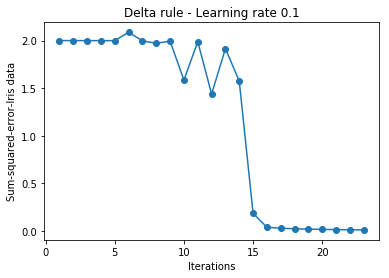

In [56]:
plt.plot(range(1, len(costs)+1), costs, marker='o')
plt.xlabel('Iterations')
plt.ylabel('Sum-squared-error-Iris data')
plt.title('Delta rule - Learning rate 0.1')
plt.show()

In [72]:
g1 = [[X[0][i] for i in range(50)],[X[1][j] for j in range(50)]]
print(g1)
print(wts,bia)

[[5.1, 4.9, 4.7, 4.6, 5.0, 5.4, 4.6, 5.0, 4.4, 4.9, 5.4, 4.8, 4.8, 4.3, 5.8, 5.7, 5.4, 5.1, 5.7, 5.1, 5.4, 5.1, 4.6, 5.1, 4.8, 5.0, 5.0, 5.2, 5.2, 4.7, 4.8, 5.4, 5.2, 5.5, 4.9, 5.0, 5.5, 4.9, 4.4, 5.1, 5.0, 4.5, 4.4, 5.0, 5.1, 4.8, 5.1, 4.6, 5.3, 5.0], [1.4, 1.4, 1.3, 1.5, 1.4, 1.7, 1.4, 1.5, 1.4, 1.5, 1.5, 1.6, 1.4, 1.1, 1.2, 1.5, 1.3, 1.4, 1.7, 1.5, 1.7, 1.5, 1.0, 1.7, 1.9, 1.6, 1.6, 1.5, 1.4, 1.6, 1.6, 1.5, 1.5, 1.4, 1.5, 1.2, 1.3, 1.5, 1.3, 1.5, 1.3, 1.3, 1.3, 1.6, 1.9, 1.4, 1.6, 1.4, 1.5, 1.4]]
[-0.95255562  1.98583381] 0.26112666081327346


[[5.1, 4.9, 4.7, 4.6, 5.0, 5.4, 4.6, 5.0, 4.4, 4.9, 5.4, 4.8, 4.8, 4.3, 5.8, 5.7, 5.4, 5.1, 5.7, 5.1, 5.4, 5.1, 4.6, 5.1, 4.8, 5.0, 5.0, 5.2, 5.2, 4.7, 4.8, 5.4, 5.2, 5.5, 4.9, 5.0, 5.5, 4.9, 4.4, 5.1, 5.0, 4.5, 4.4, 5.0, 5.1, 4.8, 5.1, 4.6, 5.3, 5.0], [1.4, 1.4, 1.3, 1.5, 1.4, 1.7, 1.4, 1.5, 1.4, 1.5, 1.5, 1.6, 1.4, 1.1, 1.2, 1.5, 1.3, 1.4, 1.7, 1.5, 1.7, 1.5, 1.0, 1.7, 1.9, 1.6, 1.6, 1.5, 1.4, 1.6, 1.6, 1.5, 1.5, 1.4, 1.5, 1.2, 1.3, 1.5, 1.3, 1.5, 1.3, 1.3, 1.3, 1.6, 1.9, 1.4, 1.6, 1.4, 1.5, 1.4]] [[7.0, 6.4, 6.9, 5.5, 6.5, 5.7, 6.3, 4.9, 6.6, 5.2, 5.0, 5.9, 6.0, 6.1, 5.6, 6.7, 5.6, 5.8, 6.2, 5.6, 5.9, 6.1, 6.3, 6.1, 6.4, 6.6, 6.8, 6.7, 6.0, 5.7, 5.5, 5.5, 5.8, 6.0, 5.4, 6.0, 6.7, 6.3, 5.6, 5.5, 5.5, 6.1, 5.8, 5.0, 5.6, 5.7, 5.7, 6.2, 5.1, 5.7], [4.7, 4.5, 4.9, 4.0, 4.6, 4.5, 4.7, 3.3, 4.6, 3.9, 3.5, 4.2, 4.0, 4.7, 3.6, 4.4, 4.5, 4.1, 4.5, 3.9, 4.8, 4.0, 4.9, 4.7, 4.3, 4.4, 4.8, 5.0, 4.5, 3.5, 3.8, 3.7, 3.9, 5.1, 4.5, 4.5, 4.7, 4.4, 4.1, 4.0, 4.4, 4.6, 4.0, 3.3, 4.2, 4.2, 4.2, 4.3, 3

/home/srm/.local/lib/python3.5/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


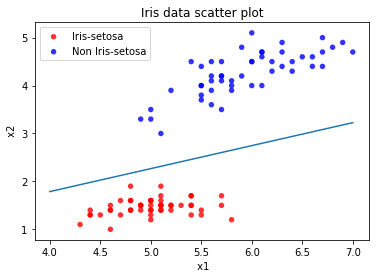

In [76]:
g1 = [[X[0][i] for i in range(50)],[X[1][j] for j in range(50)]]
g2 = [[X[0][i] for i in range(50,100)],[X[1][j] for j in range(50,100)]]
print(g1,g2)
datas = (g1,g2)
colors = ("red", "blue")
groups = ("Iris-setosa", "Non Iris-setosa") 
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, axisbg="1.0")
for data, color, group in zip(datas, colors, groups):
    x, y = data
    ax.scatter(x, y, alpha=0.8, c=color, edgecolors='none', s=30, label=group)
plt.title('Iris data scatter plot')
plt.xlabel(" x1")
plt.ylabel(" x2")
plt.legend(loc=2)
p1=(4,(-wts[0]*4-bia)/wts[1])
p2=(7,(-wts[0]*7-bia)/wts[1])
plt.plot([p1[0],p2[0]],[p1[1],p2[1]])
plt.show()

In [60]:
print(data)

[(5.1, 1.4), (4.9, 1.4), (4.7, 1.3), (4.6, 1.5), (5.0, 1.4), (5.4, 1.7), (4.6, 1.4), (5.0, 1.5), (4.4, 1.4), (4.9, 1.5), (5.4, 1.5), (4.8, 1.6), (4.8, 1.4), (4.3, 1.1), (5.8, 1.2), (5.7, 1.5), (5.4, 1.3), (5.1, 1.4), (5.7, 1.7), (5.1, 1.5), (5.4, 1.7), (5.1, 1.5), (4.6, 1.0), (5.1, 1.7), (4.8, 1.9), (5.0, 1.6), (5.0, 1.6), (5.2, 1.5), (5.2, 1.4), (4.7, 1.6), (4.8, 1.6), (5.4, 1.5), (5.2, 1.5), (5.5, 1.4), (4.9, 1.5), (5.0, 1.2), (5.5, 1.3), (4.9, 1.5), (4.4, 1.3), (5.1, 1.5), (5.0, 1.3), (4.5, 1.3), (4.4, 1.3), (5.0, 1.6), (5.1, 1.9), (4.8, 1.4), (5.1, 1.6), (4.6, 1.4), (5.3, 1.5), (5.0, 1.4)]


(array([0.9153127 , 1.01858542, 1.05470394, 0.91867783, 0.98394461,
       1.10719832, 0.93727946, 0.99090984, 0.77617956, 0.74446529,
       1.07233912, 1.15904142, 0.87828708, 0.88905058, 0.68278761,
       0.95828888, 0.85374452, 0.81473381, 1.08299527, 0.92133403,
       0.85355529, 0.85835662, 0.94207043, 1.00182633, 1.02299575,
       0.8772605 , 1.05805818, 0.89720637, 0.92014123, 0.87078898,
       0.90308693, 0.67896505, 0.73340045, 0.93997948, 0.7845712 ,
       1.07565828, 0.93393775, 0.72106738, 0.66007881, 1.11287081,
       1.11123023, 0.99461876, 1.00476734, 1.18322307, 0.87948869,
       0.61625558, 1.03032697, 0.96684116, 0.98504249, 0.64395766,
       1.08869129, 0.63116159, 1.16326342, 0.6858802 , 1.01801483,
       0.94372383, 1.16574426, 1.11733065, 1.17559701, 1.03934076]), array([0.60484254, 0.73270029, 0.34732647, 0.58829006, 0.22101232,
       0.50905413, 0.63785798, 0.43215071, 0.79087494, 0.00331391,
       0.15503062, 0.26616033, 0.66743993, 0.27964617, 0.31

/home/srm/.local/lib/python3.5/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


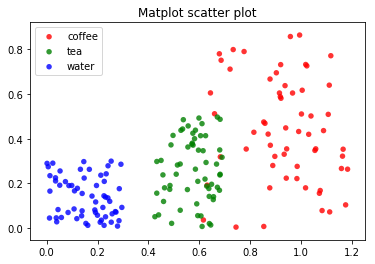

In [64]:
N = 60
g1 = (0.6 + 0.6 * np.random.rand(N), np.random.rand(N))
g2 = (0.4+0.3 * np.random.rand(N), 0.5*np.random.rand(N))
g3 = (0.3*np.random.rand(N),0.3*np.random.rand(N))
print(g1) 
data = (g1, g2, g3)
colors = ("red", "green", "blue")
groups = ("coffee", "tea", "water") 
 
# Create plot
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, axisbg="1.0")
 
for data, color, group in zip(data, colors, groups):
    x, y = data
    ax.scatter(x, y, alpha=0.8, c=color, edgecolors='none', s=30, label=group)
 
plt.title('Matplot scatter plot')
plt.legend(loc=2)
plt.show()

In [1]:
# each pattern has values for inputs and corresponding desired output
patterns = np.array([(0,0,1),(0,1,1),(1,0,-1),(1,1,1)]) 
m = patterns.shape[0] # number of patterns
ni = patterns.shape[1] -1 # ni is number of inputs assuming one output node
X=patterns[:,:ni].T # input matrix with each column representing an input vector
desiredOutputs =patterns[:,ni] # one desired output for each input vector
currentWeights = np.zeros(ni)  # weight vector initialized to zeros

In [2]:
def logistic(sp) :
    return 1.0/(1 + np.exp(-sp))

In [40]:
%matplotlib inline
import matplotlib.pyplot as plt
from mlxtend.plotting import plot_decision_regions

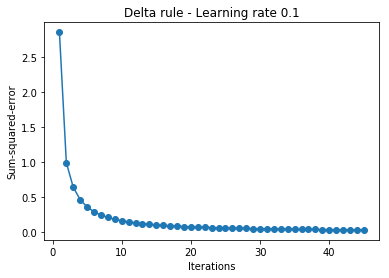

In [41]:
plt.plot(range(1, len(costs)+1), costs, marker='o')
plt.xlabel('Iterations')
plt.ylabel('Sum-squared-error')
plt.title('Delta rule - Learning rate 0.1')
plt.show()

In [44]:
import pandas as pd
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data', header=None)

# setosa and versicolor
y = df.iloc[0:100, 4].values
y = np.where(y == 'Iris-setosa', -1, 1)

# sepal length and petal length
X = df.iloc[0:100, [0,2]].values
print(X,y)

[[5.1 1.4]
 [4.9 1.4]
 [4.7 1.3]
 [4.6 1.5]
 [5.  1.4]
 [5.4 1.7]
 [4.6 1.4]
 [5.  1.5]
 [4.4 1.4]
 [4.9 1.5]
 [5.4 1.5]
 [4.8 1.6]
 [4.8 1.4]
 [4.3 1.1]
 [5.8 1.2]
 [5.7 1.5]
 [5.4 1.3]
 [5.1 1.4]
 [5.7 1.7]
 [5.1 1.5]
 [5.4 1.7]
 [5.1 1.5]
 [4.6 1. ]
 [5.1 1.7]
 [4.8 1.9]
 [5.  1.6]
 [5.  1.6]
 [5.2 1.5]
 [5.2 1.4]
 [4.7 1.6]
 [4.8 1.6]
 [5.4 1.5]
 [5.2 1.5]
 [5.5 1.4]
 [4.9 1.5]
 [5.  1.2]
 [5.5 1.3]
 [4.9 1.5]
 [4.4 1.3]
 [5.1 1.5]
 [5.  1.3]
 [4.5 1.3]
 [4.4 1.3]
 [5.  1.6]
 [5.1 1.9]
 [4.8 1.4]
 [5.1 1.6]
 [4.6 1.4]
 [5.3 1.5]
 [5.  1.4]
 [7.  4.7]
 [6.4 4.5]
 [6.9 4.9]
 [5.5 4. ]
 [6.5 4.6]
 [5.7 4.5]
 [6.3 4.7]
 [4.9 3.3]
 [6.6 4.6]
 [5.2 3.9]
 [5.  3.5]
 [5.9 4.2]
 [6.  4. ]
 [6.1 4.7]
 [5.6 3.6]
 [6.7 4.4]
 [5.6 4.5]
 [5.8 4.1]
 [6.2 4.5]
 [5.6 3.9]
 [5.9 4.8]
 [6.1 4. ]
 [6.3 4.9]
 [6.1 4.7]
 [6.4 4.3]
 [6.6 4.4]
 [6.8 4.8]
 [6.7 5. ]
 [6.  4.5]
 [5.7 3.5]
 [5.5 3.8]
 [5.5 3.7]
 [5.8 3.9]
 [6.  5.1]
 [5.4 4.5]
 [6.  4.5]
 [6.7 4.7]
 [6.3 4.4]
 [5.6 4.1]
 [5.5 4. ]
 [5.5 4.4]

In [14]:
!pip install mlxtend

    100% |████████████████████████████████| 1.3MB 433kB/s ta 0:00:01


In [16]:
import numpy as np

class AdalineGD(object):

    def __init__(self, eta=0.01, epochs=50):
        self.eta = eta
        self.epochs = epochs

    def train(self, X, y):

        self.w_ = np.zeros(1 + X.shape[1])
        self.cost_ = []

        for i in range(self.epochs):
            output = self.net_input(X)
            errors = (y - output)
            self.w_[1:] += self.eta * X.T.dot(errors)
            self.w_[0] += self.eta * errors.sum()
            cost = (errors**2).sum() / 2.0
            self.cost_.append(cost)
        return self

    def net_input(self, X):
        return np.dot(X, self.w_[1:]) + self.w_[0]

    def activation(self, X):
        return self.net_input(X)

    def predict(self, X):
        return np.where(self.activation(X) >= 0.0, 1, -1)

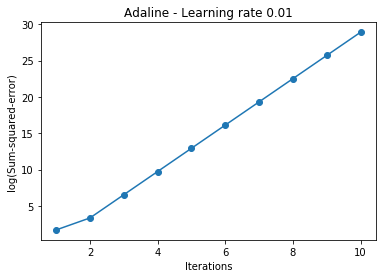

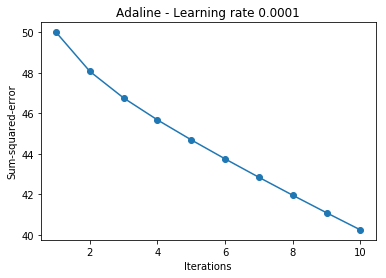

In [17]:
ada = AdalineGD(epochs=10, eta=0.01).train(X, y)
plt.plot(range(1, len(ada.cost_)+1), np.log10(ada.cost_), marker='o')
plt.xlabel('Iterations')
plt.ylabel('log(Sum-squared-error)')
plt.title('Adaline - Learning rate 0.01')
plt.show()

ada = AdalineGD(epochs=10, eta=0.0001).train(X, y)
plt.plot(range(1, len(ada.cost_)+1), ada.cost_, marker='o')
plt.xlabel('Iterations')
plt.ylabel('Sum-squared-error')
plt.title('Adaline - Learning rate 0.0001')
plt.show()